# WQD7002 Data Science Research Project
## Predicting Fatality in Road Traffic Accidents With Machine Learning: A Period-Over-Period Comparison
#### Candidate: Lee Voon Hee (S2140816)
#### Supervisor: Professor Ts. Dr. Rafidah Md Noor

In [1]:
# Load libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Data collection

In [ ]:
# Read ACCIDENT csv file
df_acc0 = pd.read_csv("dft-road-casualty-statistics-accident-1979-2021.csv", low_memory=False)

# Check dimensions
print(df_acc0.shape) # 8,703,911 rows, 36 cols

df_acc0.head()

In [ ]:
# Retain rows for year 1992 to 2021
# Delete rows for year 1979 to 1991
df_acc1 = df_acc0[df_acc0.accident_year > 1991]

# Check dimensions
print(df_acc1.shape) # 5,462,975 rows, 36 cols

df_acc1.head()

In [ ]:
# Save dataset
df_acc1.to_csv("df_acc1.csv", index=False, header=True)

In [ ]:
pd.set_option('display.max_columns', None)
df_acc1.tail()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
5462970,2021991196247,2021,991196247,325546.0,674548.0,-3.194076,55.958152,99,3,2,1,22/09/2021,4,09:05,-1,S12000036,S12000036,6,0,6,20.0,3,4,6,0,0,0,1,1,1,0,0,1,1,-1,-1
5462971,2021991196607,2021,991196607,271195.0,558271.0,-4.010304,54.902512,99,3,2,2,11/09/2021,7,21:15,-1,S12000006,S12000006,3,711,6,60.0,0,-1,0,-1,0,0,6,1,1,0,0,2,1,-1,-1
5462972,2021991197944,2021,991197944,357297.0,860768.0,-2.716825,57.634805,99,3,1,1,17/04/2021,7,14:30,-1,S12000034,S12000034,4,9022,6,60.0,9,3,6,0,0,0,1,1,1,0,0,2,1,-1,-1
5462973,2021991200639,2021,991200639,326936.0,675925.0,-3.172192,55.970735,99,3,1,1,17/09/2021,6,17:00,-1,S12000036,S12000036,3,901,9,20.0,3,2,3,901,0,5,1,9,1,0,0,1,2,-1,-1
5462974,2021991201030,2021,991201030,270574.0,556367.0,-4.019126,54.885252,99,3,2,1,15/10/2021,6,16:15,-1,S12000006,S12000006,3,711,6,60.0,0,-1,0,-1,0,0,1,1,1,4,0,2,1,-1,-1


In [ ]:
# Check number of missing values and data type in each column
df_acc1.info(verbose=True, show_counts=True)

# Check the summary statistics for each column
#df_acc1.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5462975 entries, 0 to 5462974
Data columns (total 36 columns):
 #   Column                                       Non-Null Count    Dtype  
---  ------                                       --------------    -----  
 0   accident_index                               5462975 non-null  object 
 1   accident_year                                5462975 non-null  int64  
 2   accident_reference                           5462975 non-null  object 
 3   location_easting_osgr                        5457052 non-null  float64
 4   location_northing_osgr                       5457052 non-null  float64
 5   longitude                                    3816492 non-null  float64
 6   latitude                                     3816492 non-null  float64
 7   police_force                                 5462975 non-null  int64  
 8   accident_severity                            5462975 non-null  int64  
 9   number_of_vehicles                           5

In [ ]:
# Check number of missing values in each column
df_acc1.isna().sum()

# Check percentage of missing values in each column
#pct_missing = df_acc1.isna().sum() / len(df_acc1) * 100
#print(round(pct_missing),2)

accident_index                                       0
accident_year                                        0
accident_reference                                   0
location_easting_osgr                             5923
location_northing_osgr                            5923
longitude                                      1646483
latitude                                       1646483
police_force                                         0
accident_severity                                    0
number_of_vehicles                                   0
number_of_casualties                                 0
date                                                 3
day_of_week                                          0
time                                                 3
local_authority_district                             0
local_authority_ons_district                         0
local_authority_highway                              0
first_road_class                                     0
first_road

In [ ]:
# Number of unique values / categorical levels in each column
df_acc1[df_acc1.columns].nunique()

accident_index                                 5462975
accident_year                                       30
accident_reference                             3938836
location_easting_osgr                           346505
location_northing_osgr                          432099
longitude                                      2174754
latitude                                       1968460
police_force                                        52
accident_severity                                    3
number_of_vehicles                                  46
number_of_casualties                                72
date                                             10958
day_of_week                                          7
time                                              1440
local_authority_district                           531
local_authority_ons_district                       384
local_authority_highway                            208
first_road_class                                     6
first_road

In [ ]:
# Read VEHICLE csv file

df_veh0 = pd.read_csv("dft-road-casualty-statistics-vehicle-1979-2021.csv", low_memory=False)

# Check dimensions
print(df_veh0.shape) # 15,532,272 rows, 28 cols

df_veh0.head()

In [ ]:
# Retain rows for year 1992 to 2021
# Delete rows for year 1979 to 1991
df_veh1 = df_veh0[df_veh0.accident_year > 1991]

# Check dimensions
print(df_veh1.shape) # 9,980,389 rows, 28 cols

df_veh1.head()

In [ ]:
# Save dataset
df_veh1.to_csv("df_veh1.csv", index=False, header=True)

In [ ]:
pd.set_option('display.max_columns', None)
df_veh1.tail()

,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type,lsoa_of_driver
9980384,2021991196607,2021,991196607,2,9,0,18,1,5,0,0,1,0,1,11,3,1,6,1,61,9,-1,-1,-1,-1,9,2,-1
9980385,2021991197944,2021,991197944,1,9,0,18,3,7,0,2,2,0,0,0,0,1,5,2,51,8,-1,-1,-1,-1,5,3,-1
9980386,2021991200639,2021,991200639,1,9,0,18,4,8,0,8,0,0,0,0,1,1,6,2,24,5,-1,-1,-1,-1,4,1,-1
9980387,2021991201030,2021,991201030,1,9,0,18,2,6,0,0,1,2,0,0,1,1,6,1,28,6,-1,-1,-1,-1,5,2,-1
9980388,2021991201030,2021,991201030,2,17,5,18,2,6,0,0,0,0,0,0,2,1,1,1,58,9,-1,-1,-1,-1,5,3,-1


In [ ]:
# Check number of missing values and data type in each column
df_veh1.info(verbose=True, show_counts=True)

# Check the summary statistics for each column
#df_veh1.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9980389 entries, 0 to 9980388
Data columns (total 28 columns):
 #   Column                            Non-Null Count    Dtype 
---  ------                            --------------    ----- 
 0   accident_index                    9980389 non-null  object
 1   accident_year                     9980389 non-null  int64 
 2   accident_reference                9980389 non-null  object
 3   vehicle_reference                 9980389 non-null  int64 
 4   vehicle_type                      9980389 non-null  int64 
 5   towing_and_articulation           9980389 non-null  int64 
 6   vehicle_manoeuvre                 9980389 non-null  int64 
 7   vehicle_direction_from            9980389 non-null  int64 
 8   vehicle_direction_to              9980389 non-null  int64 
 9   vehicle_location_restricted_lane  9980389 non-null  int64 
 10  junction_location                 9980389 non-null  int64 
 11  skidding_and_overturning          9980389 non-null

In [ ]:
# Check number of missing values in each column
#df_veh1.isna().sum()

# Check percentage of missing values in each column
#pct_missing = df_veh1.isna().sum() / len(df_veh1) * 100
#print(round(pct_missing),2)

In [ ]:
# Number of unique values / categorical levels in each column
df_veh1[df_veh1.columns].nunique()

accident_index                      5462975
accident_year                            30
accident_reference                  3938845
vehicle_reference                       195
vehicle_type                             30
towing_and_articulation                   8
vehicle_manoeuvre                        20
vehicle_direction_from                   11
vehicle_direction_to                     11
vehicle_location_restricted_lane         13
junction_location                        11
skidding_and_overturning                  8
hit_object_in_carriageway                14
vehicle_leaving_carriageway              11
hit_object_off_carriageway               14
first_point_of_impact                     7
vehicle_left_hand_drive                   4
journey_purpose_of_driver                 8
sex_of_driver                             4
age_of_driver                           104
age_band_of_driver                       12
engine_capacity_cc                     4820
propulsion_code                 

## Data pre-processing

### Data pre-processing - Column deletion

In [ ]:
# Read csv file
df_acc1 = pd.read_csv("df_acc1.csv", low_memory=False)

df_acc2 = df_acc1.copy()

# Delete irrelevant columns
df_acc2.drop(["accident_reference","first_road_number","second_road_number"],
             inplace=True, axis=1)

# Delete redundant columns
df_acc2.drop(["trunk_road_flag"],
             inplace=True, axis=1)

# Delete location of accident (confounding variables), "lsoa_of_accident_location" has 35601 categories
df_acc2.drop(["police_force","local_authority_district","local_authority_ons_district","local_authority_highway",
              "lsoa_of_accident_location"], inplace=True, axis=1)

# Delete longitude, latitude, location_easting_osgr,location_northing_osgr
df_acc2.drop(["longitude","latitude","location_easting_osgr","location_northing_osgr"],
             inplace=True, axis=1)

# Delete outcomes of accident
df_acc2.drop(["number_of_casualties","did_police_officer_attend_scene_of_accident"],
             inplace=True, axis=1)

# Check dimensions
print(df_acc2.shape) # 5,462,975 rows, 21 cols (=36-15)

#df_acc2.head()

(5462975, 21)


In [ ]:
# Save dataset
df_acc2.to_csv("df_acc2.csv", index=False, header=True)

In [ ]:
# Read csv file
df_veh1 = pd.read_csv("df_veh1.csv", low_memory=False)

df_veh2 = df_veh1.copy()

# Delete irrelevant columns
df_veh2.drop(["accident_reference","vehicle_reference","vehicle_direction_from","vehicle_direction_to"],
             inplace=True, axis=1)

# Delete redundant columns
df_veh2.drop(["age_of_driver"],
             inplace=True, axis=1)

# Delete home location of driver, "lsoa_of_driver" has 35612 categories
df_veh2.drop(["lsoa_of_driver"],
             inplace=True, axis=1)

# Check dimensions
print(df_veh2.shape) # 9,980,389 rows, 22 cols (=28-6)

#df_veh2.head()

(9980389, 22)


In [ ]:
# Save dataset
df_veh2.to_csv("df_veh2.csv", index=False, header=True)

### Data pre-processing - Data integration

In [ ]:
# Data integration
#df_veh2 = pd.read_csv("df_veh2.csv", low_memory=False)
#df_acc2 = pd.read_csv("df_acc2.csv", low_memory=False)

# Join vehicle dataset with accident dataset using outer merge
df_vehacc2 = pd.merge(df_veh2, df_acc2, how="outer", on=["accident_index","accident_year"])

In [ ]:
# Check dimensions
print(df_vehacc2.shape) # 9980389 rows, 41 cols (=21+22-2)

#df_vehacc2.head()

(9980389, 41)


In [ ]:
# Save dataset
df_vehacc2.to_csv("df_vehacc2.csv", index=False, header=True)

In [ ]:
df_vehacc2.tail()

,accident_index,accident_year,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,...,junction_control,second_road_class,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area
9980384,2021991196607,2021,9,0,18,0,0,1,0,1,...,-1,0,0,0,6,1,1,0,0,2
9980385,2021991197944,2021,9,0,18,0,2,2,0,0,...,3,6,0,0,1,1,1,0,0,2
9980386,2021991200639,2021,9,0,18,0,8,0,0,0,...,2,3,0,5,1,9,1,0,0,1
9980387,2021991201030,2021,9,0,18,0,0,1,2,0,...,-1,0,0,0,1,1,1,4,0,2
9980388,2021991201030,2021,17,5,18,0,0,0,0,0,...,-1,0,0,0,1,1,1,4,0,2


### Data pre-processing - Row deletion - Missing dates

In [ ]:
# Read csv file
#df_vehacc2 = pd.read_csv("df_vehacc2.csv", low_memory=False)

df_vehacc3 = df_vehacc2.copy()

In [ ]:
# Extract rows with missing date
df_vehacc3[df_vehacc3['date'].isna()]

,accident_index,accident_year,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,...,junction_control,second_road_class,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area
364518,19925592C0236,1992,109,0,18,0,-1,0,0,0,...,4,6,0,0,1,1,1,0,0,-1
364519,19925592C0236,1992,109,0,9,0,-1,1,0,0,...,4,6,0,0,1,1,1,0,0,-1
366251,19925592E0203,1992,109,0,14,0,-1,0,0,0,...,4,6,0,0,4,1,1,0,0,-1
366252,19925592E0203,1992,109,0,5,0,-1,0,0,0,...,4,6,0,0,4,1,1,0,0,-1
2491713,1997610054197,1997,109,0,4,0,-1,0,0,0,...,-1,-1,0,0,7,8,2,0,0,1
2491714,1997610054197,1997,109,0,4,0,-1,0,0,0,...,-1,-1,0,0,7,8,2,0,0,1


In [ ]:
# Since there are only 6 rows of data with missing date and time, with slight severity(3) and not fatal(1), delete them
df_vehacc3 = df_vehacc3[df_vehacc3['date'].notna()]

# Check dimensions
print(df_vehacc3.shape) # 9980383 rows, 41 cols

(9980383, 41)


In [ ]:
# Save dataset
df_vehacc3.to_csv("df_vehacc3.csv", index=False, header=True)

### Data pre-processing - Deletion of highly concentrated columns

In [ ]:
# Read csv file
#df_vehacc3 = pd.read_csv("df_vehacc3.csv", low_memory=False)

df_vehacc4 = df_vehacc3.copy()

In [ ]:
# Delete highly concentrated columns
df_vehacc4.drop(["pedestrian_crossing_human_control","pedestrian_crossing_physical_facilities","special_conditions_at_site",
                 "carriageway_hazards"],
                inplace=True, axis=1)

In [ ]:
# Check dimensions
print(df_vehacc4.shape) # 9980383 rows, 37 cols (=41-4)

#df_vehacc4.head()

(9980383, 37)


In [ ]:
# Save dataset
df_vehacc4.to_csv("df_vehacc4.csv", index=False, header=True)

### Data pre-processing - Column binning

In [ ]:
# Read csv file
df_vehacc4 = pd.read_csv("df_vehacc4.csv", low_memory=False)

df_vehacc5 = df_vehacc4.copy()

In [ ]:
# Convert datatype of "date" and "time" from string to datetime
df_vehacc5["date"] = pd.to_datetime(df_vehacc5["date"], dayfirst=True)
df_vehacc5["time"] = pd.to_datetime(df_vehacc5["time"], format='%H:%M')

# Create "accident_month" column
df_vehacc5['accident_month'] = df_vehacc5['date'].dt.month

# Create "accident_hour" column
df_vehacc5['accident_hour'] = df_vehacc5['time'].dt.hour

In [ ]:
# Binning of "accident_hour"
accident_hour_map = {
0:'0:00-1:59',1:'0:00-1:59',
2:'2:00-3:59',3:'2:00-3:59',
4:'4:00-5:59',5:'4:00-5:59',
6:'6:00-7:59',7:'6:00-7:59',
8:'8:00-9:59',9:'8:00-9:59',
10:'10:00-11:59',11:'10:00-11:59',
12:'12:00-13:59',13:'12:00-13:59',
14:'14:00-15:59',15:'14:00-15:59',
16:'16:00-17:59',17:'16:00-17:59',
18:'18:00-19:59',19:'18:00-19:59',
20:'20:00-21:59',21:'20:00-21:59',
22:'22:00-23:59',23:'22:00-23:59'
}

df_vehacc5["accident_hour_binned"] = df_vehacc5['accident_hour'].map(accident_hour_map)

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 40 cols

#df_vehacc5.head()

(9980383, 40)


In [ ]:
# Binning of "day_of_week"
day_of_week_map = {
1:'Sun',
2:'Mon',
3:'Tue',
4:'Wed',
5:'Thu',
6:'Fri',
7:'Sat'
}

df_vehacc5["day_of_week_binned"] = df_vehacc5['day_of_week'].map(day_of_week_map)

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 41 cols

#df_vehacc5.head()

(9980383, 41)


In [ ]:
# Check the summary statistics for number_of_vehicles column
df_vehacc5.number_of_vehicles.describe()

count    9.980383e+06
mean     2.118320e+00
std      1.369120e+00
min      1.000000e+00
25%      2.000000e+00
50%      2.000000e+00
75%      2.000000e+00
max      1.920000e+02
Name: number_of_vehicles, dtype: float64

array([[<AxesSubplot:title={'center':'number_of_vehicles'}>]],
      dtype=object)

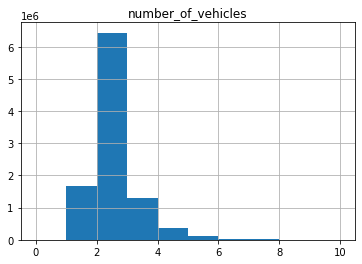

In [ ]:
# Histogram for number_of_vehicles column
df_vehacc5.hist(column='number_of_vehicles',range=[0,10])

In [ ]:
# Binning of "number_of_vehicles"
bins = [0,1,2,3,4,200]
labels = ['1','2','3','4','5 and above']
df_vehacc5["number_of_vehicles_binned"] = pd.cut(df_vehacc5['number_of_vehicles'], bins=bins, labels=labels,
                                                 include_lowest=True, right=True)

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 42 cols

#df_vehacc5.head()

(9980383, 42)


In [ ]:
# Binning of "first_road_class"
first_road_class_map = {
1:'Motorway or A(M)',
2:'Motorway or A(M)',
3:'A',
4:'B',
5:'C',
6:'Unknown'
}

df_vehacc5["first_road_class_binned"] = df_vehacc5['first_road_class'].map(first_road_class_map)

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 43 cols

#df_vehacc5.head()

(9980383, 43)


In [ ]:
# Binning of "road_type"
road_type_map = {
1:'Roundabout',
2:'One-way street / Slip road',7:'One-way street / Slip road',12:'One-way street / Slip road',
3:'Dual carriageway',
6:'Single carriageway',
9:'Unknown',-1:'Unknown'
}

df_vehacc5["road_type_binned"] = df_vehacc5['road_type'].map(road_type_map)

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 44 cols

#df_vehacc5.head()

(9980383, 44)


In [ ]:
# Check the summary statistics for number_of_vehicles column
df_vehacc5.speed_limit.describe()

count    9.980318e+06
mean     3.951758e+01
std      1.450120e+01
min     -1.000000e+00
25%      3.000000e+01
50%      3.000000e+01
75%      5.000000e+01
max      9.900000e+01
Name: speed_limit, dtype: float64

array([[<AxesSubplot:title={'center':'speed_limit'}>]], dtype=object)

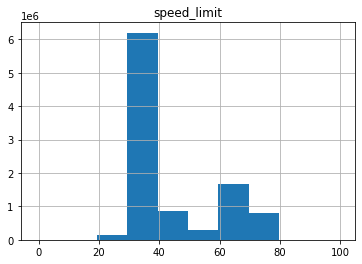

In [ ]:
# Histogram for number_of_vehicles column
df_vehacc5.hist(column='speed_limit',range=[-1,100])

In [ ]:
# Binning of "speed_limit"
bins = [-1,15,25,35,45,55,65,75,100]
labels = ['Unknown','20','30','40','50','60','70','Unknown']
df_vehacc5["speed_limit_binned"] = pd.cut(df_vehacc5['speed_limit'], bins=bins, labels=labels,
                                                 include_lowest=True, right=False, ordered=False)

# Impute missing values as "Unknown"
df_vehacc5["speed_limit_binned"] = df_vehacc5["speed_limit_binned"].fillna("Unknown")

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 45 cols

#df_vehacc5.head()

(9980383, 45)


In [ ]:
# Binning of "junction_detail"
junction_detail_map = {
0:"Not at junction or within 20m",
1:"Roundabout",2:"Roundabout",
3:"T or staggered junction",
5:"Slip road",
6:"Crossroads",
7:"More than 4 arms (not roundabout)",
8:"Private drive or entrance",
9:"Unknown",99:"Unknown",-1:"Unknown"
}

df_vehacc5["junction_detail_binned"] = df_vehacc5['junction_detail'].map(junction_detail_map)

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 46 cols

#df_vehacc5.head()

(9980383, 46)


In [ ]:
# Binning of "junction_control"
junction_control_map = {
0:"Not at junction or within 20m",
2:"Auto traffic signal",
4:"Give way or uncontrolled",
1:"Others / Unknown",
3:"Others / Unknown",
9:"Others / Unknown",-1:"Others / Unknown"
}

df_vehacc5["junction_control_binned"] = df_vehacc5['junction_control'].map(junction_control_map)

# Rectify contradictions between junction_detail and junction_control
df_vehacc5.loc[df_vehacc5["junction_detail"]==0,"junction_control_binned"]="Not at junction or within 20m"
df_vehacc5.loc[df_vehacc5["junction_detail"]==9,"junction_control_binned"] = "Others / Unknown"
df_vehacc5.loc[df_vehacc5["junction_detail"]==99,"junction_control_binned"] = "Others / Unknown"
df_vehacc5.loc[df_vehacc5["junction_detail"]==-1,"junction_control_binned"] = "Others / Unknown"

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 47 cols

#df_vehacc5.head()

(9980383, 47)


In [ ]:
# Binning of "second_road_class"
second_road_class_map = {
0:'Not at junction or within 20m',
1:'Motorway or A(M)',
2:'Motorway or A(M)',
3:'A',
4:'B',
5:'C',
6:'Unknown',-1:'Unknown'
}

df_vehacc5["second_road_class_binned"] = df_vehacc5['second_road_class'].map(second_road_class_map)

# Rectify contradictions between junction_detail and second_road_class
df_vehacc5.loc[df_vehacc5["junction_detail"]==0,"second_road_class_binned"]="Not at junction or within 20m"
df_vehacc5.loc[df_vehacc5["junction_detail"]==9,"second_road_class_binned"] = "Unknown"
df_vehacc5.loc[df_vehacc5["junction_detail"]==99,"second_road_class_binned"] = "Unknown"
df_vehacc5.loc[df_vehacc5["junction_detail"]==-1,"second_road_class_binned"] = "Unknown"

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 48 cols

#df_vehacc5.head()

(9980383, 48)


In [ ]:
# Binning of "light_conditions"
light_conditions_map = {
1:'Daylight',
4:'Darkness - lights lit',
5:'Darkness - lights unlit',
6:'Darkness - no lighting',
7:'Unknown',-1:'Unknown'
}

df_vehacc5["light_conditions_binned"] = df_vehacc5['light_conditions'].map(light_conditions_map)

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 49 cols

#df_vehacc5.head()

(9980383, 49)


In [ ]:
# Binning of "weather_conditions"
weather_conditions_map = {
1:"Fine no high winds",
2:"Raining no high winds",
3:"Snowing no high winds",
4:"High winds",5:"High winds",6:"High winds",
7:"Fog or mist",
-1:"Unknown",9:"Unknown",8:"Unknown"
}

df_vehacc5["weather_conditions_binned"] = df_vehacc5['weather_conditions'].map(weather_conditions_map)

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 50 cols

#df_vehacc5.head()

(9980383, 50)


In [ ]:
# Binning of "road_surface_conditions"
road_surface_conditions_map = {
1:"Dry",
2:"Wet or damp",
3:"Snow",
4:"Frost or ice",
5:"Others / Unknown",
6:"Others / Unknown",
7:"Others / Unknown",
-1:"Others / Unknown",9:"Others / Unknown"
}

df_vehacc5["road_surface_conditions_binned"] = df_vehacc5['road_surface_conditions'].map(road_surface_conditions_map)

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 51 cols

#df_vehacc5.head()

(9980383, 51)


In [ ]:
# Binning of "urban_or_rural_area"
urban_or_rural_area_map = {
1:"Urban",
2:"Rural",
3:"Unknown",-1:"Unknown"
}

df_vehacc5["urban_or_rural_area_binned"] = df_vehacc5['urban_or_rural_area'].map(urban_or_rural_area_map)

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 52 cols

#df_vehacc5.head()

(9980383, 52)


In [ ]:
# Create "accident_fatality" label from "accident_severity"
# If accident_severity = 1 (Fatal), then accident_fatality = 1 (yes)
# If accident_severity = 2 (Serious), then accident_fatality = 0 (no)
# If accident_severity = 3 (Slight), then accident_fatality = 0 (no)
df_vehacc5["accident_fatality"] = np.where(df_vehacc5["accident_severity"]==1, 1, 0)

# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 53 cols

#df_vehacc5.head()

(9980383, 53)


### Data pre-processing - Deletion of unbinned columns

In [ ]:
# Delete unbinned/numeric columns
df_vehacc5.drop(["date","time","accident_hour","day_of_week","number_of_vehicles","first_road_class","road_type","speed_limit",
                 "junction_detail","junction_control","second_road_class","light_conditions","weather_conditions",
                 "road_surface_conditions","urban_or_rural_area","accident_severity"],
                inplace=True, axis=1)

# Delete irrelevant columns
df_vehacc5.drop(["accident_index"],inplace=True, axis=1)

In [ ]:
# Check dimensions
print(df_vehacc5.shape) # 9980383 rows, 36 cols (=53-17)

#df_vehacc5.head()

(9980383, 36)


In [ ]:
# Save dataset
df_vehacc5.to_csv("df_vehacc5.csv", index=False, header=True)

### Data pre-processing - Deletion of columns

In [ ]:
# Read csv file
#df_vehacc5 = pd.read_csv("df_vehacc5.csv", low_memory=False)

df_vehacc6 = df_vehacc5.copy()

In [ ]:
# Delete highly concentrated columns
df_vehacc6.drop(["towing_and_articulation","vehicle_location_restricted_lane","hit_object_in_carriageway",
                 "hit_object_off_carriageway","vehicle_left_hand_drive","journey_purpose_of_driver"],
                inplace=True, axis=1)

# Delete column with many unknowns (introduced in 2020/2016)
df_vehacc6.drop(["generic_make_model","driver_imd_decile"],
                inplace=True, axis=1)

In [ ]:
# Check dimensions
print(df_vehacc6.shape) # 9980383 rows, 28 cols (=36-8)

#df_vehacc6.head()

(9980383, 28)


In [ ]:
# Save dataset
df_vehacc6.to_csv("df_vehacc6.csv", index=False, header=True)

### Data pre-processing - Column binning

In [ ]:
# Read csv file
#df_vehacc6 = pd.read_csv("df_vehacc6.csv", low_memory=False)

df_vehacc7 = df_vehacc6.copy()

In [ ]:
# Binning of "vehicle_type"
vehicle_type_map = {
1:'Pedal cycle',
2:'Motorcycle',3:'Motorcycle',4:'Motorcycle',5:'Motorcycle',
97:'Motorcycle',103:'Motorcycle',104:'Motorcycle',105:'Motorcycle',106:'Motorcycle',
8:'Taxi',108:'Taxi',
9:'Car',109:'Car',
10:'Bus',110:'Bus',11:'Bus',
19:'Van',
20:'Goods vehicle',21:'Goods vehicle',98:'Goods vehicle',113:'Goods vehicle',
16:'Others / Unknown',17:'Others / Unknown',18:'Others / Unknown',22:'Others / Unknown',23:'Others / Unknown',
90:'Others / Unknown',99:'Others / Unknown',-1:'Others / Unknown'
}

df_vehacc7["vehicle_type_binned"] = df_vehacc7['vehicle_type'].map(vehicle_type_map)

# Check dimensions
print(df_vehacc7.shape) # 9980383 rows, 29 cols

#df_vehacc7.head()

(9980383, 29)


In [ ]:
# Binning of "vehicle_manoeuvre"
vehicle_manoeuvre_map = {
1:'Reversing',
2:'Parked',
3:'Waiting to go - held up',
4:'Slowing or stopping',
5:'Moving off',
6:'U-turn',
7:'Turning left',
8:'Waiting to turn left',
9:'Turning right',
10:'Waiting to turn right',
11:'Changing lane to left',
12:'Changing lane to right',
13:'Overtaking moving vehicle - offside',
14:'Overtaking static vehicle - offside',
15:'Overtaking - nearside',
16:'Going ahead left-hand bend',
17:'Going ahead right-hand bend',
18:'Going ahead other',
99:'Unknown',-1:'Unknown'
}

df_vehacc7["vehicle_manoeuvre_binned"] = df_vehacc7['vehicle_manoeuvre'].map(vehicle_manoeuvre_map)

# Check dimensions
print(df_vehacc7.shape) # 9980383 rows, 30 cols

#df_vehacc7.head()

(9980383, 30)


In [ ]:
# Binning of "junction_location"
junction_location_map = {
0:'Not at junction or within 20m',
1:'Approaching junction or waiting/parked at junction approach',
2:'Cleared junction or waiting/parked at junction exit',
3:'Leaving roundabout',
4:'Entering roundabout',
5:'Leaving main road',
6:'Entering main road',
7:'Entering from slip road',
8:'Mid Junction - on roundabout or on main road',
9:'Unknown',-1:'Unknown'
}

df_vehacc7["junction_location_binned"] = df_vehacc7['junction_location'].map(junction_location_map)

# Rectify contradictions between junction_detail_binned and junction_location
df_vehacc7.loc[df_vehacc7["junction_detail_binned"]=="Not at junction or within 20m",
               "junction_location_binned"] = "Not at junction or within 20m"
df_vehacc7.loc[df_vehacc7["junction_detail_binned"]=="Unknown","junction_location_binned"]="Unknown"

# Check dimensions
print(df_vehacc7.shape) # 9980383 rows, 31 cols

#df_vehacc7.head()

(9980383, 31)


In [ ]:
# Binning of "skidding_and_overturning"
skidding_and_overturning_map = {
0:"None",
1:'Skidded',
2:'Skidded and overturned',
3:'Jackknifed',
4:'Jackknifed',
5:'Overturned',
9:'Unknown',-1:'Unknown'
}

df_vehacc7["skidding_and_overturning_binned"] = df_vehacc7['skidding_and_overturning'].map(skidding_and_overturning_map)

# Check dimensions
print(df_vehacc7.shape) # 9980383 rows, 32 cols

#df_vehacc7.head()

(9980383, 32)


In [ ]:
# Binning of "vehicle_leaving_carriageway"
vehicle_leaving_carriageway_map = {
0:"Did not leave carriageway",
1:'Nearside',2:'Nearside',
3:"Straight ahead at junction",
4:'Offside',5:'Offside',6:'Offside',7:'Offside',8:'Offside',
9:'Unknown',-1:'Unknown'
}

df_vehacc7["vehicle_leaving_carriageway_binned"] = df_vehacc7['vehicle_leaving_carriageway'].map(vehicle_leaving_carriageway_map)

# Check dimensions
print(df_vehacc7.shape) # 9980383 rows, 33 cols

#df_vehacc7.head()

(9980383, 33)


In [ ]:
# Binning of "first_point_of_impact"
first_point_of_impact_map = {
0:"Did not impact",
1:"Front",
2:"Back",
3:"Offside",
4:"Nearside",
9:"Unknown",-1:"Unknown"
}

df_vehacc7["first_point_of_impact_binned"] = df_vehacc7['first_point_of_impact'].map(first_point_of_impact_map)

# Check dimensions
print(df_vehacc7.shape) # 9980383 rows, 34 cols

#df_vehacc7.head()

(9980383, 34)


In [ ]:
# Binning of "sex_of_driver"
sex_of_driver_map = {
1:"Male",
2:"Female",
3:"Unknown",-1:"Unknown"
}

df_vehacc7["sex_of_driver_binned"] = df_vehacc7['sex_of_driver'].map(sex_of_driver_map)

# Check dimensions
print(df_vehacc7.shape) # 9980383 rows, 35 cols

#df_vehacc7.head()

(9980383, 35)


In [ ]:
# Binning of "age_band_of_driver"
age_band_of_driver_map = {
1:'<15',2:'<15',3:'<15',
4:'16-20',
5:'21-25',
6:'26-35',
7:'36-45',
8:'46-55',
9:'56-65',
10:'66-75',
11:'>75',
-1:'Unknown'
}

df_vehacc7["age_band_of_driver_binned"] = df_vehacc7['age_band_of_driver'].map(age_band_of_driver_map)

# Check dimensions
print(df_vehacc7.shape) # 9980383 rows, 36 cols

#df_vehacc7.head()

(9980383, 36)


In [ ]:
# Check the summary statistics for engine_capacity_cc column
df_vehacc7.engine_capacity_cc.describe()

count    9.980383e+06
mean     1.338693e+03
std      1.591855e+03
min     -1.000000e+00
25%     -1.000000e+00
50%      1.360000e+03
75%      1.796000e+03
max      9.999900e+04
Name: engine_capacity_cc, dtype: float64

array([[<AxesSubplot:title={'center':'engine_capacity_cc'}>]],
      dtype=object)

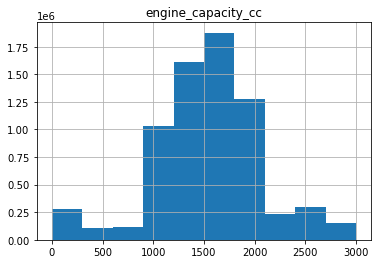

In [ ]:
# Histogram for engine_capacity_cc column
df_vehacc7.hist(column='engine_capacity_cc',range=[0,3000])

In [ ]:
# Binning of "engine_capacity_cc"
bins = [-1,0,500,1000,1500,2000,100000]
labels = ['Unknown','0-500','501-1000','1001-1500','1501-2000','>2000']
#bins = [-1,0,250,500,750,1000,1250,1500,1750,2000,100000]
#labels = ['Unknown','0-250','251-500','501-750','751-1000','1001-1250','1251-1500','1501-1750','1751-2000','>2000']
df_vehacc7["engine_capacity_cc_binned"] = pd.cut(df_vehacc7['engine_capacity_cc'], bins=bins, labels=labels,
                                                 include_lowest=True)

# Check dimensions
print(df_vehacc7.shape) # 9980383 rows, 37 cols

#df_vehacc7.head()

(9980383, 37)


In [ ]:
# Binning of "propulsion_code"
propulsion_code_map = {
1:"Petrol",
2:"Heavy oil",
3:"Others / Undefined",
4:"Others / Undefined",
5:"Others / Undefined",
6:"Others / Undefined",
7:"Others / Undefined",
8:"Others / Undefined",
9:"Others / Undefined",
10:"Others / Undefined",
11:"Others / Undefined",
12:"Others / Undefined",
-1:"Others / Undefined"
}

df_vehacc7["propulsion_code_binned"] = df_vehacc7['propulsion_code'].map(propulsion_code_map)

# Check dimensions
print(df_vehacc7.shape) # 9980383 rows, 38 cols

#df_vehacc7.head()

(9980383, 38)


In [ ]:
# Check the summary statistics for age_of_vehicle column
df_vehacc7.age_of_vehicle.describe()

count    9.980383e+06
mean     4.789551e+00
std      5.363684e+00
min     -1.000000e+00
25%     -1.000000e+00
50%      4.000000e+00
75%      9.000000e+00
max      1.110000e+02
Name: age_of_vehicle, dtype: float64

array([[<AxesSubplot:title={'center':'age_of_vehicle'}>]], dtype=object)

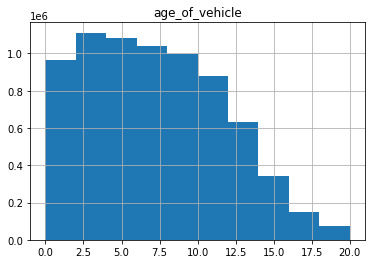

In [ ]:
# Histogram for age_of_vehicle column
df_vehacc7.hist(column='age_of_vehicle',range=[0,20])

In [ ]:
# Binning of "age_of_vehicle"
bins = [-1,0,2,4,6,8,10,12,14,120]
labels = ['Unknown','0-1','2-3','4-5','6-7','8-9','10-11','12-13','14 and above']
df_vehacc7["age_of_vehicle_binned"] = pd.cut(df_vehacc7['age_of_vehicle'], bins=bins, labels=labels,
                                             include_lowest=True, right=False)

# Check dimensions
print(df_vehacc7.shape) # 9980383 rows, 39 cols

#df_vehacc7.head()

(9980383, 39)


In [ ]:
# Binning of "driver_home_area_type"
driver_home_area_type_map = {
1:'Urban area',
2:'Small town',
3:'Rural',
-1:'Unknown'
}

df_vehacc7["driver_home_area_type_binned"] = df_vehacc7['driver_home_area_type'].map(driver_home_area_type_map)

# Check dimensions
print(df_vehacc7.shape) # 9980383 rows, 40 cols

#df_vehacc7.head()

(9980383, 40)


In [ ]:
# Delete unbinned columns
df_vehacc7.drop(["vehicle_type","vehicle_manoeuvre","junction_location","skidding_and_overturning",
                 "vehicle_leaving_carriageway","first_point_of_impact","sex_of_driver","age_band_of_driver",
                 "engine_capacity_cc","propulsion_code","age_of_vehicle","driver_home_area_type"],
                inplace=True, axis=1)

In [ ]:
# Check dimensions
print(df_vehacc7.shape) # 9980383 rows, 28 cols (=40-12)

#df_vehacc7.head()

(9980383, 28)


In [ ]:
# Save dataset
df_vehacc7.to_csv("df_vehacc7.csv", index=False, header=True)

In [ ]:
pd.set_option('display.max_columns', None)
df_vehacc7

,accident_year,accident_month,accident_hour_binned,day_of_week_binned,number_of_vehicles_binned,first_road_class_binned,road_type_binned,speed_limit_binned,junction_detail_binned,junction_control_binned,second_road_class_binned,light_conditions_binned,weather_conditions_binned,road_surface_conditions_binned,urban_or_rural_area_binned,accident_fatality,vehicle_type_binned,vehicle_manoeuvre_binned,junction_location_binned,skidding_and_overturning_binned,vehicle_leaving_carriageway_binned,first_point_of_impact_binned,sex_of_driver_binned,age_band_of_driver_binned,engine_capacity_cc_binned,propulsion_code_binned,age_of_vehicle_binned,driver_home_area_type_binned
0,1992,12,16:00-17:59,Fri,5 and above,Motorway or A(M),Dual carriageway,70,Not at junction or within 20m,Not at junction or within 20m,Not at junction or within 20m,Darkness - lights lit,Fine no high winds,Wet or damp,Unknown,0,Goods vehicle,Changing lane to right,Not at junction or within 20m,None,Did not leave carriageway,Did not impact,Unknown,Unknown,Unknown,Others / Undefined,Unknown,Unknown
1,1992,12,16:00-17:59,Fri,5 and above,Motorway or A(M),Dual carriageway,70,Not at junction or within 20m,Not at junction or within 20m,Not at junction or within 20m,Darkness - lights lit,Fine no high winds,Wet or damp,Unknown,0,Car,Going ahead other,Not at junction or within 20m,Skidded,Did not leave carriageway,Did not impact,Male,Unknown,Unknown,Others / Undefined,Unknown,Unknown
2,1992,12,16:00-17:59,Fri,5 and above,Motorway or A(M),Dual carriageway,70,Not at junction or within 20m,Not at junction or within 20m,Not at junction or within 20m,Darkness - lights lit,Fine no high winds,Wet or damp,Unknown,0,Car,Going ahead other,Not at junction or within 20m,None,Did not leave carriageway,Back,Male,56-65,Unknown,Others / Undefined,Unknown,Unknown
3,1992,12,16:00-17:59,Fri,5 and above,Motorway or A(M),Dual carriageway,70,Not at junction or within 20m,Not at junction or within 20m,Not at junction or within 20m,Darkness - lights lit,Fine no high winds,Wet or damp,Unknown,0,Car,Going ahead other,Not at junction or within 20m,Skidded,Did not leave carriageway,Front,Male,26-35,Unknown,Others / Undefined,Unknown,Unknown
4,1992,12,16:00-17:59,Fri,5 and above,Motorway or A(M),Dual carriageway,70,Not at junction or within 20m,Not at junction or within 20m,Not at junction or within 20m,Darkness - lights lit,Fine no high winds,Wet or damp,Unknown,0,Car,Going ahead other,Not at junction or within 20m,Skidded,Did not leave carriageway,Front,Male,26-35,Unknown,Others / Undefined,Unknown,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9980378,2021,9,20:00-21:59,Sat,2,A,Single carriageway,60,Not at junction or within 20m,Not at junction or within 20m,Not at junction or within 20m,Darkness - no lighting,Fine no high winds,Dry,Rural,0,Car,Going ahead other,Not at junction or within 20m,Skidded,Nearside,Offside,Male,56-65,Unknown,Others / Undefined,Unknown,Small town
9980379,2021,4,14:00-15:59,Sat,1,B,Single carriageway,60,Unknown,Others / Unknown,Unknown,Daylight,Fine no high winds,Dry,Rural,0,Car,Going ahead other,Unknown,Skidded and overturned,Did not leave carriageway,Did not impact,Female,46-55,Unknown,Others / Undefined,Unknown,Rural
9980380,2021,9,16:00-17:59,Fri,1,A,Unknown,20,T or staggered junction,Auto traffic signal,A,Daylight,Unknown,Dry,Urban,0,Car,Going ahead other,Mid Junction - on roundabout or on main road,None,Did not leave carriageway,Front,Female,21-25,Unknown,Others / Undefined,Unknown,Urban area
9980381,2021,10,16:00-17:59,Fri,2,A,Single carriageway,60,Not at junction or within 20m,Not at junction or within 20m,Not at junction or within 20m,Daylight,Fine no high winds,Dry,Rural,0,Car,Going ahead other,Not at junction or within 20m,Skidded,Did not leave carriageway,Front,Male,26-35,Unknown,Others / Undefined,Unknown,Small town


In [ ]:
# Check number of missing values and data type in each column
df_vehacc7.info(verbose=True, show_counts=True)

# Check the summary statistics for each column
#df_vehacc7.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9980383 entries, 0 to 9980382
Data columns (total 28 columns):
 #   Column                              Non-Null Count    Dtype   
---  ------                              --------------    -----   
 0   accident_year                       9980383 non-null  int64   
 1   accident_month                      9980383 non-null  int64   
 2   accident_hour_binned                9980383 non-null  object  
 3   day_of_week_binned                  9980383 non-null  object  
 4   number_of_vehicles_binned           9980383 non-null  category
 5   first_road_class_binned             9980383 non-null  object  
 6   road_type_binned                    9980383 non-null  object  
 7   speed_limit_binned                  9980383 non-null  category
 8   junction_detail_binned              9980383 non-null  object  
 9   junction_control_binned             9980383 non-null  object  
 10  second_road_class_binned            9980383 non-null  object  
 11

In [ ]:
# Check number of missing values in each column
df_vehacc7.isna().sum()

# Check percentage of missing values in each column
#pct_missing = df_vehacc7.isna().sum() / len(df_vehacc7) * 100
#print(round(pct_missing),2)

accident_year                         0
accident_month                        0
accident_hour_binned                  0
day_of_week_binned                    0
number_of_vehicles_binned             0
first_road_class_binned               0
road_type_binned                      0
speed_limit_binned                    0
junction_detail_binned                0
junction_control_binned               0
second_road_class_binned              0
light_conditions_binned               0
weather_conditions_binned             0
road_surface_conditions_binned        0
urban_or_rural_area_binned            0
accident_fatality                     0
vehicle_type_binned                   0
vehicle_manoeuvre_binned              0
junction_location_binned              0
skidding_and_overturning_binned       0
vehicle_leaving_carriageway_binned    0
first_point_of_impact_binned          0
sex_of_driver_binned                  0
age_band_of_driver_binned             0
engine_capacity_cc_binned             0


In [ ]:
# Number of unique values / categorical levels in each column
df_vehacc7[df_vehacc7.columns].nunique()

accident_year                         30
accident_month                        12
accident_hour_binned                  12
day_of_week_binned                     7
number_of_vehicles_binned              5
first_road_class_binned                5
road_type_binned                       5
speed_limit_binned                     7
junction_detail_binned                 8
junction_control_binned                4
second_road_class_binned               6
light_conditions_binned                5
weather_conditions_binned              6
road_surface_conditions_binned         5
urban_or_rural_area_binned             3
accident_fatality                      2
vehicle_type_binned                    8
vehicle_manoeuvre_binned              19
junction_location_binned              10
skidding_and_overturning_binned        6
vehicle_leaving_carriageway_binned     5
first_point_of_impact_binned           6
sex_of_driver_binned                   3
age_band_of_driver_binned             10
engine_capacity_

### Split dataset into 3 time periods

In [ ]:
# Split into 3 datasets
# A 1992 to 2001
# B 2002 to 2011
# C 2012 to 2021

# Retain rows for year 1992 to 2001
df_vehacc1A = df_vehacc7[(df_vehacc7.accident_year >= 1992) & (df_vehacc7.accident_year <= 2001)]

# Check dimensions
print(df_vehacc1A.shape) # 4249887 rows, 28 cols

#df_vehacc1A.head

(4249887, 28)


In [ ]:
# Save dataset
df_vehacc1A.to_csv("df_vehacc1A.csv", index=False, header=True)

In [ ]:
# Retain rows for year 2002 to 2011
df_vehacc1B = df_vehacc7[(df_vehacc7.accident_year >= 2002) & (df_vehacc7.accident_year <= 2011)]

# Check dimensions
print(df_vehacc1B.shape) # 3397300 rows, 28 cols

#df_vehacc1B.head

(3397300, 28)


In [ ]:
# Save dataset
df_vehacc1B.to_csv("df_vehacc1B.csv", index=False, header=True)

In [ ]:
# Retain rows for year 2012 to 2021
df_vehacc1C = df_vehacc7[(df_vehacc7.accident_year >= 2012) & (df_vehacc7.accident_year <= 2021)]

# Check dimensions
print(df_vehacc1C.shape) # 2333196 rows, 28 cols

#df_vehacc1C.head

(2333196, 28)


In [ ]:
# Save dataset
df_vehacc1C.to_csv("df_vehacc1C.csv", index=False, header=True)

## EDA

### EDA - Whole dataset

1992    416721
1993    411729
1994    422621
1995    414807
1996    427521
1997    438875
1998    437105
1999    430492
2000    429943
2001    420073
2002    408325
2003    392022
2004    379845
2005    366236
2006    348059
2007    334966
2008    311604
2009    298687
2010    281401
2011    276155
2012    265877
2013    252913
2014    268527
2015    257845
2016    252500
2017    238926
2018    226409
2019    216381
2020    167375
2021    186443
Name: accident_year, dtype: int64


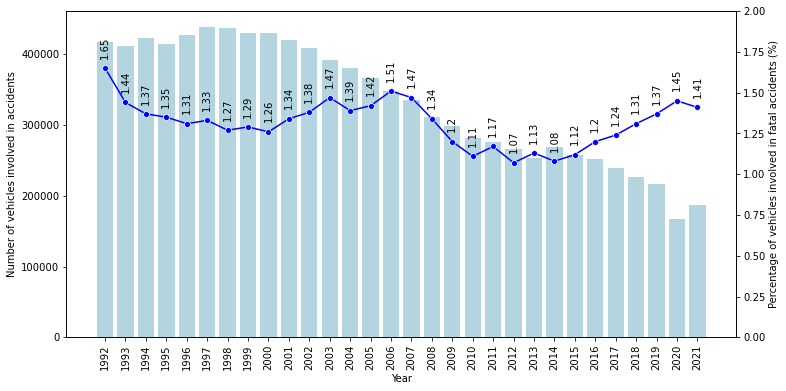

In [ ]:
# Number of vehicles involved in accidents vs. Year

x = 'accident_year'
chart1, ax1 = plt.subplots(figsize=(12,6))
ax1 = sns.countplot(x=x, data=df_vehacc7, color='lightblue')
ax1.set(xlabel='Year', ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90, horizontalalignment='center')
print(df_vehacc7['accident_year'].value_counts(sort=False))

x, y = 'accident_year', 'accident_fatality'
df1 = df_vehacc7.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df1 = df1.rename('fatality_percentage').reset_index()
df1 = df1[df1.accident_fatality == 1]
#print(df1)

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y='fatality_percentage', color='blue', marker='o')
ax2.set_ylim(0, 2)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
# add annotations
for line in range(df1.shape[0]):
    ax2.text(line, df1.fatality_percentage.iloc[line]+0.07, df1.fatality_percentage.iloc[line],
             horizontalalignment='center', rotation=90)

plt.show()

### EDA - Datasets A, B, C

In [ ]:
# Read csv file
df_vehacc1A = pd.read_csv("df_vehacc1A.csv", low_memory=False)
df_vehacc1B = pd.read_csv("df_vehacc1B.csv", low_memory=False)
df_vehacc1C = pd.read_csv("df_vehacc1C.csv", low_memory=False)

    accident_month  veh_count_1992-2001  veh_count_2002-2011  \
0                1               341158               269295   
1                2               310714               251042   
2                3               333567               269722   
3                4               327537               265902   
4                5               349457               288001   
5                6               349213               286849   
6                7               358742               293943   
7                8               354053               278975   
8                9               362372               293718   
9               10               388031               311033   
10              11               399033               311061   
11              12               376010               277759   

    veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0                186053                 4896                 3576   
1                170667      

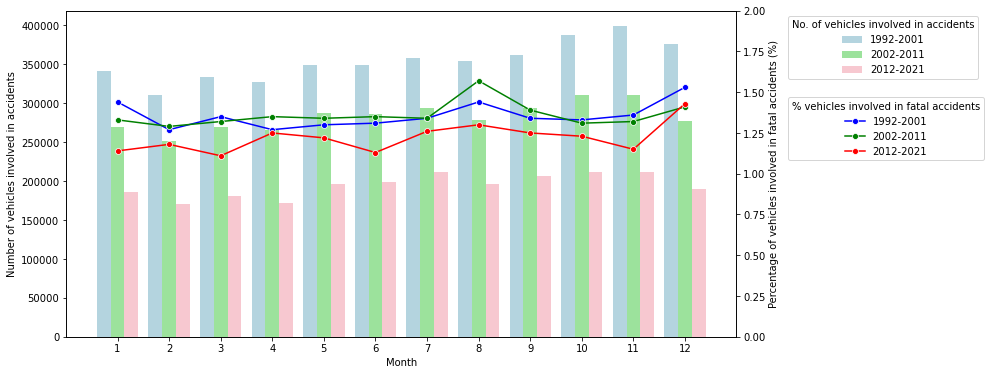

In [ ]:
x, y = 'accident_month', 'accident_fatality'
xlabel='Month'

df1 = df_vehacc1A.groupby(x)[y].count()
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count()
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count()
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
#df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
#df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
#df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
#df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
#df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
#df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart2, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0, 2)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

   accident_hour_binned  veh_count_1992-2001  veh_count_2002-2011  \
0             0:00-1:59                94726                80219   
1             2:00-3:59                50350                46857   
2             4:00-5:59                39643                38005   
3             6:00-7:59               232003               197182   
4             8:00-9:59               525701               422009   
5           10:00-11:59               432417               333577   
6           12:00-13:59               537189               421304   
7           14:00-15:59               571032               465578   
8           16:00-17:59               735174               592507   
9           18:00-19:59               521529               412957   
10          20:00-21:59               300958               230233   
11          22:00-23:59               209165               156872   

    veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0                 50614          

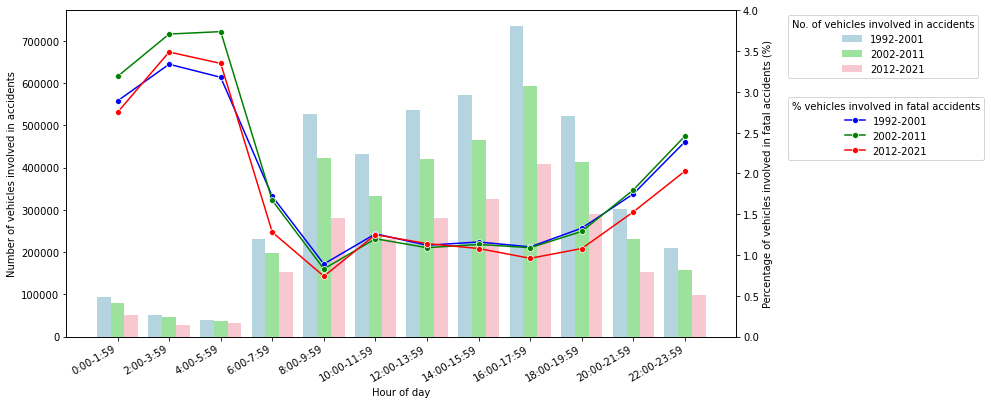

In [ ]:
x, y = 'accident_hour_binned', 'accident_fatality'
xlabel='Hour of day'
order=['0:00-1:59','2:00-3:59','4:00-5:59','6:00-7:59','8:00-9:59','10:00-11:59','12:00-13:59','14:00-15:59','16:00-17:59',
       '18:00-19:59','20:00-21:59','22:00-23:59']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart3, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,4)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  day_of_week_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                Mon               607155               485817   
1                Tue               617885               505408   
2                Wed               628637               512658   
3                Thu               645064               511288   
4                Fri               716656               566922   
5                Sat               577251               448505   
6                Sun               457239               366702   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0               331783                 8013                 6013   
1               350994                 7383                 6006   
2               353410                 7941                 6049   
3               358264                 8172                 6218   
4               384052                 9550                 7321   
5               301736                 8801                 760

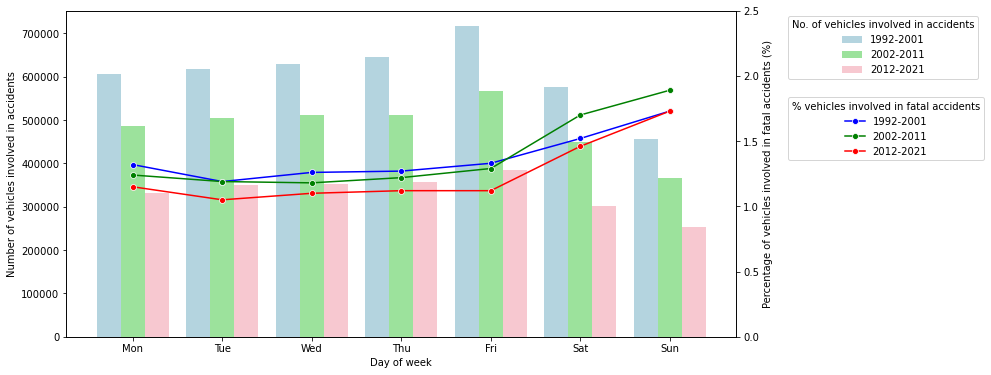

In [ ]:
x, y = 'day_of_week_binned', 'accident_fatality'
xlabel='Day of week'
order=['Mon','Tue','Wed','Thu','Fri','Sat','Sun']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart4, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,2.5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  number_of_vehicles_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                         1               746281               563894   
1                         2              2705628              2191022   
2                         3               569634               453597   
3                         4               150368               126520   
4               5 and above                77976                62267   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0               373160                15770                11601   
1              1540842                25502                20576   
2               291660                 9618                 8160   
3                85612                 3508                 3108   
4                41922                 3372                 2716   

   fat_count_2012-2021  fat_perc_1992-2001  fat_perc_2002-2011  \
0                 7230                2.11                2.06   
1                130

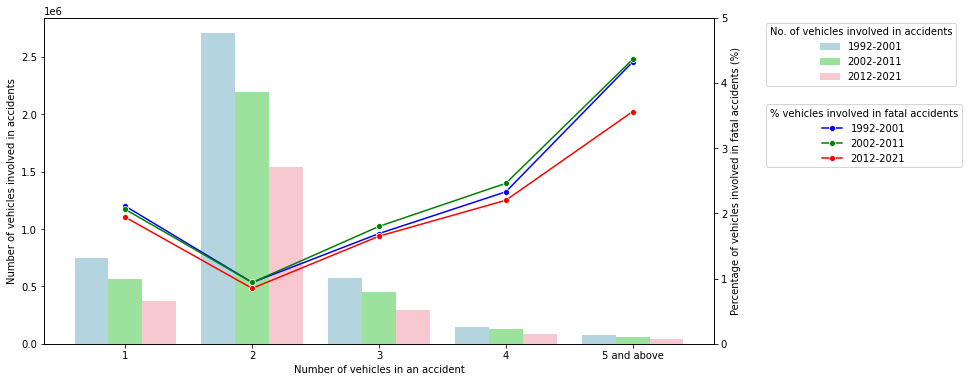

In [ ]:
x, y = 'number_of_vehicles_binned', 'accident_fatality'
xlabel='Number of vehicles in an accident'
order=['1','2','3','4','5 and above']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart5, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  first_road_class_binned  veh_count_1992-2001  veh_count_2002-2011  \
0        Motorway or A(M)               182429               172811   
1                       A              2041102              1591814   
2                       B               523581               421237   
3                       C               359063               289736   
4                 Unknown              1143712               921702   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0               105469                 4187                 3471   
1              1087498                34471                26705   
2               282375                 7424                 6403   
3               156285                 3892                 3465   
4               701569                 7796                 6117   

   fat_count_2012-2021  fat_perc_1992-2001  fat_perc_2002-2011  \
0                 1954                2.30                2.01   
1                16384          

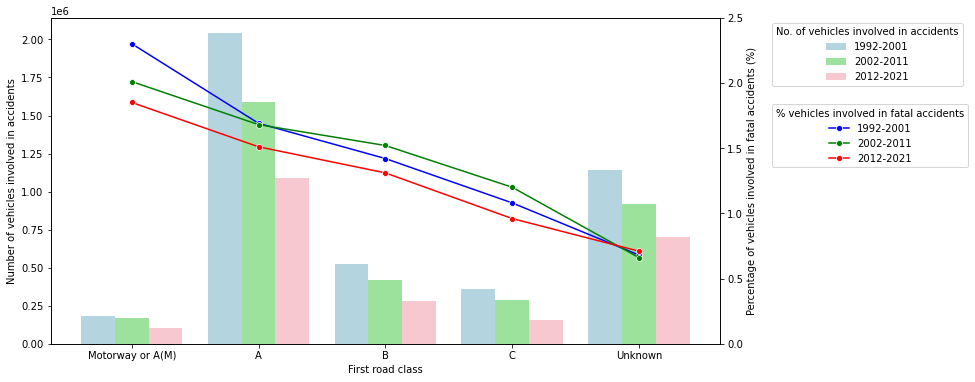

In [ ]:
x, y = 'first_road_class_binned', 'accident_fatality'
xlabel='First road class'
order=['Motorway or A(M)','A','B','C','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart6, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,2.5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

             road_type_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                  Roundabout               250387               228175   
1  One-way street / Slip road               116557                96055   
2            Dual carriageway               658105               573752   
3          Single carriageway              3201058              2479657   
4                     Unknown                23780                19661   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0               157412                  615                  604   
1                76012                  622                  584   
2               380576                12289                10063   
3              1693094                44148                34795   
4                26102                   96                  115   

   fat_count_2012-2021  fat_perc_1992-2001  fat_perc_2002-2011  \
0                  389                0.25                0.26   
1       

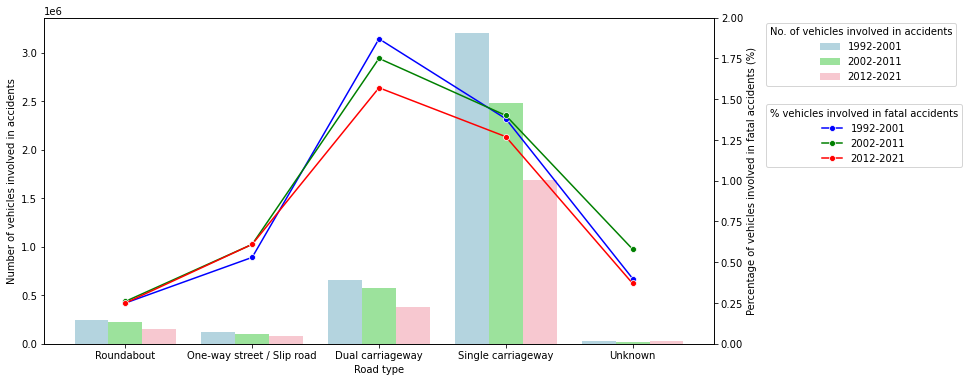

In [ ]:
x, y = 'road_type_binned', 'accident_fatality'
xlabel='Road type'
order=['Roundabout','One-way street / Slip road','Dual carriageway','Single carriageway','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart7, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,2)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  speed_limit_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                 20                 3976                18327   
1                 30              2675986              2111292   
2                 40               361556               299224   
3                 50                77562               103766   
4                 60               801049               569948   
5                 70               329060               294703   
6            Unknown                  698                   40   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0               133435                   26                111.0   
1              1410917                16637              12890.0   
2               206620                 4706               3924.0   
3               102495                 1387               2202.0   
4               304135                26045              19808.0   
5               175387                 8954               7222.

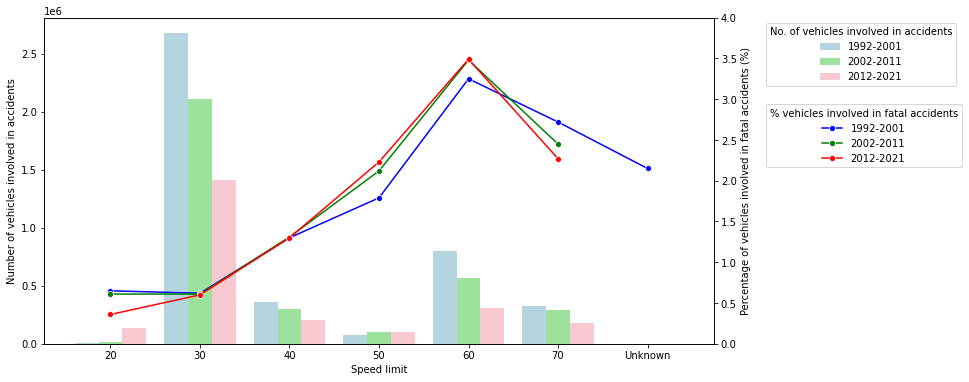

In [ ]:
x, y = 'speed_limit_binned', 'accident_fatality'
xlabel='Speed limit'
order=['20','30','40','50','60','70','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[['20','30','40','50','60','70']].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[['20','30','40','50','60','70']].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[['20','30','40','50','60','70']].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[['20','30','40','50','60','70']].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart8, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,4)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

              junction_detail_binned  veh_count_1992-2001  \
0      Not at junction or within 20m              1563233   
1                         Roundabout               333810   
2            T or staggered junction              1428876   
3                          Slip road                63010   
4                         Crossroads               486335   
5  More than 4 arms (not roundabout)                61736   
6          Private drive or entrance               212995   
7                            Unknown                99892   

   veh_count_2002-2011  veh_count_2012-2021  fat_count_1992-2001  \
0              1325378               920689                35941   
1               322933               235547                  878   
2              1054111               717239                12501   
3                56652                36475                 1084   
4               341128               233212                 3944   
5                50168                2491

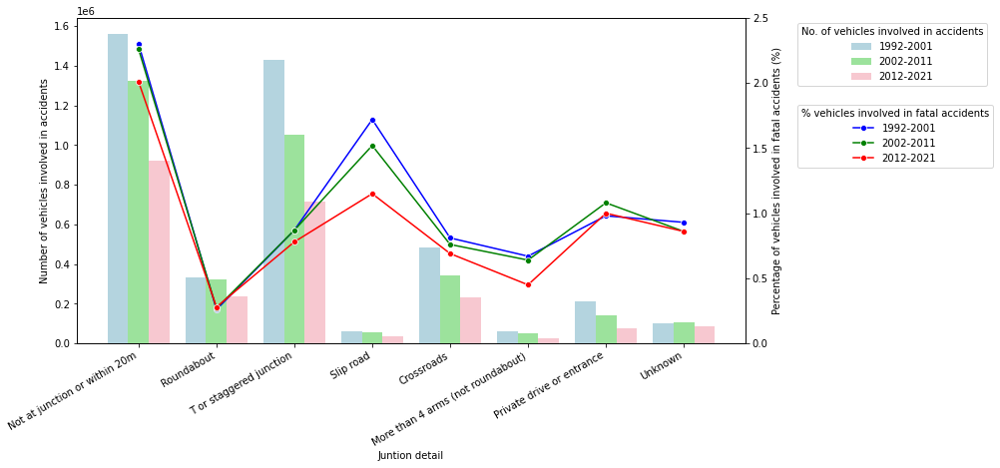

In [ ]:
x, y = 'junction_detail_binned', 'accident_fatality'
xlabel='Juntion detail'
order=['Not at junction or within 20m','Roundabout','T or staggered junction','Slip road','Crossroads',
       'More than 4 arms (not roundabout)','Private drive or entrance','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart9, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,2.5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

         junction_control_binned  veh_count_1992-2001  veh_count_2002-2011  \
0  Not at junction or within 20m              1563233              1325378   
1            Auto traffic signal               384059               336027   
2       Give way or uncontrolled              2152088              1597594   
3               Others / Unknown               150507               138301   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0               920689                35941                29893   
1               240328                 1996                 1734   
2              1054670                18417                13314   
3               117509                 1416                 1220   

   fat_count_2012-2021  fat_perc_1992-2001  fat_perc_2002-2011  \
0                18531                2.30                2.26   
1                 1327                0.52                0.52   
2                 7742                0.86                0.83   
3   

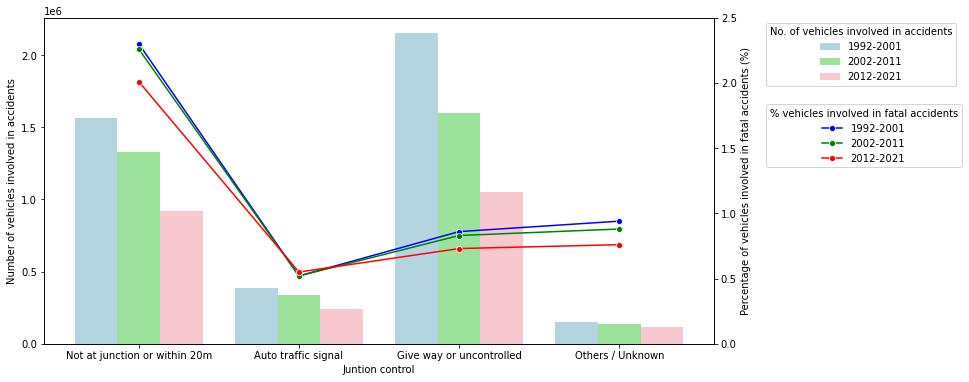

In [ ]:
x, y = 'junction_control_binned', 'accident_fatality'
xlabel='Juntion control'
order=["Not at junction or within 20m","Auto traffic signal","Give way or uncontrolled","Others / Unknown"]

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart10, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,2.5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

        second_road_class_binned  veh_count_1992-2001  veh_count_2002-2011  \
0  Not at junction or within 20m              1563233              1325378   
1               Motorway or A(M)                31571                27623   
2                              A               387701               324141   
3                              B               158028               127426   
4                              C               212096               159443   
5                        Unknown              1897258              1433289   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0               920689                35941                29893   
1                15991                  310                  218   
2               227921                 2270                 1587   
3                89845                 1293                 1086   
4                91852                 2228                 1471   
5               986898                15728  

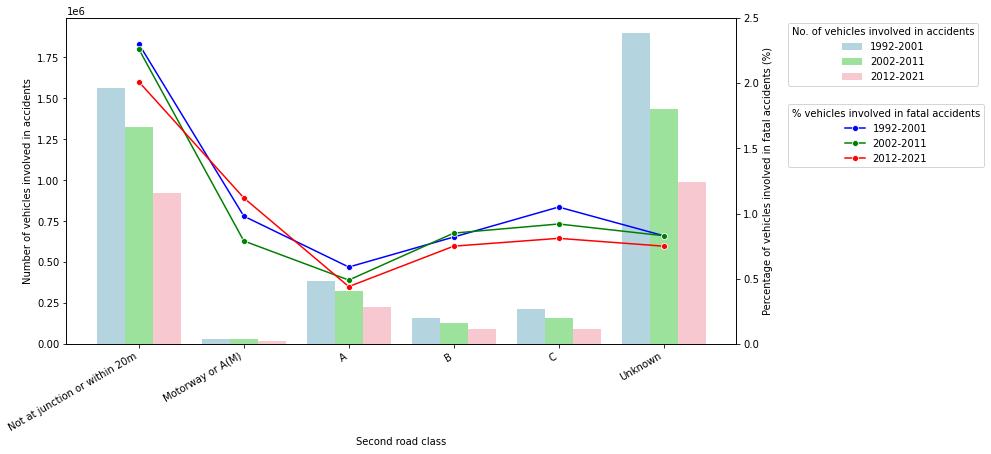

In [ ]:
x, y = 'second_road_class_binned', 'accident_fatality'
xlabel='Second road class'
order=['Not at junction or within 20m','Motorway or A(M)','A','B','C','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart11, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,2.5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

   light_conditions_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                 Daylight              3137627              2520655   
1    Darkness - lights lit               824539               657614   
2  Darkness - lights unlit                38206                18279   
3   Darkness - no lighting               202061               172341   
4                  Unknown                47454                28411   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0              1716741                35364                28243   
1               455944                11061                 8592   
2                14316                  746                  335   
3               105863                 9994                 8570   
4                40332                  605                  421   

   fat_count_2012-2021  fat_perc_1992-2001  fat_perc_2002-2011  \
0                17760                1.13                1.12   
1                 5018    

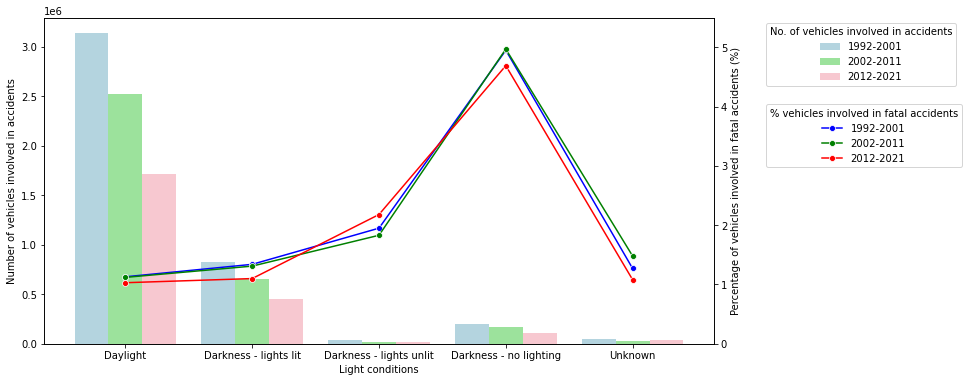

In [ ]:
x, y = 'light_conditions_binned', 'accident_fatality'
xlabel='Light conditions'
order=['Daylight','Darkness - lights lit','Darkness - lights unlit','Darkness - no lighting','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart12, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,5.5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  weather_conditions_binned  veh_count_1992-2001  veh_count_2002-2011  \
0        Fine no high winds              3291485              2706781   
1     Raining no high winds               644173               429498   
2     Snowing no high winds                21432                20007   
3                High winds               126041                89757   
4               Fog or mist                39859                20237   
5                   Unknown               126897               131020   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0              1889293                46387                38181   
1               264022                 6334                 4550   
2                11043                  196                  165   
3                57512                 2203                 1471   
4                10844                 1232                  539   
5               100482                 1418                 1255   

   fat_coun

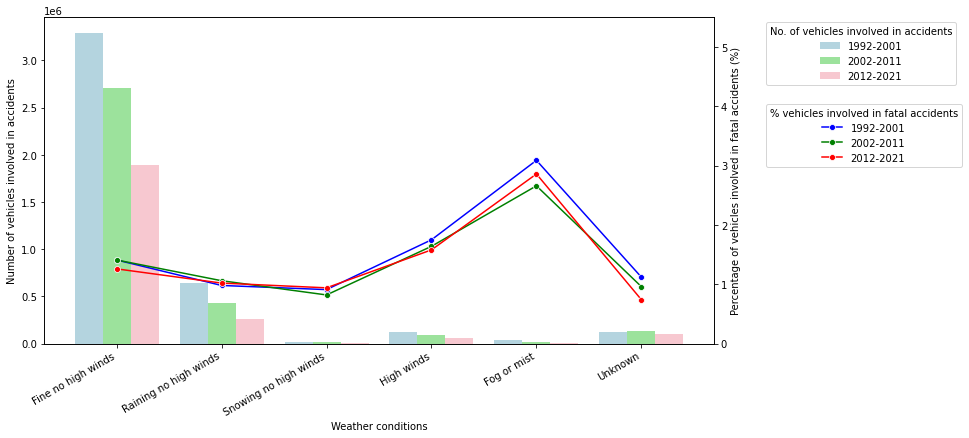

In [ ]:
x, y = 'weather_conditions_binned', 'accident_fatality'
xlabel='Weather conditions'
order=["Fine no high winds","Raining no high winds","Snowing no high winds","High winds","Fog or mist","Unknown"]

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart13, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,5.5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  road_surface_conditions_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                            Dry              2673973              2304787   
1                    Wet or damp              1471548              1002709   
2                           Snow                19527                17989   
3                   Frost or ice                69167                59203   
4               Others / Unknown                15672                12612   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0              1670781                35955                30856   
1               605677                20567                14335   
2                10259                  195                  168   
3                28437                  824                  663   
4                18042                  229                  139   

   fat_count_2012-2021  fat_perc_1992-2001  fat_perc_2002-2011  \
0                19808                1.34              

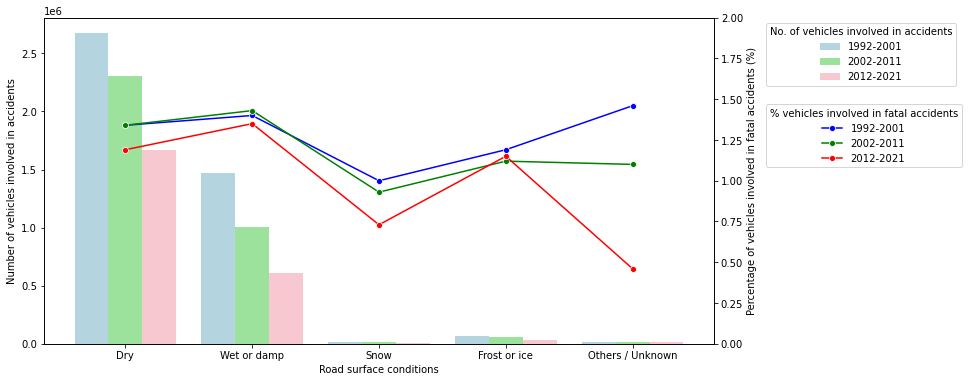

In [ ]:
x, y = 'road_surface_conditions_binned', 'accident_fatality'
xlabel='Road surface conditions'
order=["Dry","Wet or damp","Snow","Frost or ice","Others / Unknown"]

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart14, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,2)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  urban_or_rural_area_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                      Urban              2210053              2145569   
1                      Rural              1199740              1249585   
2                    Unknown               840094                 2146   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0              1528293                14446                14205   
1               804657                30298                31935   
2                  246                13026                   21   

   fat_count_2012-2021  fat_perc_1992-2001  fat_perc_2002-2011  \
0                 9379                0.65                0.66   
1                19109                2.53                2.56   
2                    2                1.55                0.98   

   fat_perc_2012-2021  
0                0.61  
1                2.37  
2                0.81  


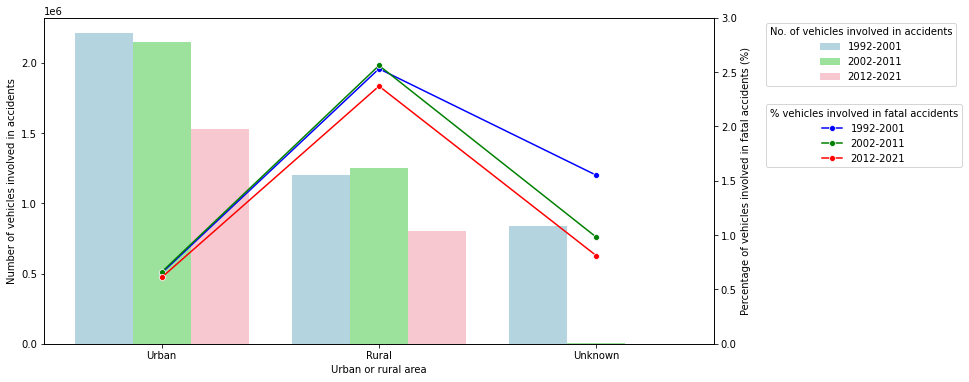

In [ ]:
x, y = 'urban_or_rural_area_binned', 'accident_fatality'
xlabel='Urban or rural area'
order=['Urban','Rural','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart15, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,3)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  vehicle_type_binned  veh_count_1992-2001  veh_count_2002-2011  \
0         Pedal cycle               238582               174435   
1          Motorcycle               263807               245067   
2                Taxi                40202                48672   
3                 Car              3200228              2534644   
4                 Bus               130145               101155   
5                 Van               191104               149847   
6       Goods vehicle               144951               104581   
7    Others / Unknown                40868                38899   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0               188606                 1885                 1352   
1               188178                 5666                 6007   
2                46946                  312                  449   
3              1644636                37786                29534   
4                51691                 1755             

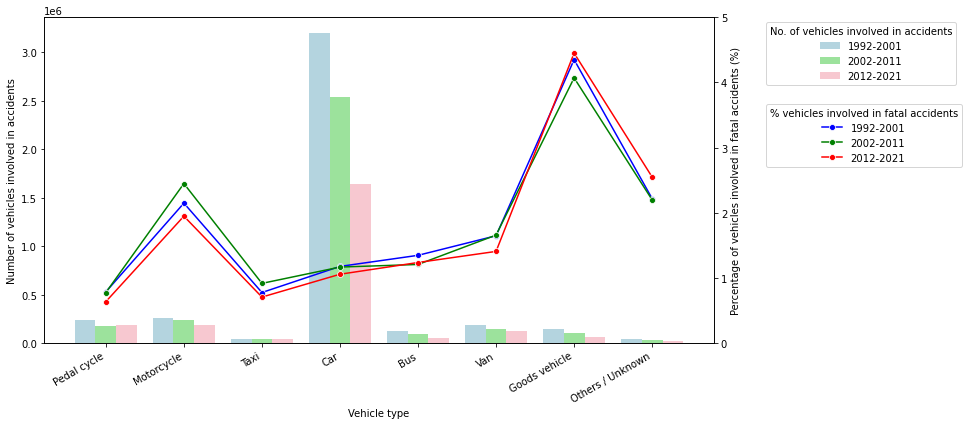

In [ ]:
x, y = 'vehicle_type_binned', 'accident_fatality'
xlabel='Vehicle type'
order=['Pedal cycle','Motorcycle','Taxi','Car','Bus','Van','Goods vehicle','Others / Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart16, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

               vehicle_manoeuvre_binned  veh_count_1992-2001  \
0                             Reversing                48131   
1                                Parked               157377   
2               Waiting to go - held up               328495   
3                   Slowing or stopping               173508   
4                            Moving off                57043   
5                                U-turn                28147   
6                          Turning left               123463   
7                  Waiting to turn left                26712   
8                         Turning right               436388   
9                 Waiting to turn right                87421   
10                Changing lane to left                27163   
11               Changing lane to right                39608   
12  Overtaking moving vehicle - offside               102255   
13  Overtaking static vehicle - offside                73292   
14                Overtaking - nearside 

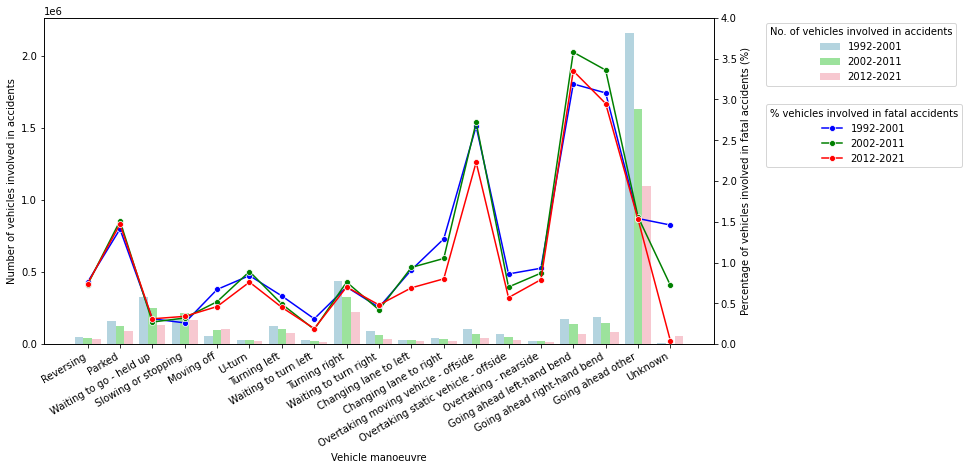

In [ ]:
x, y = 'vehicle_manoeuvre_binned', 'accident_fatality'
xlabel='Vehicle manoeuvre'
order=['Reversing','Parked','Waiting to go - held up','Slowing or stopping','Moving off','U-turn',
       'Turning left','Waiting to turn left','Turning right','Waiting to turn right','Changing lane to left',
       'Changing lane to right','Overtaking moving vehicle - offside','Overtaking static vehicle - offside',
       'Overtaking - nearside','Going ahead left-hand bend','Going ahead right-hand bend','Going ahead other','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart17, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,4)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

                            junction_location_binned  veh_count_1992-2001  \
0                      Not at junction or within 20m            1563233.0   
1                                            Unknown            2686654.0   
2  Approaching junction or waiting/parked at junc...                  NaN   
3  Cleared junction or waiting/parked at junction...                  NaN   
4                                 Leaving roundabout                  NaN   
5                                Entering roundabout                  NaN   
6                                  Leaving main road                  NaN   
7                                 Entering main road                  NaN   
8                            Entering from slip road                  NaN   
9       Mid Junction - on roundabout or on main road                  NaN   

   veh_count_2002-2011  veh_count_2012-2021  fat_count_1992-2001  \
0              1327025               921309              35941.0   
1               

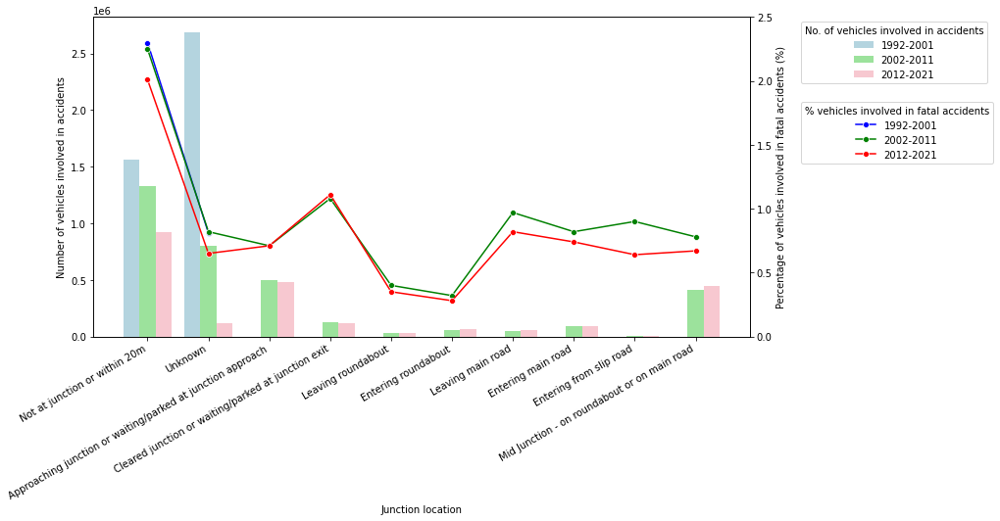

In [ ]:
x, y = 'junction_location_binned', 'accident_fatality'
xlabel='Junction location'
order=['Not at junction or within 20m','Unknown','Approaching junction or waiting/parked at junction approach',
       'Cleared junction or waiting/parked at junction exit','Leaving roundabout',
       'Entering roundabout','Leaving main road','Entering main road','Entering from slip road',
       'Mid Junction - on roundabout or on main road']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[['Not at junction or within 20m','Unknown']].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[['Not at junction or within 20m','Unknown']].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart18, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 230000)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,2.5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  skidding_and_overturning_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                            None              3572972              2898951   
1                         Skidded               549589               375139   
2          Skidded and overturned                61324                69200   
3                      Jackknifed                 4251                 2421   
4                      Overturned                52528                51002   
5                         Unknown                 9223                  587   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0              2029126                40733                32539   
1               159180                12903                 9412   
2                39537                 1995                 2396   
3                 1123                  236                  134   
4                44388                 1695                 1661   
5                59842                

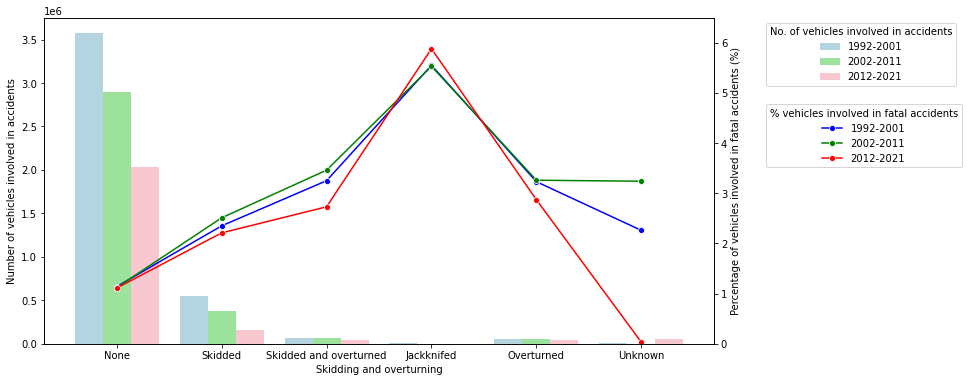

In [ ]:
x, y = 'skidding_and_overturning_binned', 'accident_fatality'
xlabel='Skidding and overturning'
order=["None",'Skidded','Skidded and overturned','Jackknifed','Overturned','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart19, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 8e5)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,6.5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  vehicle_leaving_carriageway_binned  veh_count_1992-2001  \
0          Did not leave carriageway              3785834   
1                           Nearside               274138   
2         Straight ahead at junction                14562   
3                            Offside               171561   
4                            Unknown                 3792   

   veh_count_2002-2011  veh_count_2012-2021  fat_count_1992-2001  \
0              2998233              2033802                41729   
1               233600               143580                 9202   
2                12248                 9307                  325   
3               152660                88720                 6454   
4                  559                57787                   60   

   fat_count_2002-2011  fat_count_2012-2021  fat_perc_1992-2001  \
0                31974                20538                1.10   
1                 8147                 4655                3.36   
2                  305 

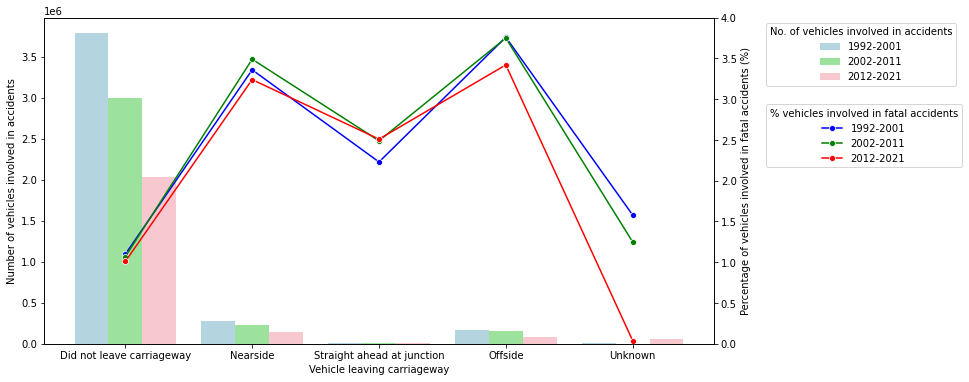

In [ ]:
x, y = 'vehicle_leaving_carriageway_binned', 'accident_fatality'
xlabel='Vehicle leaving carriageway'
order=["Did not leave carriageway",'Nearside',"Straight ahead at junction",'Offside','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart20, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 8e5)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,4)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  first_point_of_impact_binned  veh_count_1992-2001  veh_count_2002-2011  \
0               Did not impact               219797               209529   
1                        Front              2232066              1699661   
2                         Back               747747               614463   
3                      Offside               547315               458197   
4                     Nearside               453899               396246   
5                      Unknown                49063                19204   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0               136929                 3360                 3833   
1              1140472                36666                27536   
2               400105                 4317                 3382   
3               327538                 7366                 6151   
4               295196                 5760                 5057   
5                32956                  301                

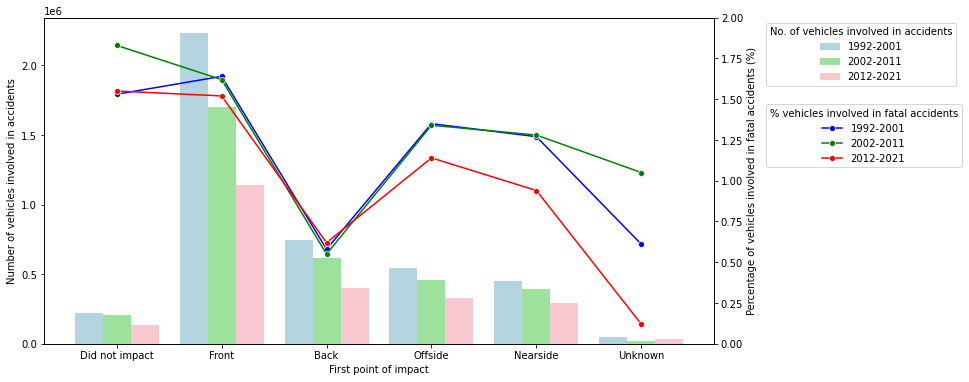

In [ ]:
x, y = 'first_point_of_impact_binned', 'accident_fatality'
xlabel='First point of impact'
order=["Did not impact","Front","Back","Offside","Nearside","Unknown"]

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart21, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 8e5)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,2)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  sex_of_driver_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                 Male              2925997              2254430   
1               Female              1123643               945045   
2              Unknown               200247               197825   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0              1501967                47192                37073   
1               641665                 9219                 7669   
2               189564                 1359                 1419   

   fat_count_2012-2021  fat_perc_1992-2001  fat_perc_2002-2011  \
0                22491                1.61                1.64   
1                 4970                0.82                0.81   
2                 1029                0.68                0.72   

   fat_perc_2012-2021  
0                1.50  
1                0.77  
2                0.54  


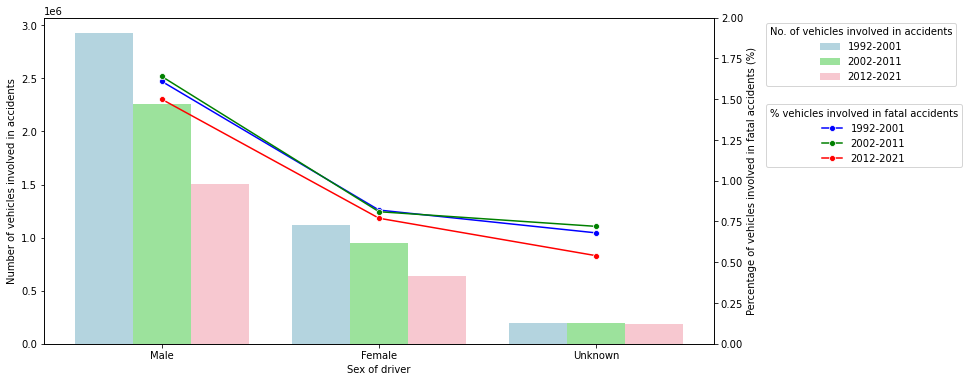

In [ ]:
x, y = 'sex_of_driver_binned', 'accident_fatality'
xlabel='Sex of driver'
order=["Male","Female","Unknown"]

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart22, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 8e5)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,2)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  age_band_of_driver_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                       <15                78467                41728   
1                     16-20               440016               348821   
2                     21-25               555870               379966   
3                     26-35              1107246               711596   
4                     36-45               754315               664264   
5                     46-55               511273               441435   
6                     56-65               266465               261809   
7                     66-75               123350               109688   
8                       >75                55901                62164   
9                   Unknown               356984               375829   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0                20998                  496                  243   
1               164838                 5934                 

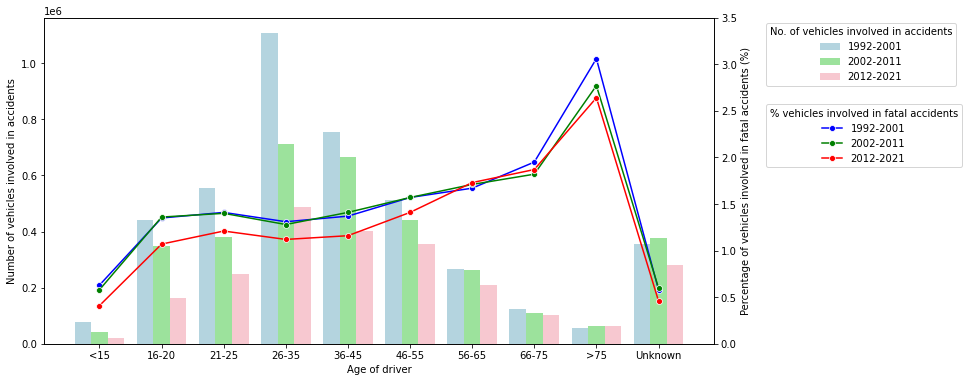

In [ ]:
x, y = 'age_band_of_driver_binned', 'accident_fatality'
xlabel='Age of driver'
order=['<15','16-20','21-25','26-35','36-45','46-55','56-65','66-75','>75','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart23, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 8e5)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,3.5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  engine_capacity_cc_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                     0-500               117553               104722   
1                  501-1000               299578               178182   
2                 1001-1500               999789               731625   
3                 1501-2000              1331495              1085401   
4                     >2000               349588               397731   
5                   Unknown              1151884               899639   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0               101363                 1808                 1147   
1               135907                 4939                 4420   
2               486652                11388                 8187   
3               723775                17593                14086   
4               292321                 7584                 8332   
5               593178                14458                 9989   

   fat_coun

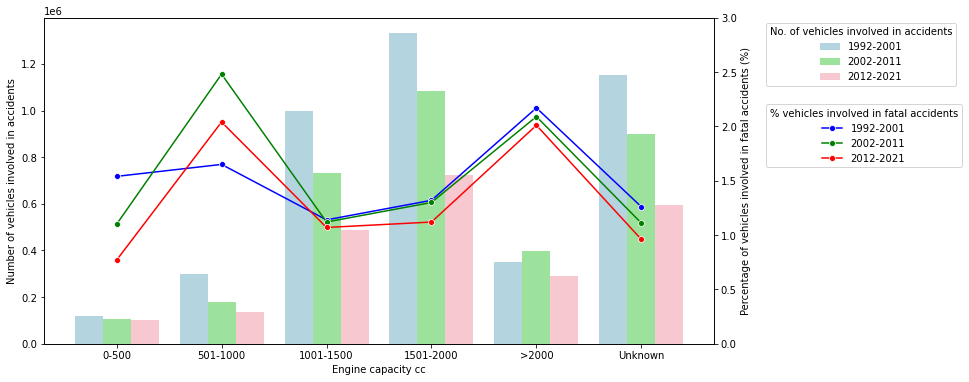

In [ ]:
x, y = 'engine_capacity_cc_binned', 'accident_fatality'
xlabel='Engine capacity cc'
order=['0-500','501-1000','1001-1500','1501-2000','>2000','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart24, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 8e5)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,3)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  propulsion_code_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                 Petrol              2612960              1800277   
1              Heavy oil               556119               721101   
2     Others / Undefined              1080808               875922   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0               994285                34409                24622   
1               718510                10743                12122   
2               620401                12618                 9417   

   fat_count_2012-2021  fat_perc_1992-2001  fat_perc_2002-2011  \
0                12183                1.32                1.37   
1                10545                1.93                1.68   
2                 5762                1.17                1.08   

   fat_perc_2012-2021  
0                1.23  
1                1.47  
2                0.93  


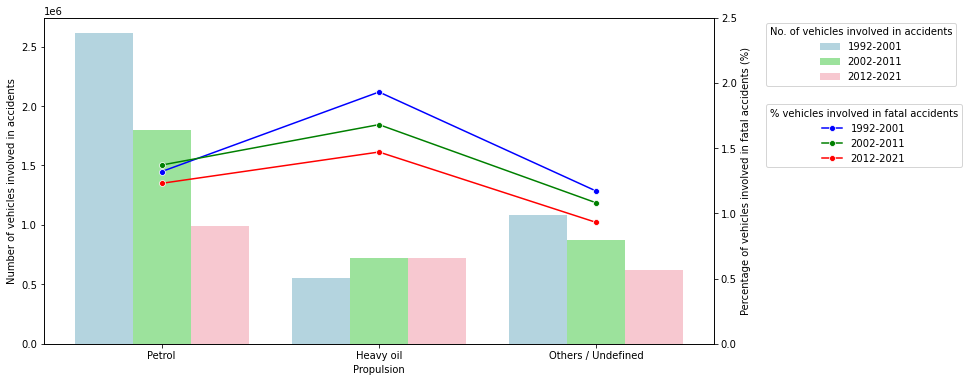

In [ ]:
x, y = 'propulsion_code_binned', 'accident_fatality'
xlabel='Propulsion'
order=['Petrol','Heavy oil',"Others / Undefined"]

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart25, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 8e5)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,2.5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  age_of_vehicle_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                   0-1               431388               322314   
1                   2-3               486364               389683   
2                   4-5               470633               385363   
3                   6-7               457745               366522   
4                   8-9               445044               335580   
5                 10-11               395260               269617   
6                 12-13               261748               182674   
7          14 and above               197875               173923   
8               Unknown              1103830               971624   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0               212601                 6831                 4949   
1               235470                 7281                 5997   
2               224661                 6995                 5603   
3               214663               

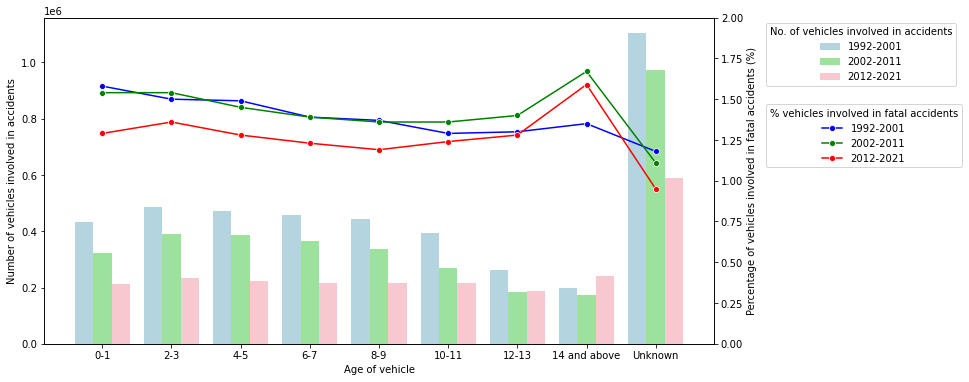

In [ ]:
x, y = 'age_of_vehicle_binned', 'accident_fatality'
xlabel='Age of vehicle'
order=['0-1','2-3','4-5','6-7','8-9','10-11','12-13','14 and above','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart26, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 8e5)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,2)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

  driver_home_area_type_binned  veh_count_1992-2001  veh_count_2002-2011  \
0                   Urban area               541707              1970500   
1                   Small town                58496               235168   
2                        Rural                76714               308083   
3                      Unknown              3572970               883549   

   veh_count_2012-2021  fat_count_1992-2001  fat_count_2002-2011  \
0              1498600                 5645                22789   
1               164769                 1088                 4576   
2               218668                 1599                 7058   
3               451159                49438                11738   

   fat_count_2012-2021  fat_perc_1992-2001  fat_perc_2002-2011  \
0                16012                1.04                1.16   
1                 3151                1.86                1.95   
2                 4915                2.08                2.29   
3             

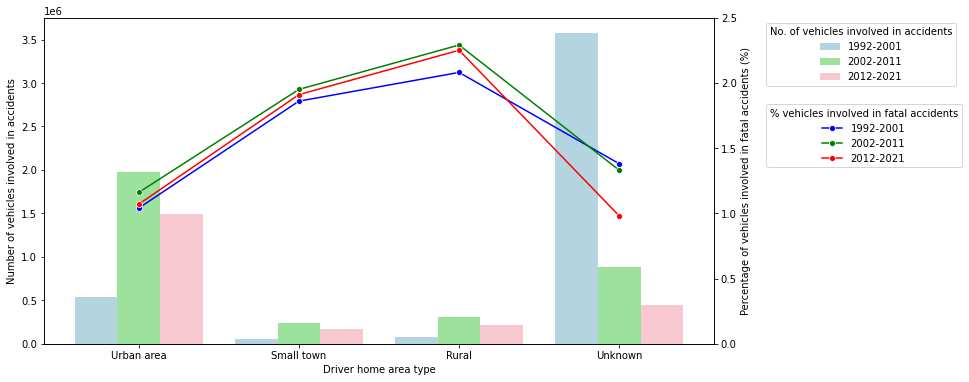

In [ ]:
x, y = 'driver_home_area_type_binned', 'accident_fatality'
xlabel='Driver home area type'
order=['Urban area','Small town','Rural','Unknown']

df1 = df_vehacc1A.groupby(x)[y].count().reindex(order)
df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1B.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1C.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df1["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

df4 = df_vehacc1A.groupby(x)[y].value_counts()
df4 = df4.rename('fat_count_1992-2001').reset_index()
df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
df4 = df4.set_index(x).loc[order].reset_index()
#print(df4)

df5 = df_vehacc1B.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1C.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df1["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df1["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

df7 = df_vehacc1A.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df7 = df7.rename('fat_perc_1992-2001').reset_index()
df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
df7 = df7.set_index(x).loc[order].reset_index()
#print(df7)

df8 = df_vehacc1B.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1C.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df1["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df1["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df1)

chart27, ax1 = plt.subplots(figsize=(12,6))
df1melt=df1.melt(id_vars=x,value_vars=['veh_count_1992-2001','veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_1992-2001':'lightblue','veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
#ax1.set_ylim(0, 8e5)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['1992-2001','2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df1, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,2.5)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['1992-2001','2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

### EDA - Datasets A, B, C - New propulsion technologies

In [ ]:
# Read csv file
df_vehacc6 = pd.read_csv("df_vehacc6.csv", low_memory=False)

df_vehacc7a = df_vehacc6.copy()

In [ ]:
# Binning of "propulsion_code"
propulsion_code_map = {
1:"Petrol",
2:"Heavy oil",
3:'Electric',
4:"Others / Undefined",
5:"Others / Undefined",
6:'Petrol/Gas (LPG)',
7:'Gas/Bi-fuel',
8:'Hybrid electric',
9:"Others / Undefined",
10:"Others / Undefined",
11:"Others / Undefined",
12:"Others / Undefined",
-1:"Others / Undefined"
}

df_vehacc7a["propulsion_code_binned2"] = df_vehacc7a['propulsion_code'].map(propulsion_code_map)

# Check dimensions
print(df_vehacc7a.shape) # 9980383 rows, 29 cols

#df_vehacc7a.head()

(9980383, 29)


In [ ]:
# Retain rows for year 1992 to 2001
df_vehacc1Aa = df_vehacc7a[(df_vehacc7a.accident_year >= 1992) & (df_vehacc7a.accident_year <= 2001)]

# Retain rows for year 2002 to 2011
df_vehacc1Ba = df_vehacc7a[(df_vehacc7a.accident_year >= 2002) & (df_vehacc7a.accident_year <= 2011)]

# Retain rows for year 2002 to 2011
df_vehacc1Ca = df_vehacc7a[(df_vehacc7a.accident_year >= 2012) & (df_vehacc7a.accident_year <= 2021)]

  propulsion_code_binned2  veh_count_2002-2011  veh_count_2012-2021  \
0                  Petrol              1800277               994285   
1               Heavy oil               721101               718510   
2         Hybrid electric                 1957                28060   
3                Electric                  466                 2898   
4             Gas/Bi-fuel                 1967                 1588   
5        Petrol/Gas (LPG)                 1599                  408   
6      Others / Undefined               869933               587447   

   fat_count_2002-2011  fat_count_2012-2021  fat_perc_2002-2011  \
0                24622                12183                1.37   
1                12122                10545                1.68   
2                   18                  161                0.92   
3                    9                   25                1.93   
4                   15                   11                0.76   
5                   28       

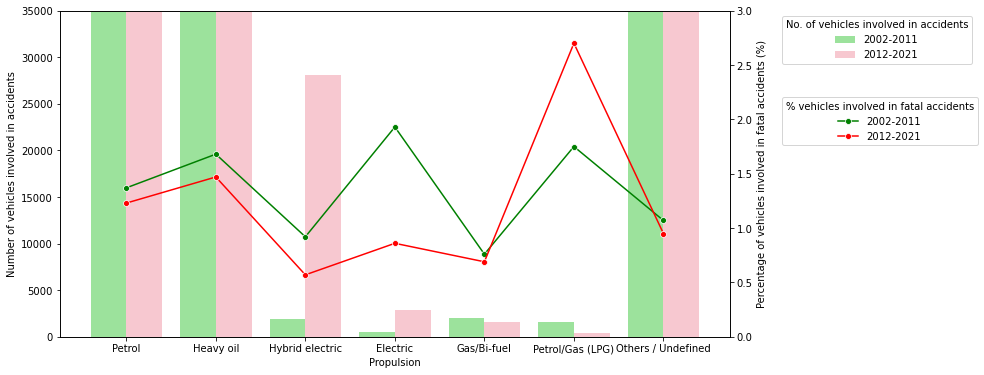

In [ ]:
x, y = 'propulsion_code_binned2', 'accident_fatality'
xlabel='Propulsion'
order=['Petrol','Heavy oil','Hybrid electric','Electric','Gas/Bi-fuel','Petrol/Gas (LPG)',"Others / Undefined"]

#df1 = df_vehacc1Aa.groupby(x)[y].count().reindex(order)
#df1 = df1.rename('veh_count_1992-2001').reset_index()
#print(df1)

df2 = df_vehacc1Ba.groupby(x)[y].count().reindex(order)
df2 = df2.rename('veh_count_2002-2011').reset_index()
#print(df2)

df3 = df_vehacc1Ca.groupby(x)[y].count().reindex(order)
df3 = df3.rename('veh_count_2012-2021').reset_index()
#print(df3)

#df1["veh_count_2002-2011"] = df2["veh_count_2002-2011"]
df2["veh_count_2012-2021"] = df3["veh_count_2012-2021"]
#print(df1)

#df4 = df_vehacc1Aa.groupby(x)[y].value_counts()
#df4 = df4.rename('fat_count_1992-2001').reset_index()
#df4 = df4[df4.accident_fatality == 1].reset_index(drop=True)
#df4 = df4.set_index(x).loc[['Undefined','Petrol','Heavy oil','Gas','Petrol/Gas (LPG)','Electric']].reset_index()
#print(df4)

df5 = df_vehacc1Ba.groupby(x)[y].value_counts()
df5 = df5.rename('fat_count_2002-2011').reset_index()
df5 = df5[df5.accident_fatality == 1].reset_index(drop=True)
df5 = df5.set_index(x).loc[order].reset_index()
#print(df5)

df6 = df_vehacc1Ca.groupby(x)[y].value_counts()
df6 = df6.rename('fat_count_2012-2021').reset_index()
df6 = df6[df6.accident_fatality == 1].reset_index(drop=True)
df6 = df6.set_index(x).loc[order].reset_index()
#print(df6)

#df1["fat_count_1992-2001"] = df4["fat_count_1992-2001"]
df2["fat_count_2002-2011"] = df5["fat_count_2002-2011"]
df2["fat_count_2012-2021"] = df6["fat_count_2012-2021"]
#print(df1)

#df7 = df_vehacc1Aa.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
#df7 = df7.rename('fat_perc_1992-2001').reset_index()
#df7 = df7[df7.accident_fatality == 1].reset_index(drop=True)
#df7 = df7.set_index(x).loc[['Undefined','Petrol','Heavy oil','Gas','Petrol/Gas (LPG)','Electric']].reset_index()
#print(df7)

df8 = df_vehacc1Ba.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df8 = df8.rename('fat_perc_2002-2011').reset_index()
df8 = df8[df8.accident_fatality == 1].reset_index(drop=True)
df8 = df8.set_index(x).loc[order].reset_index()
#print(df8)

df9 = df_vehacc1Ca.groupby(x)[y].value_counts(normalize=True).mul(100).round(2)
df9 = df9.rename('fat_perc_2012-2021').reset_index()
df9 = df9[df9.accident_fatality == 1].reset_index(drop=True)
df9 = df9.set_index(x).loc[order].reset_index()
#print(df9)

#df1["fat_perc_1992-2001"] = df7["fat_perc_1992-2001"]
df2["fat_perc_2002-2011"] = df8["fat_perc_2002-2011"]
df2["fat_perc_2012-2021"] = df9["fat_perc_2012-2021"]
print(df2)

chart28, ax1 = plt.subplots(figsize=(12,6))
df1melt=df2.melt(id_vars=x,value_vars=['veh_count_2002-2011','veh_count_2012-2021'])
palette={'veh_count_2002-2011':'lightgreen','veh_count_2012-2021':'pink'}
ax1 = sns.barplot(data=df1melt, x=x, y='value', hue='variable', palette=palette)
ax1.set_ylim(0, 3.5e4)
ax1.set(xlabel=xlabel, ylabel='Number of vehicles involved in accidents')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, horizontalalignment='center')
#ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
handles, previous_labels = ax1.get_legend_handles_labels()
ax1.legend(bbox_to_anchor=(1.07, 1.0), loc='upper left', title='No. of vehicles involved in accidents', handles=handles,
           labels=['2002-2011','2012-2021'])

ax2 = ax1.twinx() # secondary axis
#ax2 = sns.lineplot(data=df2, x=ax1.get_xticks(), y="fat_perc_1992-2001", color='blue', marker='o')
ax2 = sns.lineplot(data=df2, x=ax1.get_xticks(), y="fat_perc_2002-2011", color='green', marker='o')
ax2 = sns.lineplot(data=df2, x=ax1.get_xticks(), y="fat_perc_2012-2021", color='red', marker='o')
ax2.set_ylim(0,3)
ax2.set(ylabel='Percentage of vehicles involved in fatal accidents (%)')
plt.legend(bbox_to_anchor=(1.07, 0.75), loc='upper left', title='% vehicles involved in fatal accidents',
           labels=['2002-2011','2012-2021'])

# Add annotations
#for line in range(df1.shape[0]):
#    ax2.text(line, df1["fat_perc_1992-2001"].iloc[line]+0.07, df1["fat_perc_1992-2001"].iloc[line],
#             horizontalalignment='center', rotation=0)

plt.show()

## Feature Selection

### Cramer's V Correlation Matrix
Cramer's V is a measure of association between two categorical variables, giving a value between 0 (no association) and +1 (complete association).

In [ ]:
# Read csv file
df_vehacc1A = pd.read_csv("df_vehacc1A.csv", low_memory=False)
df_vehacc1B = pd.read_csv("df_vehacc1B.csv", low_memory=False)
df_vehacc1C = pd.read_csv("df_vehacc1C.csv", low_memory=False)

In [ ]:
# Create new df for encoding and Cramer's V correlation matrix
df_vehacc2A = df_vehacc1A.copy()
df_vehacc2B = df_vehacc1B.copy()
df_vehacc2C = df_vehacc1C.copy()

In [ ]:
# Delete accident_year column (not to be used in ML stage)
df_vehacc2A.drop(["accident_year"], inplace=True, axis=1)
df_vehacc2B.drop(["accident_year"], inplace=True, axis=1)
df_vehacc2C.drop(["accident_year"], inplace=True, axis=1)

In [ ]:
# Save dataset
df_vehacc2A.to_csv("df_vehacc2A.csv", index=False, header=True)
df_vehacc2B.to_csv("df_vehacc2B.csv", index=False, header=True)
df_vehacc2C.to_csv("df_vehacc2C.csv", index=False, header=True)

# Check dimensions
print(df_vehacc2A.shape) # 4249887 rows, 27 cols
print(df_vehacc2B.shape) # 3397300 rows, 27 cols
print(df_vehacc2C.shape) # 2333196 rows, 27 cols

#df_vehacc2A.head
#df_vehacc2B.head
#df_vehacc2C.head

(4249887, 27)
(3397300, 27)
(2333196, 27)


In [ ]:
from sklearn import preprocessing

#Label encoding for df_vehacc2A with accident_fatality column
label = preprocessing.LabelEncoder()
data_encoded_fatality_2A = pd.DataFrame()

for i in df_vehacc2A.columns :
  data_encoded_fatality_2A[i]=label.fit_transform(df_vehacc2A[i])

#data_encoded_fatality_2A.head()

# Delete accident_fatality column in the encoded df for Cramer's V
data_encoded_2A = data_encoded_fatality_2A.drop(["accident_fatality"], axis=1)

data_encoded_2A.head()

,accident_month,accident_hour_binned,day_of_week_binned,number_of_vehicles_binned,first_road_class_binned,road_type_binned,speed_limit_binned,junction_detail_binned,junction_control_binned,second_road_class_binned,...,junction_location_binned,skidding_and_overturning_binned,vehicle_leaving_carriageway_binned,first_point_of_impact_binned,sex_of_driver_binned,age_band_of_driver_binned,engine_capacity_cc_binned,propulsion_code_binned,age_of_vehicle_binned,driver_home_area_type_binned
0,11,4,0,4,3,0,5,2,2,4,...,0,1,0,1,2,9,5,1,8,2
1,11,4,0,4,3,0,5,2,2,4,...,0,3,0,1,1,9,5,1,8,2
2,11,4,0,4,3,0,5,2,2,4,...,0,1,0,0,1,5,5,1,8,2
3,11,4,0,4,3,0,5,2,2,4,...,0,3,0,2,1,2,5,1,8,2
4,11,4,0,4,3,0,5,2,2,4,...,0,3,0,2,1,2,5,1,8,2


In [ ]:
# Check data type
data_encoded_2A.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4249887 entries, 0 to 4249886
Data columns (total 26 columns):
 #   Column                              Non-Null Count    Dtype
---  ------                              --------------    -----
 0   accident_month                      4249887 non-null  int64
 1   accident_hour_binned                4249887 non-null  int32
 2   day_of_week_binned                  4249887 non-null  int32
 3   number_of_vehicles_binned           4249887 non-null  int32
 4   first_road_class_binned             4249887 non-null  int32
 5   road_type_binned                    4249887 non-null  int32
 6   speed_limit_binned                  4249887 non-null  int32
 7   junction_detail_binned              4249887 non-null  int32
 8   junction_control_binned             4249887 non-null  int32
 9   second_road_class_binned            4249887 non-null  int32
 10  light_conditions_binned             4249887 non-null  int32
 11  weather_conditions_binned           4

In [ ]:
# Label mapping (example)
label.fit(df_vehacc2A['propulsion_code_binned'])
label_mapping = dict(zip(label.classes_, label.transform(label.classes_)))
label_mapping

{'Heavy oil': 0, 'Others / Undefined': 1, 'Petrol': 2}

In [ ]:
#Build Cramer's V function
from scipy.stats import chi2_contingency

def cramers_V(var1,var2) :
  crosstab =np.array(pd.crosstab(var1,var2, rownames=None, colnames=None)) # Cross table building
  stat = chi2_contingency(crosstab)[0] # Keeping of the test statistic of the Chi2 test
  obs = np.sum(crosstab) # Number of observations
  mini = min(crosstab.shape)-1 # Take the minimum value between the columns and the rows of the cross table
  return (stat/(obs*mini))

In [ ]:
#Build Cramer's V correlation matrix
rows= []

for var1 in data_encoded_2A:
  col = []
  for var2 in data_encoded_2A:
    cramers =cramers_V(data_encoded_2A[var1], data_encoded_2A[var2]) # Cramer's V test
    col.append(round(cramers,2)) # Keeping of the rounded value of the Cramer's V
  rows.append(col)

cramers_results = np.array(rows)
df_cramersv = pd.DataFrame(cramers_results, columns = data_encoded_2A.columns, index =data_encoded_2A.columns)

#df_cramersv

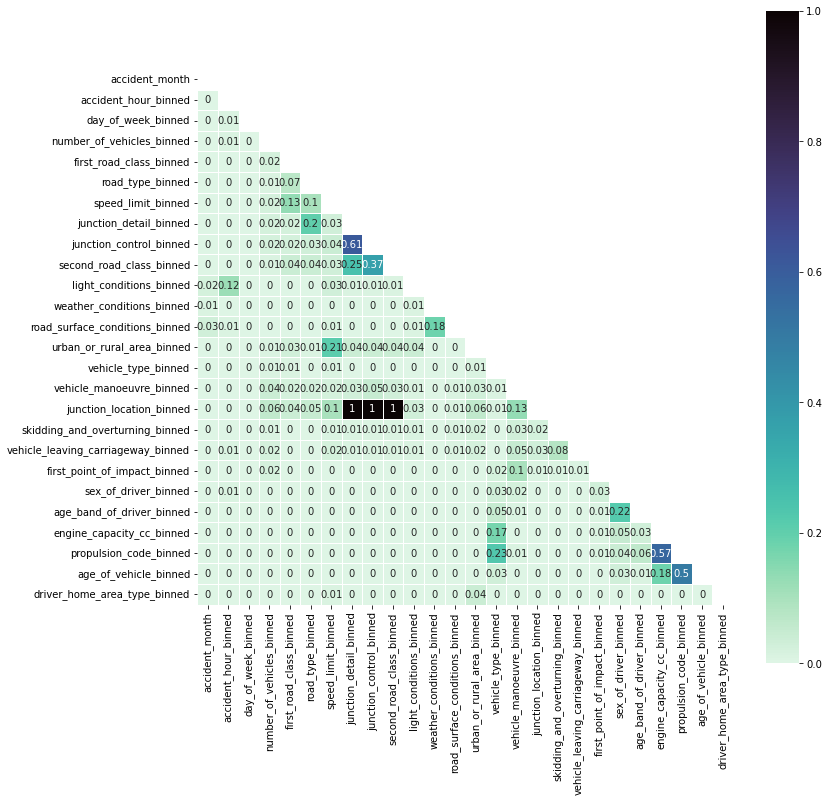

In [ ]:
#Build heatmap for Cramer's V correlation matrix
mask = np.zeros_like(df_cramersv, dtype=bool)
mask[np.triu_indices_from(mask)] = True

#with sns.axes_style("white"):
plt.figure(figsize=(12, 12))
sns.heatmap(df_cramersv, cmap = sns.cm.mako_r, vmin=0, vmax=1, square=True, mask=mask, linewidth=0.5, annot=True)

plt.show()

# Some Cramer's V values are >0.6. Therefore delete "junction_location_binned" and "junction_control_binned"

In [ ]:
# Delete highly correlated columns
df_vehacc3A = df_vehacc2A.copy()
df_vehacc3A.drop(["junction_location_binned","junction_control_binned"], inplace=True, axis=1)

In [ ]:
from sklearn import preprocessing

#Label encoding for df_vehacc3A with accident_fatality column
label = preprocessing.LabelEncoder()
data_encoded_fatality_3A = pd.DataFrame()

for i in df_vehacc3A.columns :
  data_encoded_fatality_3A[i]=label.fit_transform(df_vehacc3A[i])

#data_encoded_fatality_3A.head()

# Delete accident_fatality column in the encoded df for Cramer's V
data_encoded_3A = data_encoded_fatality_3A.drop(["accident_fatality"], axis=1)

data_encoded_3A.head()

,accident_month,accident_hour_binned,day_of_week_binned,number_of_vehicles_binned,first_road_class_binned,road_type_binned,speed_limit_binned,junction_detail_binned,second_road_class_binned,light_conditions_binned,...,vehicle_manoeuvre_binned,skidding_and_overturning_binned,vehicle_leaving_carriageway_binned,first_point_of_impact_binned,sex_of_driver_binned,age_band_of_driver_binned,engine_capacity_cc_binned,propulsion_code_binned,age_of_vehicle_binned,driver_home_area_type_binned
0,11,4,0,4,3,0,5,2,4,0,...,1,1,0,1,2,9,5,1,8,2
1,11,4,0,4,3,0,5,2,4,0,...,3,3,0,1,1,9,5,1,8,2
2,11,4,0,4,3,0,5,2,4,0,...,3,1,0,0,1,5,5,1,8,2
3,11,4,0,4,3,0,5,2,4,0,...,3,3,0,2,1,2,5,1,8,2
4,11,4,0,4,3,0,5,2,4,0,...,3,3,0,2,1,2,5,1,8,2


In [ ]:
# Check data type
data_encoded_3A.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4249887 entries, 0 to 4249886
Data columns (total 24 columns):
 #   Column                              Non-Null Count    Dtype
---  ------                              --------------    -----
 0   accident_month                      4249887 non-null  int64
 1   accident_hour_binned                4249887 non-null  int32
 2   day_of_week_binned                  4249887 non-null  int32
 3   number_of_vehicles_binned           4249887 non-null  int32
 4   first_road_class_binned             4249887 non-null  int32
 5   road_type_binned                    4249887 non-null  int32
 6   speed_limit_binned                  4249887 non-null  int32
 7   junction_detail_binned              4249887 non-null  int32
 8   second_road_class_binned            4249887 non-null  int32
 9   light_conditions_binned             4249887 non-null  int32
 10  weather_conditions_binned           4249887 non-null  int32
 11  road_surface_conditions_binned      4

In [ ]:
#Build Cramer's V correlation matrix
rows= []

for var1 in data_encoded_3A:
  col = []
  for var2 in data_encoded_3A:
    cramers =cramers_V(data_encoded_3A[var1], data_encoded_3A[var2]) # Cramer's V test
    col.append(round(cramers,2)) # Keeping of the rounded value of the Cramer's V
  rows.append(col)

cramers_results = np.array(rows)
df_cramersv = pd.DataFrame(cramers_results, columns = data_encoded_3A.columns, index =data_encoded_3A.columns)

#df_cramersv

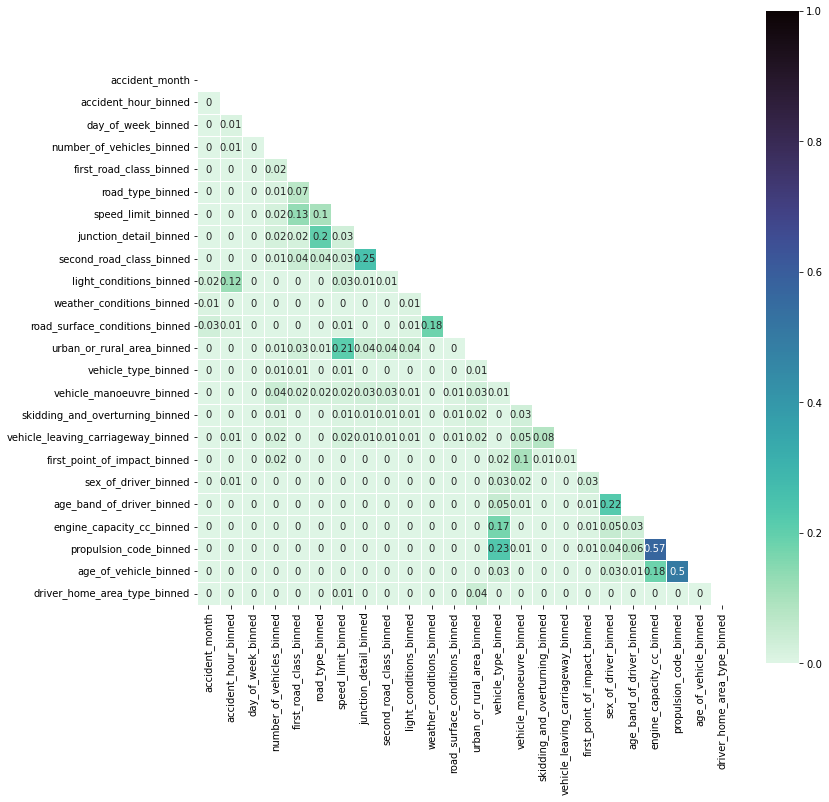

In [ ]:
#Build heatmap for Cramer's V correlation matrix
mask = np.zeros_like(df_cramersv, dtype=bool)
mask[np.triu_indices_from(mask)] = True

#with sns.axes_style("white"):
plt.figure(figsize=(12, 12))
sns.heatmap(df_cramersv, cmap = sns.cm.mako_r, vmin=0, vmax=1, square=True, mask=mask, linewidth=0.5, annot=True)

plt.show()

# Max Cramer's V value is 0.57 < 0.6. Therefore no strong correlation between attributes.

In [ ]:
# Save dataset
df_vehacc3A.to_csv("df_vehacc3A.csv", index=False, header=True)

# Check dimensions
print(df_vehacc3A.shape) # 4249887 rows, 25 cols

#df_vehacc3A.head

(4249887, 25)


In [ ]:
from sklearn import preprocessing

#Label encoding for df_vehacc2B with accident_fatality column
label = preprocessing.LabelEncoder()
data_encoded_fatality_2B = pd.DataFrame()

for i in df_vehacc2B.columns :
  data_encoded_fatality_2B[i]=label.fit_transform(df_vehacc2B[i])

#data_encoded_fatality_2B.head()

# Delete accident_fatality column in the encoded df for Cramer's V
data_encoded_2B = data_encoded_fatality_2B.drop(["accident_fatality"], axis=1)

#data_encoded_2B.head()

In [ ]:
# Check data type
#data_encoded_2B.info(verbose=True, show_counts=True)

In [ ]:
#Build Cramer's V correlation matrix
rows= []

for var1 in data_encoded_2B:
  col = []
  for var2 in data_encoded_2B:
    cramers =cramers_V(data_encoded_2B[var1], data_encoded_2B[var2]) # Cramer's V test
    col.append(round(cramers,2)) # Keeping of the rounded value of the Cramer's V
  rows.append(col)

cramers_results = np.array(rows)
df_cramersv = pd.DataFrame(cramers_results, columns = data_encoded_2B.columns, index =data_encoded_2B.columns)

#df_cramersv

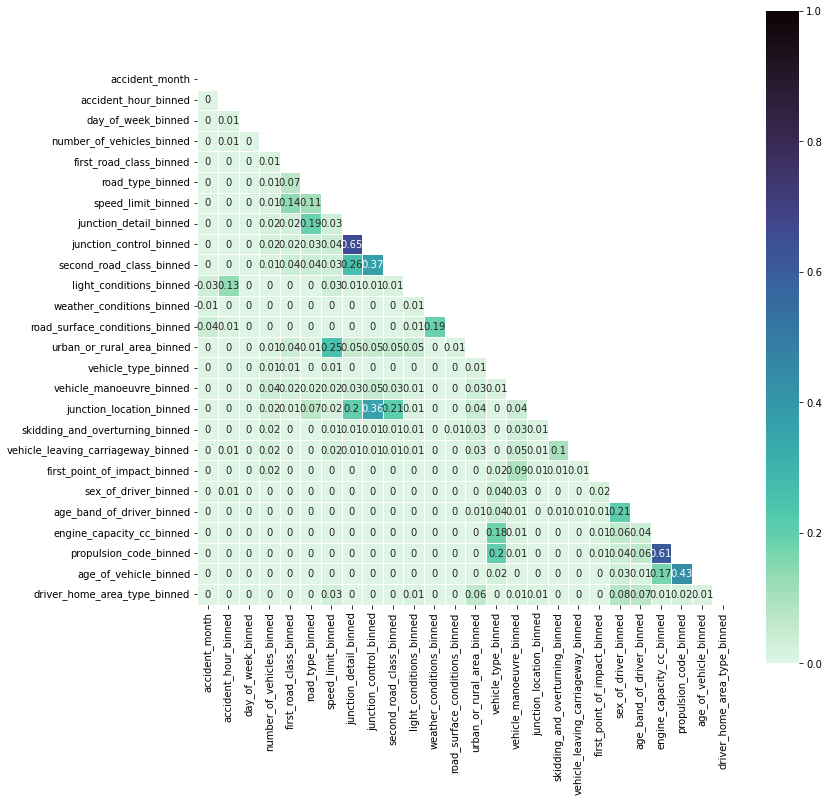

In [ ]:
#Build heatmap for Cramer's V correlation matrix
mask = np.zeros_like(df_cramersv, dtype=bool)
mask[np.triu_indices_from(mask)] = True

#with sns.axes_style("white"):
plt.figure(figsize=(12, 12))
sns.heatmap(df_cramersv, cmap = sns.cm.mako_r, vmin=0, vmax=1, square=True, mask=mask, linewidth=0.5, annot=True)

plt.show()

# Some Cramer's V values are >0.6. Therefore delete "propulsion_code_binned" and "junction_control_binned"

In [ ]:
# Delete highly correlated columns
df_vehacc3B = df_vehacc2B.copy()
df_vehacc3B.drop(["junction_control_binned","propulsion_code_binned"], inplace=True, axis=1)

In [ ]:
from sklearn import preprocessing

#Label encoding for df_vehacc3B with accident_fatality column
label = preprocessing.LabelEncoder()
data_encoded_fatality_3B = pd.DataFrame()

for i in df_vehacc3B.columns :
  data_encoded_fatality_3B[i]=label.fit_transform(df_vehacc3B[i])

#data_encoded_fatality_3B.head()

# Delete accident_fatality column in the encoded df for Cramer's V
data_encoded_3B = data_encoded_fatality_3B.drop(["accident_fatality"], axis=1)

#data_encoded_3B.head()

In [ ]:
# Check data type
#data_encoded_3B.info(verbose=True, show_counts=True)

In [ ]:
#Build Cramer's V correlation matrix
rows= []

for var1 in data_encoded_3B:
  col = []
  for var2 in data_encoded_3B:
    cramers =cramers_V(data_encoded_3B[var1], data_encoded_3B[var2]) # Cramer's V test
    col.append(round(cramers,2)) # Keeping of the rounded value of the Cramer's V
  rows.append(col)

cramers_results = np.array(rows)
df_cramersv = pd.DataFrame(cramers_results, columns = data_encoded_3B.columns, index =data_encoded_3B.columns)

#df_cramersv

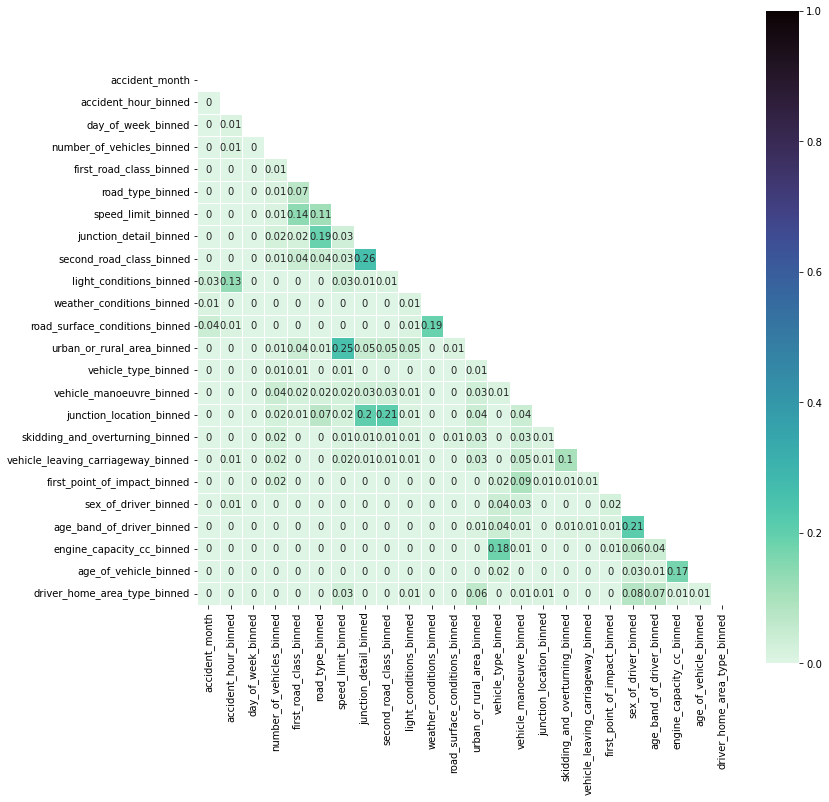

In [ ]:
#Build heatmap for Cramer's V correlation matrix
mask = np.zeros_like(df_cramersv, dtype=bool)
mask[np.triu_indices_from(mask)] = True

#with sns.axes_style("white"):
plt.figure(figsize=(12, 12))
sns.heatmap(df_cramersv, cmap = sns.cm.mako_r, vmin=0, vmax=1, square=True, mask=mask, linewidth=0.5, annot=True)

plt.show()

# Max Cramer's V value is 0.26 < 0.6. Therefore no strong correlation between attributes.

In [ ]:
# Save dataset
df_vehacc3B.to_csv("df_vehacc3B.csv", index=False, header=True)

# Check dimensions
print(df_vehacc3B.shape) # 3397300 rows, 25 cols

#df_vehacc3B.head

(3397300, 25)


In [ ]:
from sklearn import preprocessing

#Label encoding for df_vehacc2C with accident_fatality column
label = preprocessing.LabelEncoder()
data_encoded_fatality_2C = pd.DataFrame()

for i in df_vehacc2C.columns :
  data_encoded_fatality_2C[i]=label.fit_transform(df_vehacc2C[i])

#data_encoded_fatality_2C.head()

# Delete accident_fatality column in the encoded df for Cramer's V
data_encoded_2C = data_encoded_fatality_2C.drop(["accident_fatality"], axis=1)

#data_encoded_2C.head()

In [ ]:
# Check data type
#data_encoded_2C.info(verbose=True, show_counts=True)

In [ ]:
#Build Cramer's V correlation matrix
rows= []

for var1 in data_encoded_2C:
  col = []
  for var2 in data_encoded_2C:
    cramers =cramers_V(data_encoded_2C[var1], data_encoded_2C[var2]) # Cramer's V test
    col.append(round(cramers,2)) # Keeping of the rounded value of the Cramer's V
  rows.append(col)

cramers_results = np.array(rows)
df_cramersv = pd.DataFrame(cramers_results, columns = data_encoded_2C.columns, index =data_encoded_2C.columns)

#df_cramersv

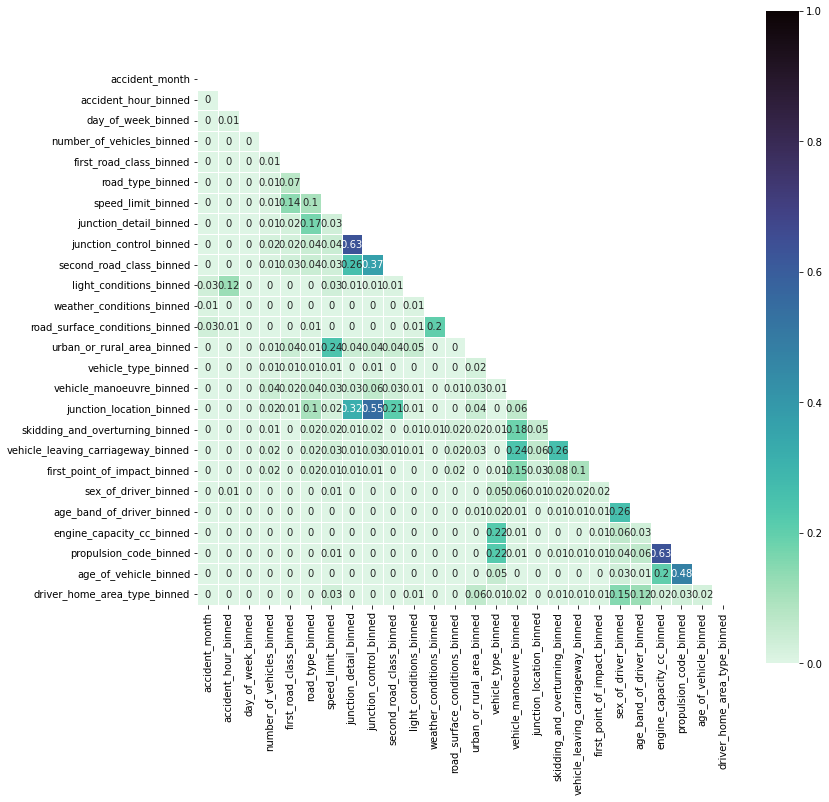

In [ ]:
#Build heatmap for Cramer's V correlation matrix
mask = np.zeros_like(df_cramersv, dtype=bool)
mask[np.triu_indices_from(mask)] = True

#with sns.axes_style("white"):
plt.figure(figsize=(12, 12))
sns.heatmap(df_cramersv, cmap = sns.cm.mako_r, vmin=0, vmax=1, square=True, mask=mask, linewidth=0.5, annot=True)

plt.show()

# Some Cramer's V values are >0.6. Therefore delete "propulsion_code_binned" and "junction_control_binned"

In [ ]:
# Delete highly correlated columns
df_vehacc3C = df_vehacc2C.copy()
df_vehacc3C.drop(["junction_control_binned","propulsion_code_binned"], inplace=True, axis=1)

In [ ]:
from sklearn import preprocessing

#Label encoding for df_vehacc3C with accident_fatality column
label = preprocessing.LabelEncoder()
data_encoded_fatality_3C = pd.DataFrame()

for i in df_vehacc3C.columns :
  data_encoded_fatality_3C[i]=label.fit_transform(df_vehacc3C[i])

#data_encoded_fatality_3C.head()

# Delete accident_fatality column in the encoded df for Cramer's V
data_encoded_3C = data_encoded_fatality_3C.drop(["accident_fatality"], axis=1)

#data_encoded_3C.head()

In [ ]:
# Check data type
#data_encoded_3C.info(verbose=True, show_counts=True)

In [ ]:
#Build Cramer's V correlation matrix
rows= []

for var1 in data_encoded_3C:
  col = []
  for var2 in data_encoded_3C:
    cramers =cramers_V(data_encoded_3C[var1], data_encoded_3C[var2]) # Cramer's V test
    col.append(round(cramers,2)) # Keeping of the rounded value of the Cramer's V
  rows.append(col)

cramers_results = np.array(rows)
df_cramersv = pd.DataFrame(cramers_results, columns = data_encoded_3C.columns, index =data_encoded_3C.columns)

#df_cramersv

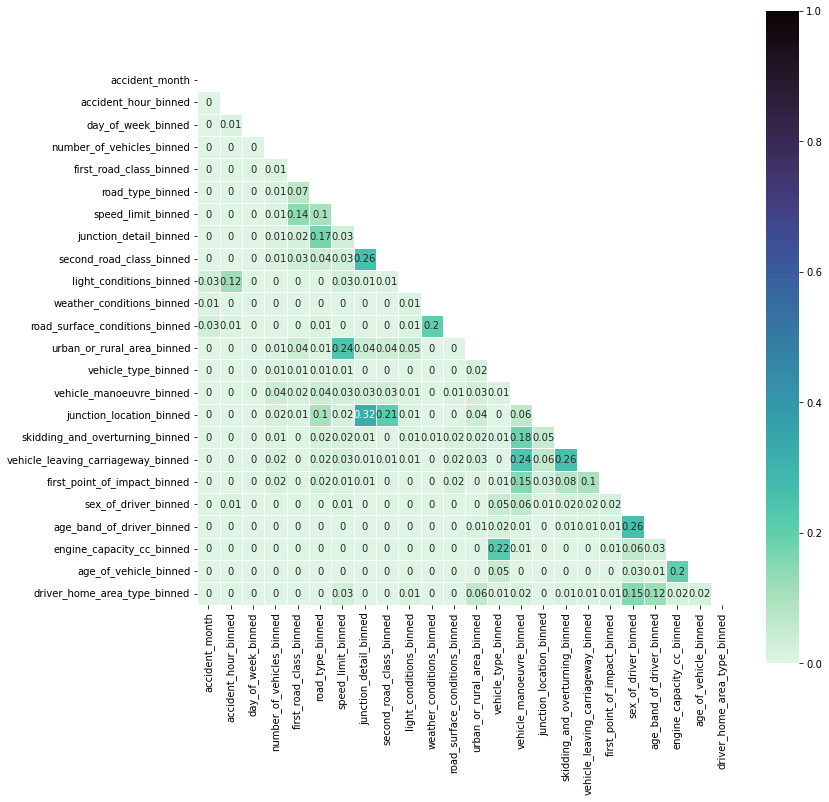

In [ ]:
#Build heatmap for Cramer's V correlation matrix
mask = np.zeros_like(df_cramersv, dtype=bool)
mask[np.triu_indices_from(mask)] = True

#with sns.axes_style("white"):
plt.figure(figsize=(12, 12))
sns.heatmap(df_cramersv, cmap = sns.cm.mako_r, vmin=0, vmax=1, square=True, mask=mask, linewidth=0.5, annot=True)

plt.show()

# Max Cramer's V value is 0.32 < 0.6. Therefore no strong correlation between attributes.

In [ ]:
# Save dataset
df_vehacc3C.to_csv("df_vehacc3C.csv", index=False, header=True)

# Check dimensions
print(df_vehacc3C.shape) # 2333196 rows, 25 cols

#df_vehacc3C.head

(2333196, 25)


## Label Encoding

In [ ]:
# Read csv files
df_vehacc3A = pd.read_csv("df_vehacc3A.csv", low_memory=False)
df_vehacc3B = pd.read_csv("df_vehacc3B.csv", low_memory=False)
df_vehacc3C = pd.read_csv("df_vehacc3C.csv", low_memory=False)

In [ ]:
pd.set_option('display.max_columns',None)

In [ ]:
from sklearn import preprocessing

#Label encoding for df_vehacc3A with accident_fatality column
le = preprocessing.LabelEncoder()
df_vehacc3A_le = pd.DataFrame()

for i in df_vehacc3A.columns :
  df_vehacc3A_le[i]=le.fit_transform(df_vehacc3A[i])

# Check dimensions
print(df_vehacc3A_le.shape) # 4249887 rows, 25 cols

df_vehacc3A_le.head()

(4249887, 25)


,accident_month,accident_hour_binned,day_of_week_binned,number_of_vehicles_binned,first_road_class_binned,road_type_binned,speed_limit_binned,junction_detail_binned,second_road_class_binned,light_conditions_binned,weather_conditions_binned,road_surface_conditions_binned,urban_or_rural_area_binned,accident_fatality,vehicle_type_binned,vehicle_manoeuvre_binned,skidding_and_overturning_binned,vehicle_leaving_carriageway_binned,first_point_of_impact_binned,sex_of_driver_binned,age_band_of_driver_binned,engine_capacity_cc_binned,propulsion_code_binned,age_of_vehicle_binned,driver_home_area_type_binned
0,11,4,0,4,3,0,5,2,4,0,0,4,1,0,2,1,1,0,1,2,9,5,1,8,2
1,11,4,0,4,3,0,5,2,4,0,0,4,1,0,1,3,3,0,1,1,9,5,1,8,2
2,11,4,0,4,3,0,5,2,4,0,0,4,1,0,1,3,1,0,0,1,5,5,1,8,2
3,11,4,0,4,3,0,5,2,4,0,0,4,1,0,1,3,3,0,2,1,2,5,1,8,2
4,11,4,0,4,3,0,5,2,4,0,0,4,1,0,1,3,3,0,2,1,2,5,1,8,2


In [ ]:
# Check data type
#df_vehacc3A_le.info(verbose=True, show_counts=True)

In [ ]:
# Label mapping (example)
le.fit(df_vehacc3A['accident_fatality'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{0: 0, 1: 1}

In [ ]:
# Extract target vector from df
y_vehacc3A_le = df_vehacc3A_le.loc[:,'accident_fatality']
#y_vehacc3A_le.head()

In [ ]:
# Extract feature matrix from le df
X_vehacc3A_le = df_vehacc3A_le.drop(["accident_fatality"], axis=1)
#X_vehacc3A_le.head()

In [ ]:
# Check dimensions
print(X_vehacc3A_le.shape) # 4249887 rows, 24 cols

X_vehacc3A_le.head()

(4249887, 24)


,accident_month,accident_hour_binned,day_of_week_binned,number_of_vehicles_binned,first_road_class_binned,road_type_binned,speed_limit_binned,junction_detail_binned,second_road_class_binned,light_conditions_binned,...,vehicle_manoeuvre_binned,skidding_and_overturning_binned,vehicle_leaving_carriageway_binned,first_point_of_impact_binned,sex_of_driver_binned,age_band_of_driver_binned,engine_capacity_cc_binned,propulsion_code_binned,age_of_vehicle_binned,driver_home_area_type_binned
0,11,4,0,4,3,0,5,2,4,0,...,1,1,0,1,2,9,5,1,8,2
1,11,4,0,4,3,0,5,2,4,0,...,3,3,0,1,1,9,5,1,8,2
2,11,4,0,4,3,0,5,2,4,0,...,3,1,0,0,1,5,5,1,8,2
3,11,4,0,4,3,0,5,2,4,0,...,3,3,0,2,1,2,5,1,8,2
4,11,4,0,4,3,0,5,2,4,0,...,3,3,0,2,1,2,5,1,8,2


In [ ]:
# Check dimensions
print(y_vehacc3A_le.shape) # 4249887 rows, 1 col

y_vehacc3A_le.head()

(4249887,)


0    0
1    0
2    0
3    0
4    0
Name: accident_fatality, dtype: int64

In [ ]:
# Count number of non-fatal and fatal
y_vehacc3A_le.value_counts()
# Total 4249887
# Non-fatal 4192117 98.64%
# Fatal 57770 1.36%

0    4192117
1      57770
Name: accident_fatality, dtype: int64

In [ ]:
# concatenate horizontally, use reset_index(drop=True) to convert the index of both df to default
df_vehacc3A_le = pd.concat([X_vehacc3A_le.reset_index(drop=True), y_vehacc3A_le.reset_index(drop=True)], axis=1)

# Save the dataset
df_vehacc3A_le.to_csv("df_vehacc3A_le.csv", index=False, header=True)

df_vehacc3A_le.head()

,accident_month,accident_hour_binned,day_of_week_binned,number_of_vehicles_binned,first_road_class_binned,road_type_binned,speed_limit_binned,junction_detail_binned,second_road_class_binned,light_conditions_binned,...,skidding_and_overturning_binned,vehicle_leaving_carriageway_binned,first_point_of_impact_binned,sex_of_driver_binned,age_band_of_driver_binned,engine_capacity_cc_binned,propulsion_code_binned,age_of_vehicle_binned,driver_home_area_type_binned,accident_fatality
0,11,4,0,4,3,0,5,2,4,0,...,1,0,1,2,9,5,1,8,2,0
1,11,4,0,4,3,0,5,2,4,0,...,3,0,1,1,9,5,1,8,2,0
2,11,4,0,4,3,0,5,2,4,0,...,1,0,0,1,5,5,1,8,2,0
3,11,4,0,4,3,0,5,2,4,0,...,3,0,2,1,2,5,1,8,2,0
4,11,4,0,4,3,0,5,2,4,0,...,3,0,2,1,2,5,1,8,2,0


In [ ]:
# define dataset
array_vehacc3A = df_vehacc3A_le.to_numpy()
cols = len(df_vehacc3A_le.axes[1])

X_vehacc3A = array_vehacc3A[:, 0:(cols-1)]
y_vehacc3A = array_vehacc3A[:, (cols-1)]

print(array_vehacc3A.shape)
print(X_vehacc3A.shape)
print(y_vehacc3A.shape)

(4249887, 25)
(4249887, 24)
(4249887,)


In [ ]:
# Save dataset
X_vehacc3A_le.to_csv("X_vehacc3A_le.csv", index=False, header=True)
y_vehacc3A_le.to_csv("y_vehacc3A_le.csv", index=False, header=True)

In [ ]:
#Label encoding for df_vehacc3B with accident_fatality column
le = preprocessing.LabelEncoder()
df_vehacc3B_le = pd.DataFrame()

for i in df_vehacc3B.columns :
  df_vehacc3B_le[i]=le.fit_transform(df_vehacc3B[i])

# Check dimensions
print(df_vehacc3B_le.shape) # 3397300 rows, 25 cols

df_vehacc3B_le.head()

(3397300, 25)


,accident_month,accident_hour_binned,day_of_week_binned,number_of_vehicles_binned,first_road_class_binned,road_type_binned,speed_limit_binned,junction_detail_binned,second_road_class_binned,light_conditions_binned,weather_conditions_binned,road_surface_conditions_binned,urban_or_rural_area_binned,accident_fatality,vehicle_type_binned,vehicle_manoeuvre_binned,junction_location_binned,skidding_and_overturning_binned,vehicle_leaving_carriageway_binned,first_point_of_impact_binned,sex_of_driver_binned,age_band_of_driver_binned,engine_capacity_cc_binned,age_of_vehicle_binned,driver_home_area_type_binned
0,0,3,5,1,0,3,1,2,4,3,0,4,2,0,1,14,8,1,0,4,1,3,5,8,3
1,0,3,5,1,0,3,1,2,4,3,0,4,2,0,1,3,8,1,0,2,1,3,5,8,2
2,0,8,5,1,0,3,1,6,0,0,3,4,2,0,1,11,9,1,0,2,1,5,5,8,2
3,0,8,5,1,0,3,1,6,0,0,3,4,2,0,1,3,9,1,0,2,1,4,4,4,3
4,0,3,6,0,4,3,1,6,5,3,0,1,2,0,3,11,9,1,0,2,1,3,5,8,3


In [ ]:
# Extract target vector from df
y_vehacc3B_le = df_vehacc3B_le.loc[:,'accident_fatality']
#y_vehacc3B_le.head()

In [ ]:
# Extract feature matrix from le df
X_vehacc3B_le = df_vehacc3B_le.drop(["accident_fatality"], axis=1)
#X_vehacc3B_le.head()

In [ ]:
# Check dimensions
print(X_vehacc3B_le.shape) # 3397300 rows, 24 cols

X_vehacc3B_le.head()

(3397300, 24)


,accident_month,accident_hour_binned,day_of_week_binned,number_of_vehicles_binned,first_road_class_binned,road_type_binned,speed_limit_binned,junction_detail_binned,second_road_class_binned,light_conditions_binned,...,vehicle_manoeuvre_binned,junction_location_binned,skidding_and_overturning_binned,vehicle_leaving_carriageway_binned,first_point_of_impact_binned,sex_of_driver_binned,age_band_of_driver_binned,engine_capacity_cc_binned,age_of_vehicle_binned,driver_home_area_type_binned
0,0,3,5,1,0,3,1,2,4,3,...,14,8,1,0,4,1,3,5,8,3
1,0,3,5,1,0,3,1,2,4,3,...,3,8,1,0,2,1,3,5,8,2
2,0,8,5,1,0,3,1,6,0,0,...,11,9,1,0,2,1,5,5,8,2
3,0,8,5,1,0,3,1,6,0,0,...,3,9,1,0,2,1,4,4,4,3
4,0,3,6,0,4,3,1,6,5,3,...,11,9,1,0,2,1,3,5,8,3


In [ ]:
# Check dimensions
print(y_vehacc3B_le.shape) # 3397300 rows, 1 col

y_vehacc3B_le.head()

(3397300,)


0    0
1    0
2    0
3    0
4    0
Name: accident_fatality, dtype: int64

In [ ]:
# Count number of non-fatal and fatal
y_vehacc3B_le.value_counts()
# Total 3397300
# Non-fatal 3351139 98.64%
# Fatal 46161 1.36%

0    3351139
1      46161
Name: accident_fatality, dtype: int64

In [ ]:
# concatenate horizontally, use reset_index(drop=True) to convert the index of both df to default
df_vehacc3B_le = pd.concat([X_vehacc3B_le.reset_index(drop=True), y_vehacc3B_le.reset_index(drop=True)], axis=1)

# Save the dataset
df_vehacc3B_le.to_csv("df_vehacc3B_le.csv", index=False, header=True)

df_vehacc3B_le.head()

,accident_month,accident_hour_binned,day_of_week_binned,number_of_vehicles_binned,first_road_class_binned,road_type_binned,speed_limit_binned,junction_detail_binned,second_road_class_binned,light_conditions_binned,...,junction_location_binned,skidding_and_overturning_binned,vehicle_leaving_carriageway_binned,first_point_of_impact_binned,sex_of_driver_binned,age_band_of_driver_binned,engine_capacity_cc_binned,age_of_vehicle_binned,driver_home_area_type_binned,accident_fatality
0,0,3,5,1,0,3,1,2,4,3,...,8,1,0,4,1,3,5,8,3,0
1,0,3,5,1,0,3,1,2,4,3,...,8,1,0,2,1,3,5,8,2,0
2,0,8,5,1,0,3,1,6,0,0,...,9,1,0,2,1,5,5,8,2,0
3,0,8,5,1,0,3,1,6,0,0,...,9,1,0,2,1,4,4,4,3,0
4,0,3,6,0,4,3,1,6,5,3,...,9,1,0,2,1,3,5,8,3,0


In [ ]:
# define dataset
array_vehacc3B = df_vehacc3B_le.to_numpy()
cols = len(df_vehacc3B_le.axes[1])

X_vehacc3B = array_vehacc3B[:, 0:(cols-1)]
y_vehacc3B = array_vehacc3B[:, (cols-1)]

print(array_vehacc3B.shape)
print(X_vehacc3B.shape)
print(y_vehacc3B.shape)

(3397300, 25)
(3397300, 24)
(3397300,)


In [ ]:
# Save dataset
X_vehacc3B_le.to_csv("X_vehacc3B_le.csv", index=False, header=True)
y_vehacc3B_le.to_csv("y_vehacc3B_le.csv", index=False, header=True)

In [ ]:
#Label encoding for df_vehacc3C with accident_fatality column
le = preprocessing.LabelEncoder()
df_vehacc3C_le = pd.DataFrame()

for i in df_vehacc3C.columns :
  df_vehacc3C_le[i]=le.fit_transform(df_vehacc3C[i])

# Check dimensions
print(df_vehacc3C_le.shape) # 2333196 rows, 25 cols

df_vehacc3C_le.head()

(2333196, 25)


,accident_month,accident_hour_binned,day_of_week_binned,number_of_vehicles_binned,first_road_class_binned,road_type_binned,speed_limit_binned,junction_detail_binned,second_road_class_binned,light_conditions_binned,weather_conditions_binned,road_surface_conditions_binned,urban_or_rural_area_binned,accident_fatality,vehicle_type_binned,vehicle_manoeuvre_binned,junction_location_binned,skidding_and_overturning_binned,vehicle_leaving_carriageway_binned,first_point_of_impact_binned,sex_of_driver_binned,age_band_of_driver_binned,engine_capacity_cc_binned,age_of_vehicle_binned,driver_home_area_type_binned
0,0,6,4,1,0,3,1,0,2,0,0,0,2,0,1,13,7,1,0,3,0,0,1,5,3
1,0,6,4,1,0,3,1,0,2,0,0,0,2,0,5,3,7,1,0,2,1,3,5,8,3
2,0,4,6,1,1,3,1,6,5,0,0,0,2,0,1,3,7,1,0,1,2,9,5,8,2
3,0,4,6,1,1,3,1,6,5,0,0,0,2,0,5,3,7,1,0,1,1,0,5,8,3
4,0,1,5,1,0,1,1,0,5,3,0,0,2,0,1,3,7,1,0,2,0,5,2,7,3


In [ ]:
# Extract target vector from df
y_vehacc3C_le = df_vehacc3C_le.loc[:,'accident_fatality']
#y_vehacc3C_le.head()

In [ ]:
# Extract feature matrix from le df
X_vehacc3C_le = df_vehacc3C_le.drop(["accident_fatality"], axis=1)
#X_vehacc3C_le.head()

In [ ]:
# Check dimensions
print(X_vehacc3C_le.shape) # 2333196 rows, 24 cols

X_vehacc3C_le.head()

(2333196, 24)


,accident_month,accident_hour_binned,day_of_week_binned,number_of_vehicles_binned,first_road_class_binned,road_type_binned,speed_limit_binned,junction_detail_binned,second_road_class_binned,light_conditions_binned,...,vehicle_manoeuvre_binned,junction_location_binned,skidding_and_overturning_binned,vehicle_leaving_carriageway_binned,first_point_of_impact_binned,sex_of_driver_binned,age_band_of_driver_binned,engine_capacity_cc_binned,age_of_vehicle_binned,driver_home_area_type_binned
0,0,6,4,1,0,3,1,0,2,0,...,13,7,1,0,3,0,0,1,5,3
1,0,6,4,1,0,3,1,0,2,0,...,3,7,1,0,2,1,3,5,8,3
2,0,4,6,1,1,3,1,6,5,0,...,3,7,1,0,1,2,9,5,8,2
3,0,4,6,1,1,3,1,6,5,0,...,3,7,1,0,1,1,0,5,8,3
4,0,1,5,1,0,1,1,0,5,3,...,3,7,1,0,2,0,5,2,7,3


In [ ]:
# Check dimensions
print(y_vehacc3C_le.shape) # 2333196 rows, 1 col

y_vehacc3C_le.head()

(2333196,)


0    0
1    0
2    0
3    0
4    0
Name: accident_fatality, dtype: int64

In [ ]:
# Count number of non-fatal and fatal
y_vehacc3C_le.value_counts()
# Total 2333196
# Non-fatal 2304706 98.78%
# Fatal 28490 1.22%

0    2304706
1      28490
Name: accident_fatality, dtype: int64

In [ ]:
# concatenate horizontally, use reset_index(drop=True) to convert the index of both df to default
df_vehacc3C_le = pd.concat([X_vehacc3C_le.reset_index(drop=True), y_vehacc3C_le.reset_index(drop=True)], axis=1)

# Save the dataset
df_vehacc3C_le.to_csv("df_vehacc3C_le.csv", index=False, header=True)

df_vehacc3C_le.head()

,accident_month,accident_hour_binned,day_of_week_binned,number_of_vehicles_binned,first_road_class_binned,road_type_binned,speed_limit_binned,junction_detail_binned,second_road_class_binned,light_conditions_binned,...,junction_location_binned,skidding_and_overturning_binned,vehicle_leaving_carriageway_binned,first_point_of_impact_binned,sex_of_driver_binned,age_band_of_driver_binned,engine_capacity_cc_binned,age_of_vehicle_binned,driver_home_area_type_binned,accident_fatality
0,0,6,4,1,0,3,1,0,2,0,...,7,1,0,3,0,0,1,5,3,0
1,0,6,4,1,0,3,1,0,2,0,...,7,1,0,2,1,3,5,8,3,0
2,0,4,6,1,1,3,1,6,5,0,...,7,1,0,1,2,9,5,8,2,0
3,0,4,6,1,1,3,1,6,5,0,...,7,1,0,1,1,0,5,8,3,0
4,0,1,5,1,0,1,1,0,5,3,...,7,1,0,2,0,5,2,7,3,0


In [ ]:
# define dataset
array_vehacc3C = df_vehacc3C_le.to_numpy()
cols = len(df_vehacc3C_le.axes[1])

X_vehacc3C = array_vehacc3C[:, 0:(cols-1)]
y_vehacc3C = array_vehacc3C[:, (cols-1)]

print(array_vehacc3C.shape)
print(X_vehacc3C.shape)
print(y_vehacc3C.shape)

(2333196, 25)
(2333196, 24)
(2333196,)


In [ ]:
# Save dataset
X_vehacc3C_le.to_csv("X_vehacc3C_le.csv", index=False, header=True)
y_vehacc3C_le.to_csv("y_vehacc3C_le.csv", index=False, header=True)

## Mounting on Google Drive

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Read csv files
X_vehacc3A_le = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Research Project/X_vehacc3A_le.csv", low_memory=False)
y_vehacc3A_le = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Research Project/y_vehacc3A_le.csv", low_memory=False)

In [ ]:
# Read csv files
X_vehacc3B_le = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Research Project/X_vehacc3B_le.csv", low_memory=False)
y_vehacc3B_le = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Research Project/y_vehacc3B_le.csv", low_memory=False)

In [3]:
# Read csv files
X_vehacc3C_le = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Research Project/X_vehacc3C_le.csv", low_memory=False)
y_vehacc3C_le = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Research Project/y_vehacc3C_le.csv", low_memory=False)

## Modelling

### Combined Function for Stratified 5-Fold Cross Validation, Confusion Matrix, AUC-ROC - All Folds

In [ ]:
# Combining two functions
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score

# define repeated stratified k-fold CV
# stratified is to ensure the training and testing dataset in each fold reflecting the actual imbalanced distribution
# Fatality 'no' : Fatality 'yes' (3A) = 98.64% : 1.36%
# Fatality 'no' : Fatality 'yes' (3B) = 98.64% : 1.36%
# Fatality 'no' : Fatality 'yes' (3C) = 98.78% : 1.22%

# 1 iteration, 5 folds, seed=816
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=816)

import copy as cp
from typing import Tuple
from sklearn.metrics import confusion_matrix
import matplotlib.pylab as pl
from numpy import interp
from sklearn.metrics import roc_curve, auc
import matplotlib.patches as patches

# confusion matrix
# generate the predicted and actual

def cross_val_predict(model, cv:RepeatedStratifiedKFold, X:np.array, y:np.array) -> Tuple[np.array, np.array, np.array]:
#def cross_val_predict(model, cv:RepeatedKFold, X:np.array, y:np.array) -> Tuple[np.array, np.array, np.array]:

    model_ = cp.deepcopy(model) # copy the model to avoid overwriting

    no_classes = len(np.unique(y)) # get the number of classes. For binary classification, no_classes=2.

    actual_classes = np.empty([0], dtype=int)
    predicted_classes = np.empty([0], dtype=int)
    predicted_proba = np.empty([0, no_classes])
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0,1,100)

    # plot arrows
    fig1 = pl.figure(figsize=[12,12])
    ax1 = fig1.add_subplot(111,aspect = 'equal')

    for train_ndx, test_ndx in cv.split(X,y):

        train_X, train_y, test_X, test_y = X.values[train_ndx], y.values[train_ndx], X.values[test_ndx], y.values[test_ndx]

        actual_classes = np.append(actual_classes, test_y) # append the actual target classification to actual_classes

        model_.fit(train_X, train_y) # fit the model using training dataset from the current fold

        prediction = model_.predict_proba(test_X)
        fpr, tpr, t = roc_curve(test_y, prediction[:, 1])

        # predict the target application for test data in current fold and append
        predicted_classes = np.append(predicted_classes, model_.predict(test_X))

        try:
            predicted_proba = np.append(predicted_proba, model_.predict_proba(test_X), axis=0)

        except:
            predicted_proba = np.append(predicted_proba, np.zeros((len(test_X), no_classes), dtype=float), axis=0)

        tprs.append(interp(mean_fpr, fpr, tpr))
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)
        pl.plot(fpr, tpr, lw=2, alpha=0.3)

    pl.plot([0,1],[0,1],linestyle = '--',lw = 2,color = 'black')
    mean_tpr = np.mean(tprs, axis=0)
    mean_auc = auc(mean_fpr, mean_tpr)
    pl.plot(mean_fpr, mean_tpr, color='blue',
             label=r'Mean ROC (AUC = %0.4f )' % (mean_auc),lw=2, alpha=1)

    pl.xlabel('False Positive Rate')
    pl.ylabel('True Positive Rate')
    pl.title('ROC')
    pl.legend(loc="lower right")
    pl.text(0.32,0.7,'More accurate area',fontsize = 12)
    pl.text(0.63,0.4,'Less accurate area',fontsize = 12)
    pl.show()

    return actual_classes, predicted_classes, model_.named_steps['model']

# visualize confusion matrix
def plot_confusion_matrix(actual_classes:np.array, predicted_classes:np.array, sorted_labels:list):

    matrix = confusion_matrix(actual_classes, predicted_classes, labels=sorted_labels)

    plt.figure(figsize=(12.8, 6))
    sns.heatmap(matrix, annot=True, xticklabels=['Fatal','Not Fatal'], yticklabels=['Fatal','Not Fatal'], cmap="Blues", fmt=".8g")
    plt.xlabel('Predicted'); plt.ylabel('Actual'); plt.title('Confusion Matrix')

    plt.show()

### Combined Function for Stratified 5-Fold Cross Validation, Confusion Matrix, AUC-ROC - Fold 1

In [ ]:
# Combining two functions
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score

# define repeated stratified k-fold CV
# stratified is to ensure the training and testing dataset in each fold reflecting the actual imbalanced distribution
# Fatality 'no' : Fatality 'yes' (3A) = 98.64% : 1.36%
# Fatality 'no' : Fatality 'yes' (3B) = 98.64% : 1.36%
# Fatality 'no' : Fatality 'yes' (3C) = 98.78% : 1.22%

# 1 iteration, 5 folds, seed=816
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=816)

import copy as cp
from typing import Tuple
from sklearn.metrics import confusion_matrix
import matplotlib.pylab as pl
from numpy import interp
from sklearn.metrics import roc_curve, auc
import matplotlib.patches as patches

# confusion matrix
# generate the predicted and actual

def cross_val_predict(model, cv:RepeatedStratifiedKFold, X:np.array, y:np.array) -> Tuple[np.array, np.array, np.array]:
#def cross_val_predict(model, cv:RepeatedKFold, X:np.array, y:np.array) -> Tuple[np.array, np.array, np.array]:

    model_ = cp.deepcopy(model) # copy the model to avoid overwriting

    no_classes = len(np.unique(y)) # get the number of classes. For binary classification, no_classes=2.

    actual_classes = np.empty([0], dtype=int)
    predicted_classes = np.empty([0], dtype=int)
    predicted_proba = np.empty([0, no_classes])
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0,1,100)

    # plot arrows
    fig1 = pl.figure(figsize=[12,12])
    ax1 = fig1.add_subplot(111,aspect = 'equal')

    #for train_ndx, test_ndx in cv.split(X,y):

    train_ndx, test_ndx = list(cv.split(X,y))[0]

    train_X, train_y, test_X, test_y = X.values[train_ndx], y.values[train_ndx], X.values[test_ndx], y.values[test_ndx]

    actual_classes = np.append(actual_classes, test_y) # append the actual target classification to actual_classes

    model_.fit(train_X, train_y) # fit the model using training dataset from the current fold

    prediction = model_.predict_proba(test_X)
    fpr, tpr, t = roc_curve(test_y, prediction[:, 1])

    # predict the target application for test data in current fold and append
    predicted_classes = np.append(predicted_classes, model_.predict(test_X))

    try:
        predicted_proba = np.append(predicted_proba, model_.predict_proba(test_X), axis=0)

    except:
        predicted_proba = np.append(predicted_proba, np.zeros((len(test_X), no_classes), dtype=float), axis=0)

    tprs.append(interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    pl.plot(fpr, tpr, lw=2, alpha=0.3)

    pl.plot([0,1],[0,1],linestyle = '--',lw = 2,color = 'black')
    mean_tpr = np.mean(tprs, axis=0)
    mean_auc = auc(mean_fpr, mean_tpr)
    pl.plot(mean_fpr, mean_tpr, color='blue',
             label=r'Mean ROC (AUC = %0.4f )' % (mean_auc),lw=2, alpha=1)

    pl.xlabel('False Positive Rate')
    pl.ylabel('True Positive Rate')
    pl.title('ROC')
    pl.legend(loc="lower right")
    pl.text(0.32,0.7,'More accurate area',fontsize = 12)
    pl.text(0.63,0.4,'Less accurate area',fontsize = 12)
    pl.show()

    return actual_classes, predicted_classes, model_.named_steps['model']

# visualize confusion matrix
def plot_confusion_matrix(actual_classes:np.array, predicted_classes:np.array, sorted_labels:list):

    matrix = confusion_matrix(actual_classes, predicted_classes, labels=sorted_labels)

    plt.figure(figsize=(12.8, 6))
    sns.heatmap(matrix, annot=True, xticklabels=['Fatal','Not Fatal'], yticklabels=['Fatal','Not Fatal'], cmap="Blues", fmt=".8g")
    plt.xlabel('Predicted'); plt.ylabel('Actual'); plt.title('Confusion Matrix')

    plt.show()

### Combined Function for Stratified 5-Fold Cross Validation, Confusion Matrix, AUC-ROC - Fold 2

In [ ]:
# Combining two functions
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score

# define repeated stratified k-fold CV
# stratified is to ensure the training and testing dataset in each fold reflecting the actual imbalanced distribution
# Fatality 'no' : Fatality 'yes' (3A) = 98.64% : 1.36%
# Fatality 'no' : Fatality 'yes' (3B) = 98.64% : 1.36%
# Fatality 'no' : Fatality 'yes' (3C) = 98.78% : 1.22%

# 1 iteration, 5 folds, seed=816
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=816)

import copy as cp
from typing import Tuple
from sklearn.metrics import confusion_matrix
import matplotlib.pylab as pl
from numpy import interp
from sklearn.metrics import roc_curve, auc
import matplotlib.patches as patches

# confusion matrix
# generate the predicted and actual

def cross_val_predict(model, cv:RepeatedStratifiedKFold, X:np.array, y:np.array) -> Tuple[np.array, np.array, np.array]:
#def cross_val_predict(model, cv:RepeatedKFold, X:np.array, y:np.array) -> Tuple[np.array, np.array, np.array]:

    model_ = cp.deepcopy(model) # copy the model to avoid overwriting

    no_classes = len(np.unique(y)) # get the number of classes. For binary classification, no_classes=2.

    actual_classes = np.empty([0], dtype=int)
    predicted_classes = np.empty([0], dtype=int)
    predicted_proba = np.empty([0, no_classes])
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0,1,100)

    # plot arrows
    fig1 = pl.figure(figsize=[12,12])
    ax1 = fig1.add_subplot(111,aspect = 'equal')

    #for train_ndx, test_ndx in cv.split(X,y):

    train_ndx, test_ndx = list(cv.split(X,y))[1]

    train_X, train_y, test_X, test_y = X.values[train_ndx], y.values[train_ndx], X.values[test_ndx], y.values[test_ndx]

    actual_classes = np.append(actual_classes, test_y) # append the actual target classification to actual_classes

    model_.fit(train_X, train_y) # fit the model using training dataset from the current fold

    prediction = model_.predict_proba(test_X)
    fpr, tpr, t = roc_curve(test_y, prediction[:, 1])

    # predict the target application for test data in current fold and append
    predicted_classes = np.append(predicted_classes, model_.predict(test_X))

    try:
        predicted_proba = np.append(predicted_proba, model_.predict_proba(test_X), axis=0)

    except:
        predicted_proba = np.append(predicted_proba, np.zeros((len(test_X), no_classes), dtype=float), axis=0)

    tprs.append(interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    pl.plot(fpr, tpr, lw=2, alpha=0.3)

    pl.plot([0,1],[0,1],linestyle = '--',lw = 2,color = 'black')
    mean_tpr = np.mean(tprs, axis=0)
    mean_auc = auc(mean_fpr, mean_tpr)
    pl.plot(mean_fpr, mean_tpr, color='blue',
             label=r'Mean ROC (AUC = %0.4f )' % (mean_auc),lw=2, alpha=1)

    pl.xlabel('False Positive Rate')
    pl.ylabel('True Positive Rate')
    pl.title('ROC')
    pl.legend(loc="lower right")
    pl.text(0.32,0.7,'More accurate area',fontsize = 12)
    pl.text(0.63,0.4,'Less accurate area',fontsize = 12)
    pl.show()

    return actual_classes, predicted_classes, model_.named_steps['model']

# visualize confusion matrix
def plot_confusion_matrix(actual_classes:np.array, predicted_classes:np.array, sorted_labels:list):

    matrix = confusion_matrix(actual_classes, predicted_classes, labels=sorted_labels)

    plt.figure(figsize=(12.8, 6))
    sns.heatmap(matrix, annot=True, xticklabels=['Fatal','Not Fatal'], yticklabels=['Fatal','Not Fatal'], cmap="Blues", fmt=".8g")
    plt.xlabel('Predicted'); plt.ylabel('Actual'); plt.title('Confusion Matrix')

    plt.show()

### Combined Function for Stratified 5-Fold Cross Validation, Confusion Matrix, AUC-ROC - Fold 3

In [ ]:
# Combining two functions
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score

# define repeated stratified k-fold CV
# stratified is to ensure the training and testing dataset in each fold reflecting the actual imbalanced distribution
# Fatality 'no' : Fatality 'yes' (3A) = 98.64% : 1.36%
# Fatality 'no' : Fatality 'yes' (3B) = 98.64% : 1.36%
# Fatality 'no' : Fatality 'yes' (3C) = 98.78% : 1.22%

# 1 iteration, 5 folds, seed=816
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=816)

import copy as cp
from typing import Tuple
from sklearn.metrics import confusion_matrix
import matplotlib.pylab as pl
from numpy import interp
from sklearn.metrics import roc_curve, auc
import matplotlib.patches as patches

# confusion matrix
# generate the predicted and actual

def cross_val_predict(model, cv:RepeatedStratifiedKFold, X:np.array, y:np.array) -> Tuple[np.array, np.array, np.array]:
#def cross_val_predict(model, cv:RepeatedKFold, X:np.array, y:np.array) -> Tuple[np.array, np.array, np.array]:

    model_ = cp.deepcopy(model) # copy the model to avoid overwriting

    no_classes = len(np.unique(y)) # get the number of classes. For binary classification, no_classes=2.

    actual_classes = np.empty([0], dtype=int)
    predicted_classes = np.empty([0], dtype=int)
    predicted_proba = np.empty([0, no_classes])
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0,1,100)

    # plot arrows
    fig1 = pl.figure(figsize=[12,12])
    ax1 = fig1.add_subplot(111,aspect = 'equal')

    #for train_ndx, test_ndx in cv.split(X,y):

    train_ndx, test_ndx = list(cv.split(X,y))[2]

    train_X, train_y, test_X, test_y = X.values[train_ndx], y.values[train_ndx], X.values[test_ndx], y.values[test_ndx]

    actual_classes = np.append(actual_classes, test_y) # append the actual target classification to actual_classes

    model_.fit(train_X, train_y) # fit the model using training dataset from the current fold

    prediction = model_.predict_proba(test_X)
    fpr, tpr, t = roc_curve(test_y, prediction[:, 1])

    # predict the target application for test data in current fold and append
    predicted_classes = np.append(predicted_classes, model_.predict(test_X))

    try:
        predicted_proba = np.append(predicted_proba, model_.predict_proba(test_X), axis=0)

    except:
        predicted_proba = np.append(predicted_proba, np.zeros((len(test_X), no_classes), dtype=float), axis=0)

    tprs.append(interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    pl.plot(fpr, tpr, lw=2, alpha=0.3)

    pl.plot([0,1],[0,1],linestyle = '--',lw = 2,color = 'black')
    mean_tpr = np.mean(tprs, axis=0)
    mean_auc = auc(mean_fpr, mean_tpr)
    pl.plot(mean_fpr, mean_tpr, color='blue',
             label=r'Mean ROC (AUC = %0.4f )' % (mean_auc),lw=2, alpha=1)

    pl.xlabel('False Positive Rate')
    pl.ylabel('True Positive Rate')
    pl.title('ROC')
    pl.legend(loc="lower right")
    pl.text(0.32,0.7,'More accurate area',fontsize = 12)
    pl.text(0.63,0.4,'Less accurate area',fontsize = 12)
    pl.show()

    return actual_classes, predicted_classes, model_.named_steps['model']

# visualize confusion matrix
def plot_confusion_matrix(actual_classes:np.array, predicted_classes:np.array, sorted_labels:list):

    matrix = confusion_matrix(actual_classes, predicted_classes, labels=sorted_labels)

    plt.figure(figsize=(12.8, 6))
    sns.heatmap(matrix, annot=True, xticklabels=['Fatal','Not Fatal'], yticklabels=['Fatal','Not Fatal'], cmap="Blues", fmt=".8g")
    plt.xlabel('Predicted'); plt.ylabel('Actual'); plt.title('Confusion Matrix')

    plt.show()

### Combined Function for Stratified 5-Fold Cross Validation, Confusion Matrix, AUC-ROC - Fold 4

In [ ]:
# Combining two functions
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score

# define repeated stratified k-fold CV
# stratified is to ensure the training and testing dataset in each fold reflecting the actual imbalanced distribution
# Fatality 'no' : Fatality 'yes' (3A) = 98.64% : 1.36%
# Fatality 'no' : Fatality 'yes' (3B) = 98.64% : 1.36%
# Fatality 'no' : Fatality 'yes' (3C) = 98.78% : 1.22%

# 1 iteration, 5 folds, seed=816
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=816)

import copy as cp
from typing import Tuple
from sklearn.metrics import confusion_matrix
import matplotlib.pylab as pl
from numpy import interp
from sklearn.metrics import roc_curve, auc
import matplotlib.patches as patches

# confusion matrix
# generate the predicted and actual

def cross_val_predict(model, cv:RepeatedStratifiedKFold, X:np.array, y:np.array) -> Tuple[np.array, np.array, np.array]:
#def cross_val_predict(model, cv:RepeatedKFold, X:np.array, y:np.array) -> Tuple[np.array, np.array, np.array]:

    model_ = cp.deepcopy(model) # copy the model to avoid overwriting

    no_classes = len(np.unique(y)) # get the number of classes. For binary classification, no_classes=2.

    actual_classes = np.empty([0], dtype=int)
    predicted_classes = np.empty([0], dtype=int)
    predicted_proba = np.empty([0, no_classes])
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0,1,100)

    # plot arrows
    fig1 = pl.figure(figsize=[12,12])
    ax1 = fig1.add_subplot(111,aspect = 'equal')

    #for train_ndx, test_ndx in cv.split(X,y):

    train_ndx, test_ndx = list(cv.split(X,y))[3]

    train_X, train_y, test_X, test_y = X.values[train_ndx], y.values[train_ndx], X.values[test_ndx], y.values[test_ndx]

    actual_classes = np.append(actual_classes, test_y) # append the actual target classification to actual_classes

    model_.fit(train_X, train_y) # fit the model using training dataset from the current fold

    prediction = model_.predict_proba(test_X)
    fpr, tpr, t = roc_curve(test_y, prediction[:, 1])

    # predict the target application for test data in current fold and append
    predicted_classes = np.append(predicted_classes, model_.predict(test_X))

    try:
        predicted_proba = np.append(predicted_proba, model_.predict_proba(test_X), axis=0)

    except:
        predicted_proba = np.append(predicted_proba, np.zeros((len(test_X), no_classes), dtype=float), axis=0)

    tprs.append(interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    pl.plot(fpr, tpr, lw=2, alpha=0.3)

    pl.plot([0,1],[0,1],linestyle = '--',lw = 2,color = 'black')
    mean_tpr = np.mean(tprs, axis=0)
    mean_auc = auc(mean_fpr, mean_tpr)
    pl.plot(mean_fpr, mean_tpr, color='blue',
             label=r'Mean ROC (AUC = %0.4f )' % (mean_auc),lw=2, alpha=1)

    pl.xlabel('False Positive Rate')
    pl.ylabel('True Positive Rate')
    pl.title('ROC')
    pl.legend(loc="lower right")
    pl.text(0.32,0.7,'More accurate area',fontsize = 12)
    pl.text(0.63,0.4,'Less accurate area',fontsize = 12)
    pl.show()

    return actual_classes, predicted_classes, model_.named_steps['model']

# visualize confusion matrix
def plot_confusion_matrix(actual_classes:np.array, predicted_classes:np.array, sorted_labels:list):

    matrix = confusion_matrix(actual_classes, predicted_classes, labels=sorted_labels)

    plt.figure(figsize=(12.8, 6))
    sns.heatmap(matrix, annot=True, xticklabels=['Fatal','Not Fatal'], yticklabels=['Fatal','Not Fatal'], cmap="Blues", fmt=".8g")
    plt.xlabel('Predicted'); plt.ylabel('Actual'); plt.title('Confusion Matrix')

    plt.show()

### Combined Function for Stratified 5-Fold Cross Validation, Confusion Matrix, AUC-ROC - Fold 5

In [ ]:
# Combining two functions
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score

# define repeated stratified k-fold CV
# stratified is to ensure the training and testing dataset in each fold reflecting the actual imbalanced distribution
# Fatality 'no' : Fatality 'yes' (3A) = 98.64% : 1.36%
# Fatality 'no' : Fatality 'yes' (3B) = 98.64% : 1.36%
# Fatality 'no' : Fatality 'yes' (3C) = 98.78% : 1.22%

# 1 iteration, 5 folds, seed=816
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=816)

import copy as cp
from typing import Tuple
from sklearn.metrics import confusion_matrix
import matplotlib.pylab as pl
from numpy import interp
from sklearn.metrics import roc_curve, auc
import matplotlib.patches as patches

# confusion matrix
# generate the predicted and actual

def cross_val_predict(model, cv:RepeatedStratifiedKFold, X:np.array, y:np.array) -> Tuple[np.array, np.array, np.array]:
#def cross_val_predict(model, cv:RepeatedKFold, X:np.array, y:np.array) -> Tuple[np.array, np.array, np.array]:

    model_ = cp.deepcopy(model) # copy the model to avoid overwriting

    no_classes = len(np.unique(y)) # get the number of classes. For binary classification, no_classes=2.

    actual_classes = np.empty([0], dtype=int)
    predicted_classes = np.empty([0], dtype=int)
    predicted_proba = np.empty([0, no_classes])
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0,1,100)

    # plot arrows
    fig1 = pl.figure(figsize=[12,12])
    ax1 = fig1.add_subplot(111,aspect = 'equal')

    #for train_ndx, test_ndx in cv.split(X,y):

    train_ndx, test_ndx = list(cv.split(X,y))[4]

    train_X, train_y, test_X, test_y = X.values[train_ndx], y.values[train_ndx], X.values[test_ndx], y.values[test_ndx]

    actual_classes = np.append(actual_classes, test_y) # append the actual target classification to actual_classes

    model_.fit(train_X, train_y) # fit the model using training dataset from the current fold

    prediction = model_.predict_proba(test_X)
    fpr, tpr, t = roc_curve(test_y, prediction[:, 1])

    # predict the target application for test data in current fold and append
    predicted_classes = np.append(predicted_classes, model_.predict(test_X))

    try:
        predicted_proba = np.append(predicted_proba, model_.predict_proba(test_X), axis=0)

    except:
        predicted_proba = np.append(predicted_proba, np.zeros((len(test_X), no_classes), dtype=float), axis=0)

    tprs.append(interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    pl.plot(fpr, tpr, lw=2, alpha=0.3)

    pl.plot([0,1],[0,1],linestyle = '--',lw = 2,color = 'black')
    mean_tpr = np.mean(tprs, axis=0)
    mean_auc = auc(mean_fpr, mean_tpr)
    pl.plot(mean_fpr, mean_tpr, color='blue',
             label=r'Mean ROC (AUC = %0.4f )' % (mean_auc),lw=2, alpha=1)

    pl.xlabel('False Positive Rate')
    pl.ylabel('True Positive Rate')
    pl.title('ROC')
    pl.legend(loc="lower right")
    pl.text(0.32,0.7,'More accurate area',fontsize = 12)
    pl.text(0.63,0.4,'Less accurate area',fontsize = 12)
    pl.show()

    return actual_classes, predicted_classes, model_.named_steps['model']

# visualize confusion matrix
def plot_confusion_matrix(actual_classes:np.array, predicted_classes:np.array, sorted_labels:list):

    matrix = confusion_matrix(actual_classes, predicted_classes, labels=sorted_labels)

    plt.figure(figsize=(12.8, 6))
    sns.heatmap(matrix, annot=True, xticklabels=['Fatal','Not Fatal'], yticklabels=['Fatal','Not Fatal'], cmap="Blues", fmt=".8g")
    plt.xlabel('Predicted'); plt.ylabel('Actual'); plt.title('Confusion Matrix')

    plt.show()

### Class Balancing

Over-sampling using Synthetic Minority Oversampling Technique (SMOTE) and under-sampling using Random Under Sampler.

### Feature Scaling

Feature scaling using MinMaxScaler for LR, MLP, kNN

## Categorical Naive Bayes

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.naive_bayes import CategoricalNB
model = CategoricalNB()

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

In [ ]:
# cross_val_score function to evaluate model for each fold
# number of scores = number of folds x number of iterations

X = X_vehacc3A_le
y = y_vehacc3A_le

for scoring in["accuracy", "precision", "recall", "f1", "roc_auc"]:
    scores = cross_val_score(pipeline, X, y, scoring=scoring, cv=cv, n_jobs=-1)
    print("Model", scoring, "mean=", np.mean(scores).round(4) , "stddev=", np.std(scores).round(4))

Model accuracy mean= 0.7785 stddev= 0.0007
Model precision mean= 0.0376 stddev= 0.0001
Model recall mean= 0.6224 stddev= 0.0039
Model f1 mean= 0.071 stddev= 0.0002
Model roc_auc mean= 0.7727 stddev= 0.0011


In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(4249887,)
(4249887,)


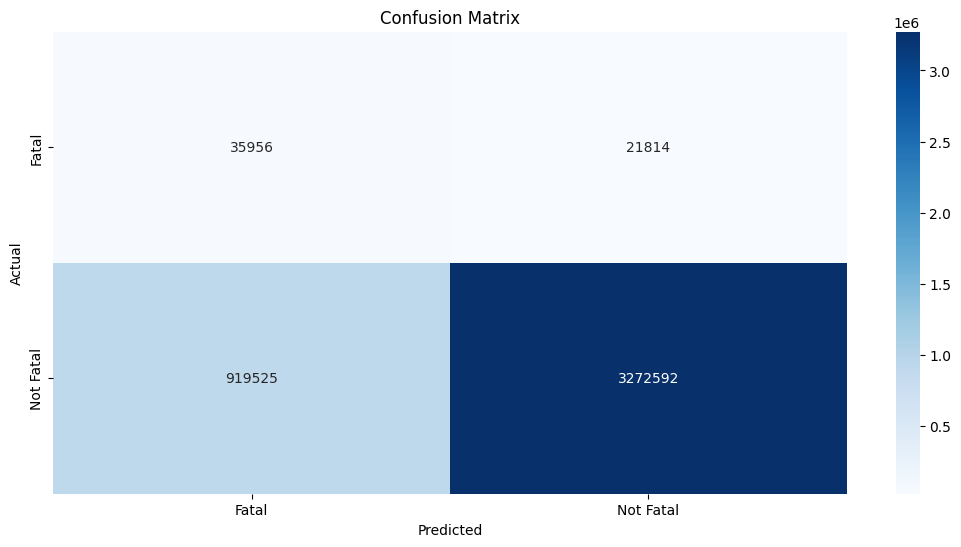

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

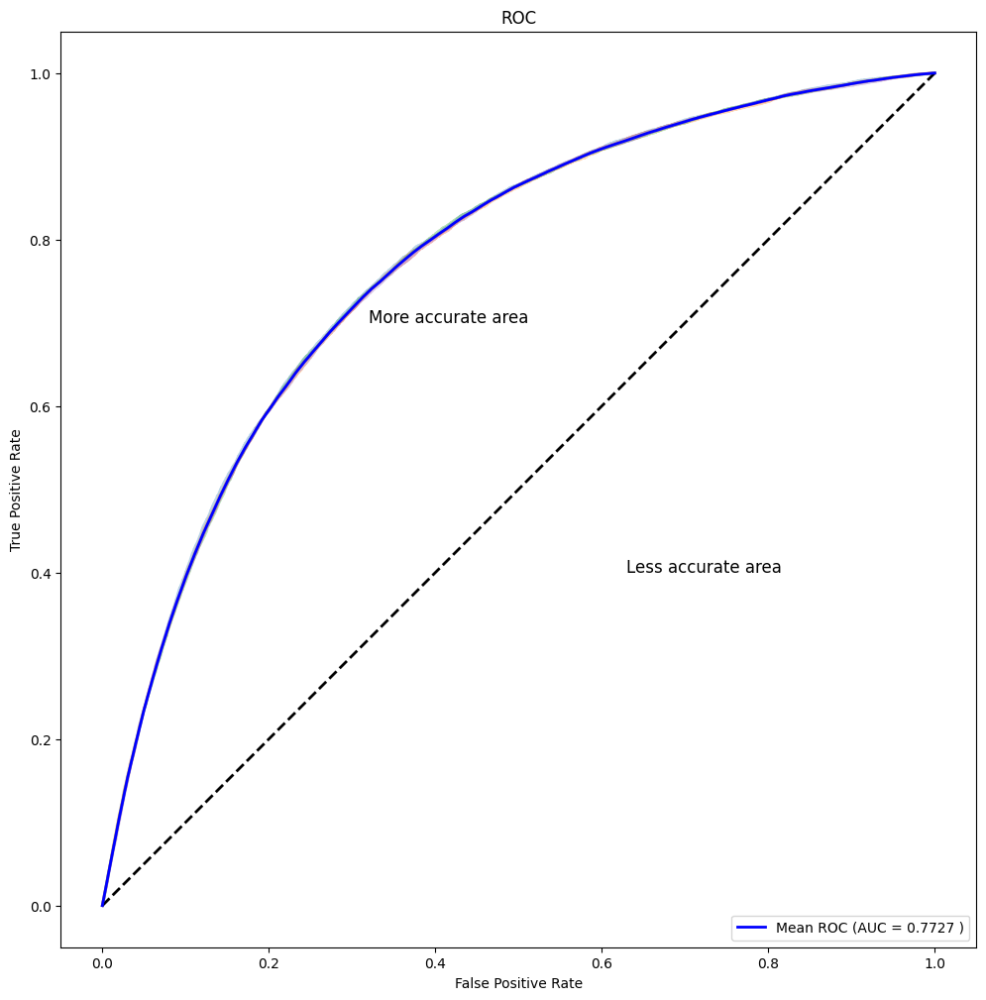

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
# cross_val_score function to evaluate model for each fold
# number of scores = number of folds x number of iterations

X = X_vehacc3B_le
y = y_vehacc3B_le

for scoring in["accuracy", "precision", "recall", "f1", "roc_auc"]:
    scores = cross_val_score(pipeline, X, y, scoring=scoring, cv=cv, n_jobs=-1)
    print("Model", scoring, "mean=", np.mean(scores).round(4) , "stddev=", np.std(scores).round(4))

Model accuracy mean= 0.7663 stddev= 0.0008
Model precision mean= 0.0368 stddev= 0.0003
Model recall mean= 0.6442 stddev= 0.005
Model f1 mean= 0.0697 stddev= 0.0005
Model roc_auc mean= 0.7758 stddev= 0.0013


In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(3397300,)
(3397300,)


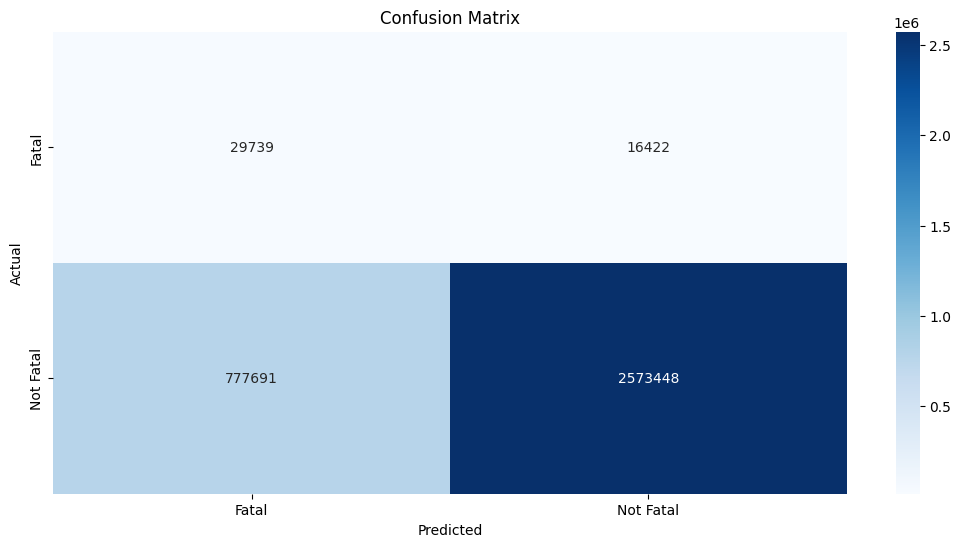

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
# cross_val_score function to evaluate model for each fold
# number of scores = number of folds x number of iterations

X = X_vehacc3C_le
y = y_vehacc3C_le

for scoring in["accuracy", "precision", "recall", "f1", "roc_auc"]:
    scores = cross_val_score(pipeline, X, y, scoring=scoring, cv=cv, n_jobs=-1)
    print("Model", scoring, "mean=", np.mean(scores).round(4) , "stddev=", np.std(scores).round(4))

Model accuracy mean= 0.765 stddev= 0.0003
Model precision mean= 0.033 stddev= 0.0001
Model recall mean= 0.6444 stddev= 0.0025
Model f1 mean= 0.0628 stddev= 0.0003
Model roc_auc mean= 0.7773 stddev= 0.0018


In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(2333196,)
(2333196,)


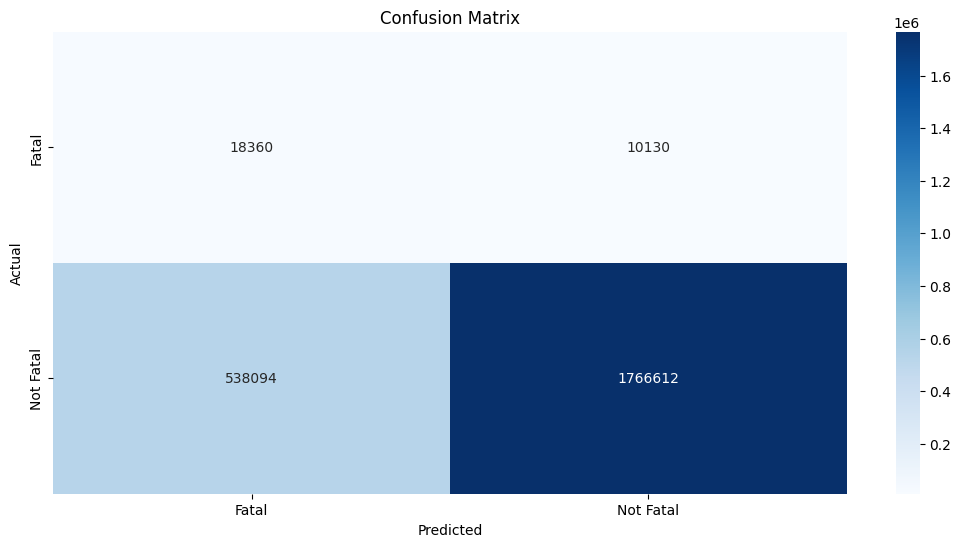

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

In [ ]:
plot_auc(pipeline, cv)

## Logistic Regression - L1

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.linear_model import LogisticRegression
model = LogisticRegression(penalty='l1', solver='saga', max_iter=1000, random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('scaler', scaler), ('model', model)]
pipeline = Pipeline(steps=steps)

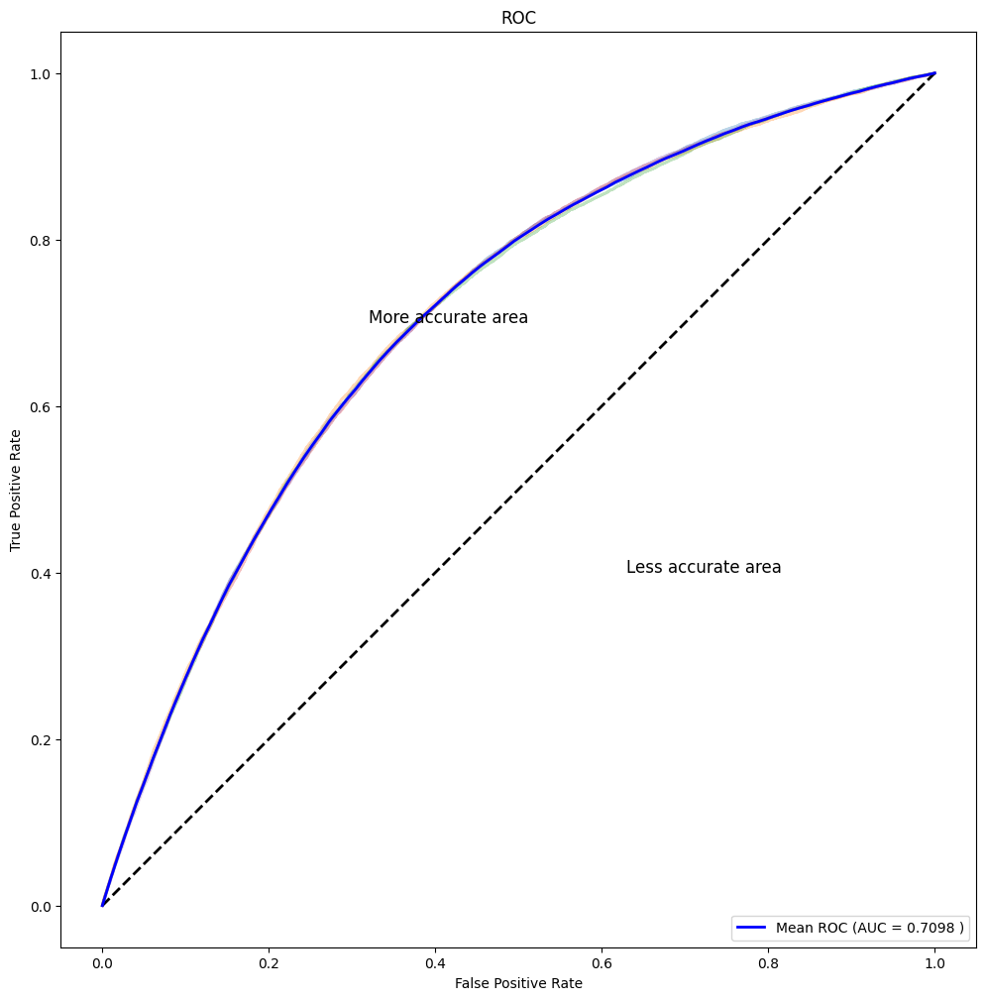

(4249887,)
(4249887,)


In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

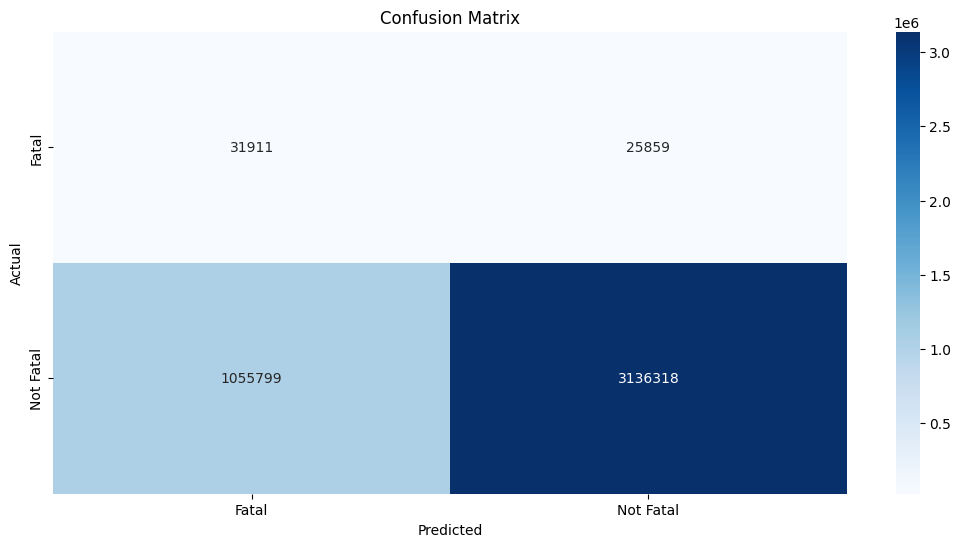

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

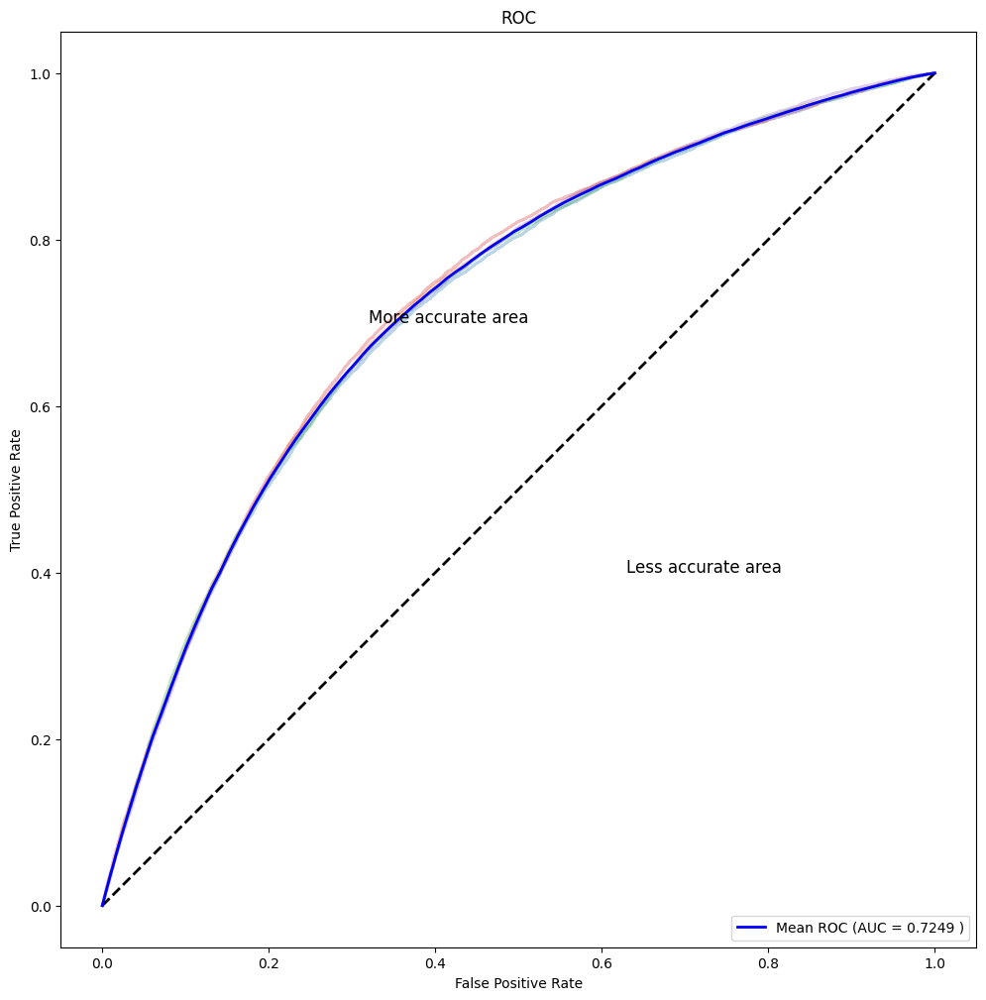

In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(3397300,)
(3397300,)


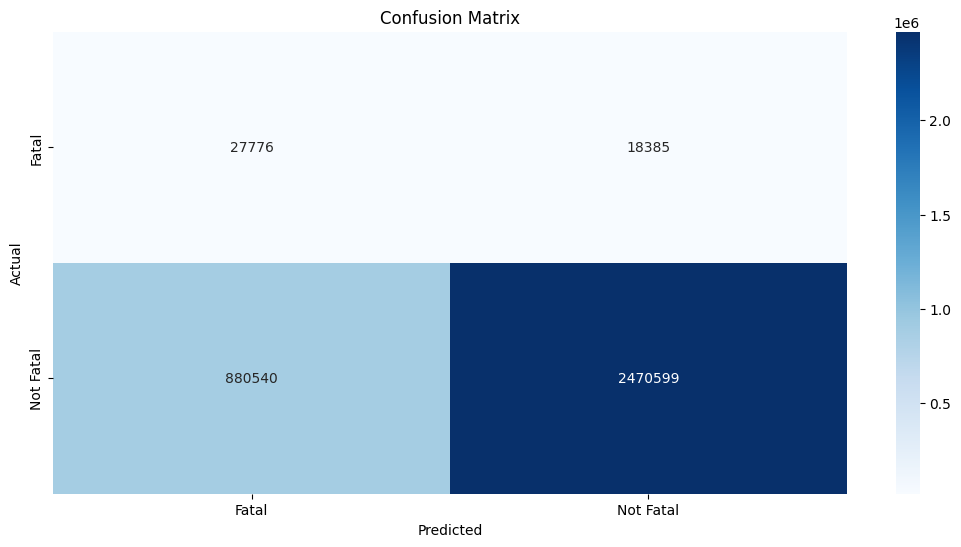

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

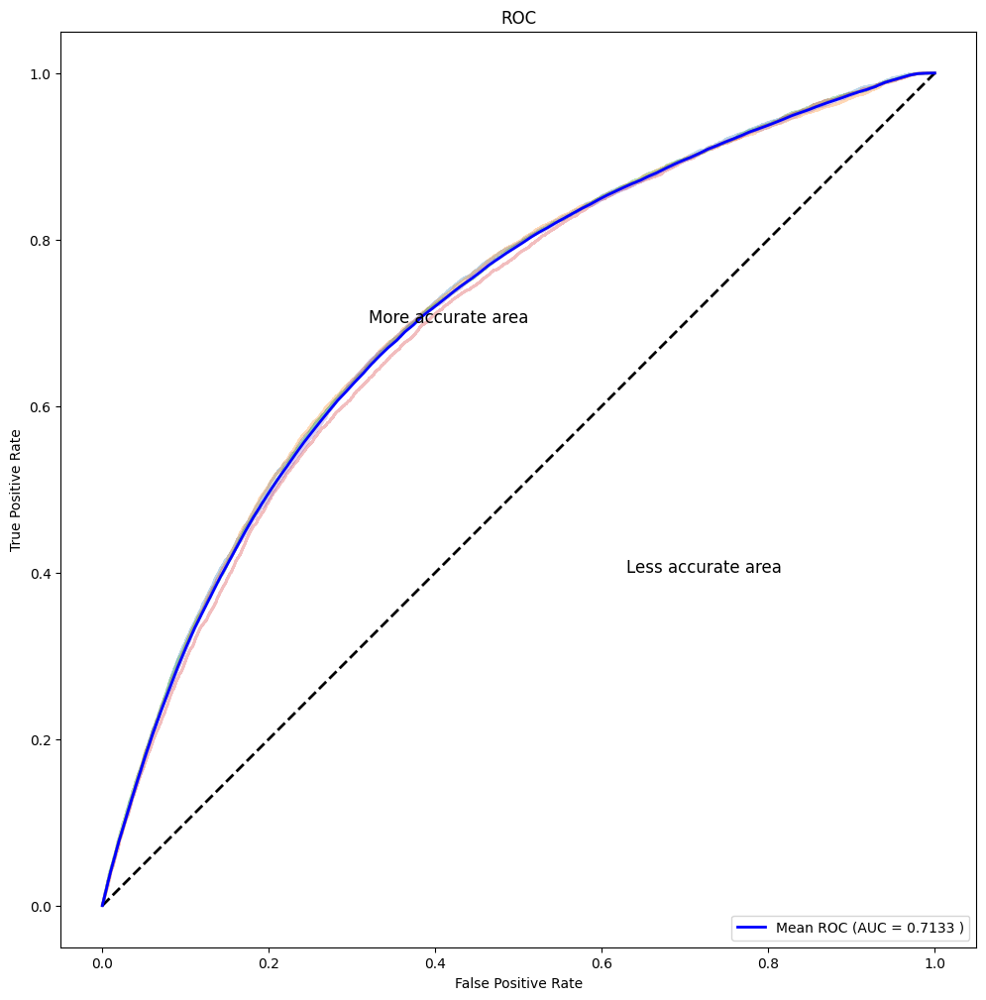

(2333196,)
(2333196,)


In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

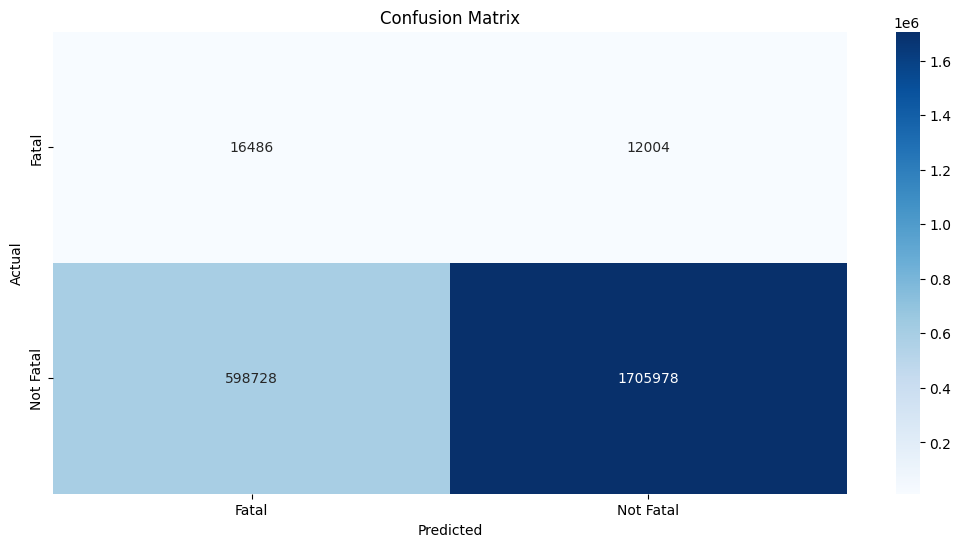

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

## Logistic Regression - L2

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.linear_model import LogisticRegression
model = LogisticRegression(penalty='l2', solver='saga', max_iter=1000, random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('scaler', scaler), ('model', model)]
pipeline = Pipeline(steps=steps)

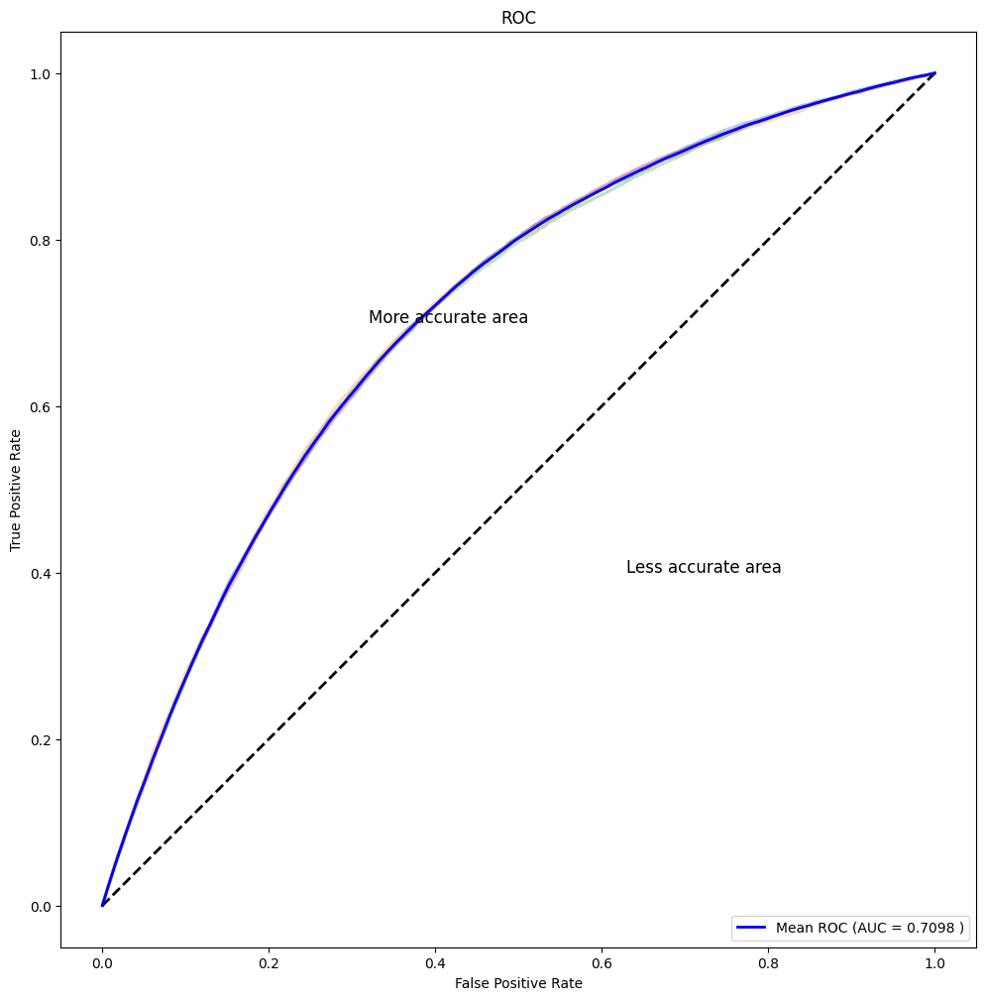

(4249887,)
(4249887,)


In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

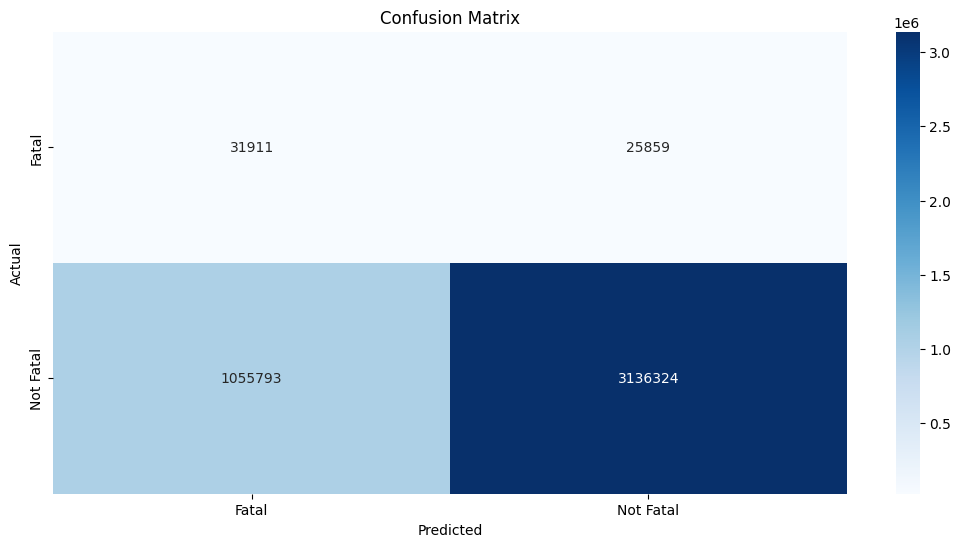

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

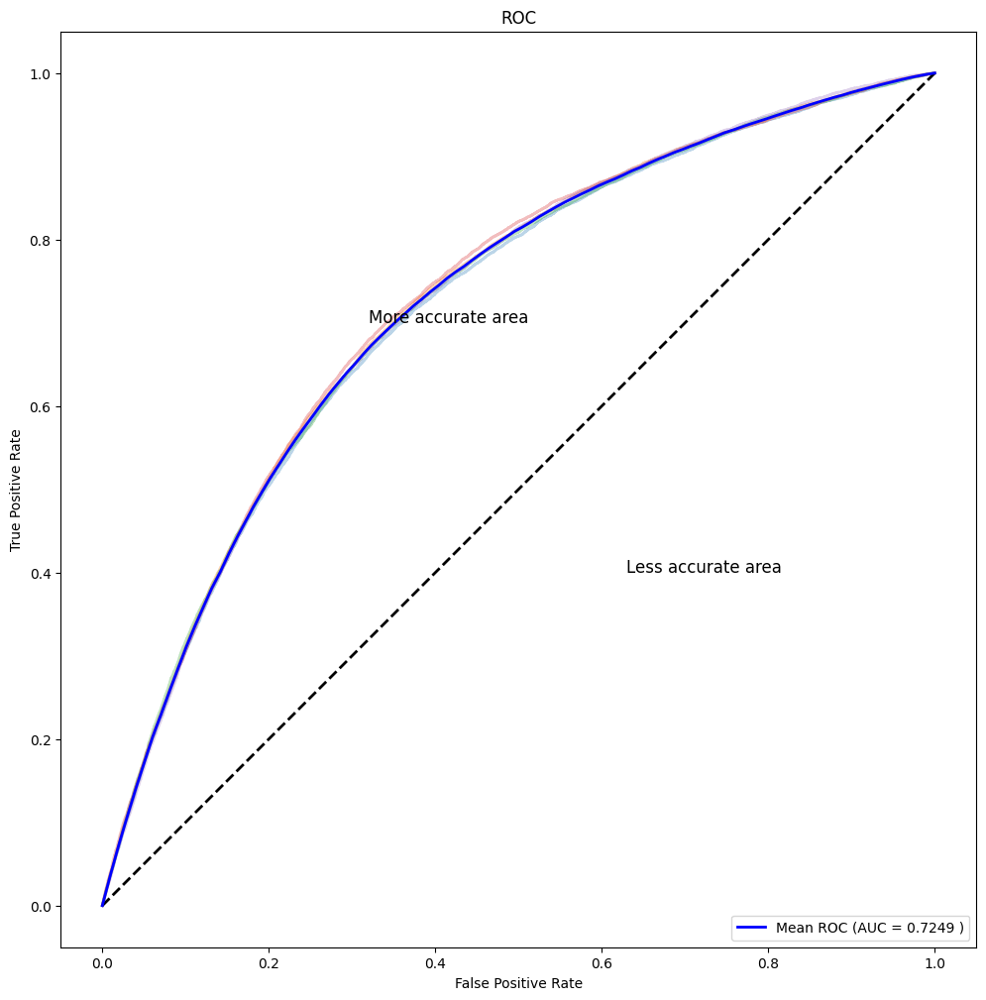

(3397300,)
(3397300,)


In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

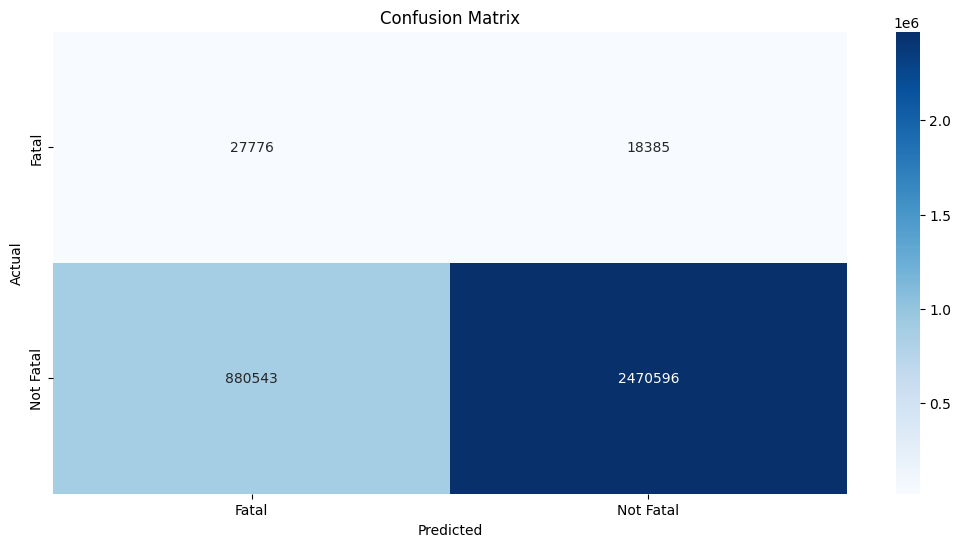

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

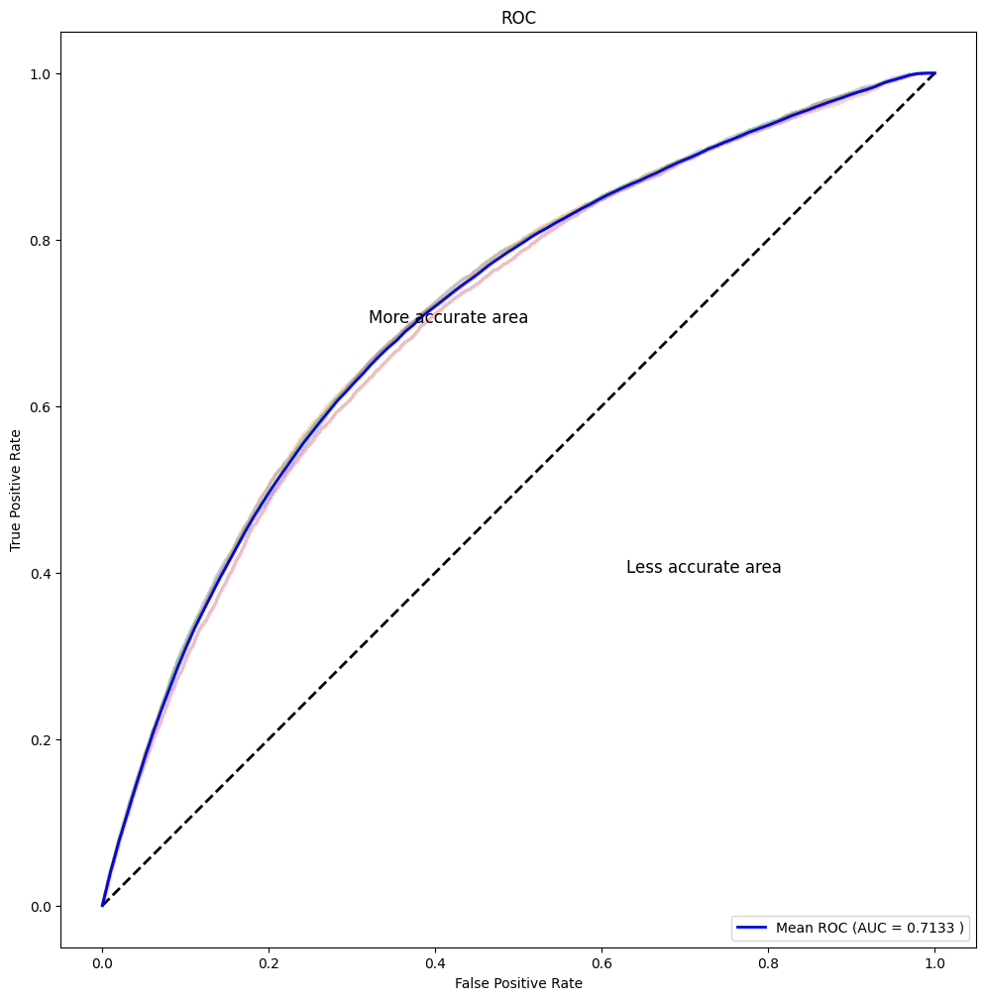

(2333196,)
(2333196,)


In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

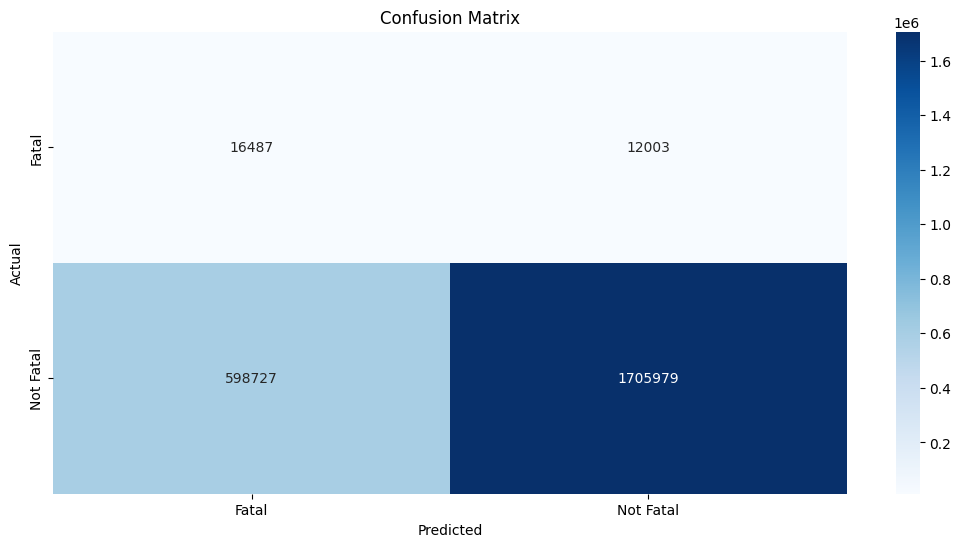

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

## Decision Tree - gini, n=100

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(criterion='gini', min_samples_leaf=100, random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

In [ ]:
# cross_val_score function to evaluate model for each fold
# number of scores = number of folds x number of iterations

X = X_vehacc3A_le
y = y_vehacc3A_le

for scoring in["accuracy", "precision", "recall", "f1", "roc_auc"]:
    scores = cross_val_score(pipeline, X, y, scoring=scoring, cv=cv, n_jobs=-1)
    print("Model", scoring, "mean=", np.mean(scores).round(4) , "stddev=", np.std(scores).round(4))

In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(4249887,)
(4249887,)


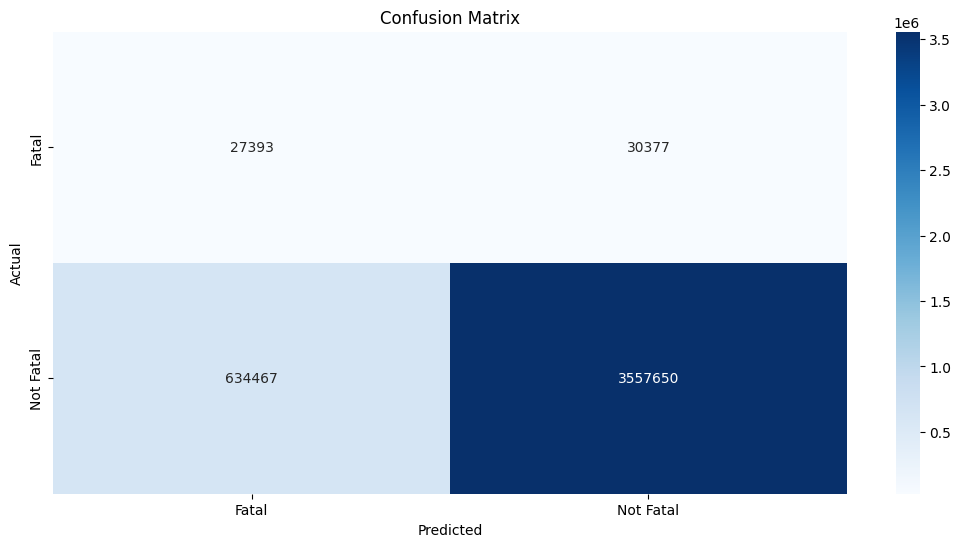

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

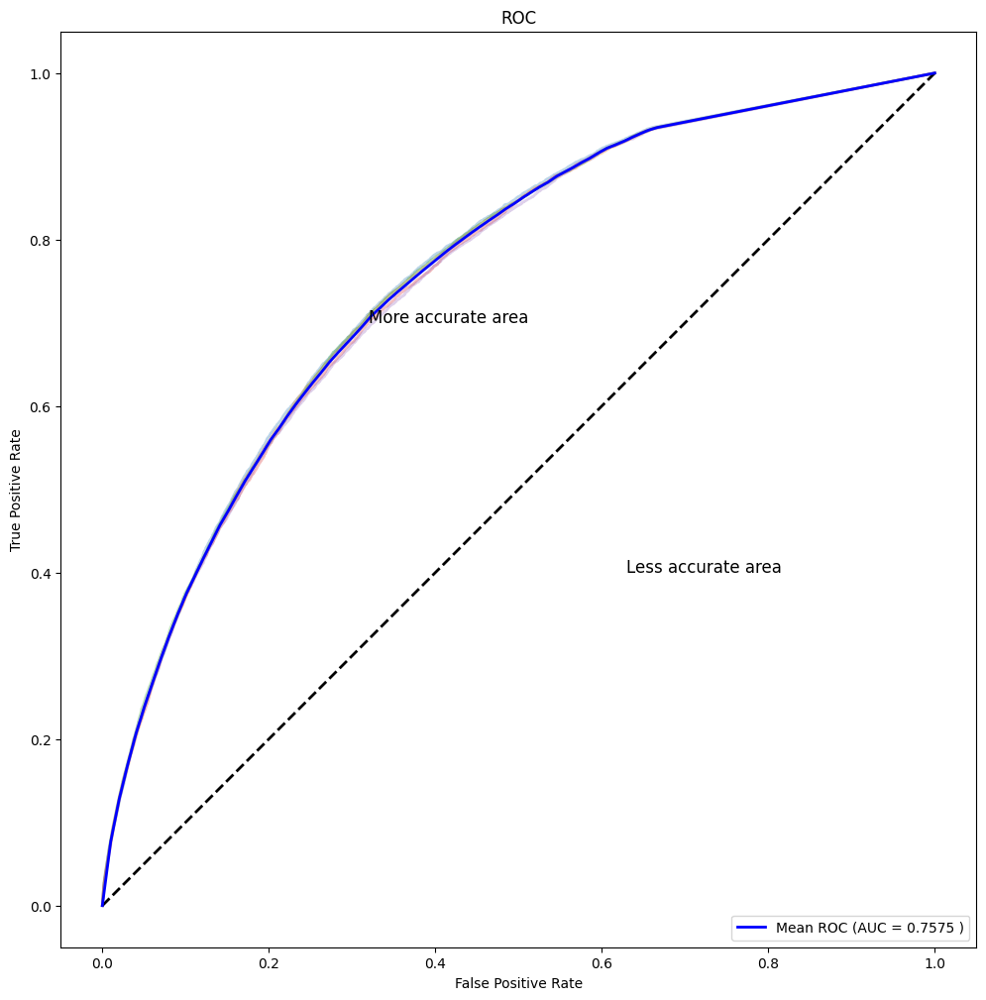

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
# cross_val_score function to evaluate model for each fold
# number of scores = number of folds x number of iterations

X = X_vehacc3B_le
y = y_vehacc3B_le

for scoring in["accuracy", "precision", "recall", "f1", "roc_auc"]:
    scores = cross_val_score(pipeline, X, y, scoring=scoring, cv=cv, n_jobs=-1)
    print("Model", scoring, "mean=", np.mean(scores).round(4) , "stddev=", np.std(scores).round(4))

In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(3397300,)
(3397300,)


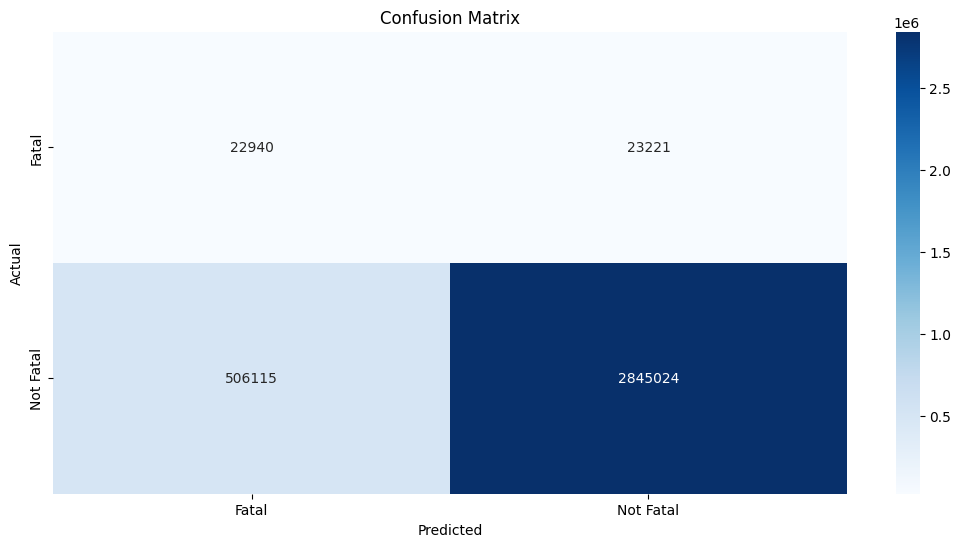

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

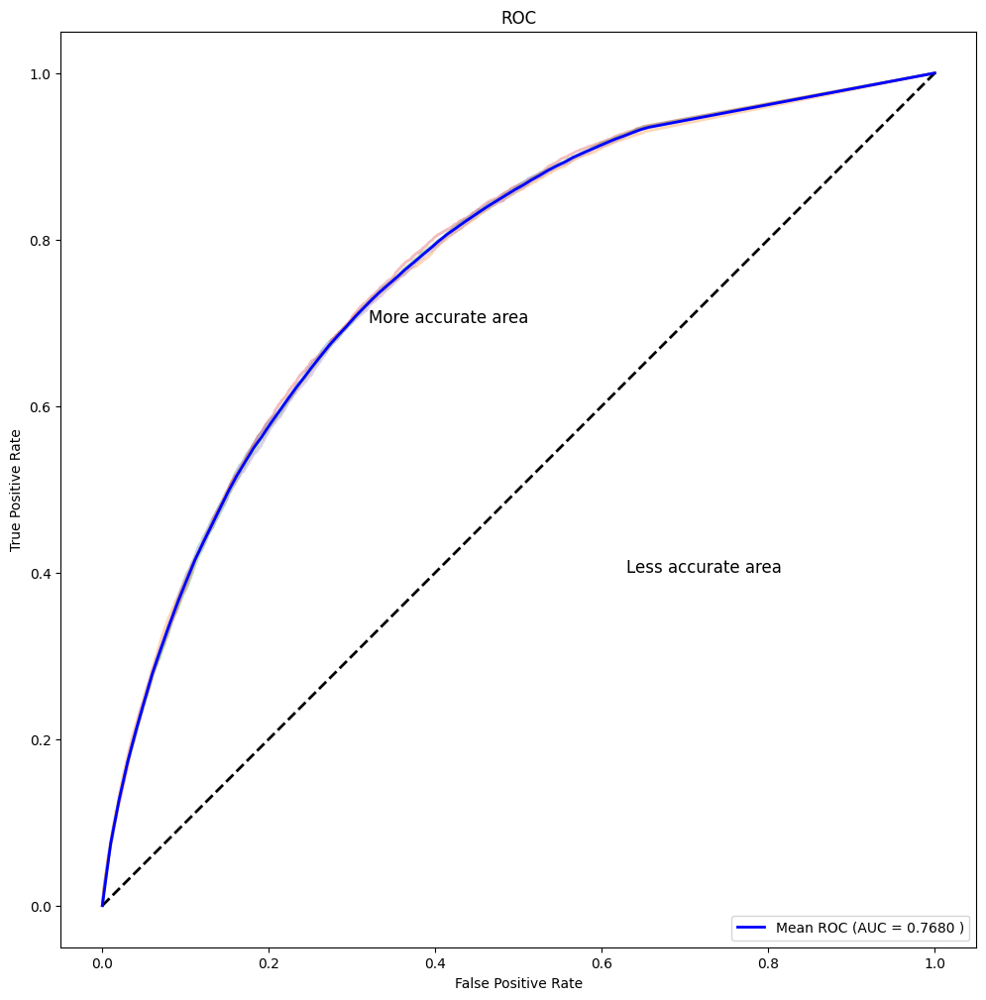

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
# cross_val_score function to evaluate model for each fold
# number of scores = number of folds x number of iterations

X = X_vehacc3C_le
y = y_vehacc3C_le

for scoring in["accuracy", "precision", "recall", "f1", "roc_auc"]:
    scores = cross_val_score(pipeline, X, y, scoring=scoring, cv=cv, n_jobs=-1)
    print("Model", scoring, "mean=", np.mean(scores).round(4) , "stddev=", np.std(scores).round(4))

In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(2333196,)
(2333196,)


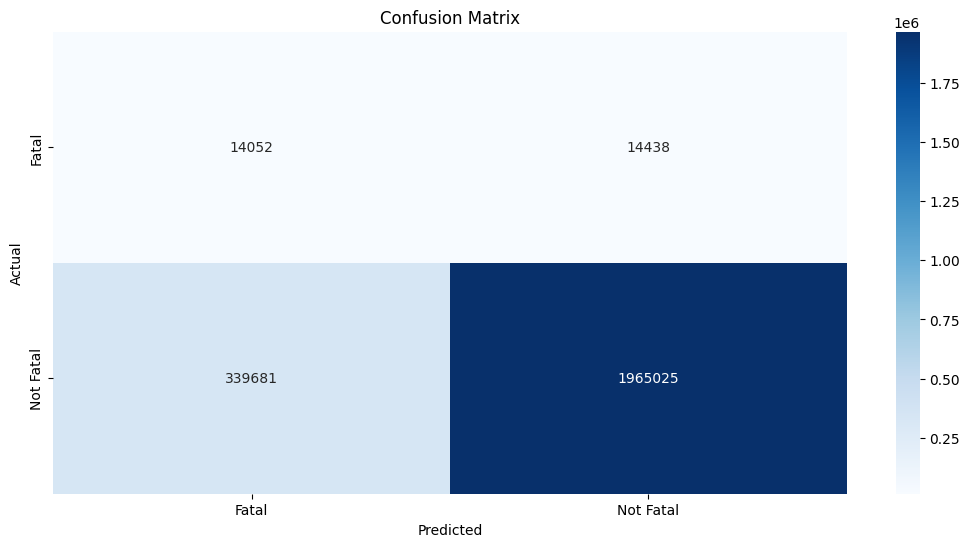

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

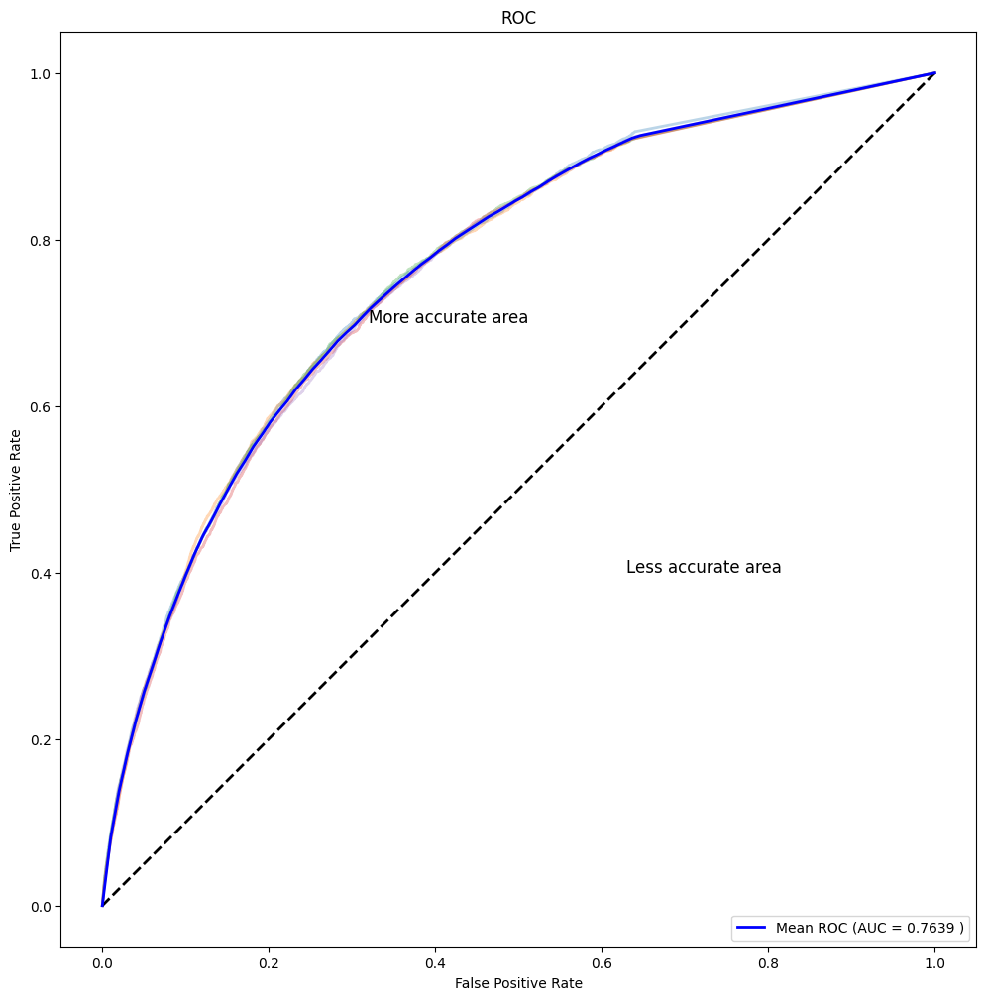

In [ ]:
plot_auc(pipeline, cv)

## Decision Tree - gini, n=200

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(criterion='gini', min_samples_leaf=200, random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

In [ ]:
# cross_val_score function to evaluate model for each fold
# number of scores = number of folds x number of iterations

X = X_vehacc3A_le
y = y_vehacc3A_le

for scoring in["accuracy", "precision", "recall", "f1", "roc_auc"]:
    scores = cross_val_score(pipeline, X, y, scoring=scoring, cv=cv, n_jobs=-1)
    print("Model", scoring, "mean=", np.mean(scores).round(4) , "stddev=", np.std(scores).round(4))

In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(4249887,)
(4249887,)


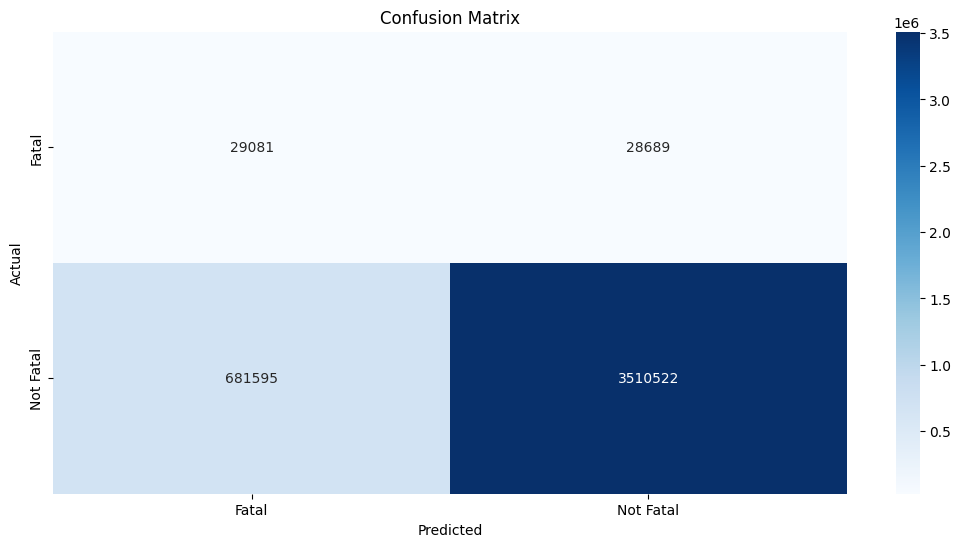

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

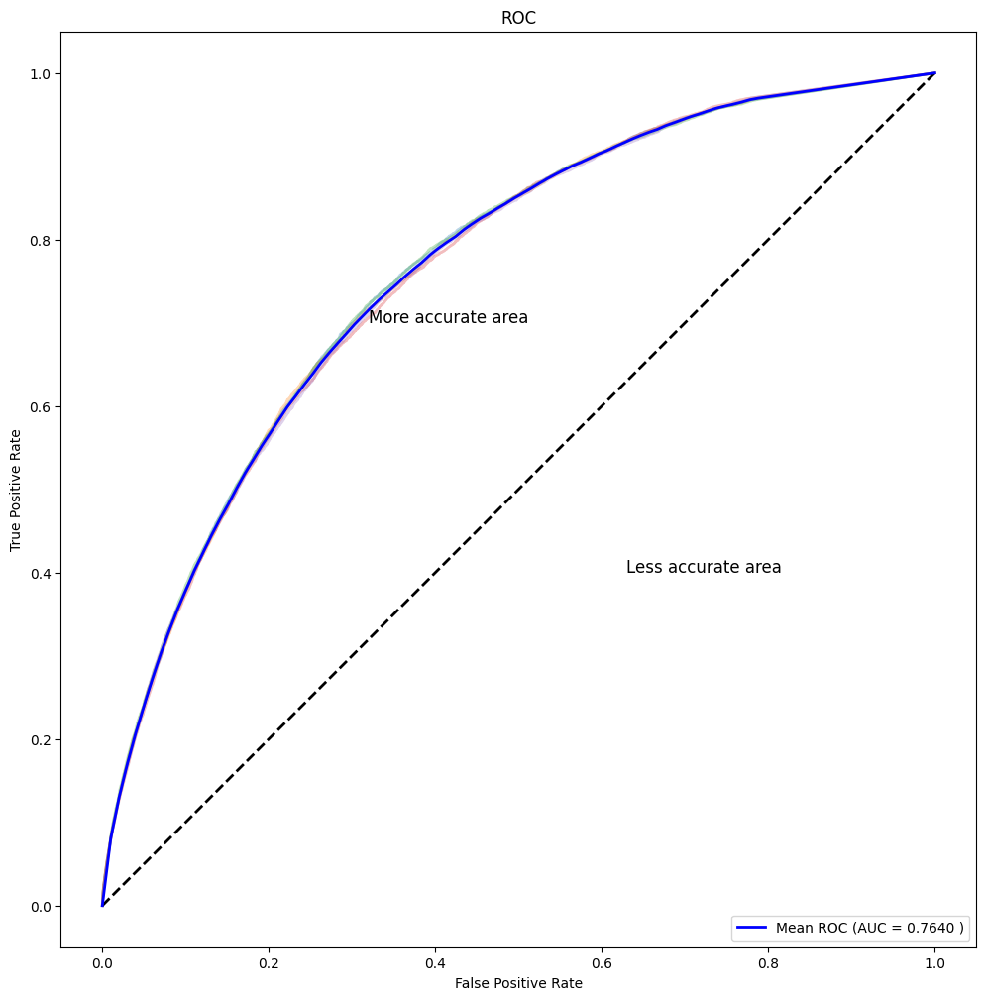

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
# cross_val_score function to evaluate model for each fold
# number of scores = number of folds x number of iterations

X = X_vehacc3B_le
y = y_vehacc3B_le

for scoring in["accuracy", "precision", "recall", "f1", "roc_auc"]:
    scores = cross_val_score(pipeline, X, y, scoring=scoring, cv=cv, n_jobs=-1)
    print("Model", scoring, "mean=", np.mean(scores).round(4) , "stddev=", np.std(scores).round(4))

In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(3397300,)
(3397300,)


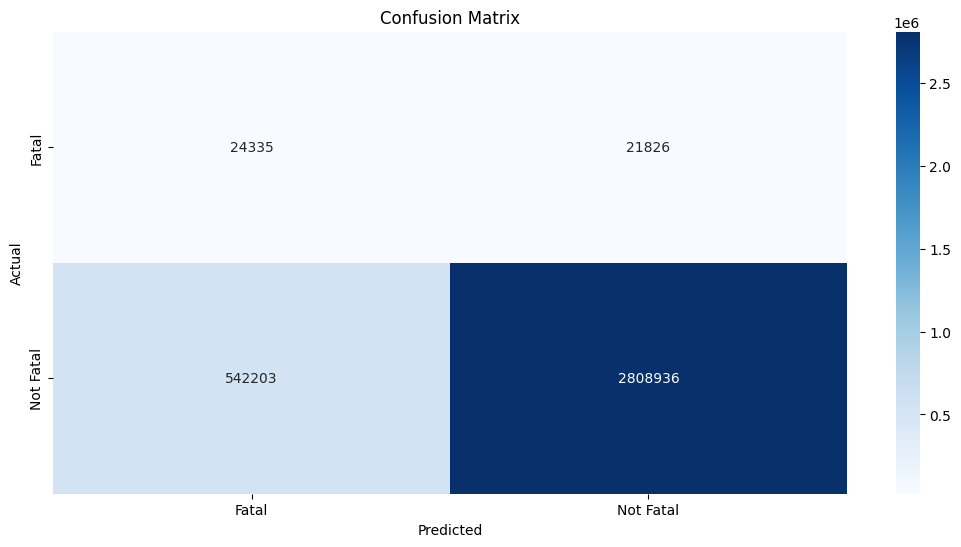

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

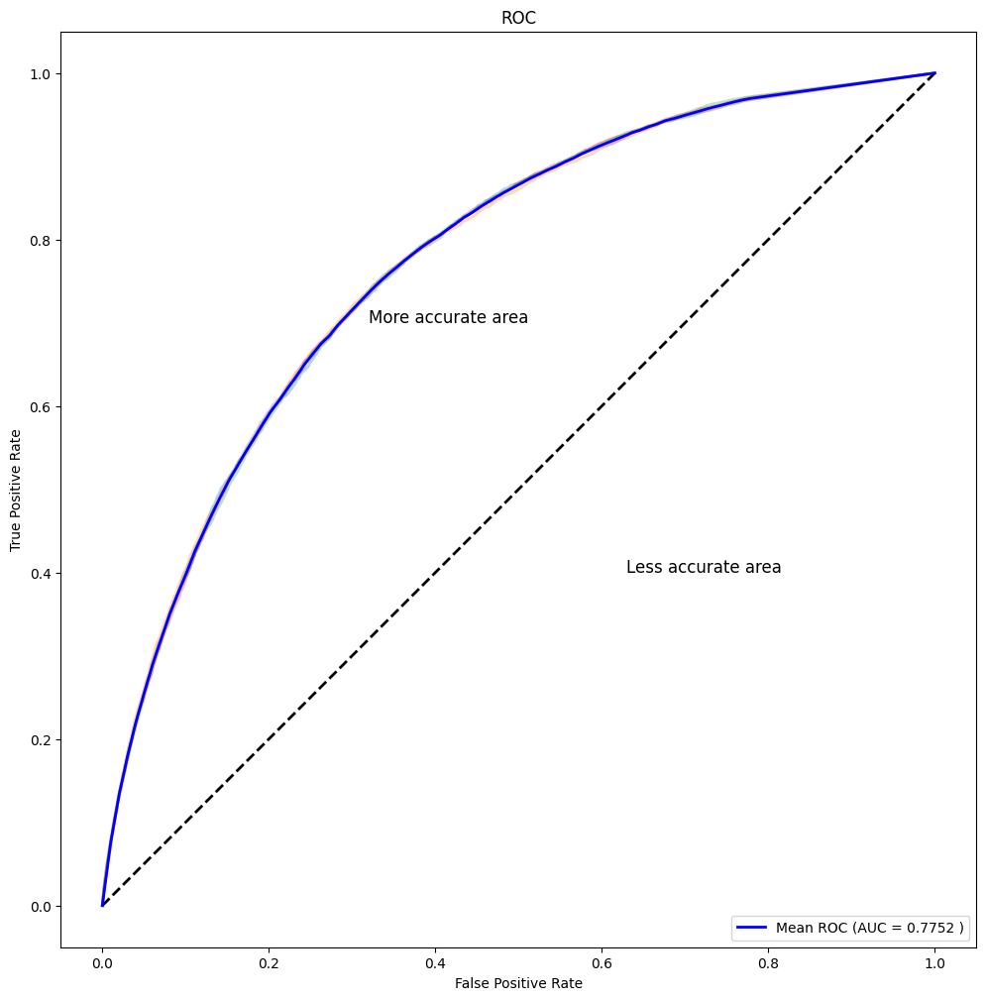

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
# cross_val_score function to evaluate model for each fold
# number of scores = number of folds x number of iterations

X = X_vehacc3C_le
y = y_vehacc3C_le

for scoring in["accuracy", "precision", "recall", "f1", "roc_auc"]:
    scores = cross_val_score(pipeline, X, y, scoring=scoring, cv=cv, n_jobs=-1)
    print("Model", scoring, "mean=", np.mean(scores).round(4) , "stddev=", np.std(scores).round(4))

In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(2333196,)
(2333196,)


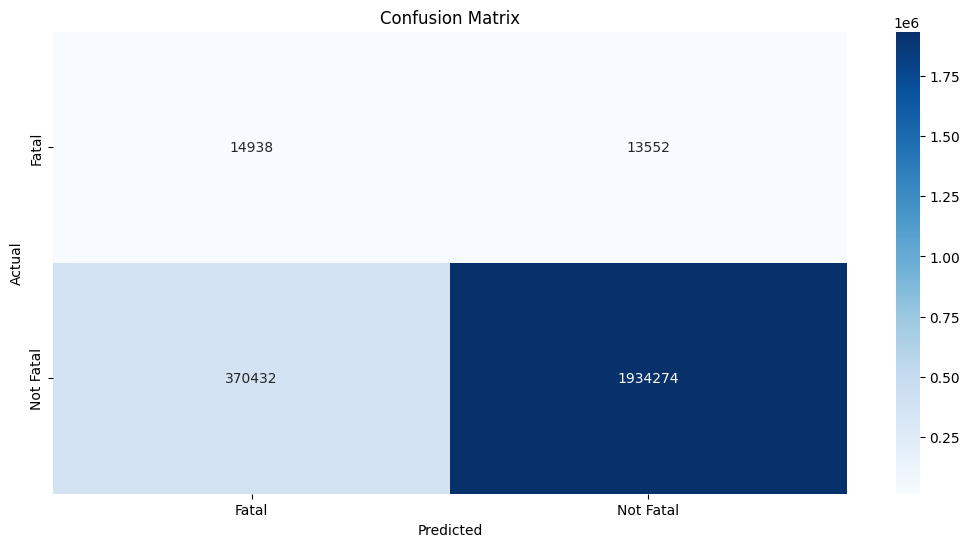

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

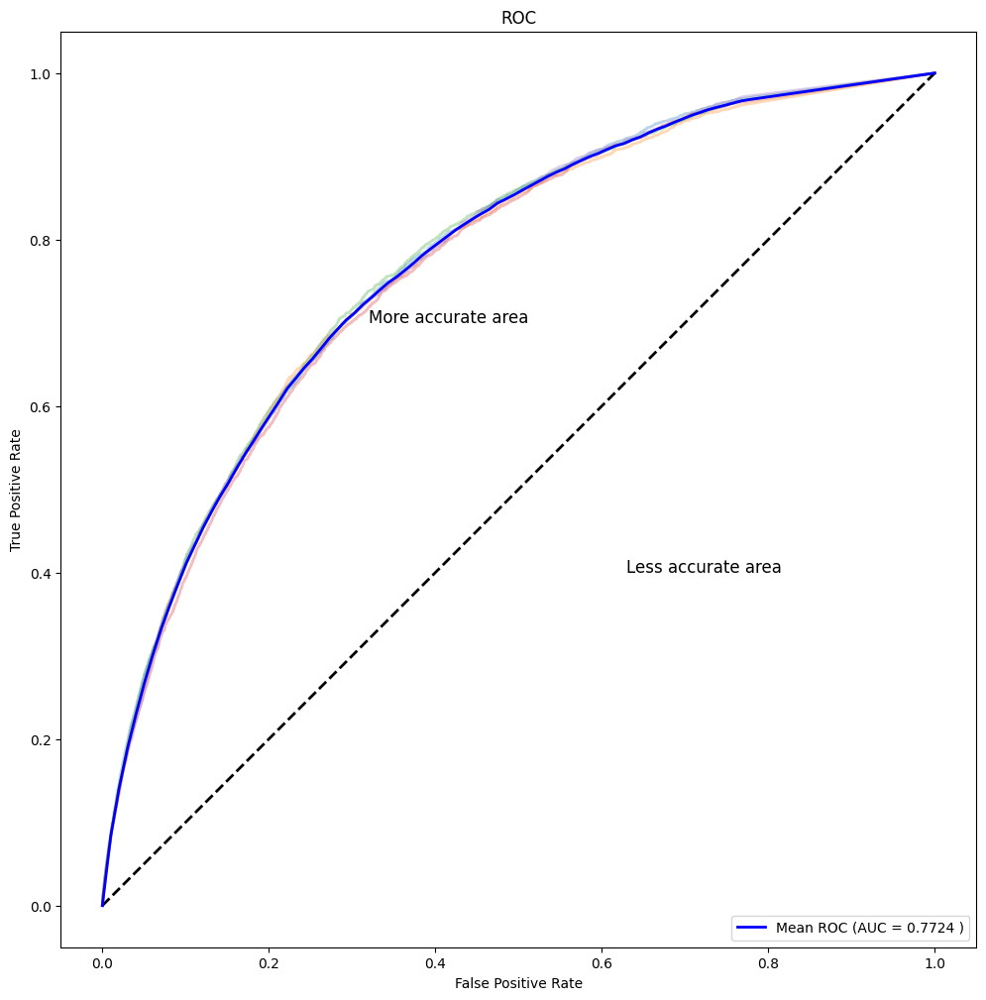

In [ ]:
plot_auc(pipeline, cv)

## Decision Tree - gini, n=300

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(criterion='gini', min_samples_leaf=300, random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

In [ ]:
# cross_val_score function to evaluate model for each fold
# number of scores = number of folds x number of iterations

X = X_vehacc3A_le
y = y_vehacc3A_le

for scoring in["accuracy", "precision", "recall", "f1", "roc_auc"]:
    scores = cross_val_score(pipeline, X, y, scoring=scoring, cv=cv, n_jobs=-1)
    print("Model", scoring, "mean=", np.mean(scores).round(4) , "stddev=", np.std(scores).round(4))

In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(4249887,)
(4249887,)


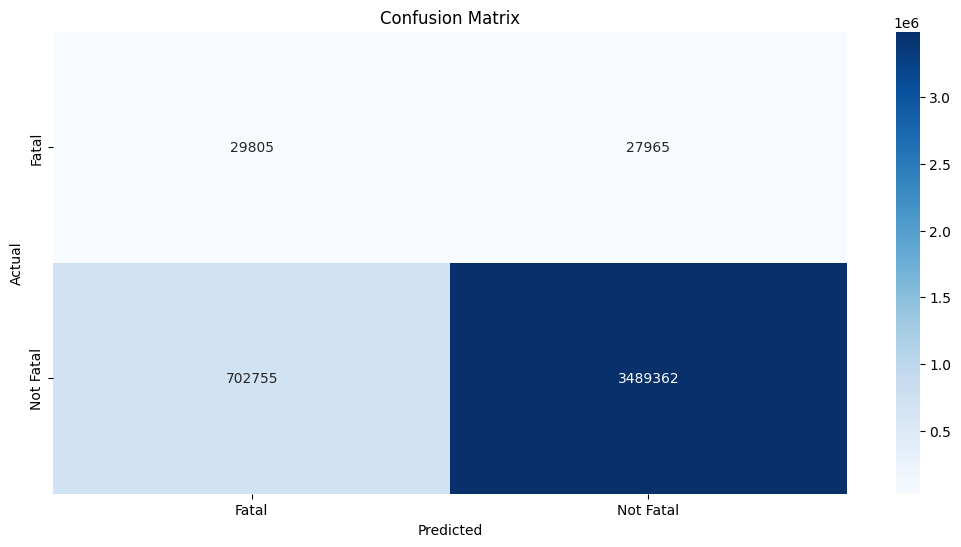

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

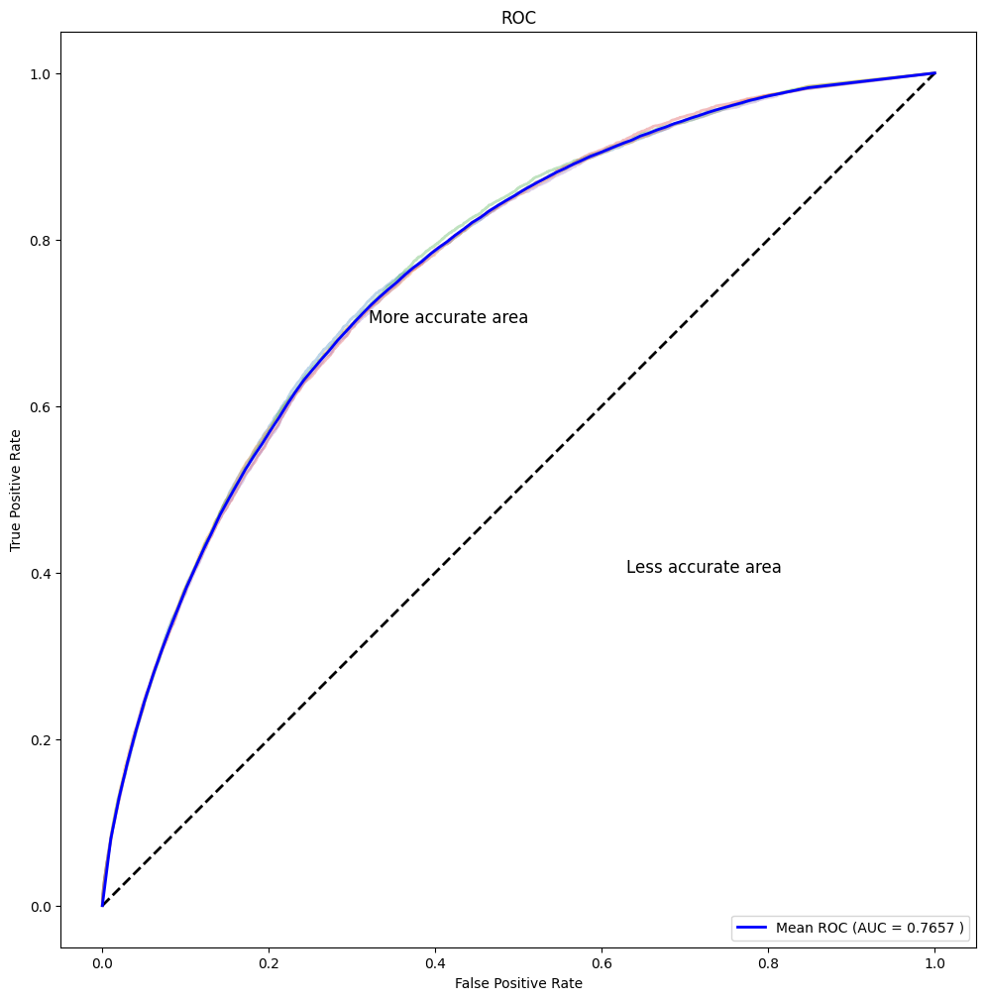

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
# cross_val_score function to evaluate model for each fold
# number of scores = number of folds x number of iterations

X = X_vehacc3B_le
y = y_vehacc3B_le

for scoring in["accuracy", "precision", "recall", "f1", "roc_auc"]:
    scores = cross_val_score(pipeline, X, y, scoring=scoring, cv=cv, n_jobs=-1)
    print("Model", scoring, "mean=", np.mean(scores).round(4) , "stddev=", np.std(scores).round(4))

In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(3397300,)
(3397300,)


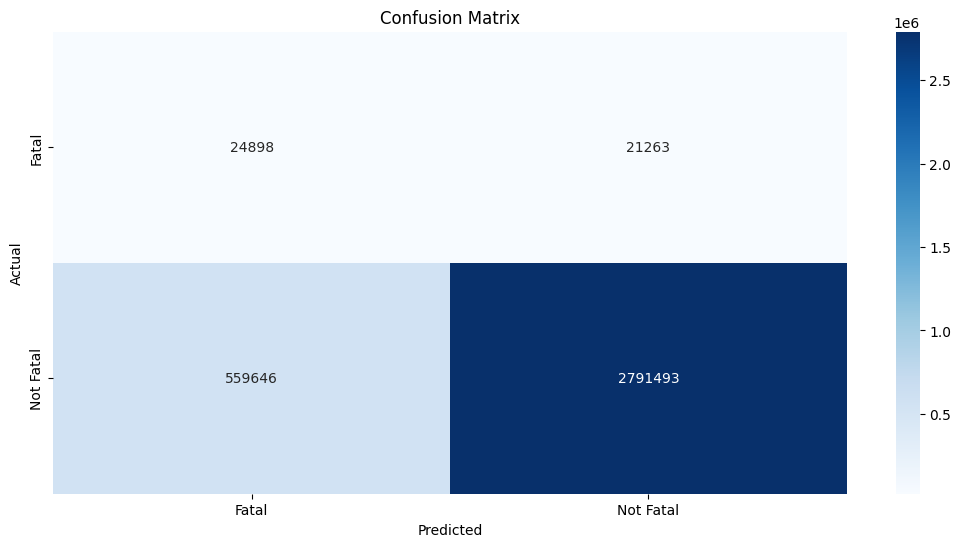

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

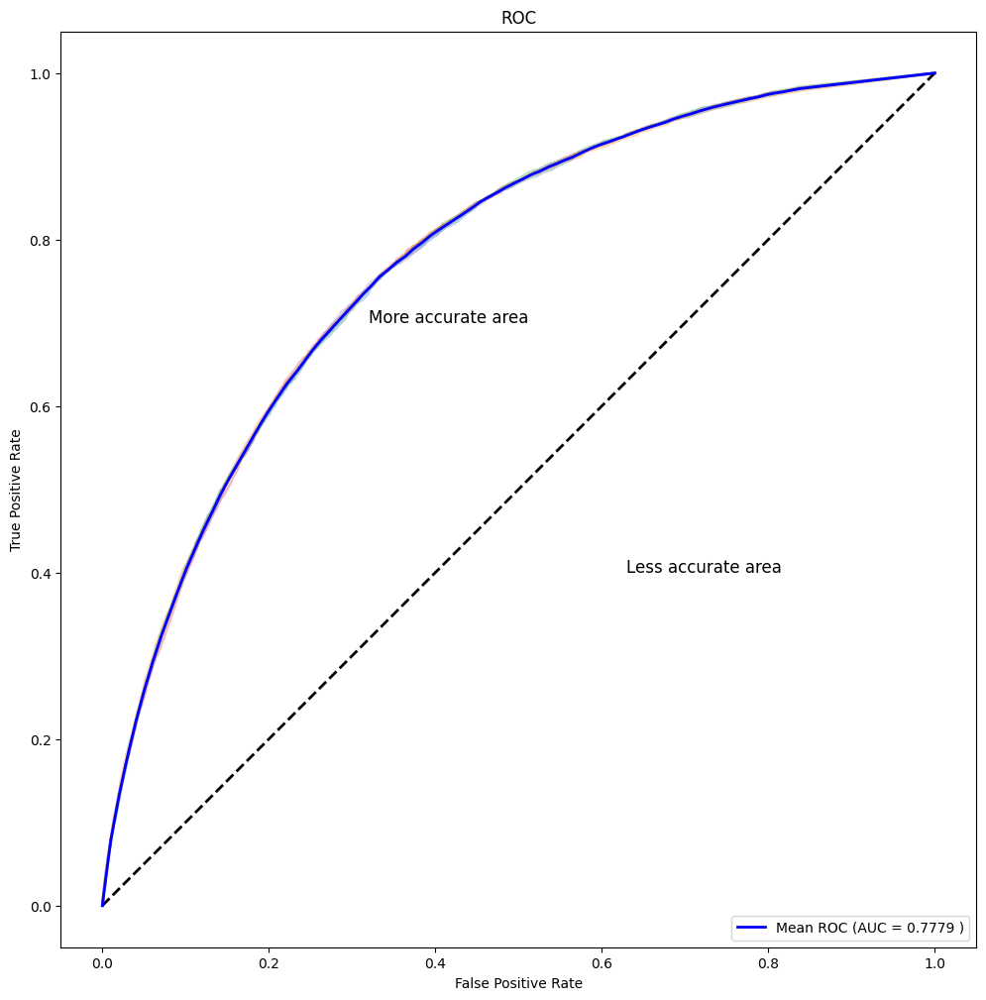

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
# cross_val_score function to evaluate model for each fold
# number of scores = number of folds x number of iterations

X = X_vehacc3C_le
y = y_vehacc3C_le

for scoring in["accuracy", "precision", "recall", "f1", "roc_auc"]:
    scores = cross_val_score(pipeline, X, y, scoring=scoring, cv=cv, n_jobs=-1)
    print("Model", scoring, "mean=", np.mean(scores).round(4) , "stddev=", np.std(scores).round(4))

In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(2333196,)
(2333196,)


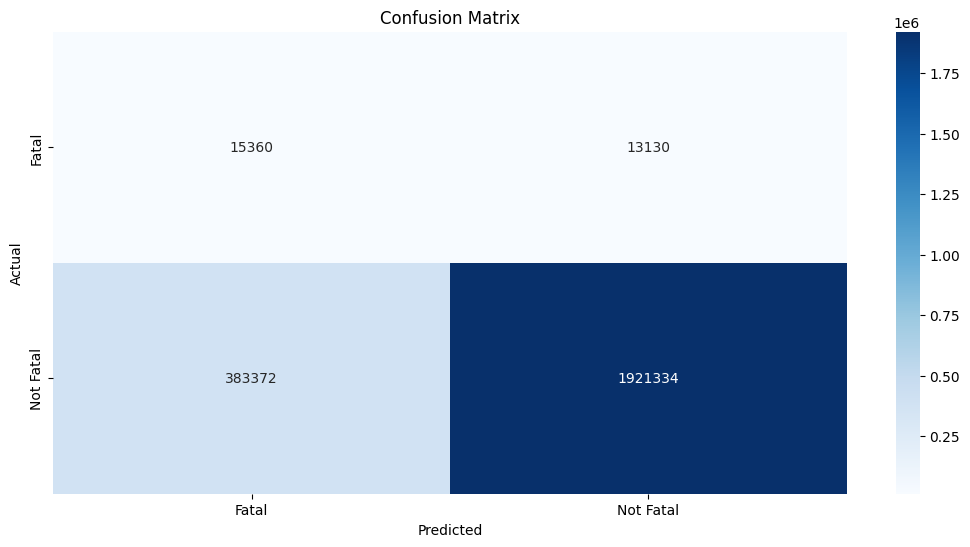

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

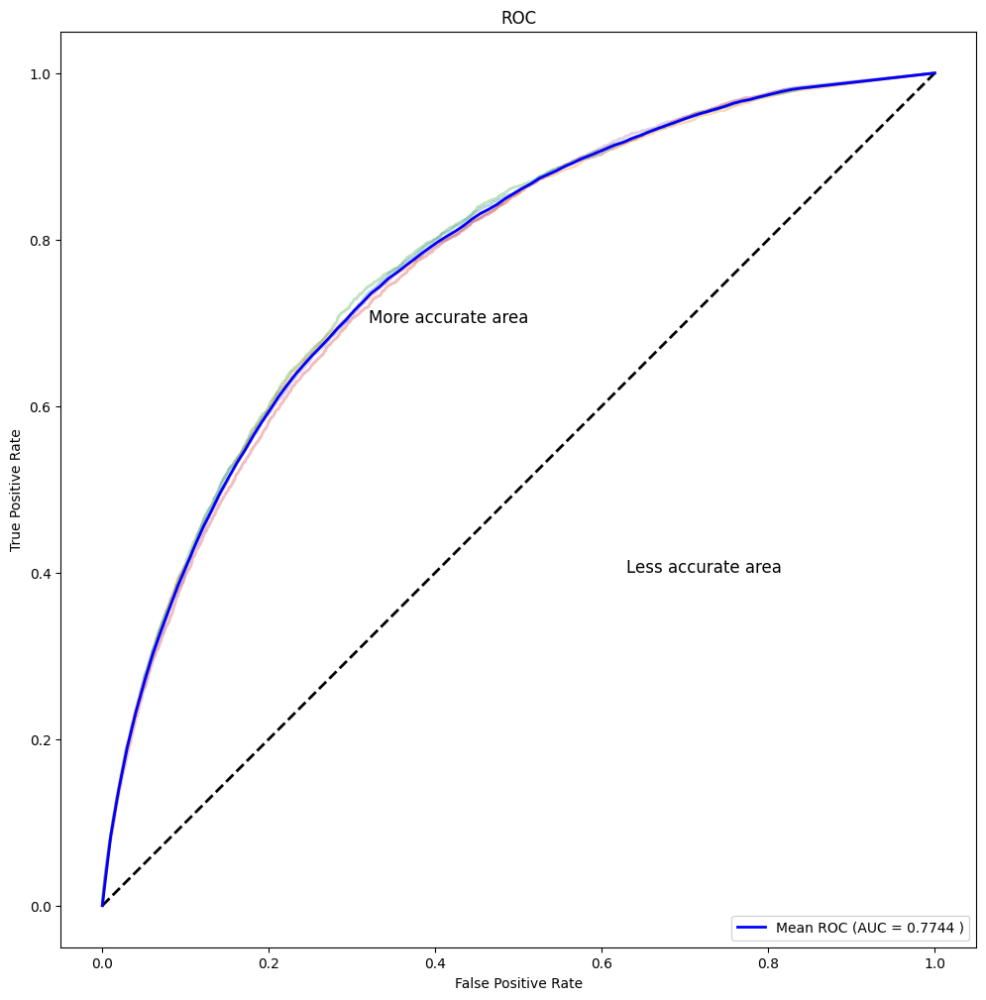

In [ ]:
plot_auc(pipeline, cv)

## AdaBoost - n=50

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.ensemble import AdaBoostClassifier
model = AdaBoostClassifier(n_estimators=50, random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(4249887,)
(4249887,)


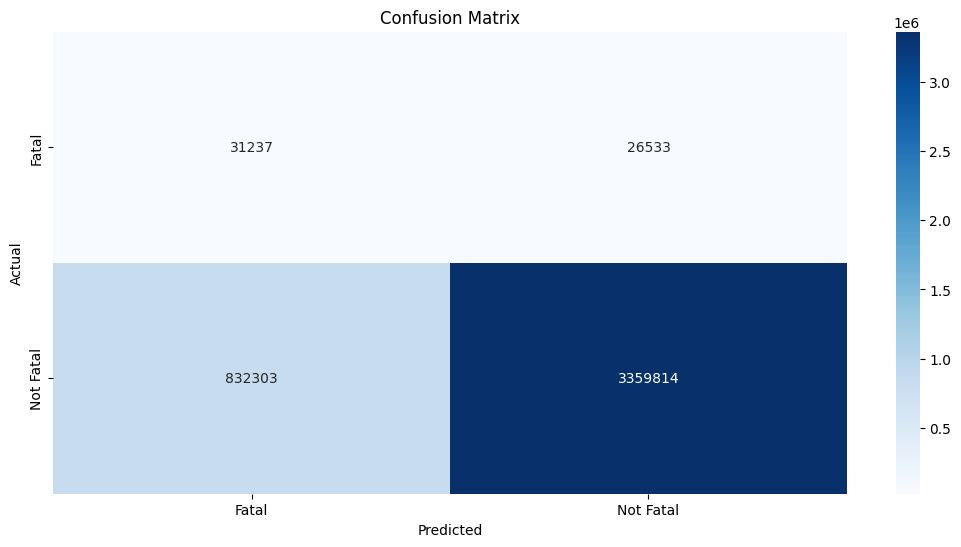

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

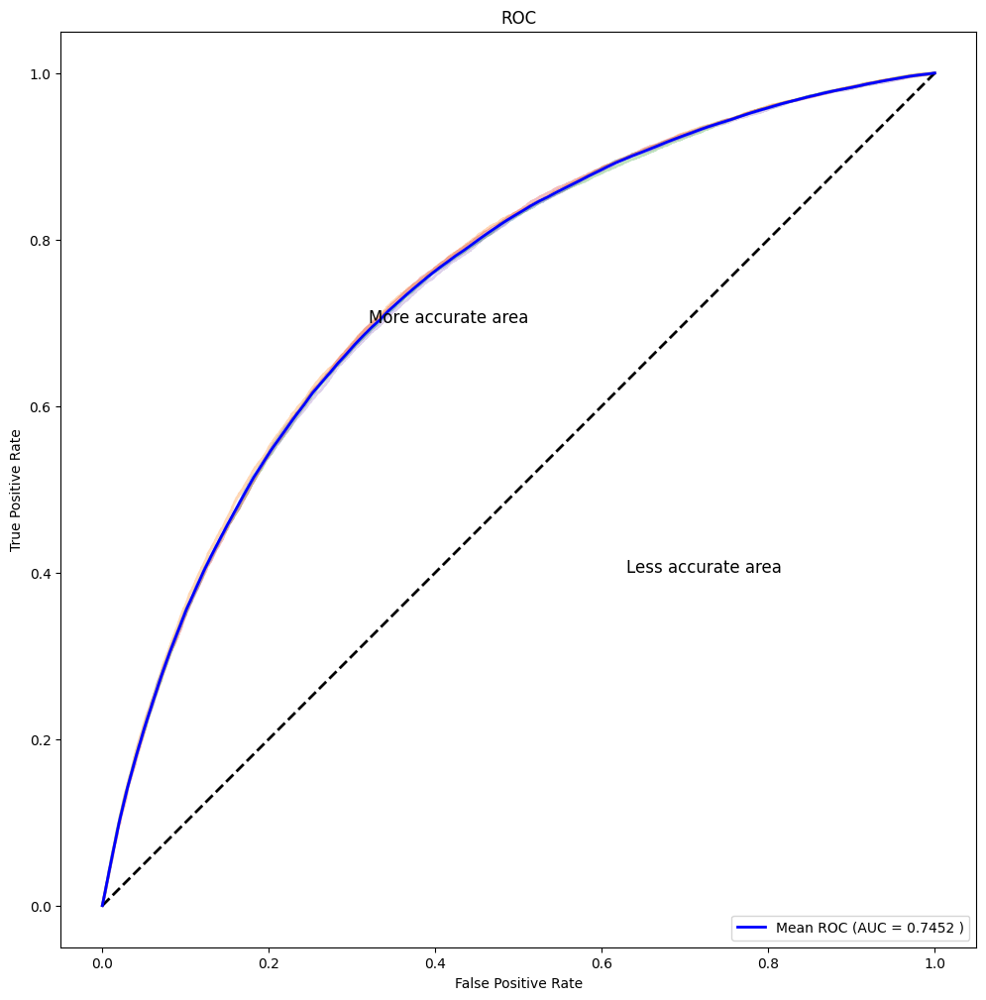

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(3397300,)
(3397300,)


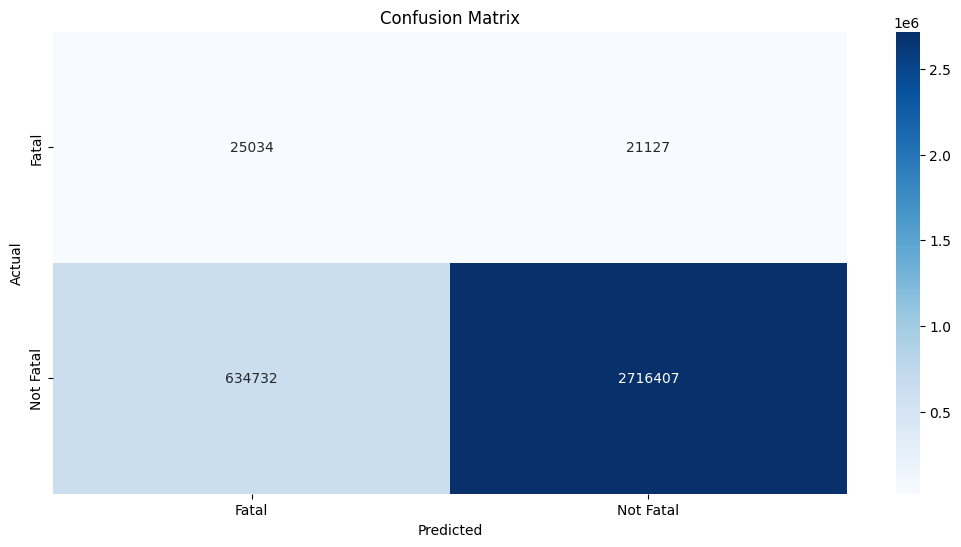

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

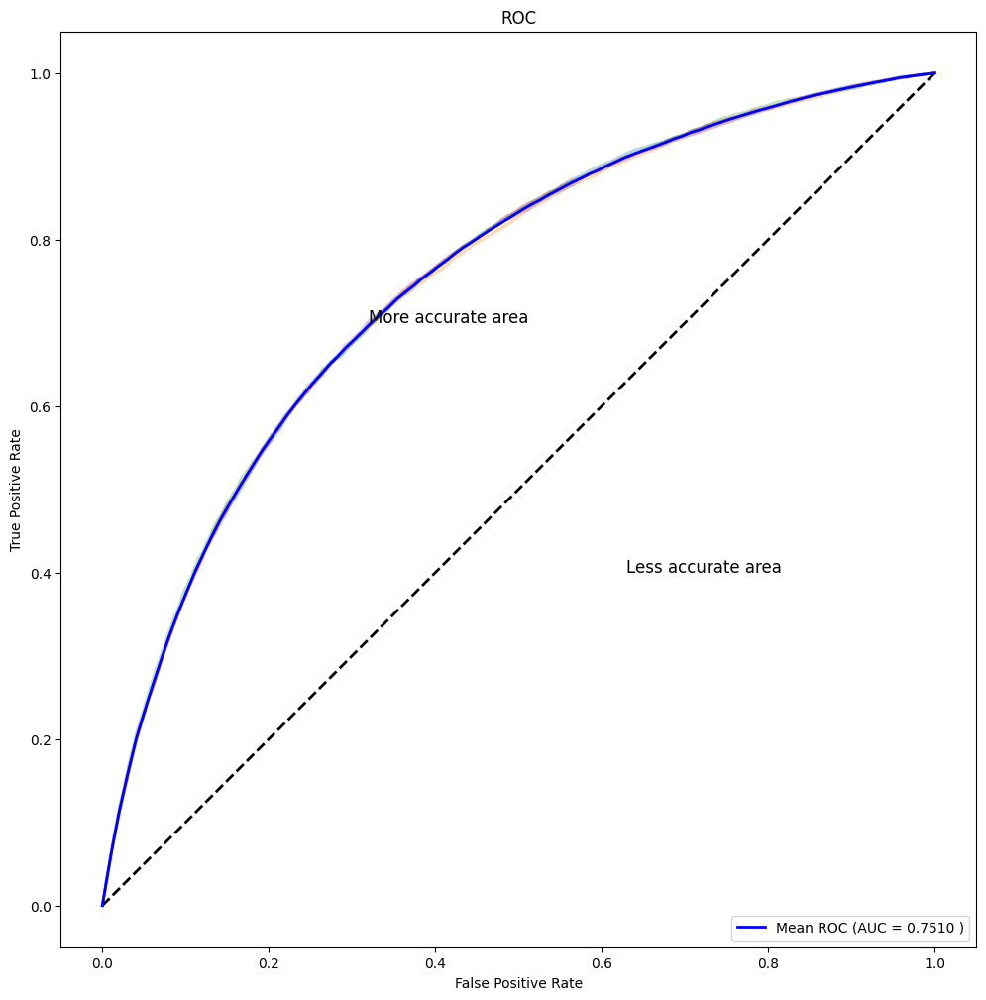

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(2333196,)
(2333196,)


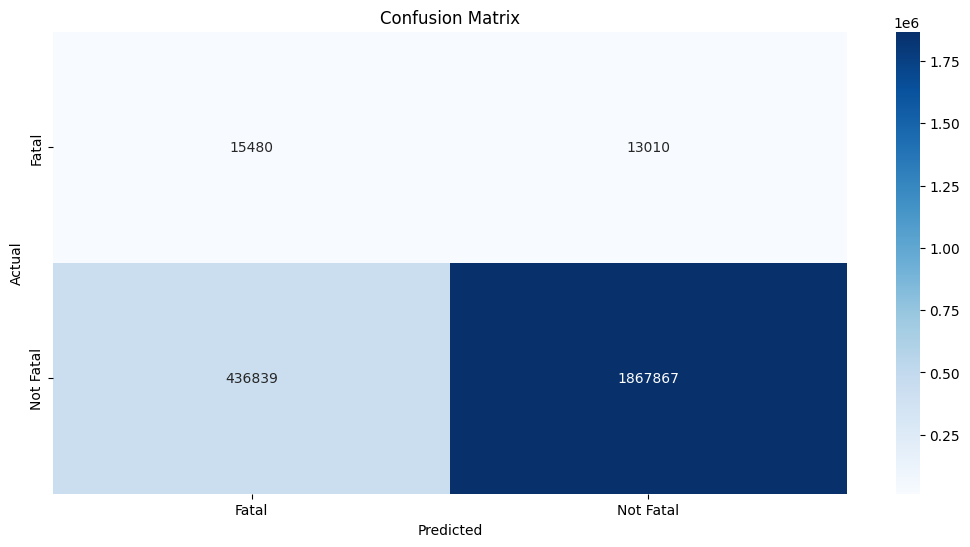

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

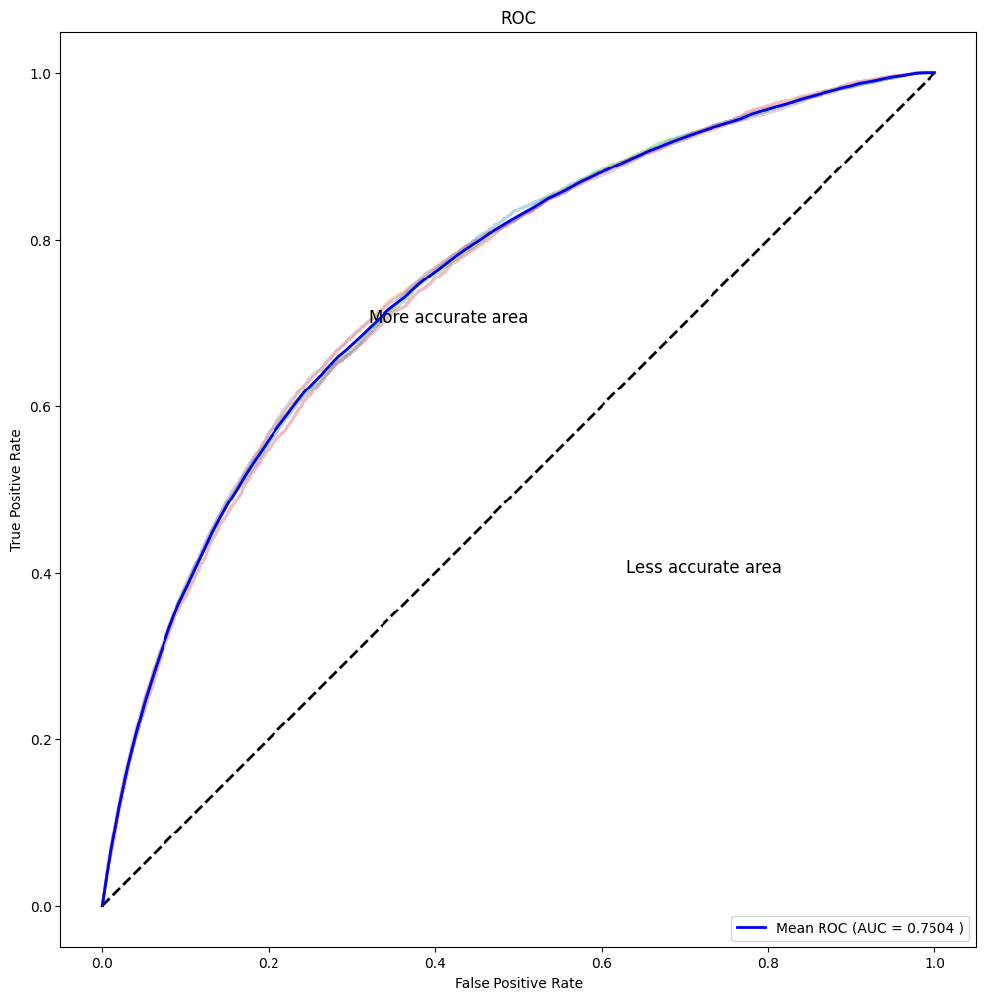

In [ ]:
plot_auc(pipeline, cv)

## AdaBoost - n=100

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.ensemble import AdaBoostClassifier
model = AdaBoostClassifier(n_estimators=100, random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(4249887,)
(4249887,)


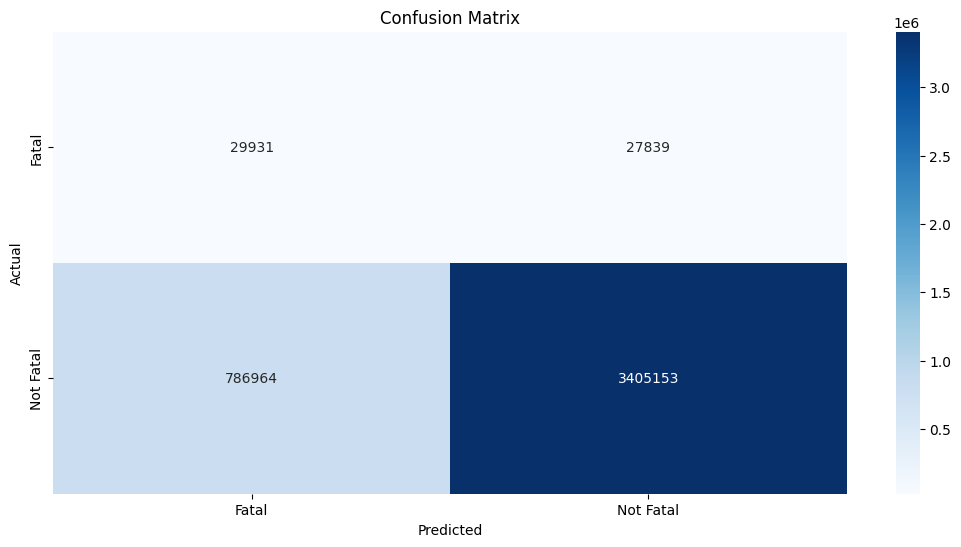

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

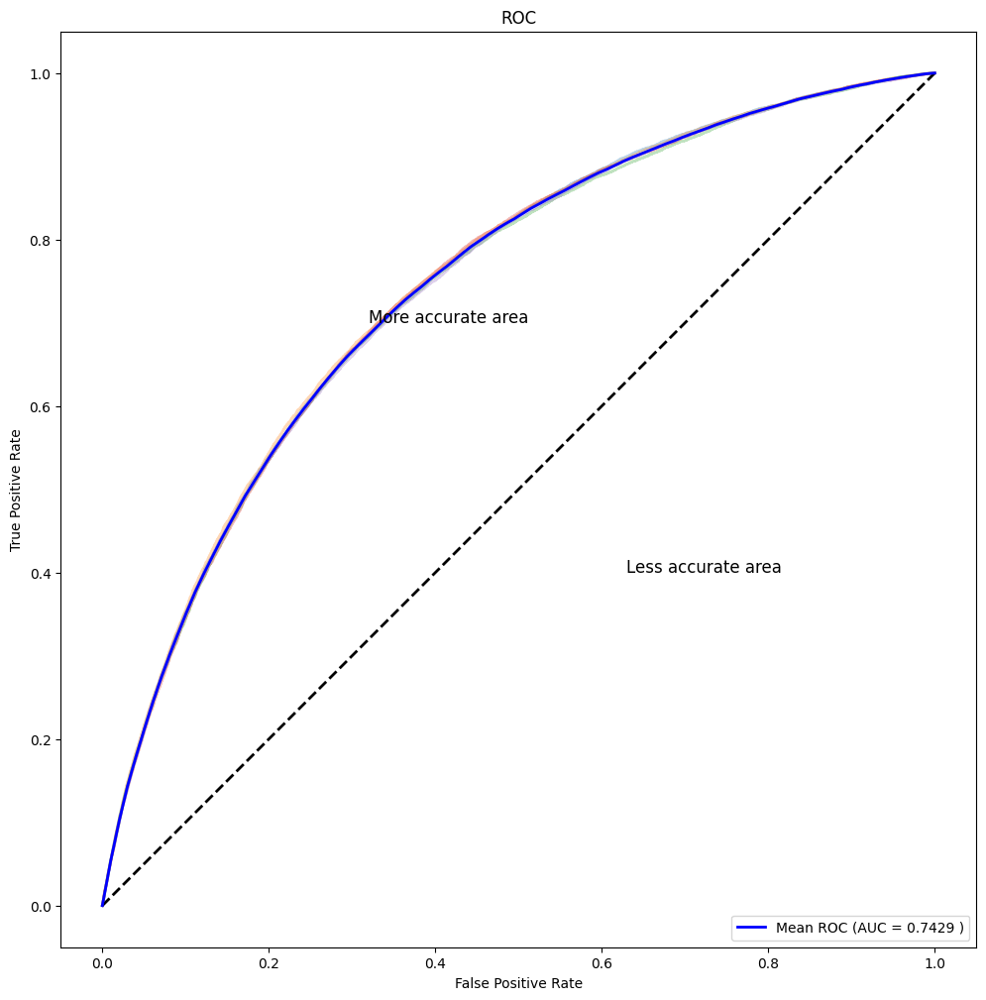

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(3397300,)
(3397300,)


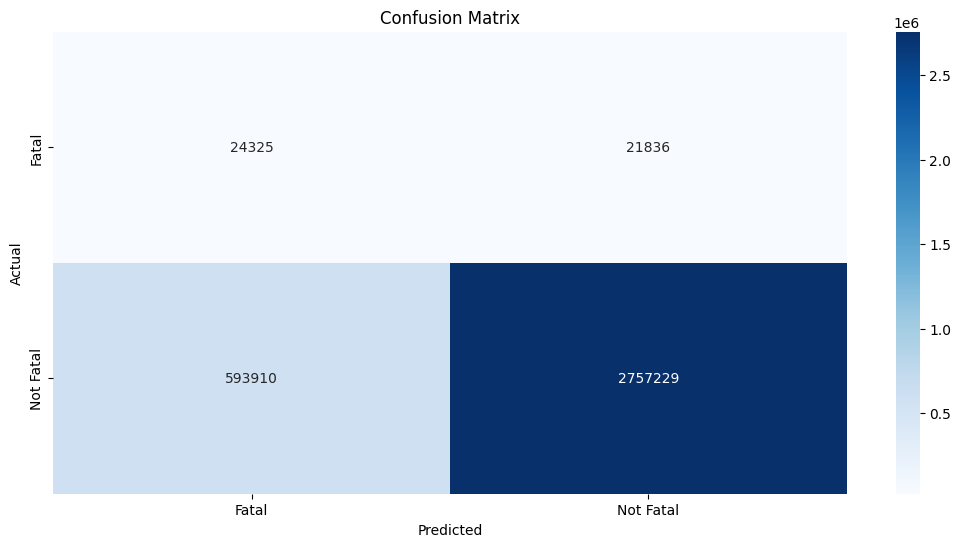

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

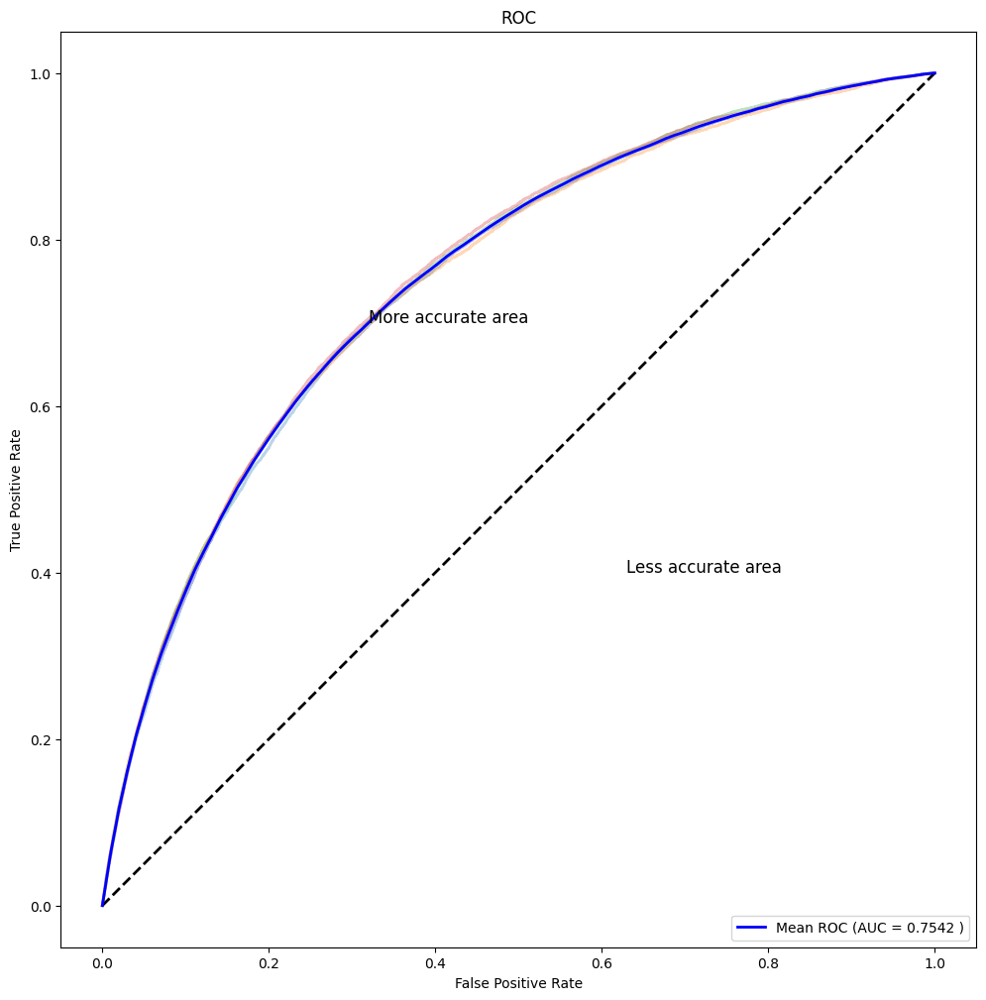

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(2333196,)
(2333196,)


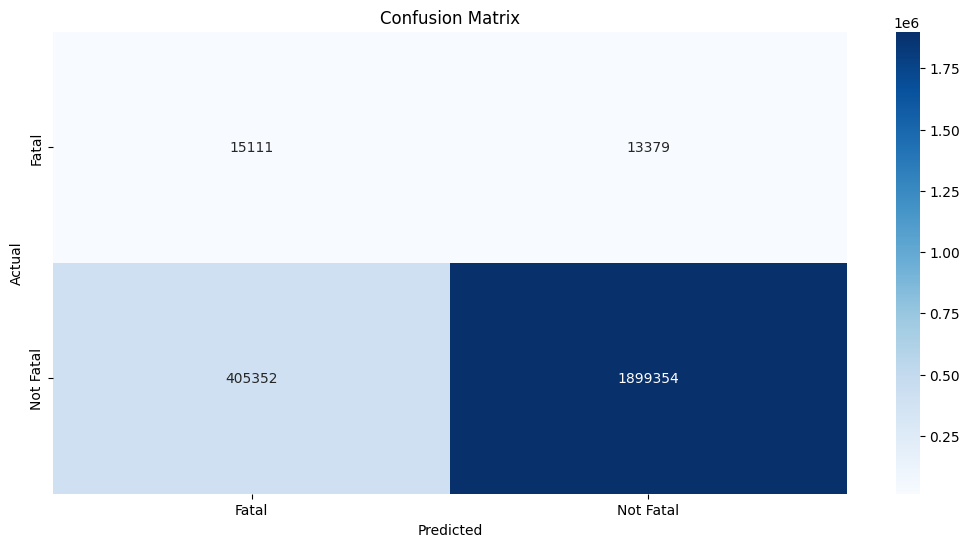

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

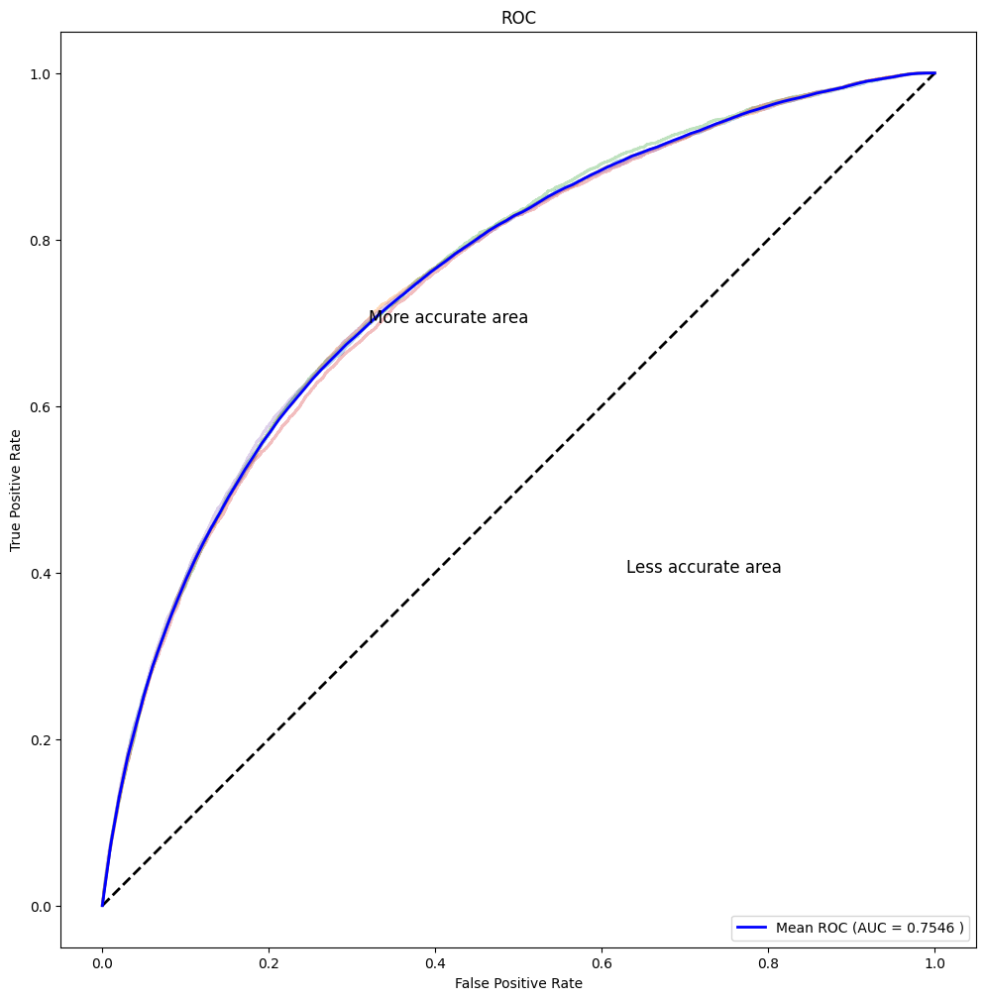

In [ ]:
plot_auc(pipeline, cv)

## AdaBoost - n=150

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.ensemble import AdaBoostClassifier
model = AdaBoostClassifier(n_estimators=150, random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

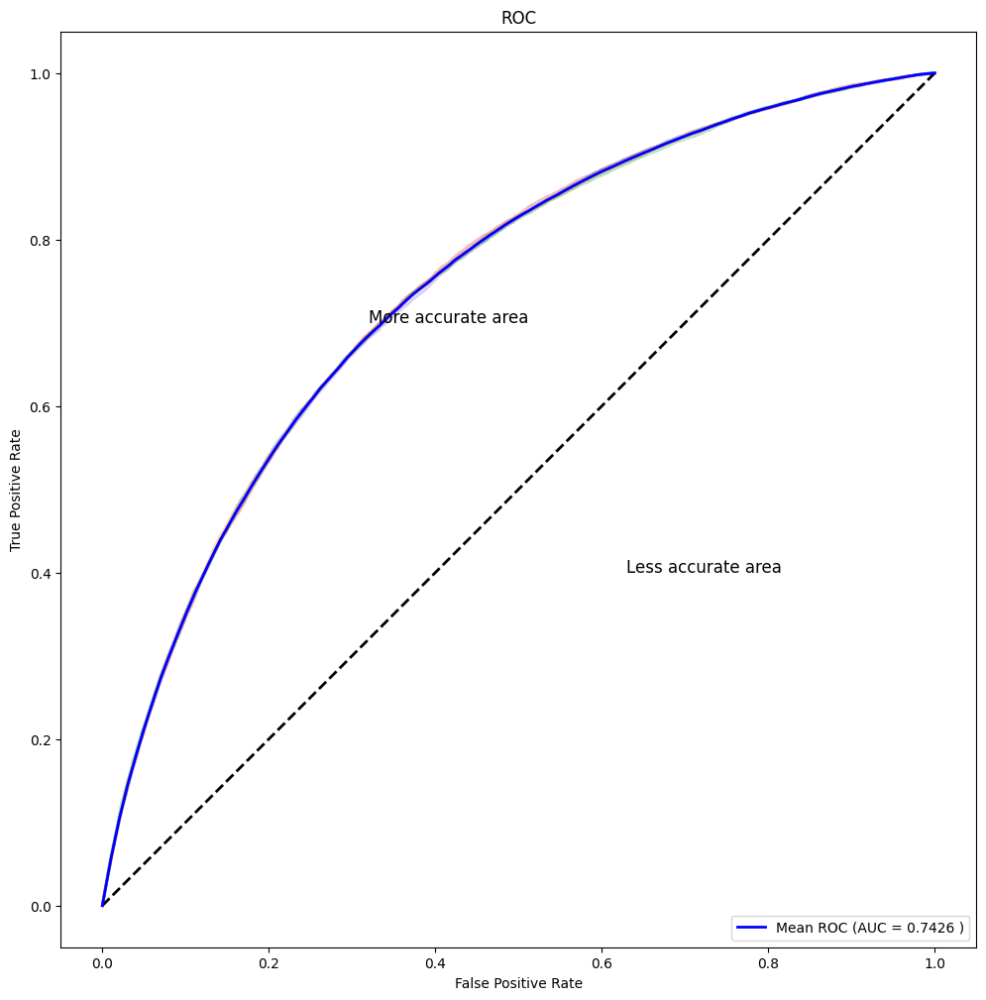

(4249887,)
(4249887,)


In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

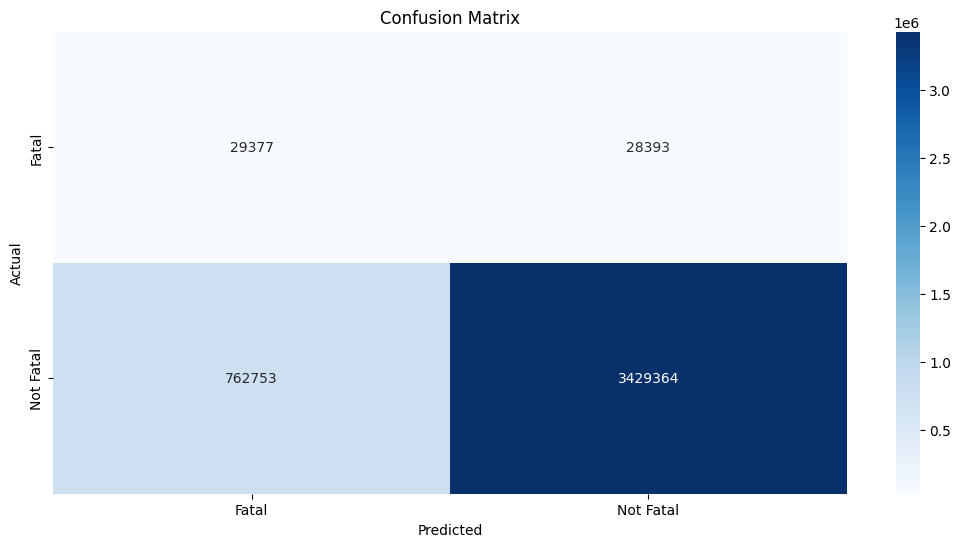

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

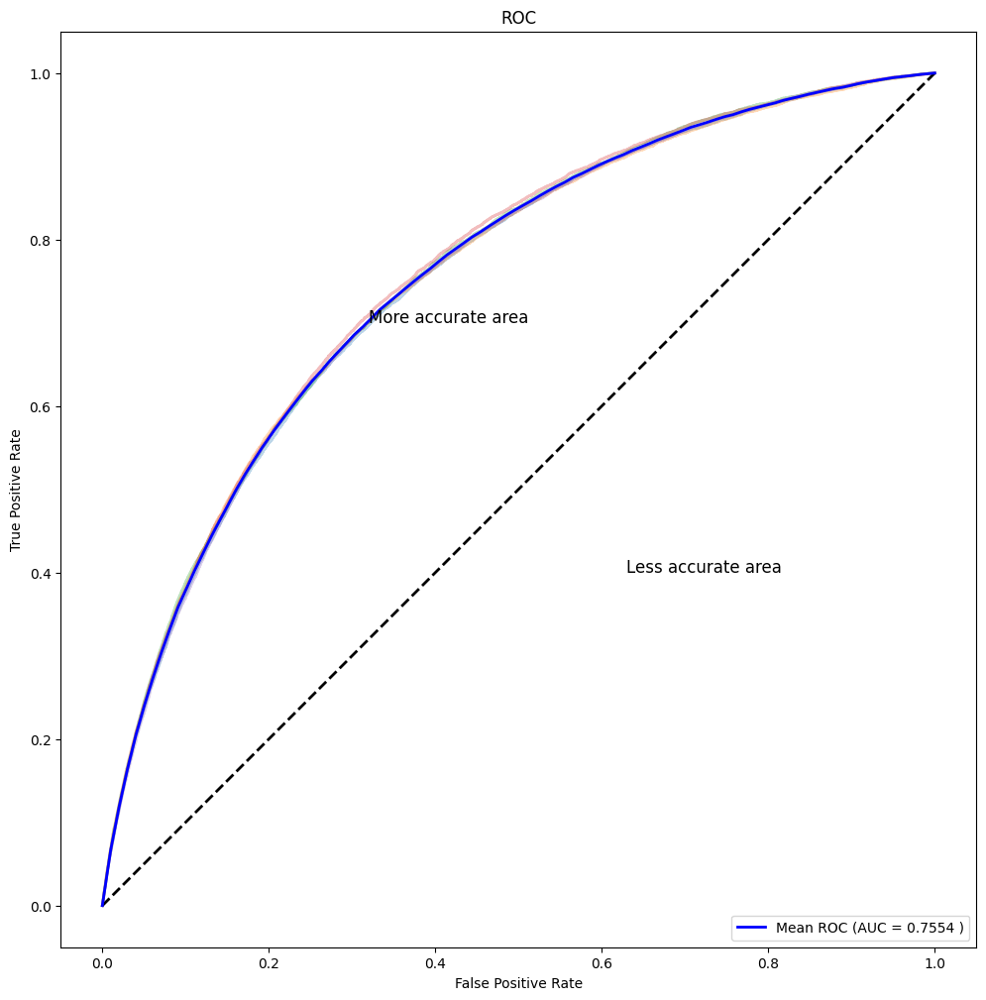

(3397300,)
(3397300,)


In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

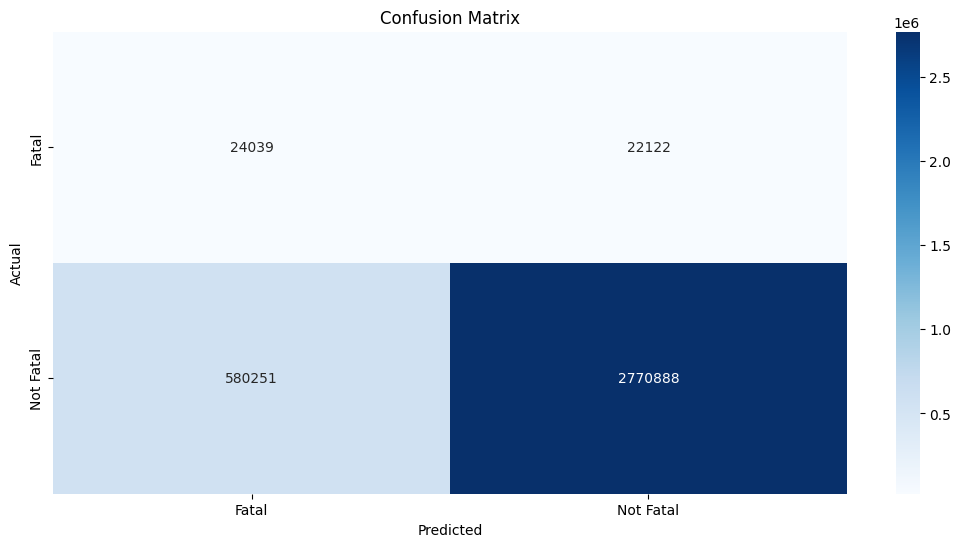

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

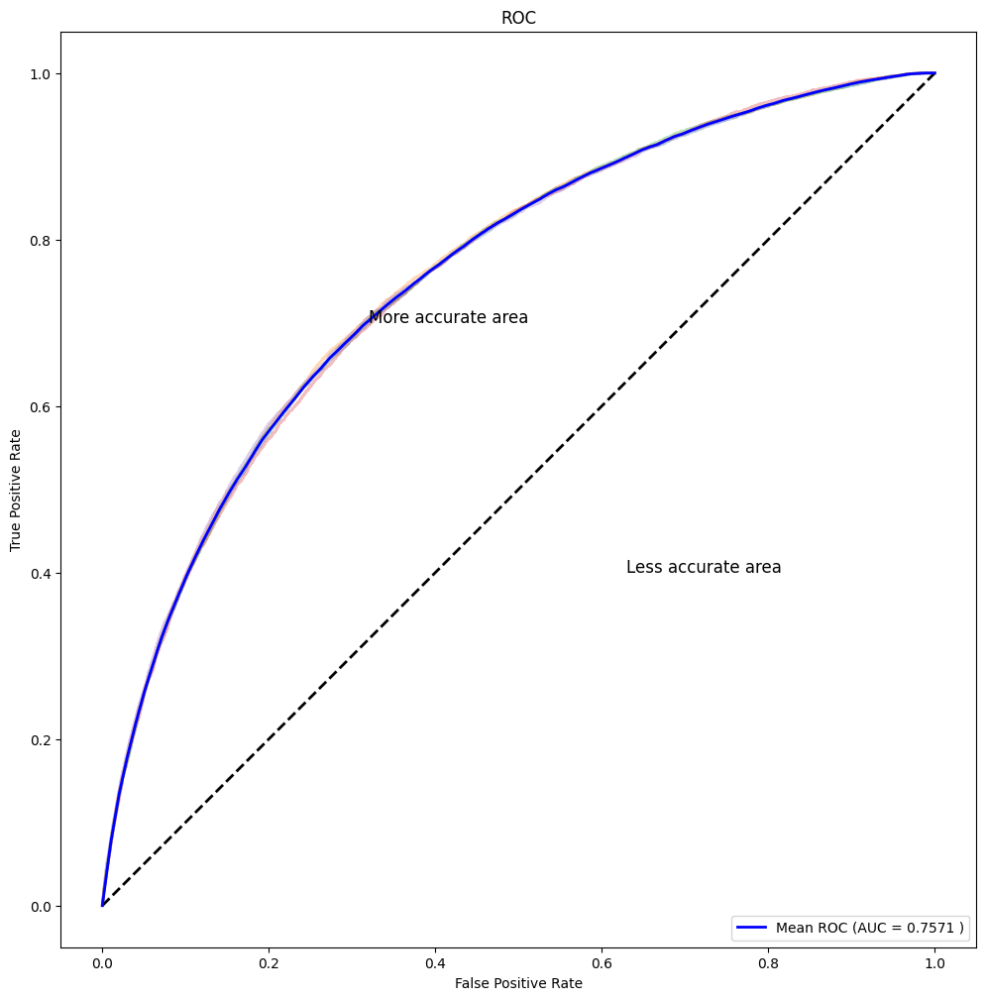

(2333196,)
(2333196,)


In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

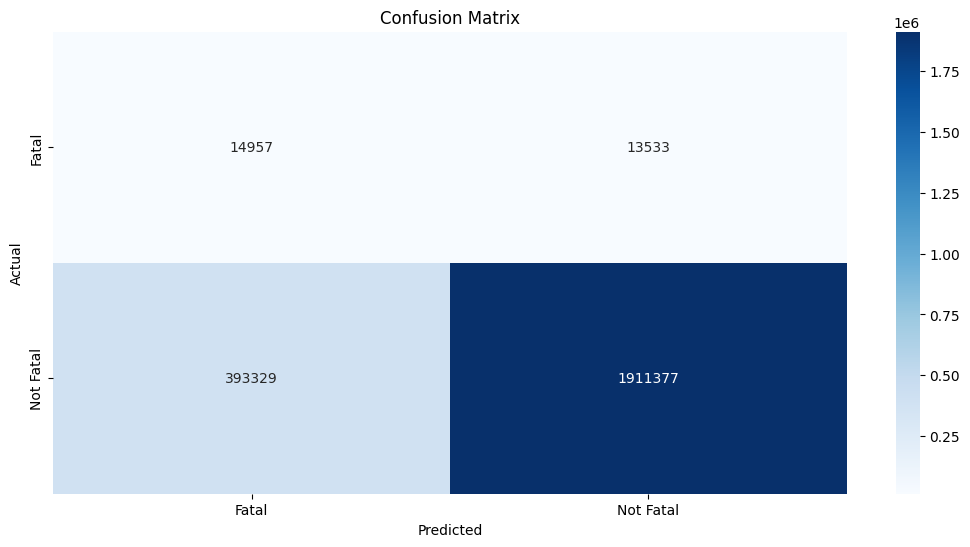

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

## Random Forest - n=50

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=50, criterion='gini', random_state=816, n_jobs=-1)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(4249887,)
(4249887,)


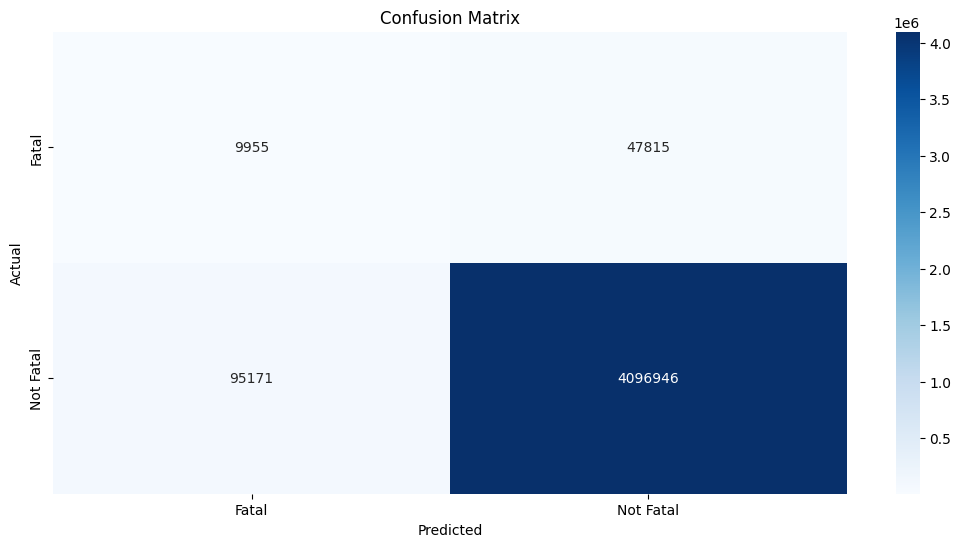

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

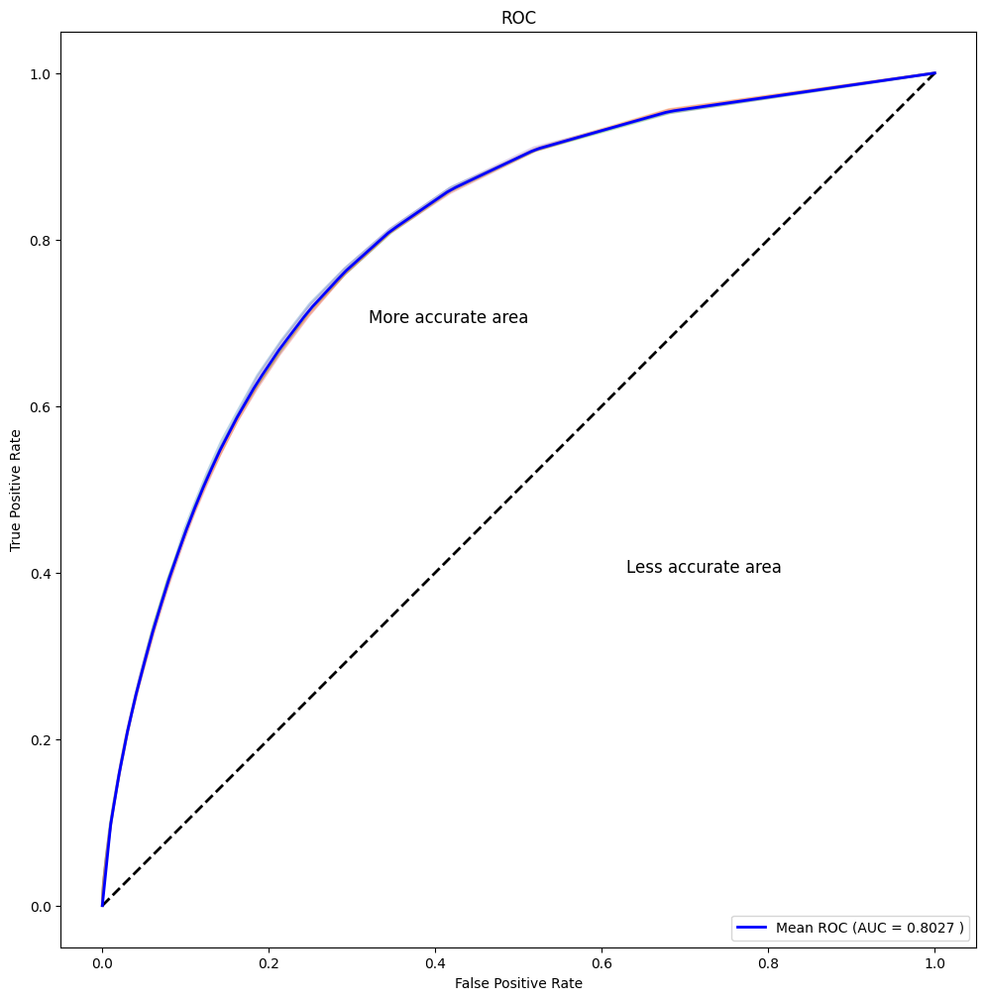

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(3397300,)
(3397300,)


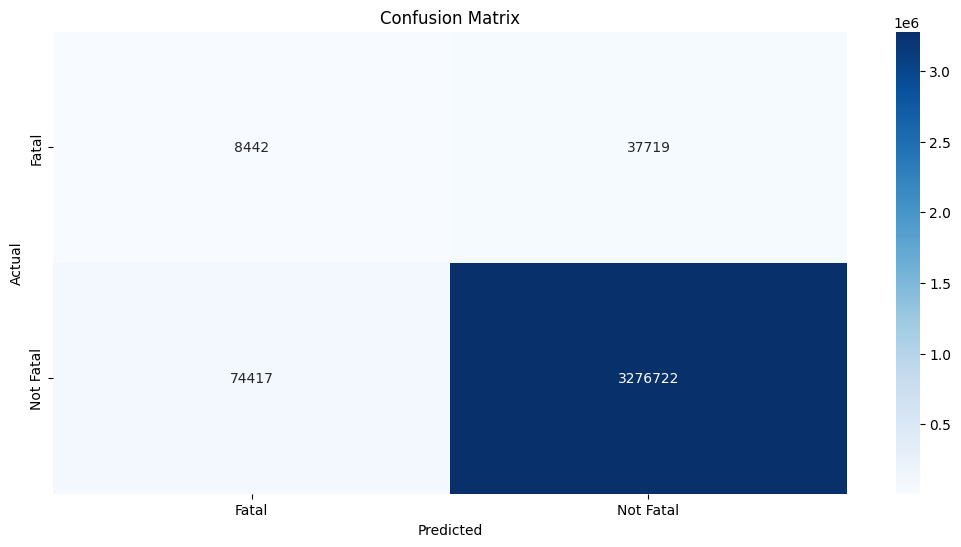

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

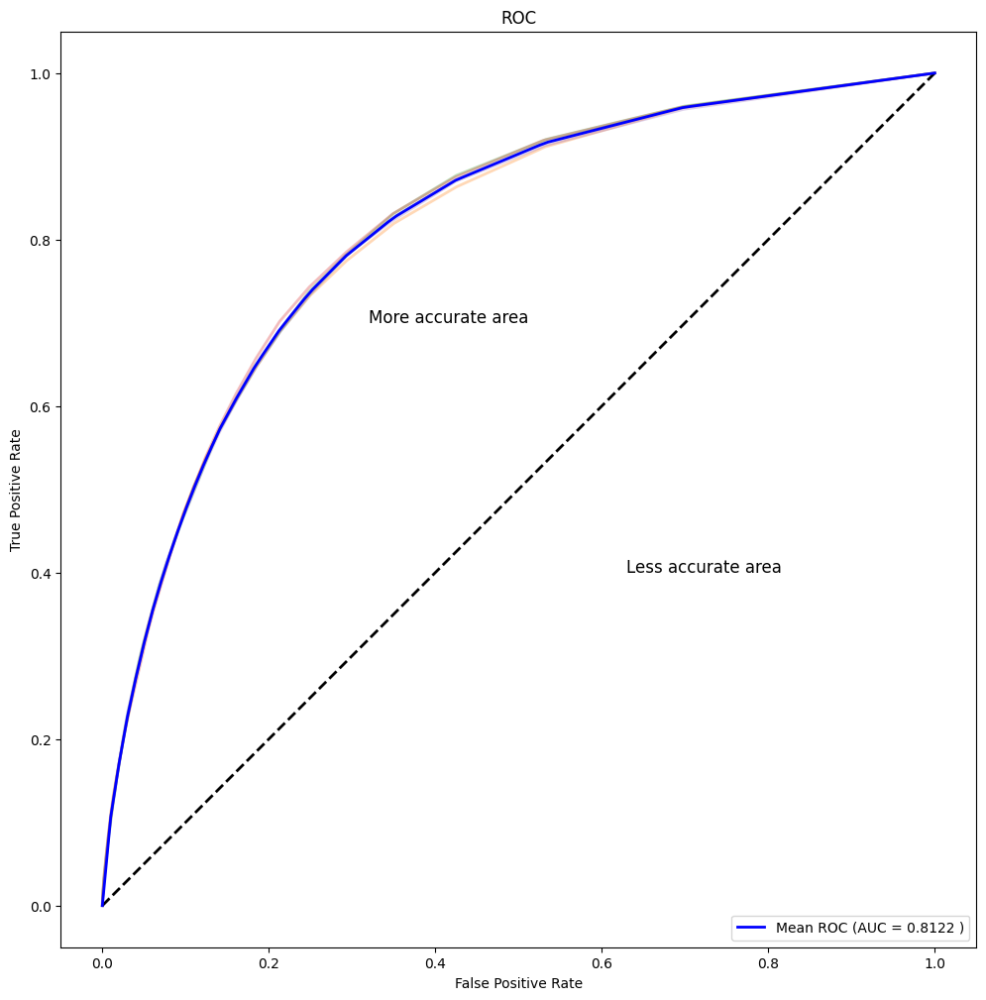

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(2333196,)
(2333196,)


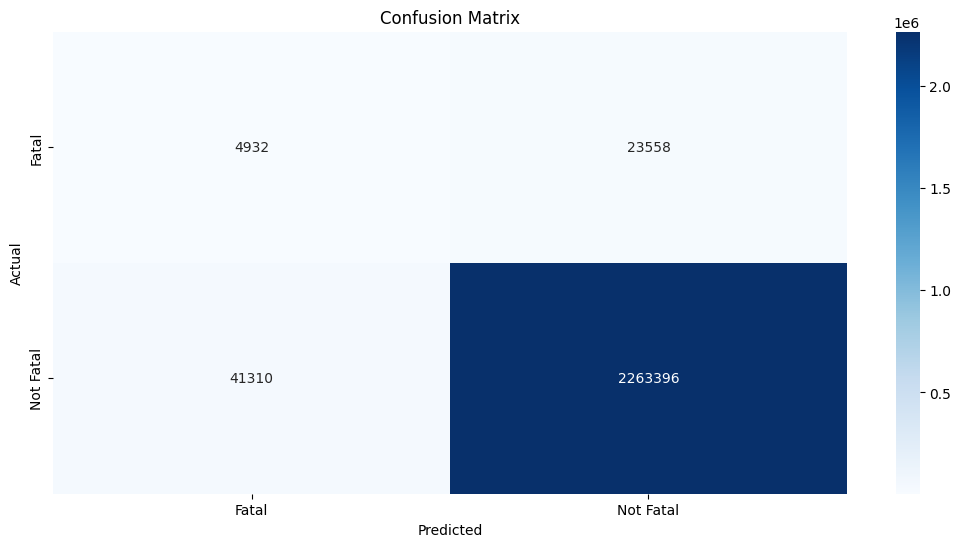

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

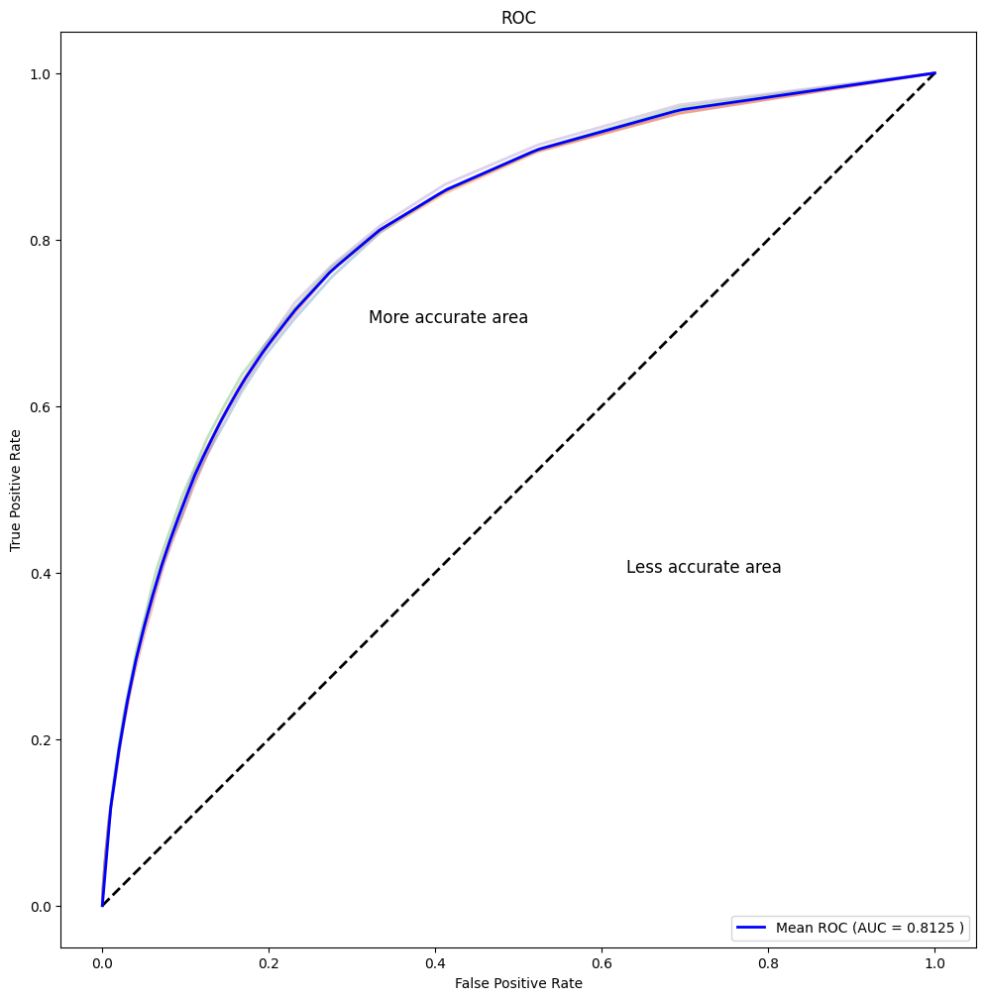

In [ ]:
plot_auc(pipeline, cv)

## Random Forest, n=100

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=100, criterion='gini', random_state=816, n_jobs=-1)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(4249887,)
(4249887,)


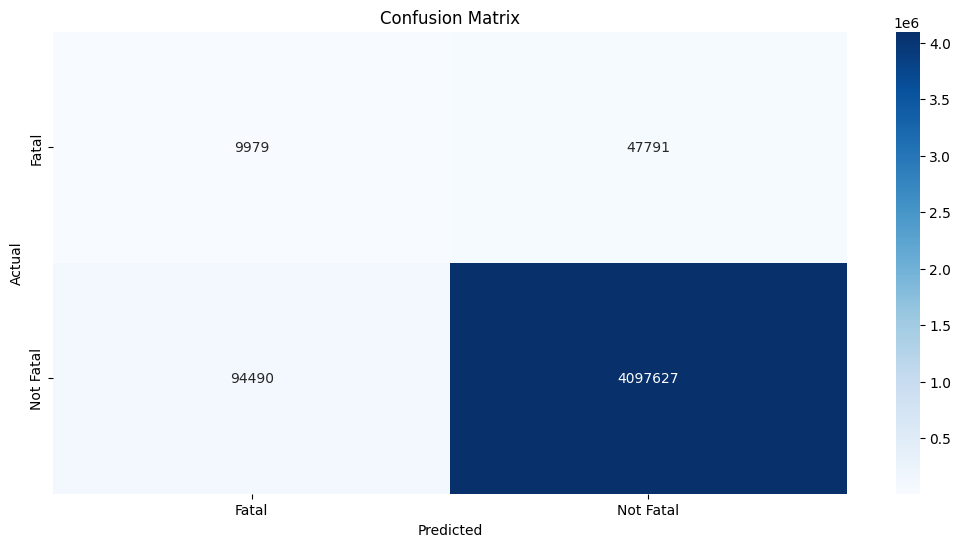

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

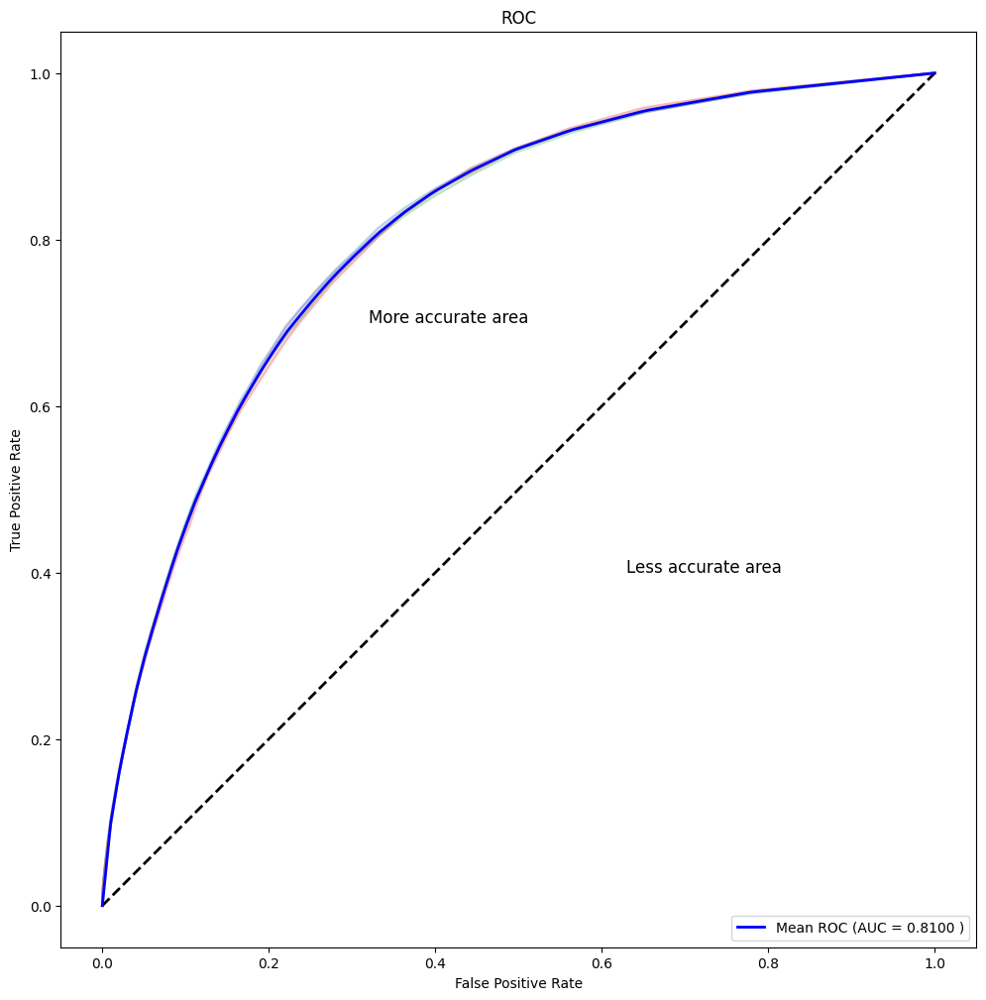

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(3397300,)
(3397300,)


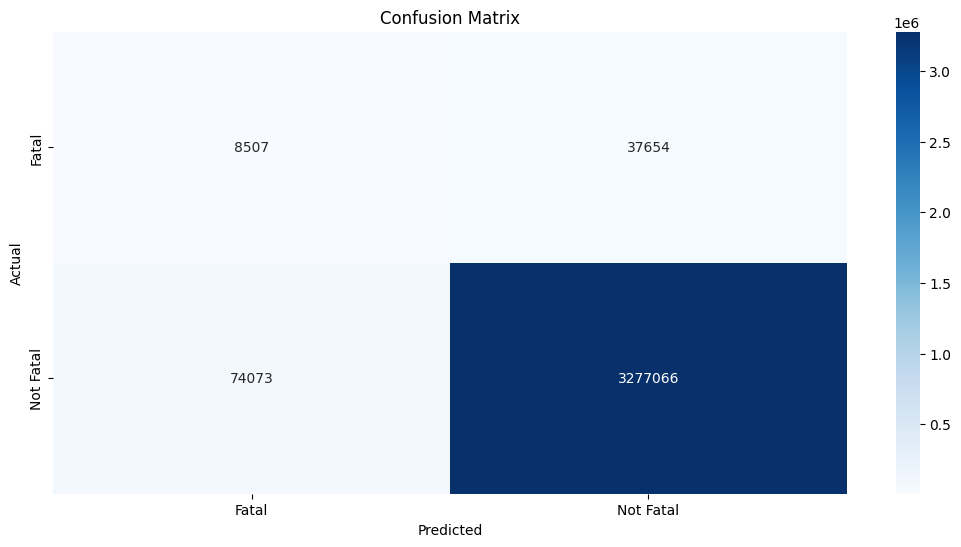

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

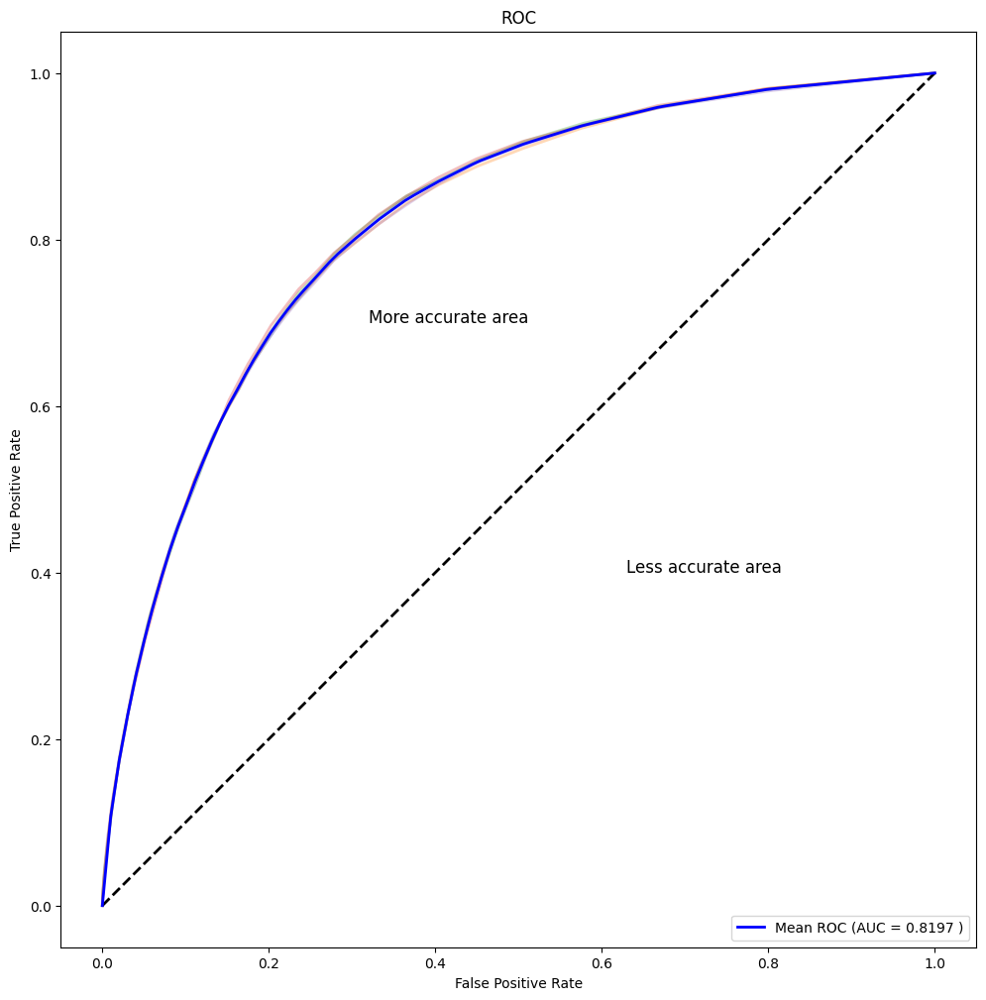

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(2333196,)
(2333196,)


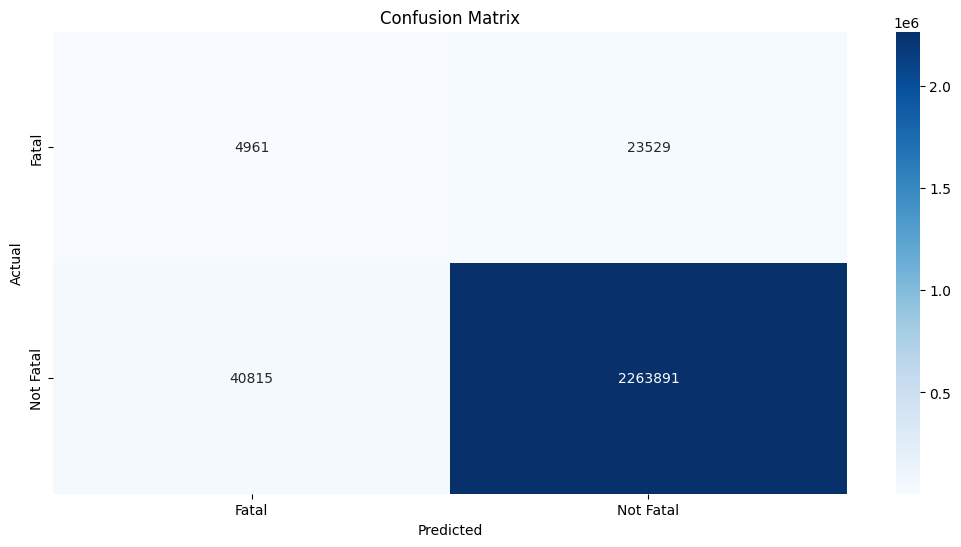

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

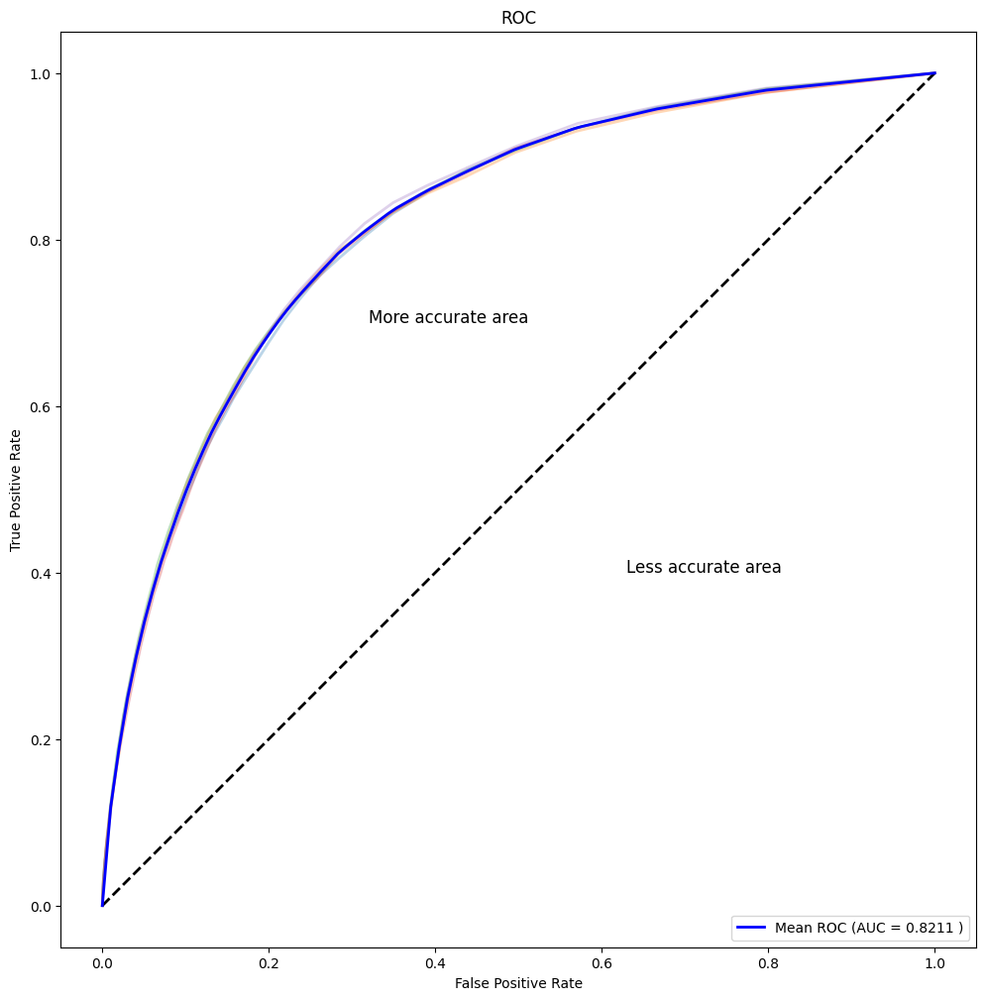

In [ ]:
plot_auc(pipeline, cv)

## Random Forest - n=150

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=150, criterion='gini', random_state=816, n_jobs=-1)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(4249887,)
(4249887,)


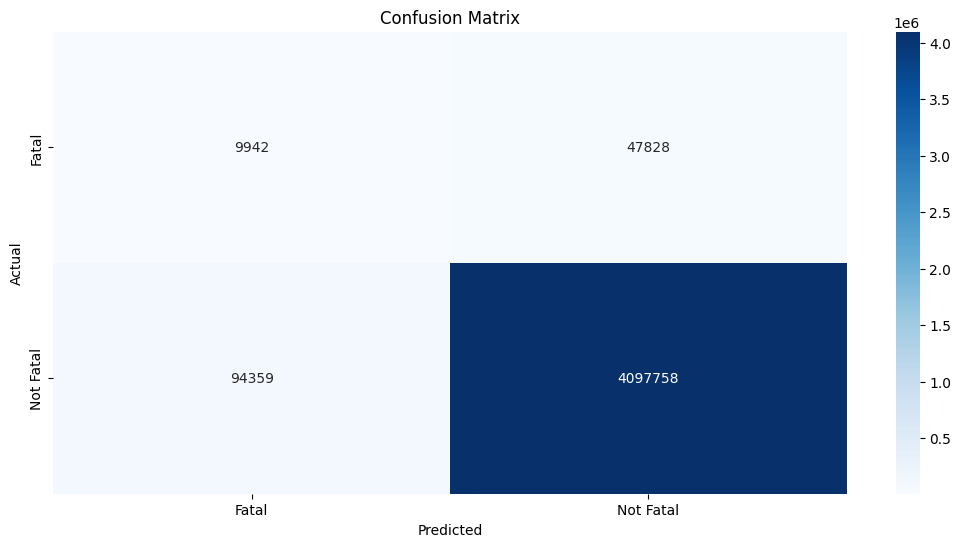

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

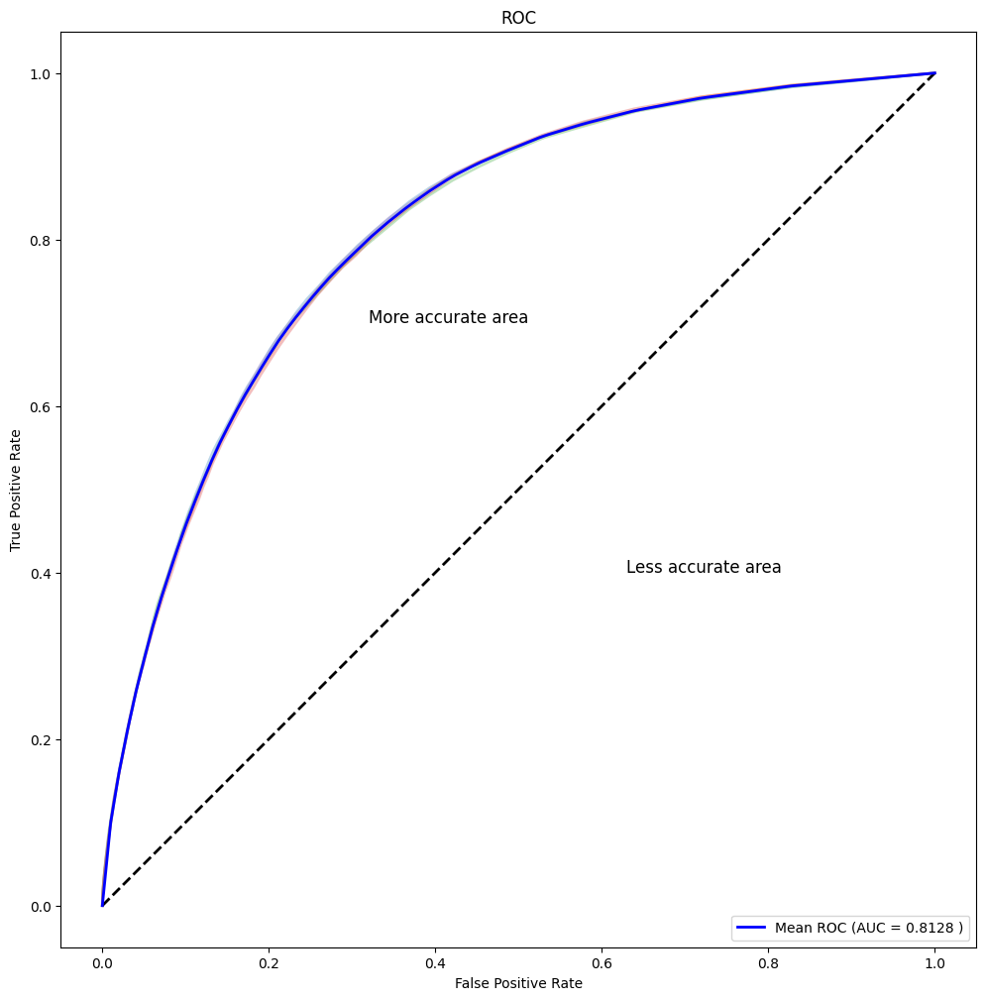

In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(3397300,)
(3397300,)


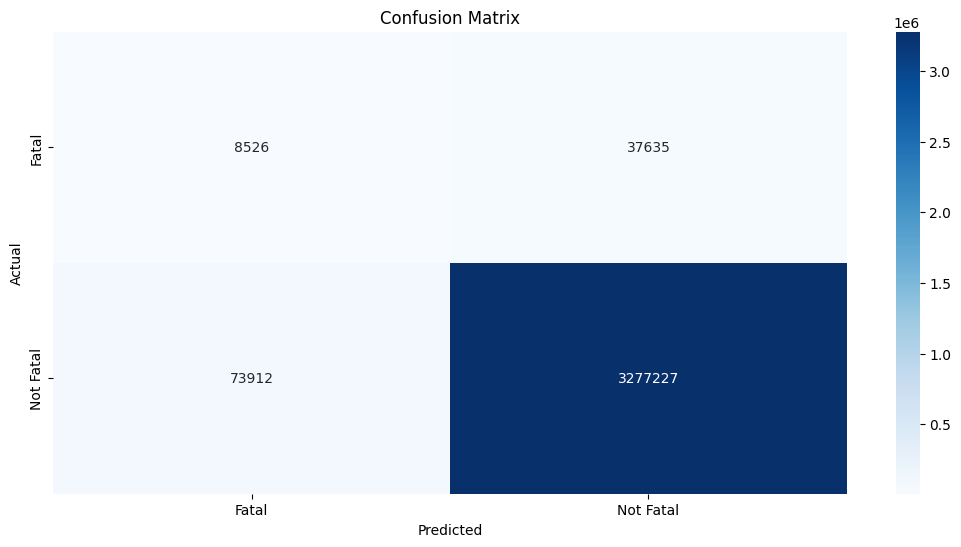

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

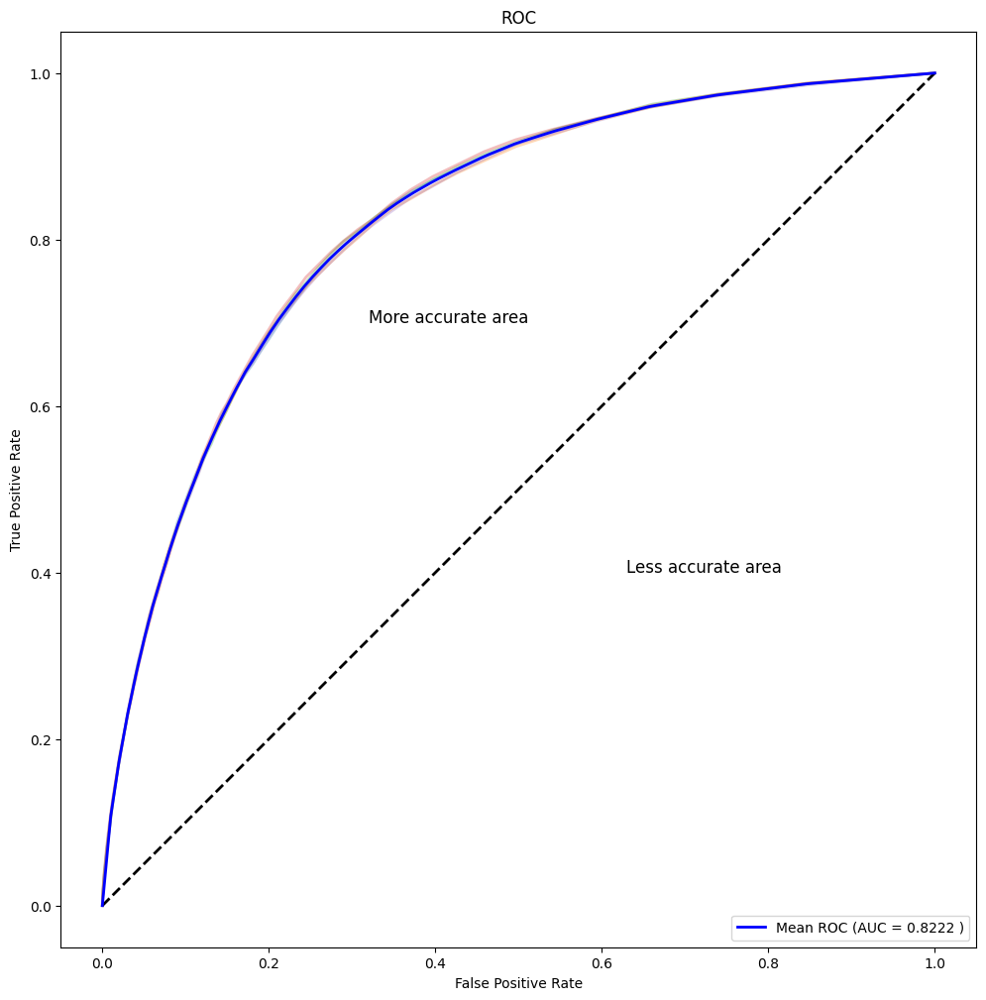

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(2333196,)
(2333196,)


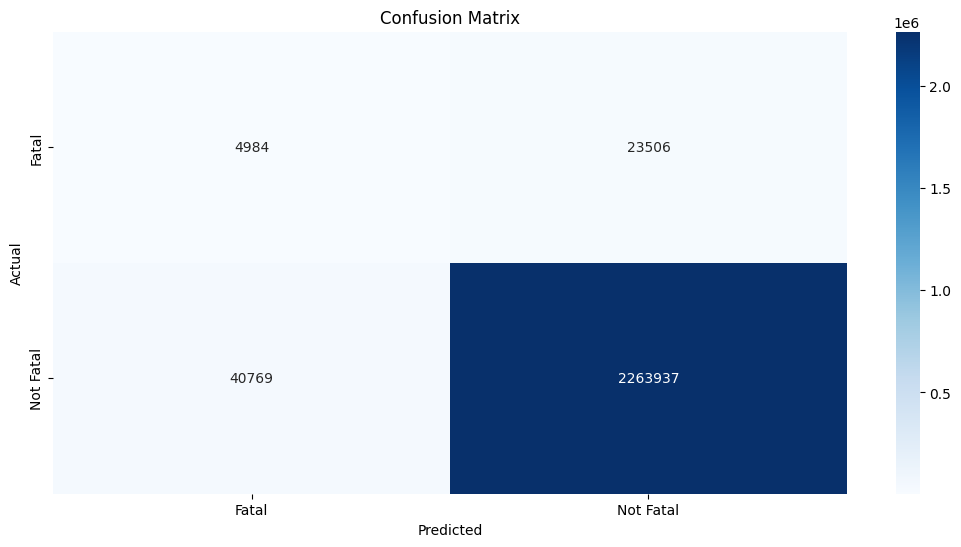

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

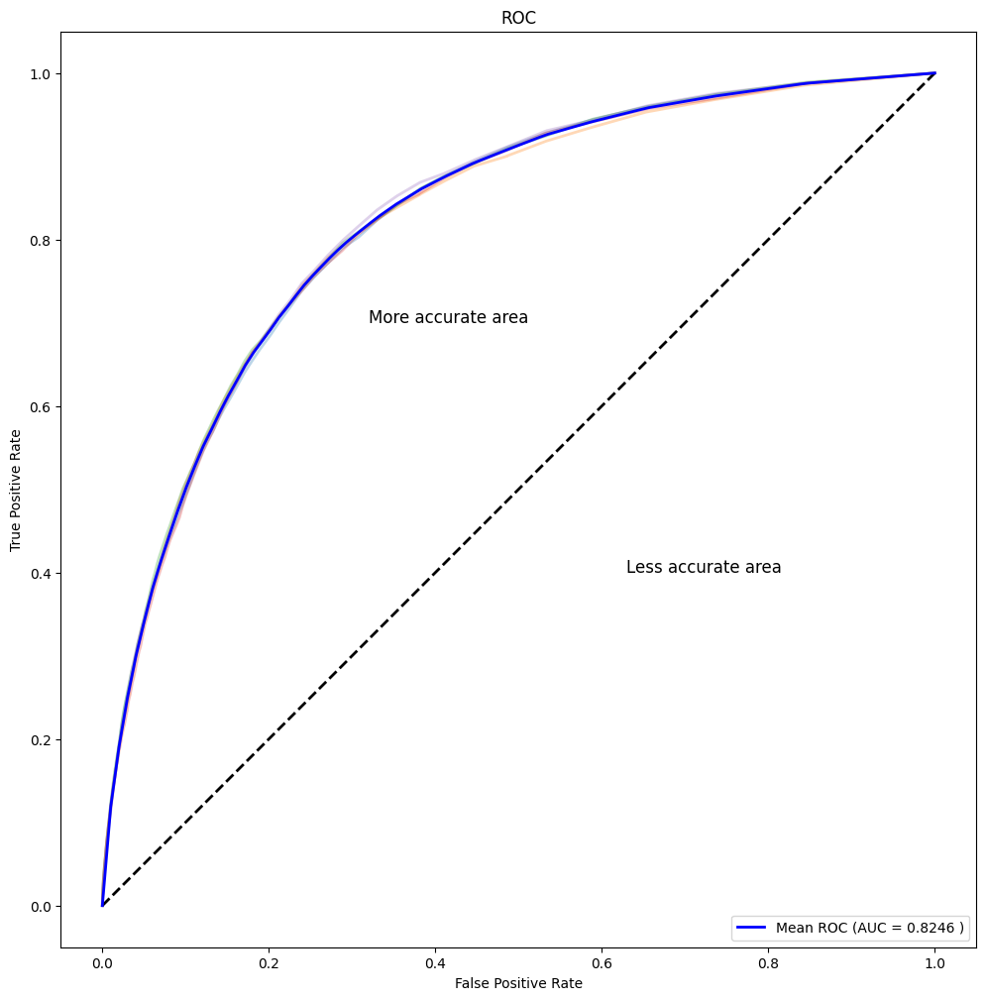

In [ ]:
plot_auc(pipeline, cv)

## XGBoost - n=100

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

import xgboost as xgb
model = xgb.XGBClassifier(objective="binary:logistic", n_estimators=100, random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(4249887,)
(4249887,)


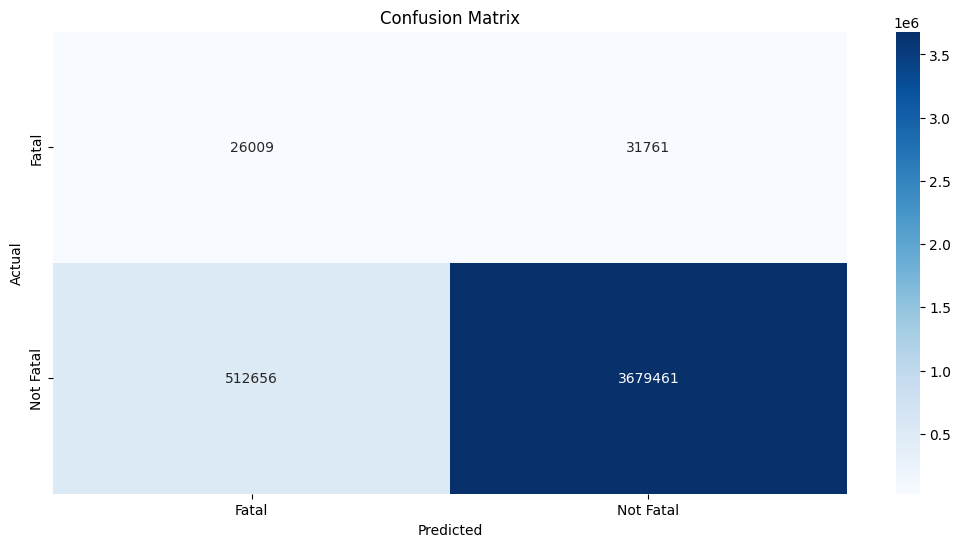

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

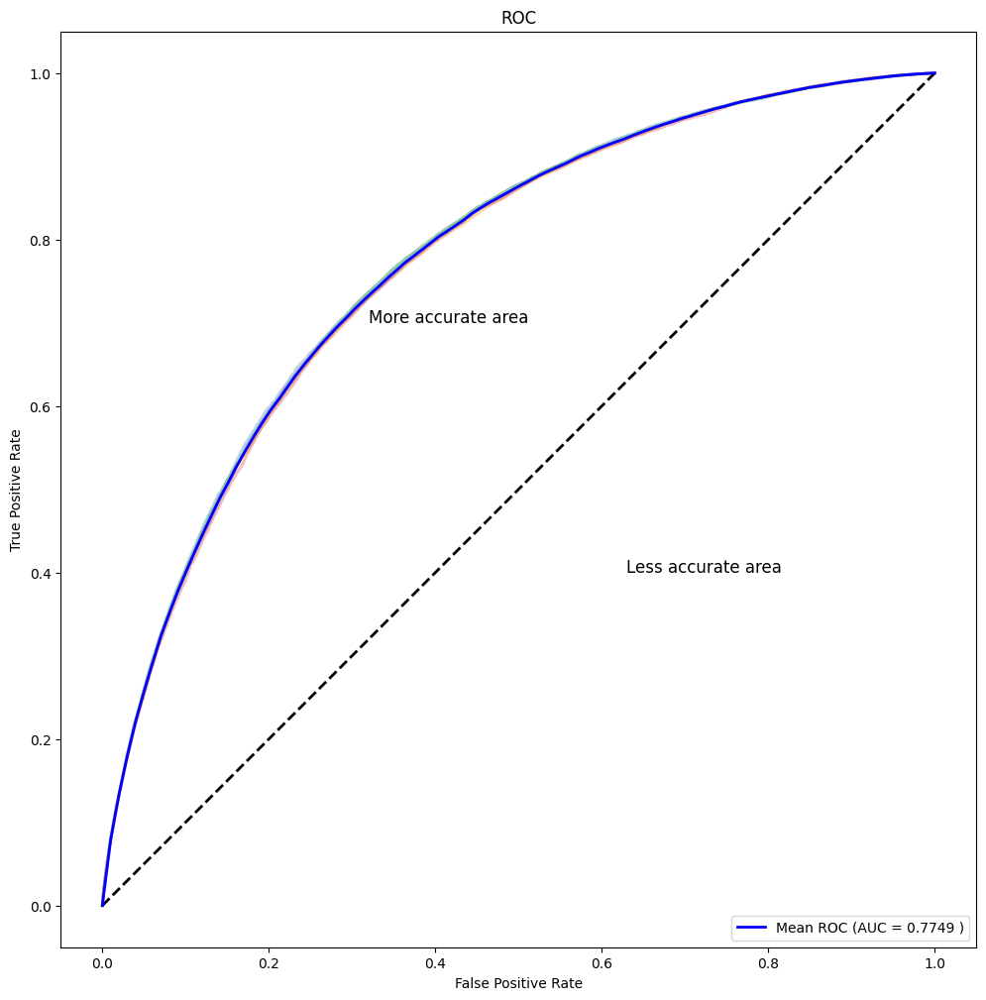

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(3397300,)
(3397300,)


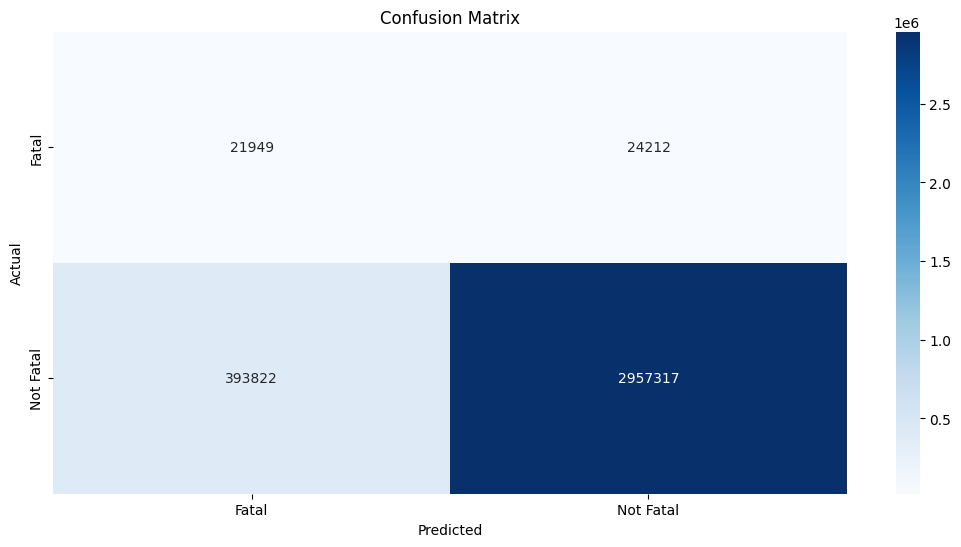

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

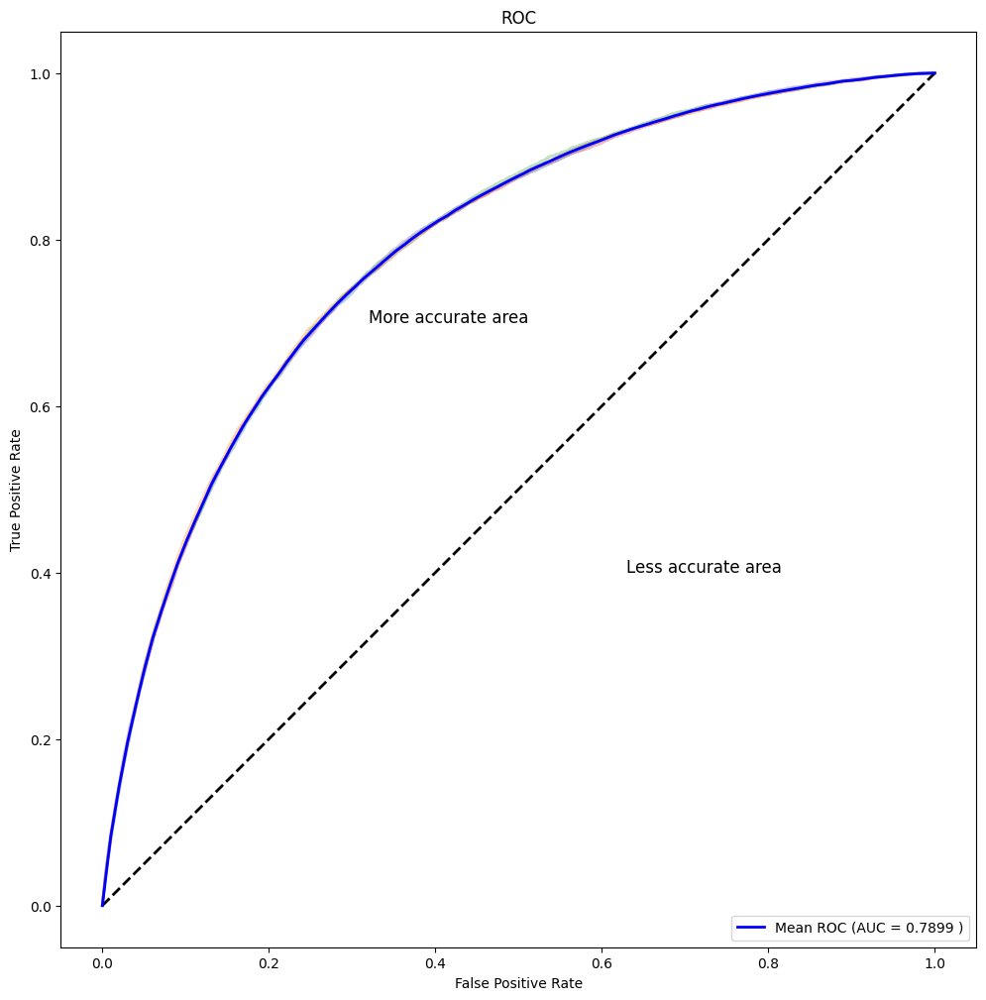

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(2333196,)
(2333196,)


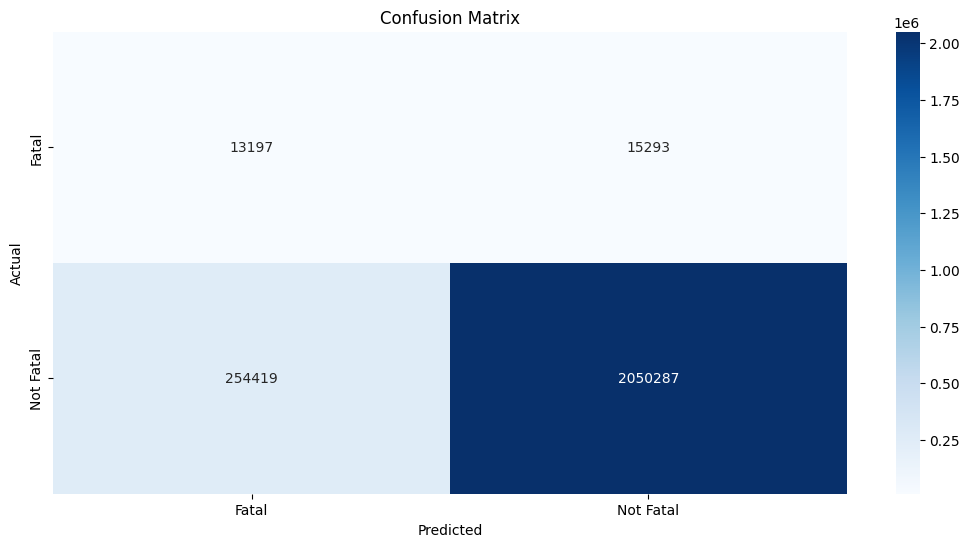

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

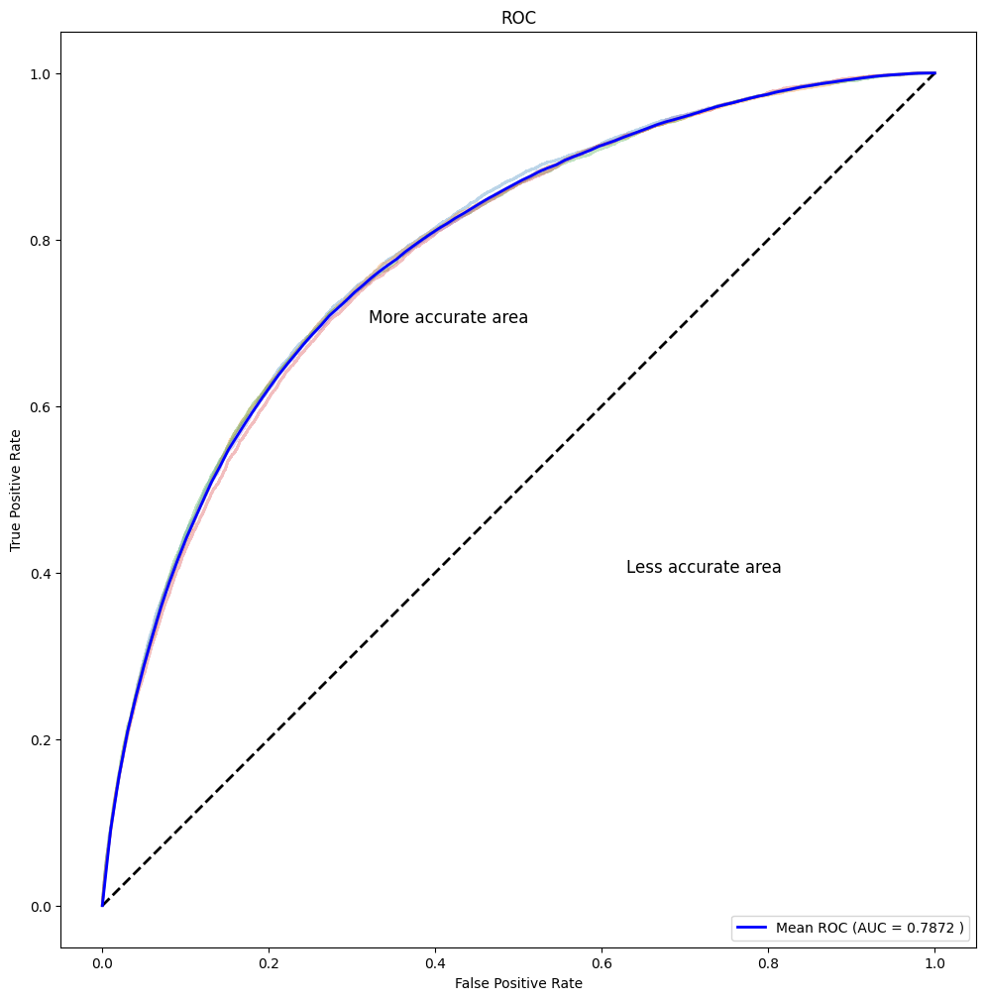

In [ ]:
plot_auc(pipeline, cv)

## XGBoost - n=200

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

import xgboost as xgb
model = xgb.XGBClassifier(objective="binary:logistic", n_estimators=200, random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(4249887,)
(4249887,)


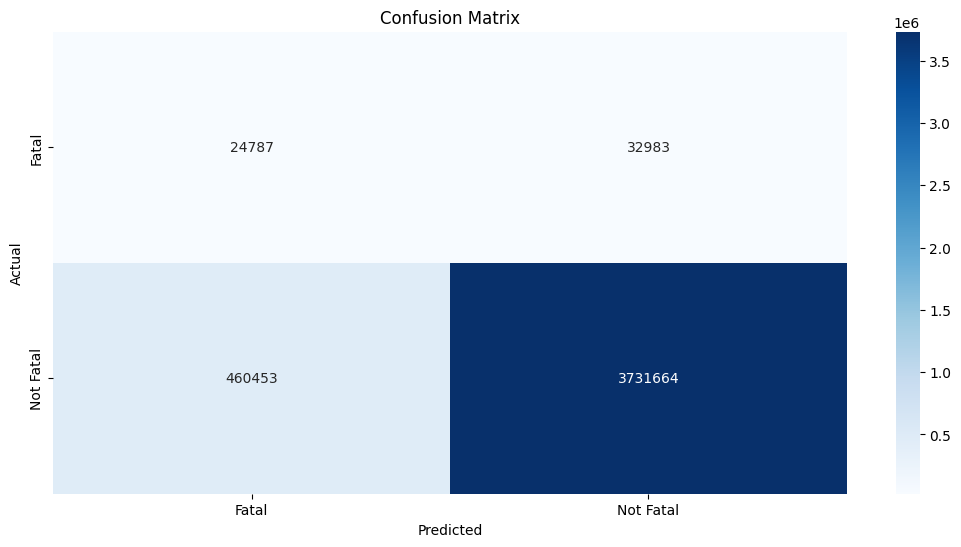

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

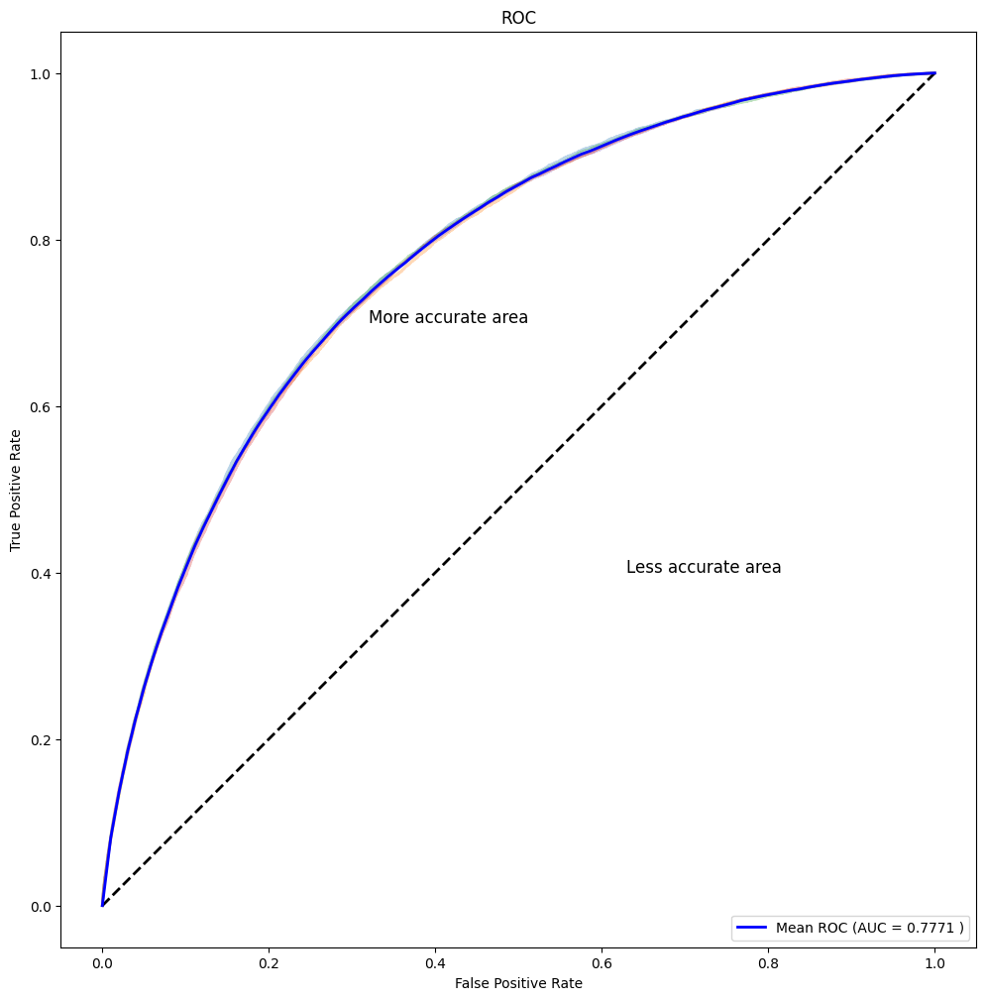

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(3397300,)
(3397300,)


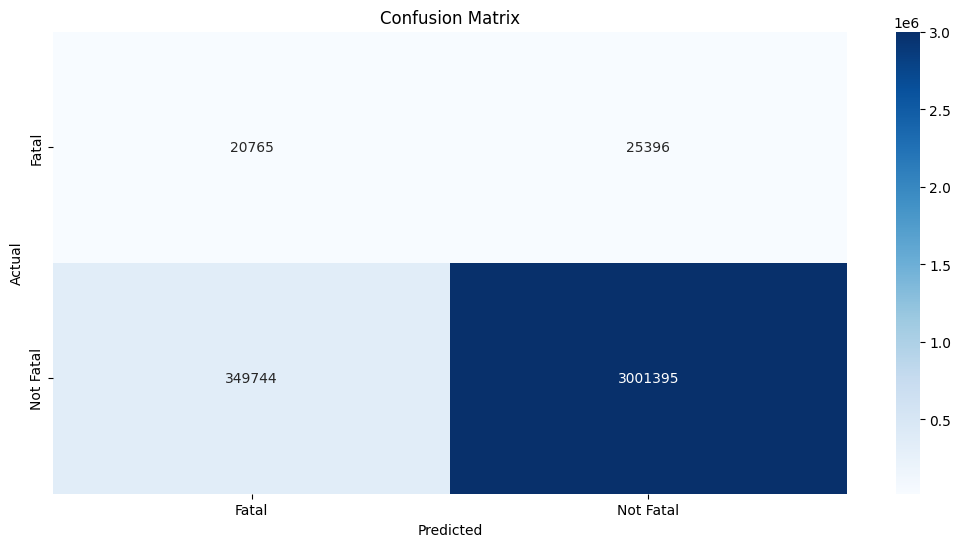

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

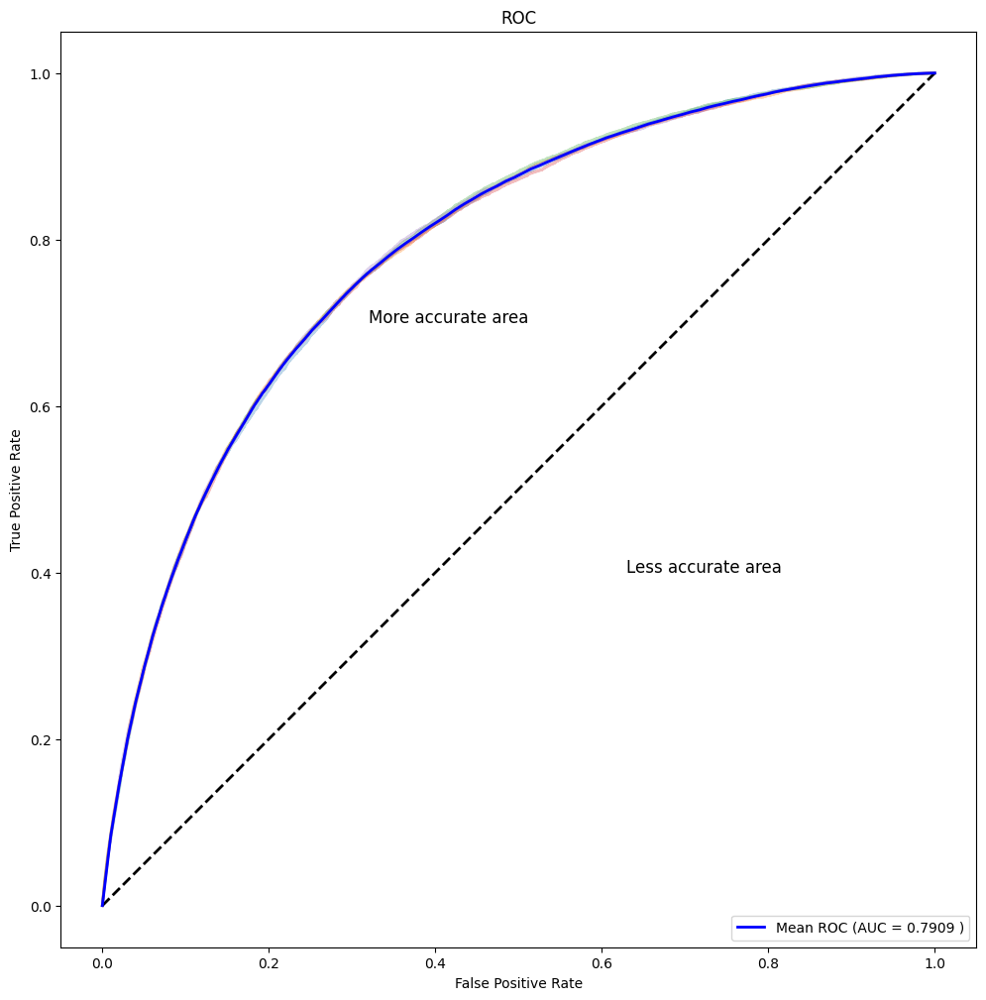

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(2333196,)
(2333196,)


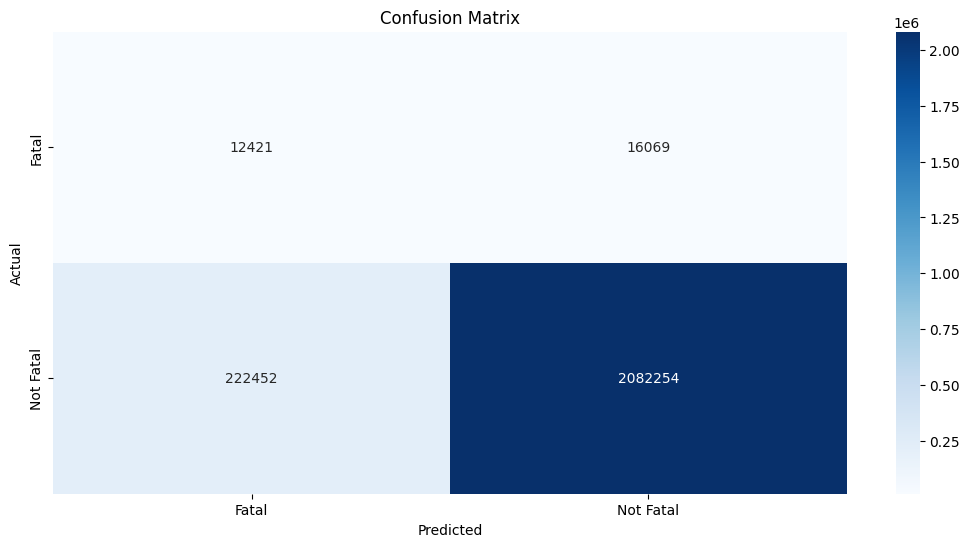

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

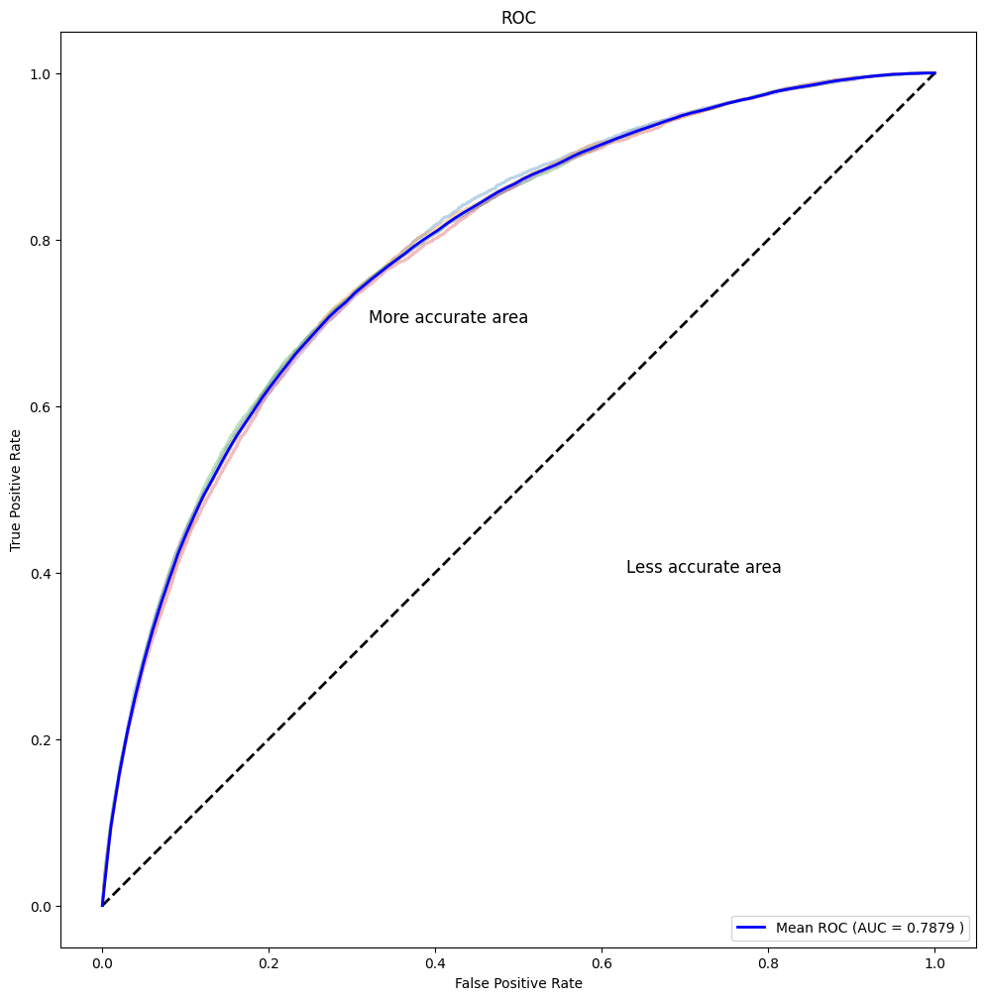

In [ ]:
plot_auc(pipeline, cv)

## XGBoost - n=300

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

import xgboost as xgb
model = xgb.XGBClassifier(objective="binary:logistic", n_estimators=300, random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(4249887,)
(4249887,)


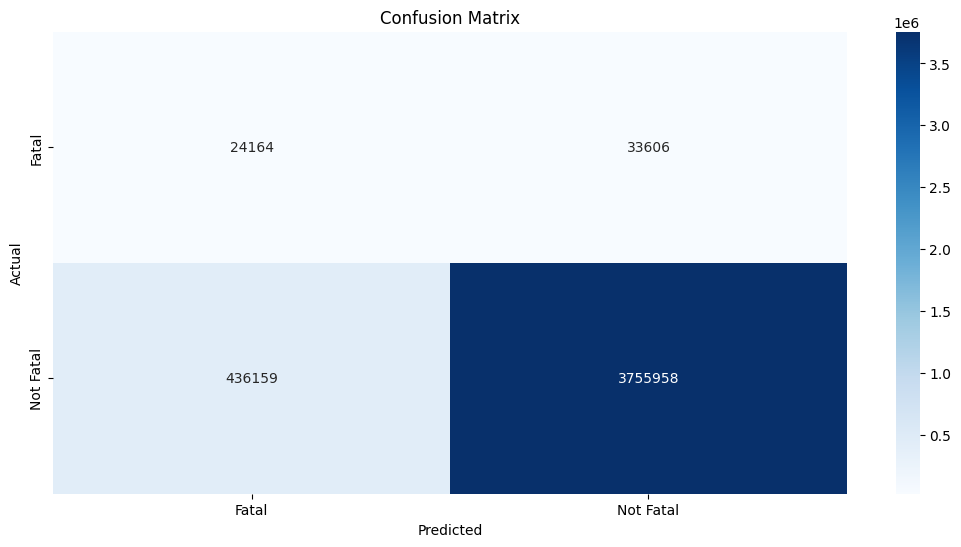

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

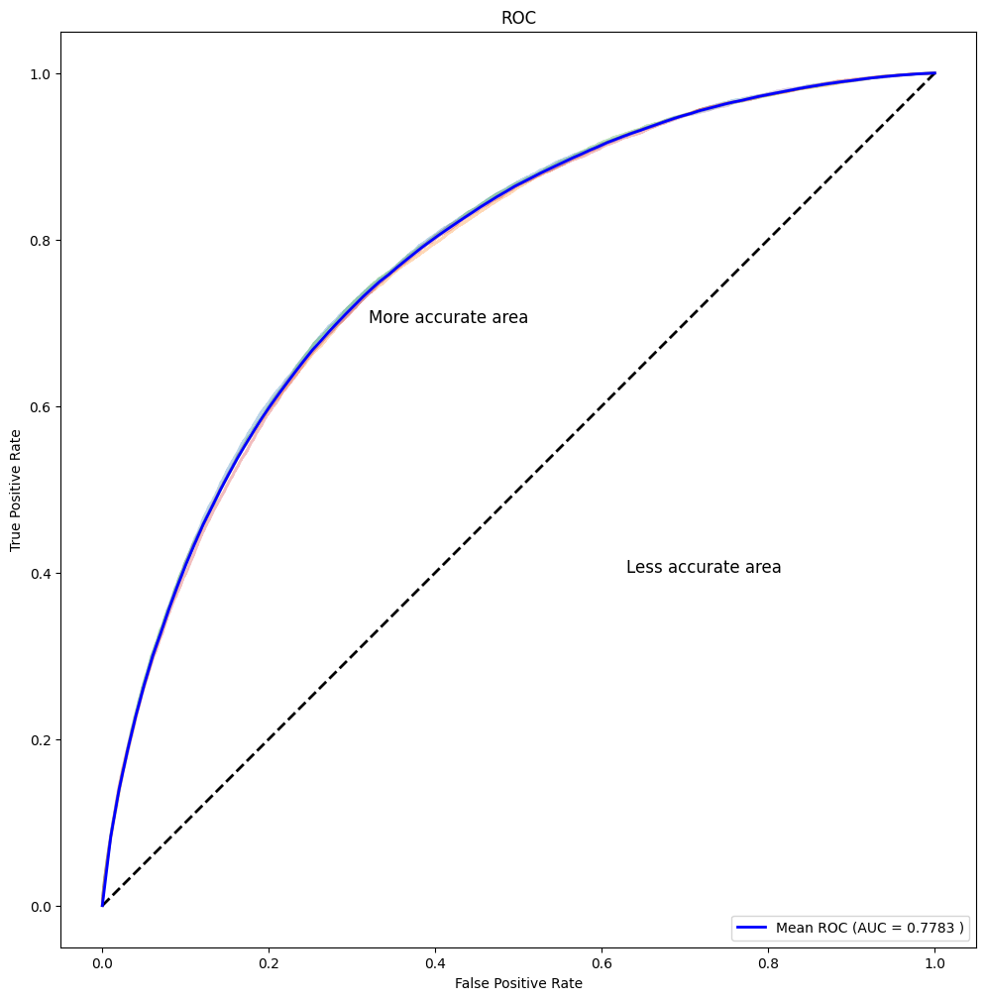

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(3397300,)
(3397300,)


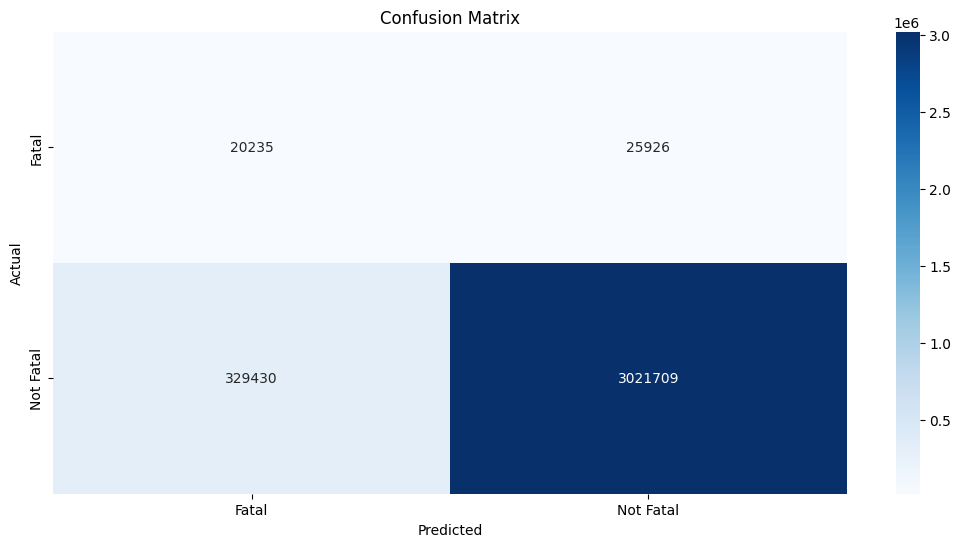

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

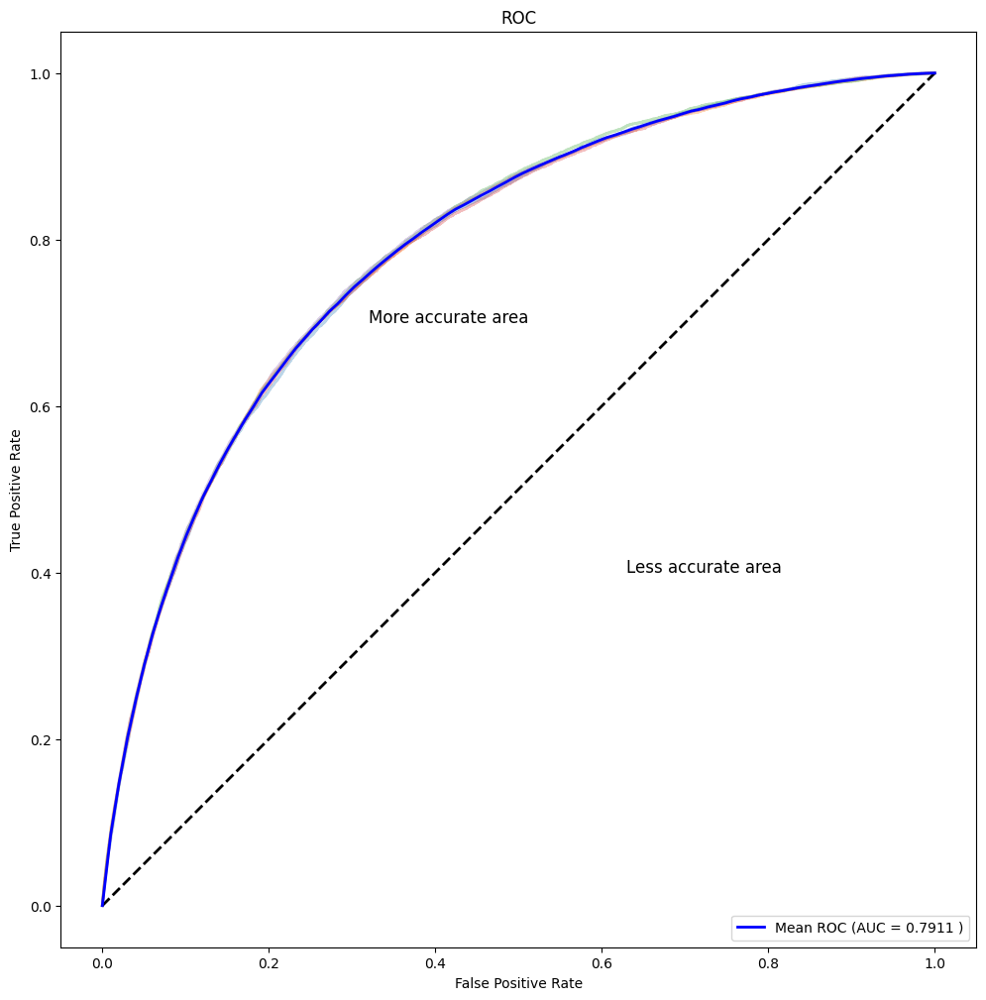

In [ ]:
plot_auc(pipeline, cv)

In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, _ = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(2333196,)
(2333196,)


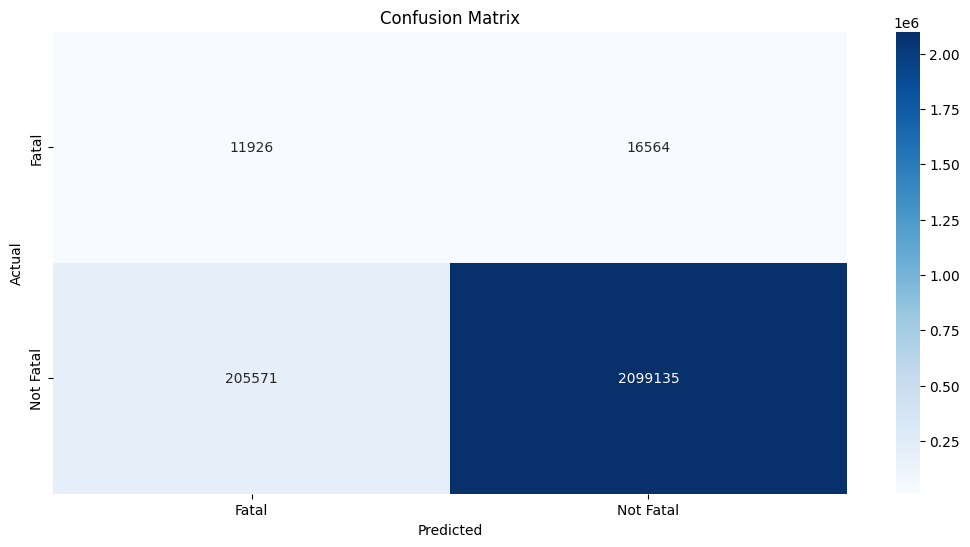

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

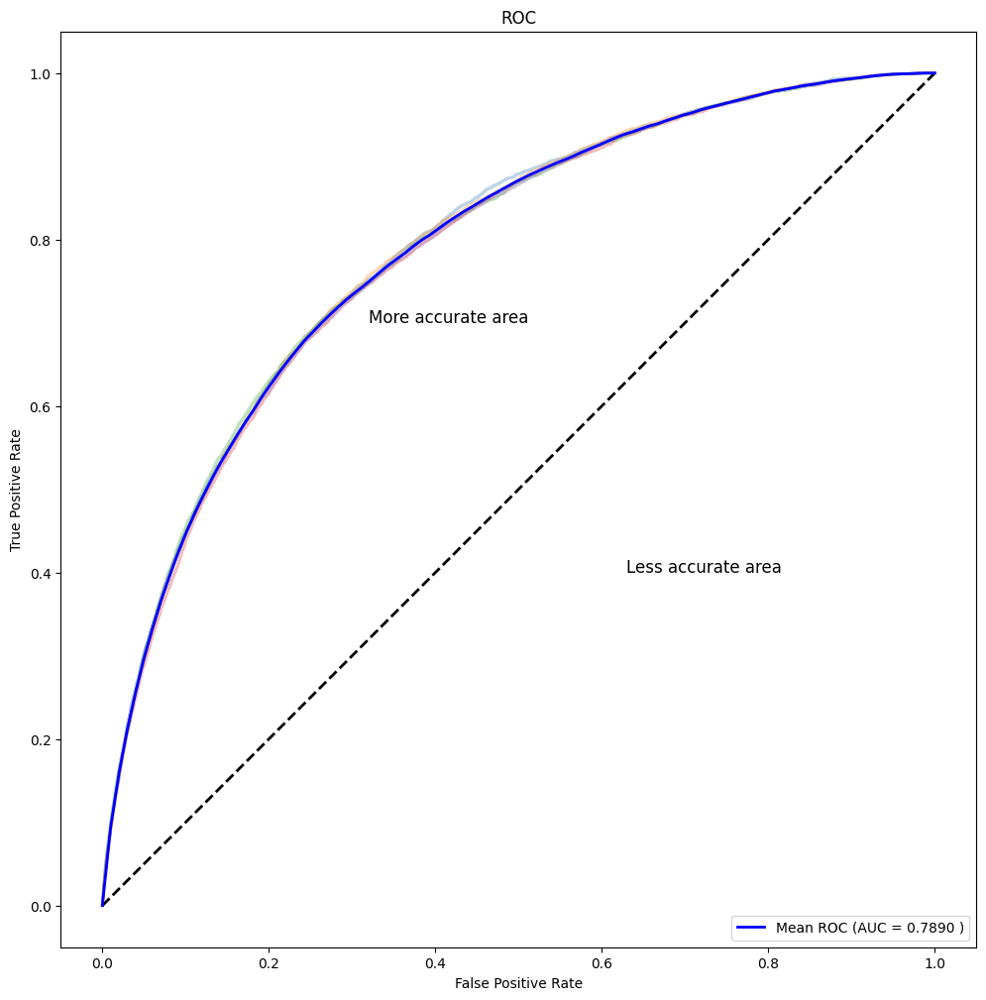

In [ ]:
plot_auc(pipeline, cv)

## MLP - (100)

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.neural_network import MLPClassifier
model = MLPClassifier(hidden_layer_sizes=(100,),activation='relu',solver='adam',random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('scaler', scaler), ('model', model)]
pipeline = Pipeline(steps=steps)

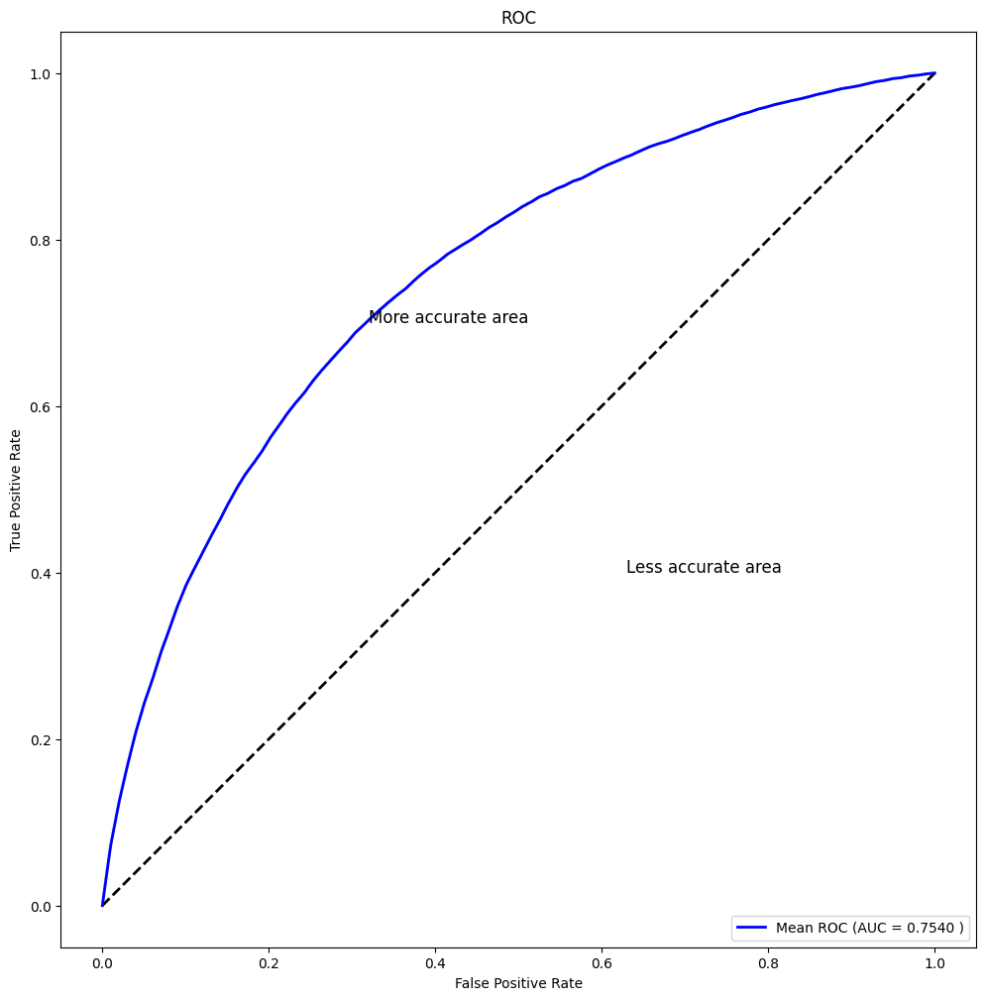

(849977,)
(849977,)


In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

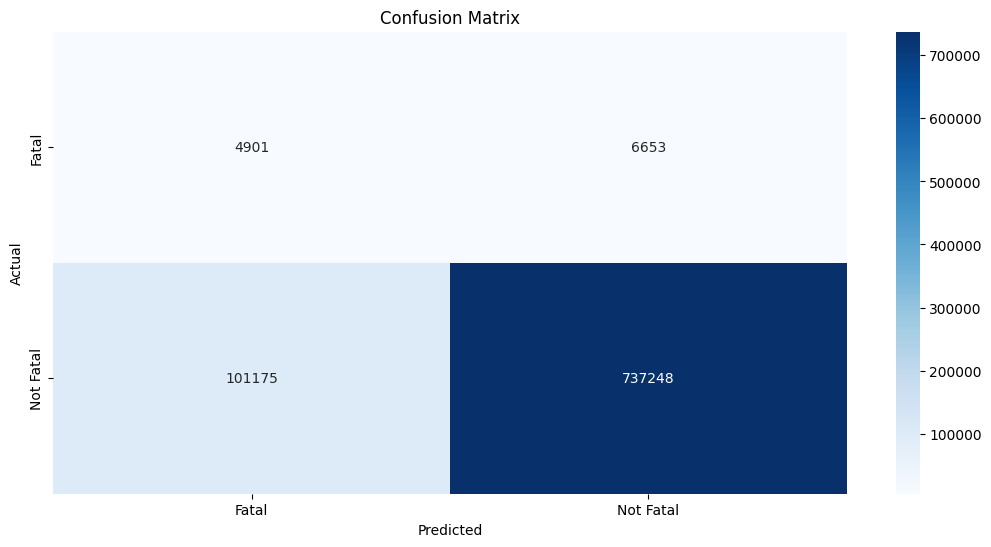

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

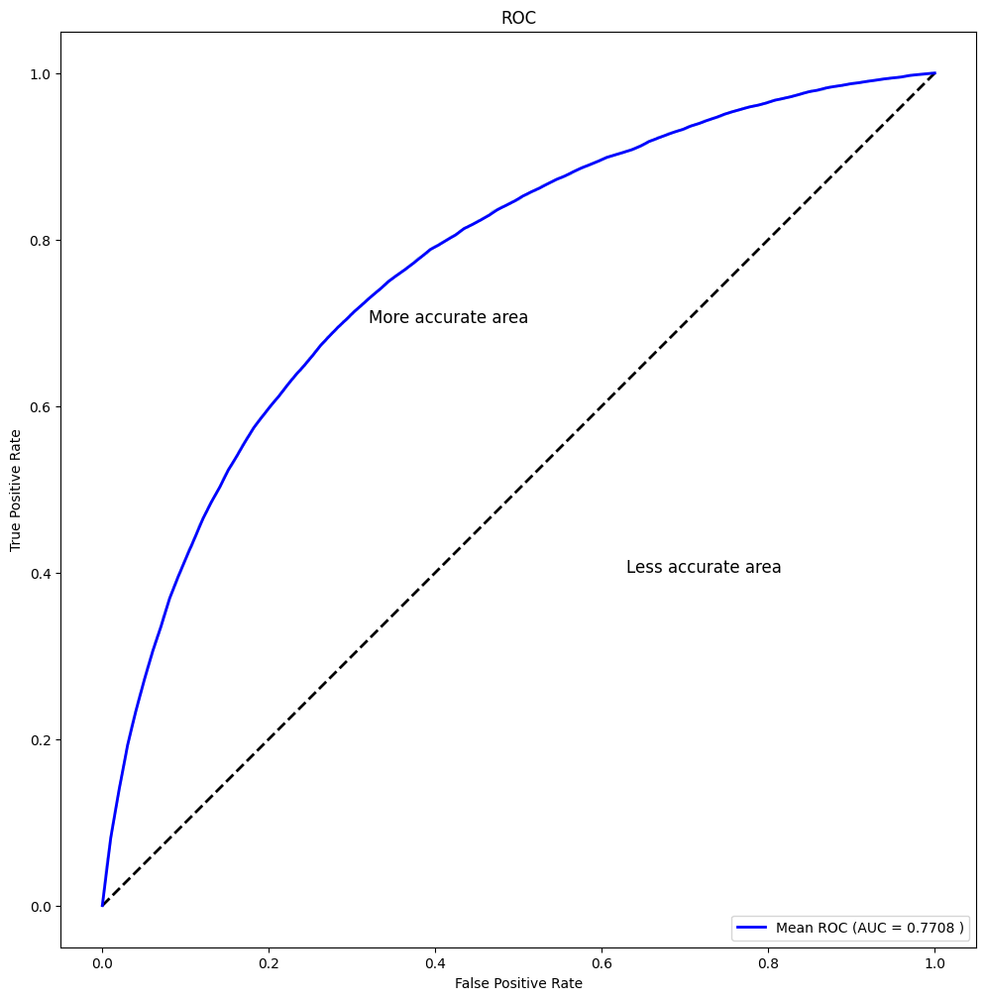

(679460,)
(679460,)


In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

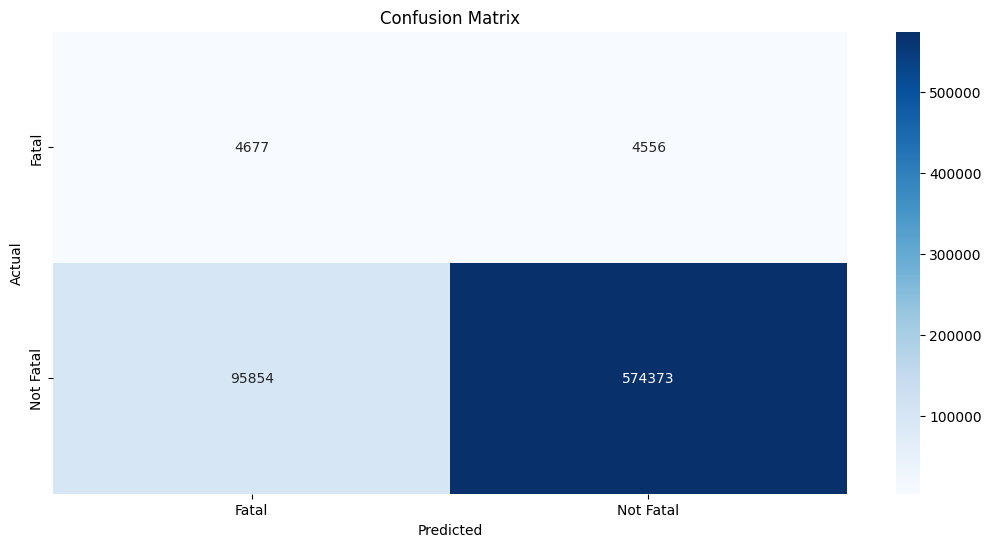

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

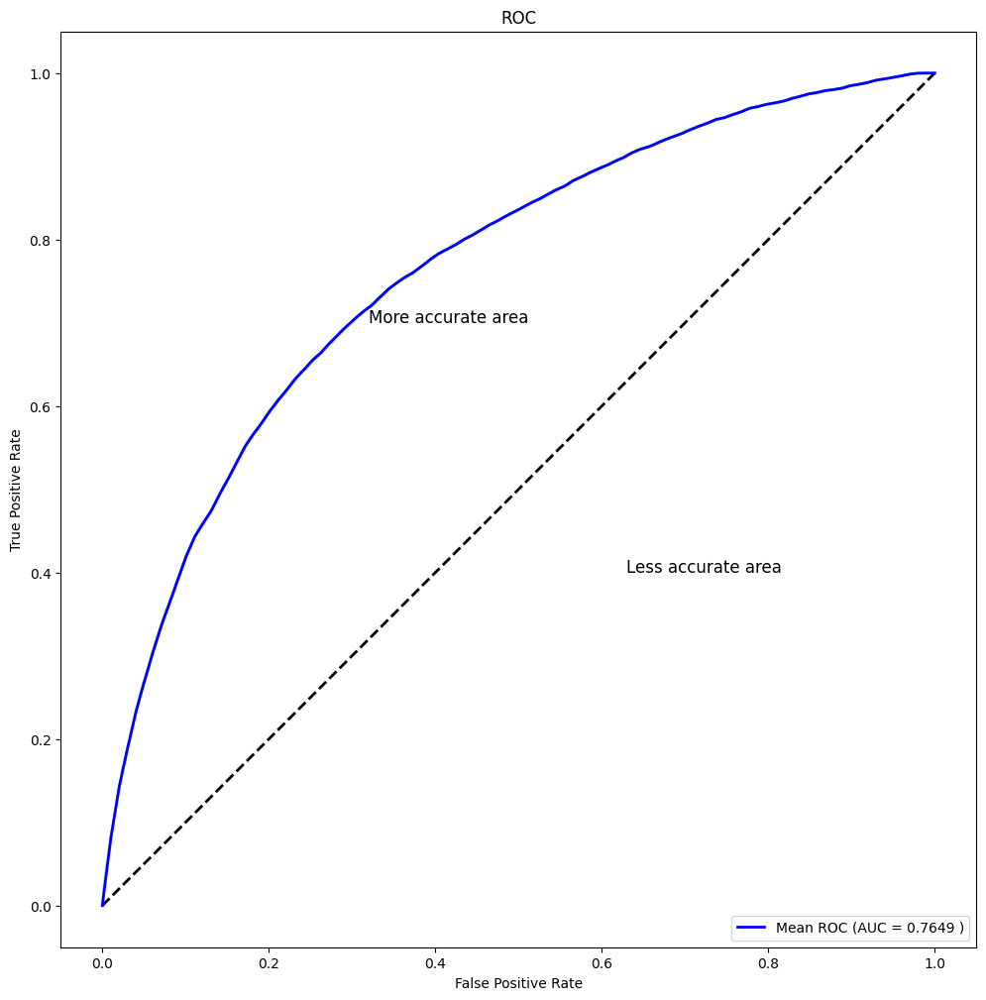

(466639,)
(466639,)


In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

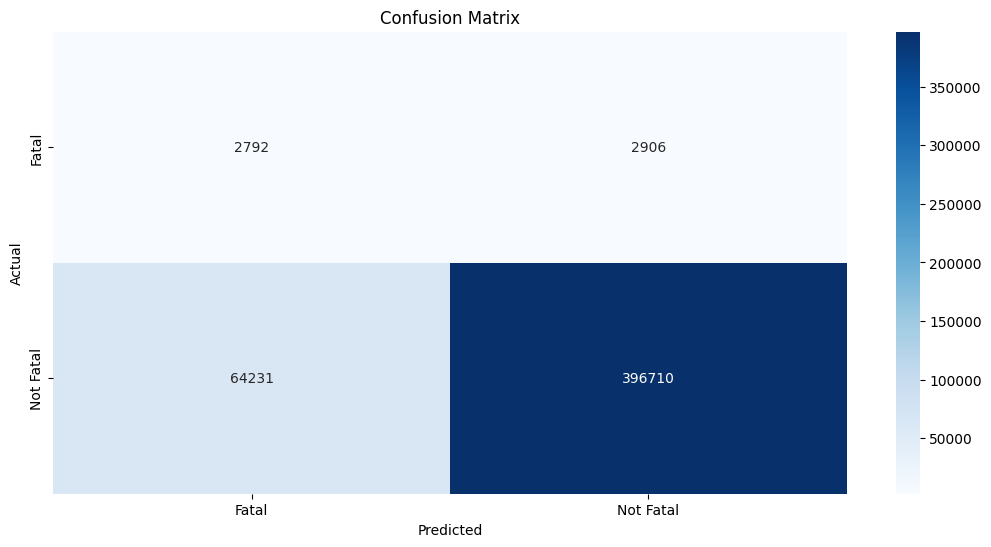

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

## MLP - (50,50)

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.neural_network import MLPClassifier
model = MLPClassifier(hidden_layer_sizes=(50,50),activation='relu',solver='adam',random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('scaler', scaler), ('model', model)]
pipeline = Pipeline(steps=steps)

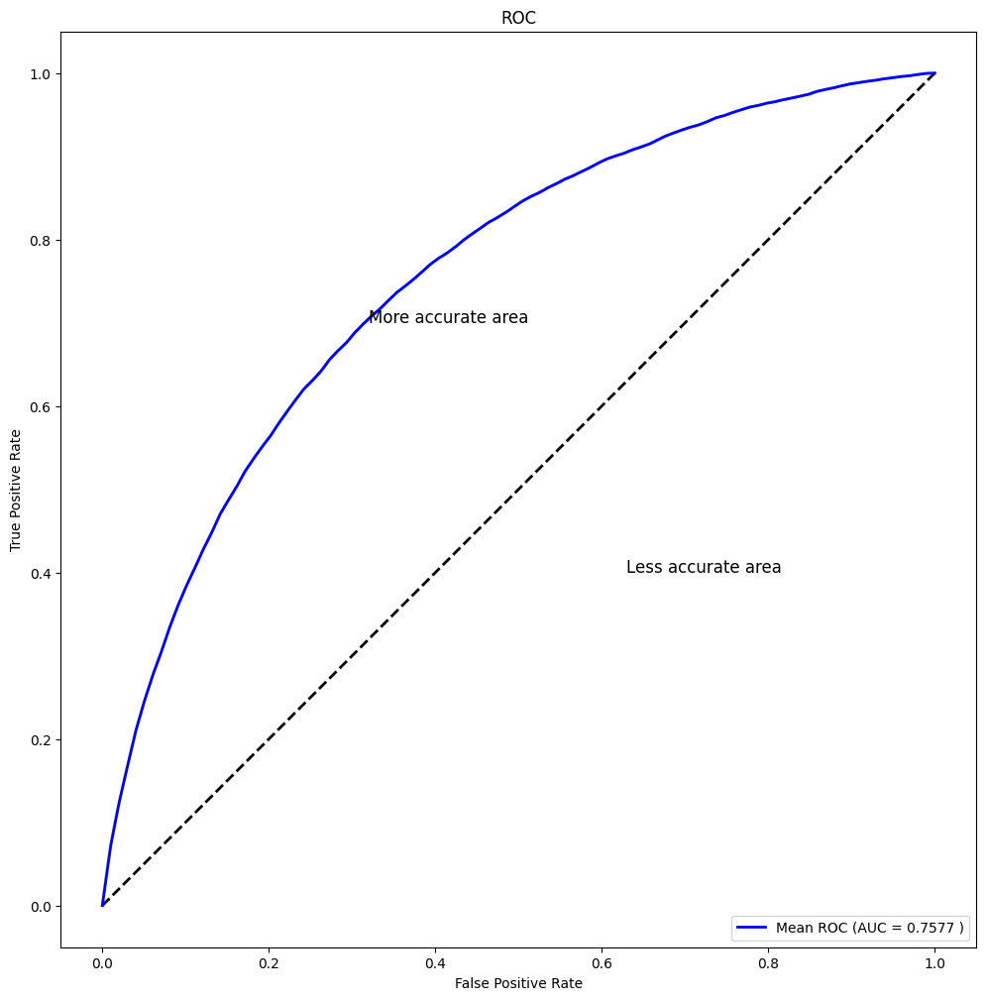

(849977,)
(849977,)


In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

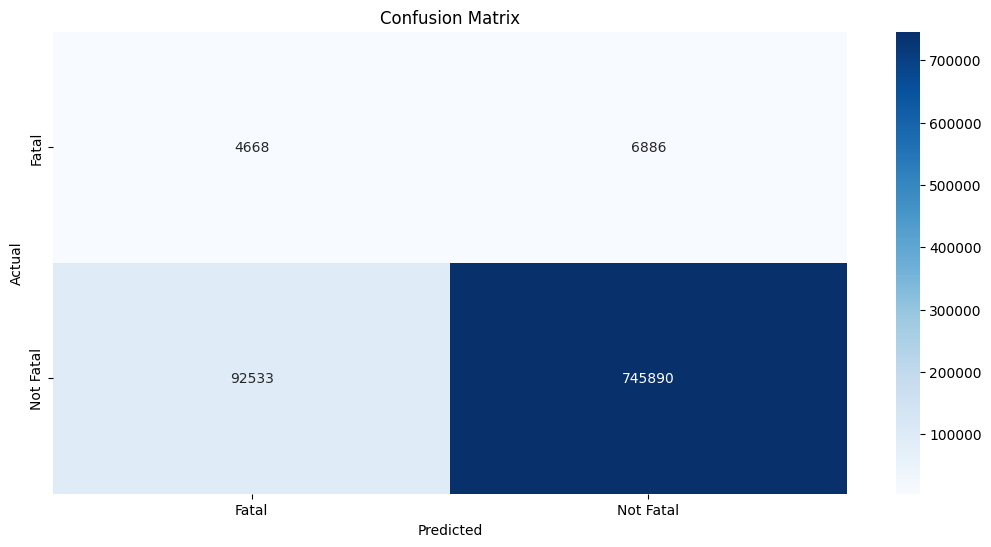

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


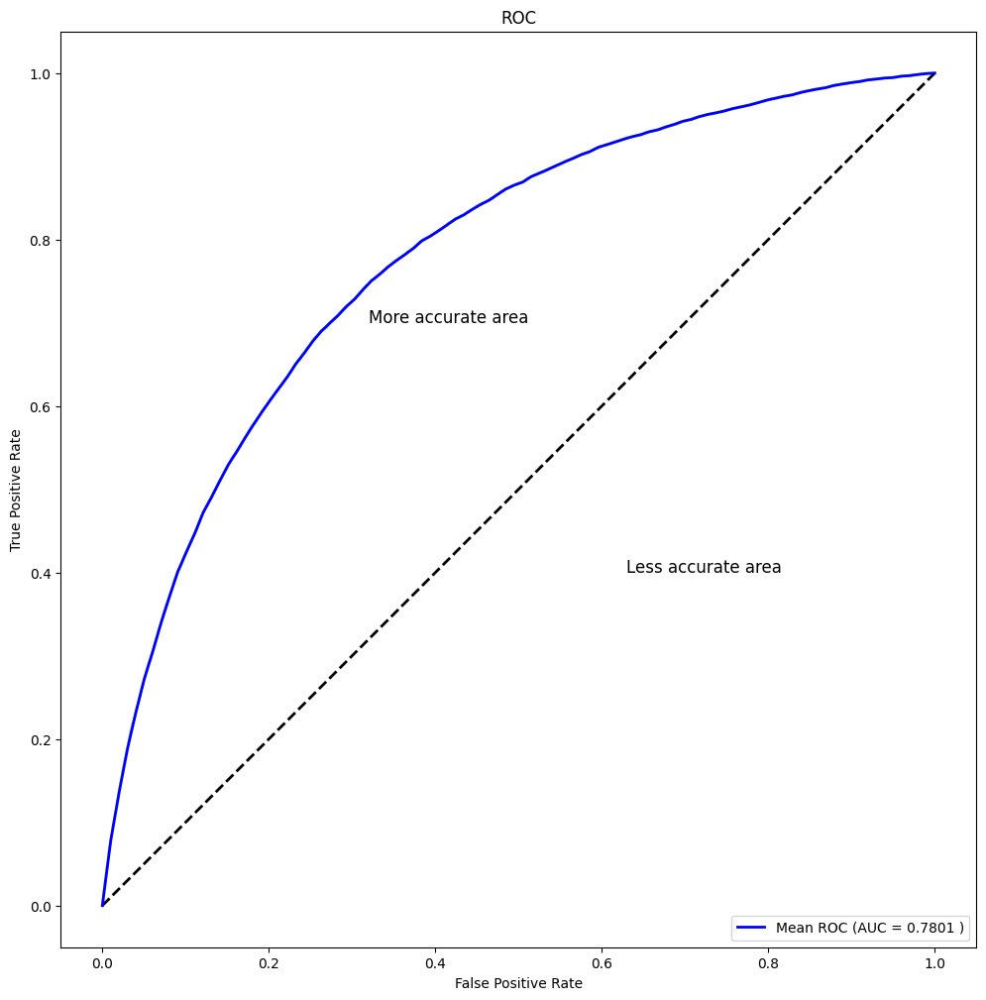

(679460,)
(679460,)


In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

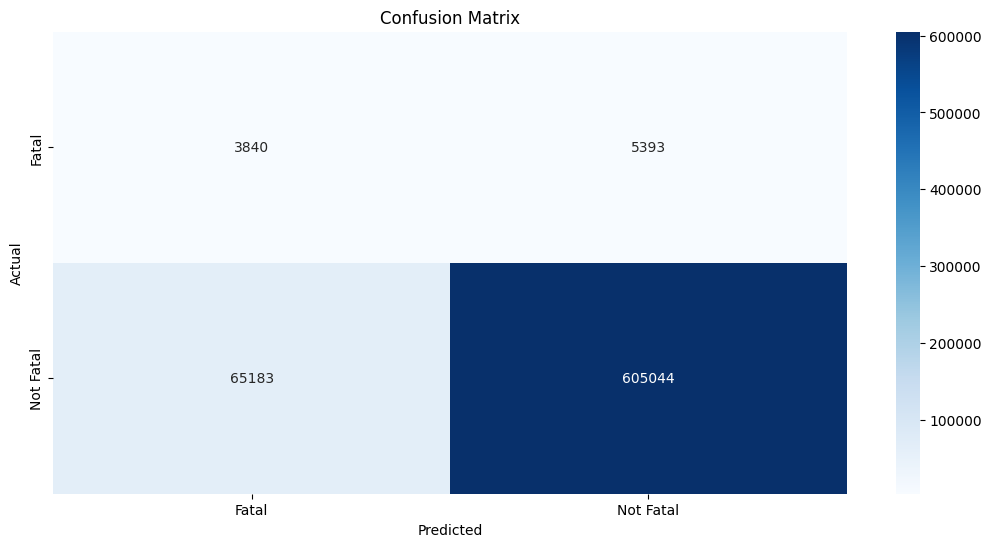

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


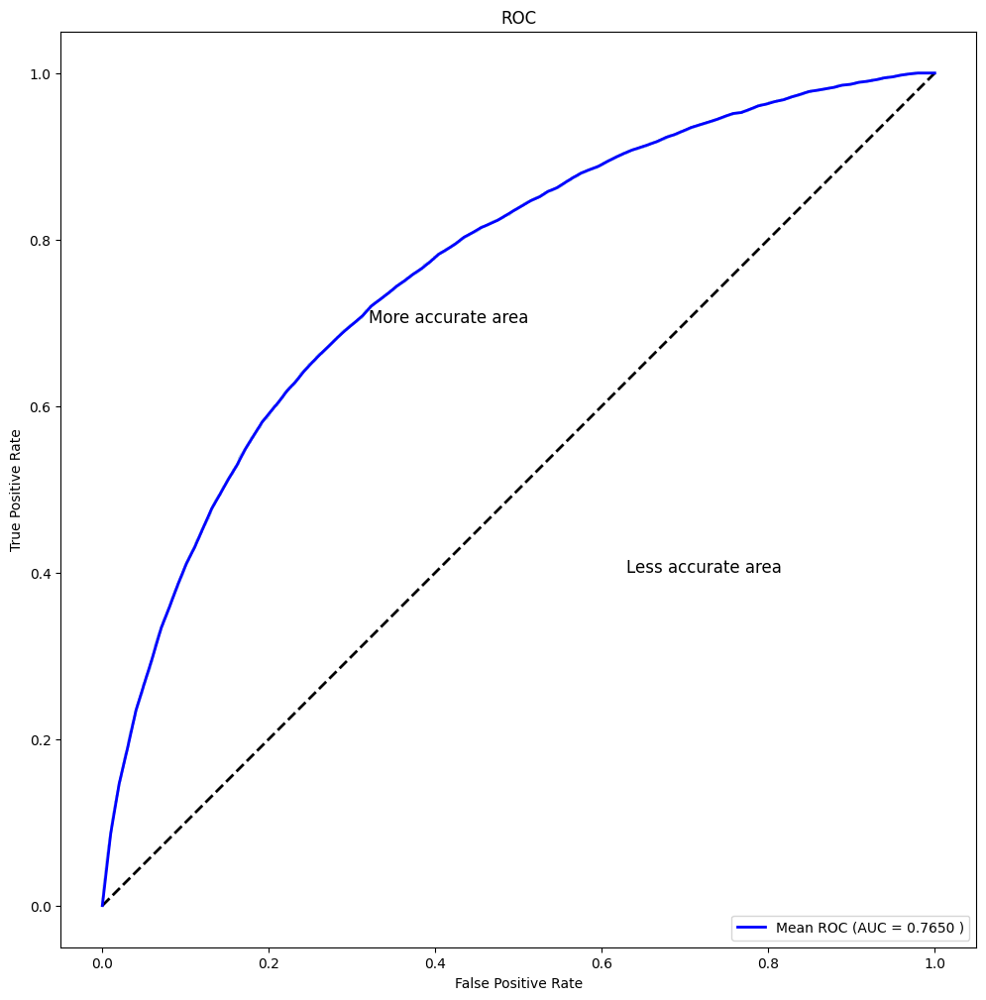

(466639,)
(466639,)


In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

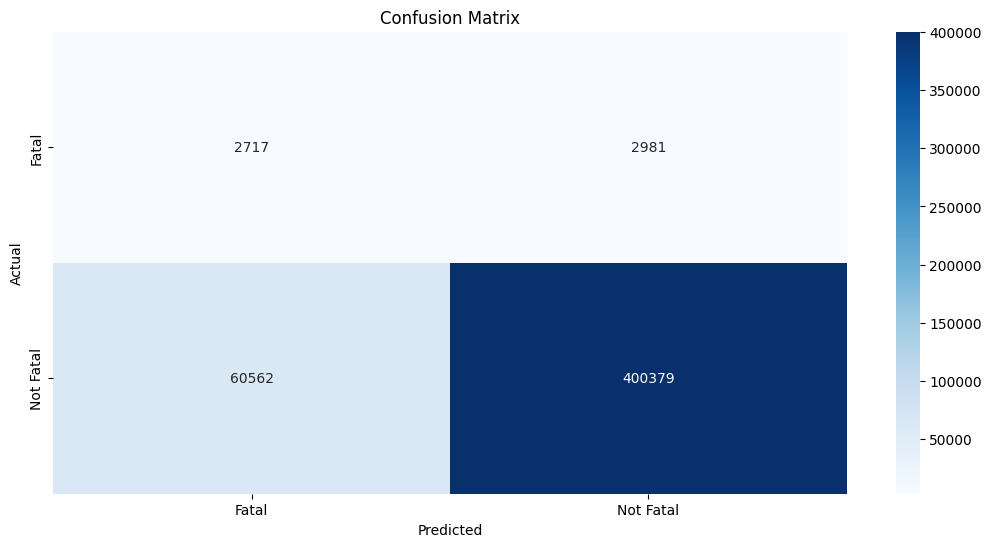

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

## MLP - (30,40,30)

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.neural_network import MLPClassifier
model = MLPClassifier(hidden_layer_sizes=(30,40,30),activation='relu',solver='adam',random_state=816)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('scaler', scaler), ('model', model)]
pipeline = Pipeline(steps=steps)

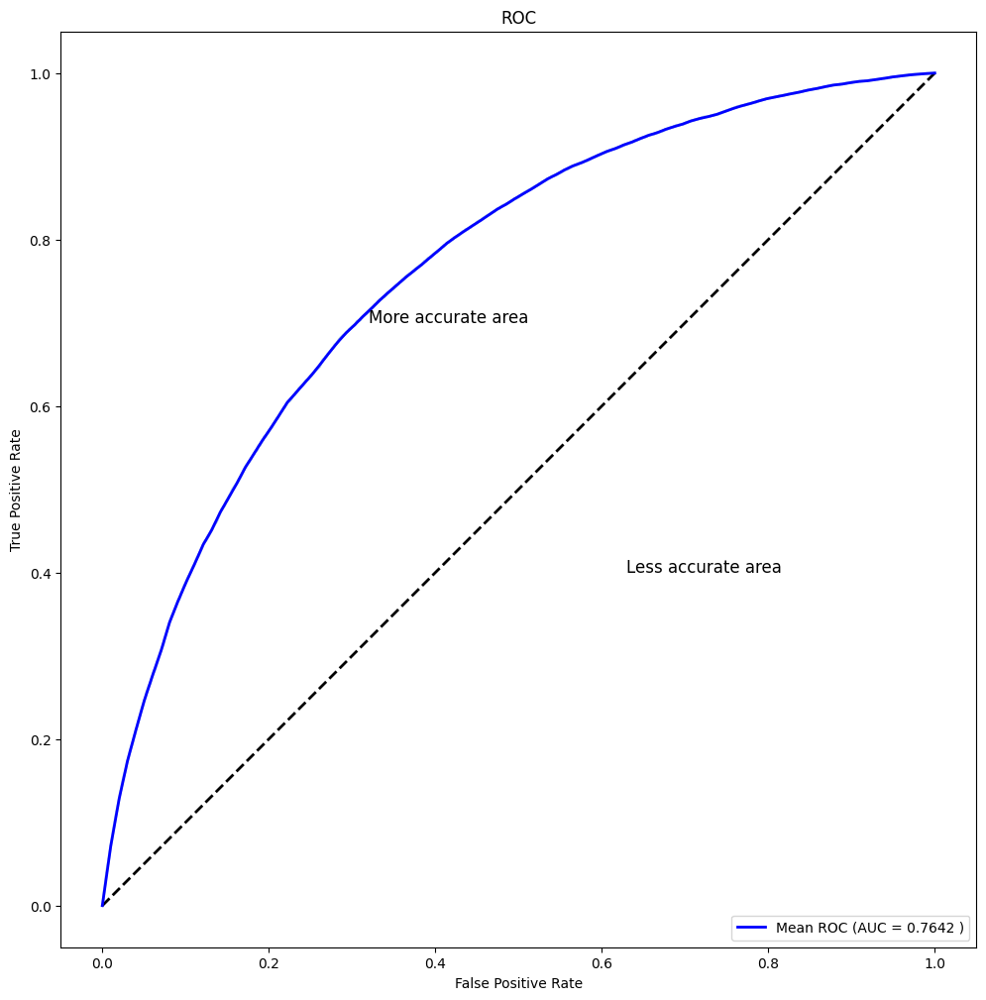

(849977,)
(849977,)


In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

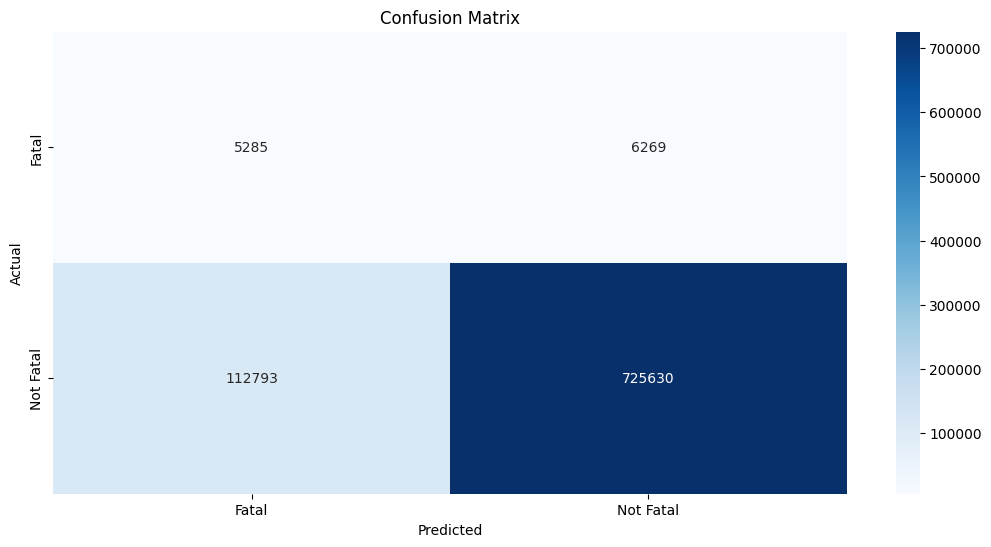

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


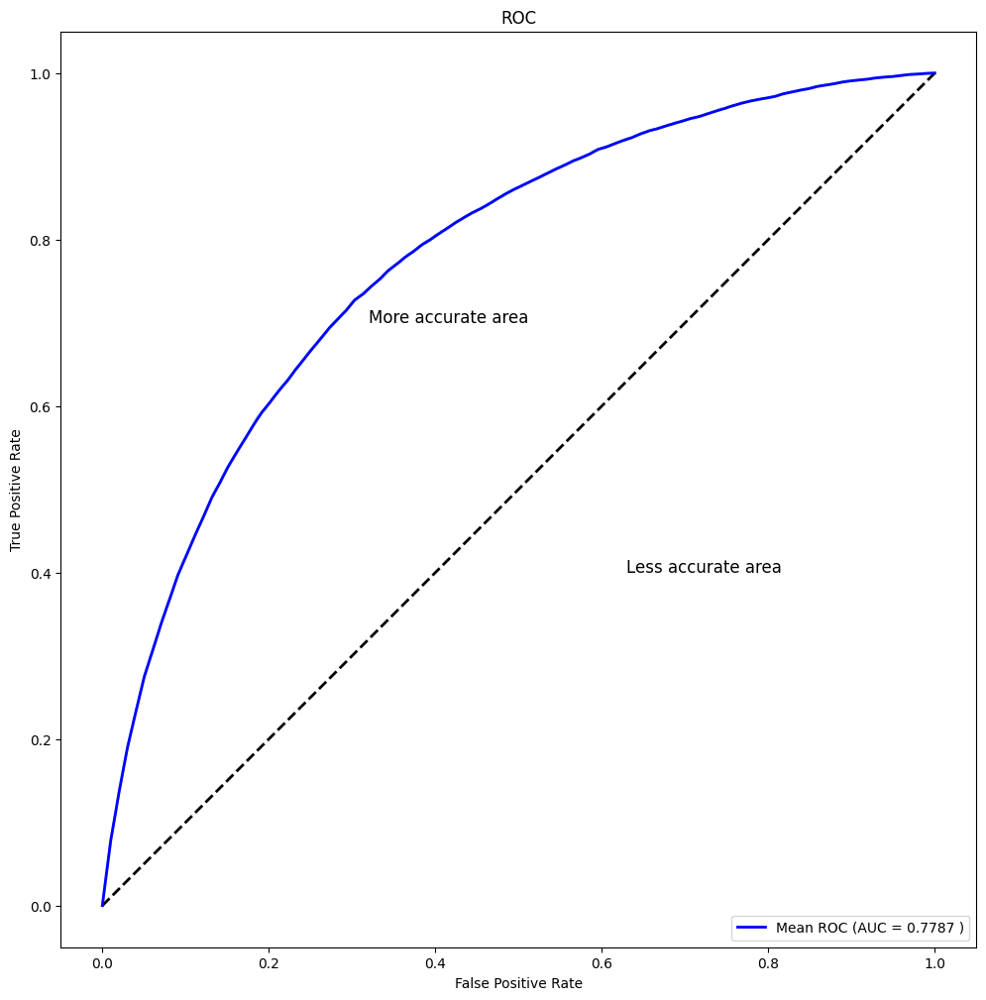

(679460,)
(679460,)


In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

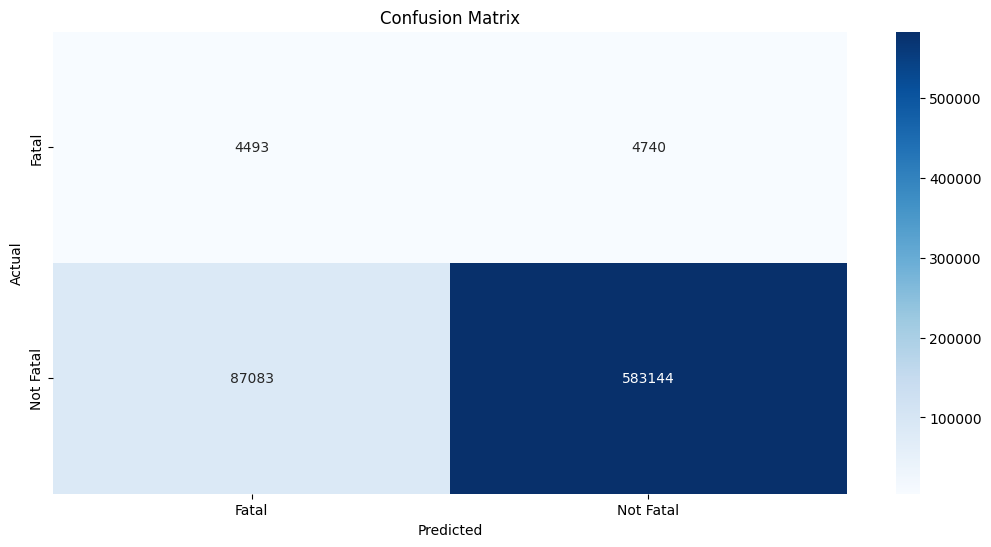

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


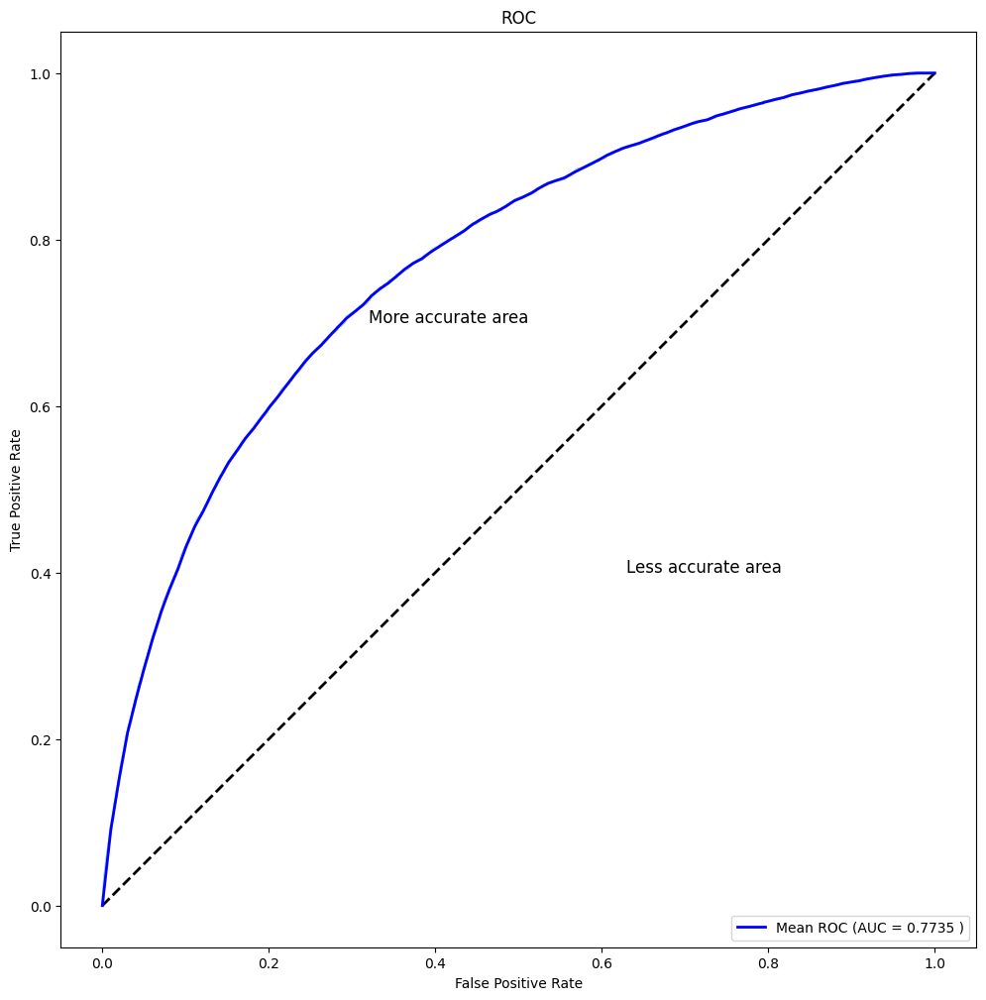

(466639,)
(466639,)


In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

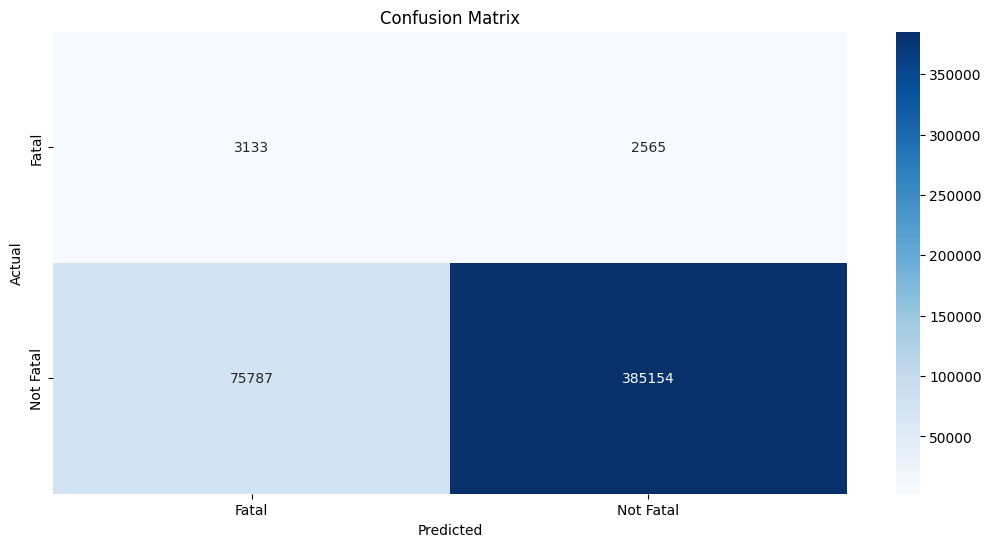

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

## kNN - k=5

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=5, weights='uniform', n_jobs=-1)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('scaler', scaler), ('model', model)]
pipeline = Pipeline(steps=steps)

In [ ]:
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

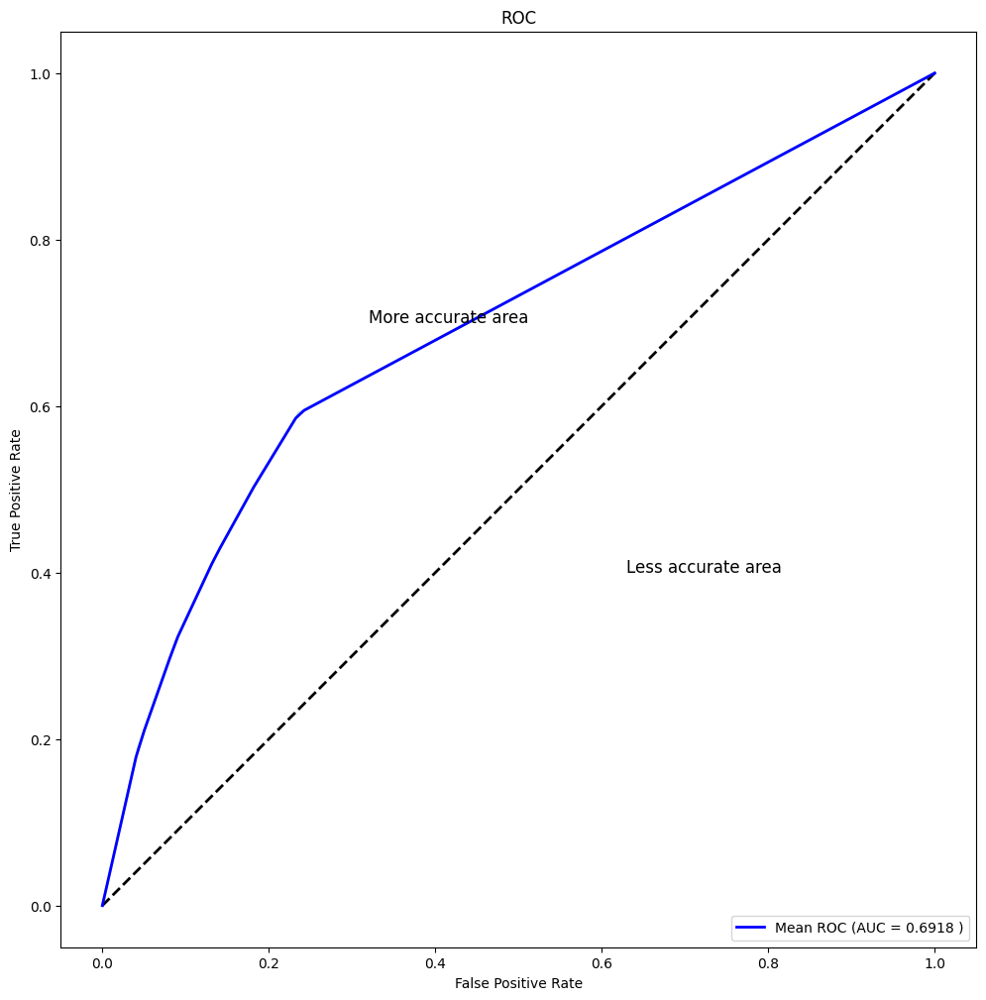

(679460,)
(679460,)


In [ ]:
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

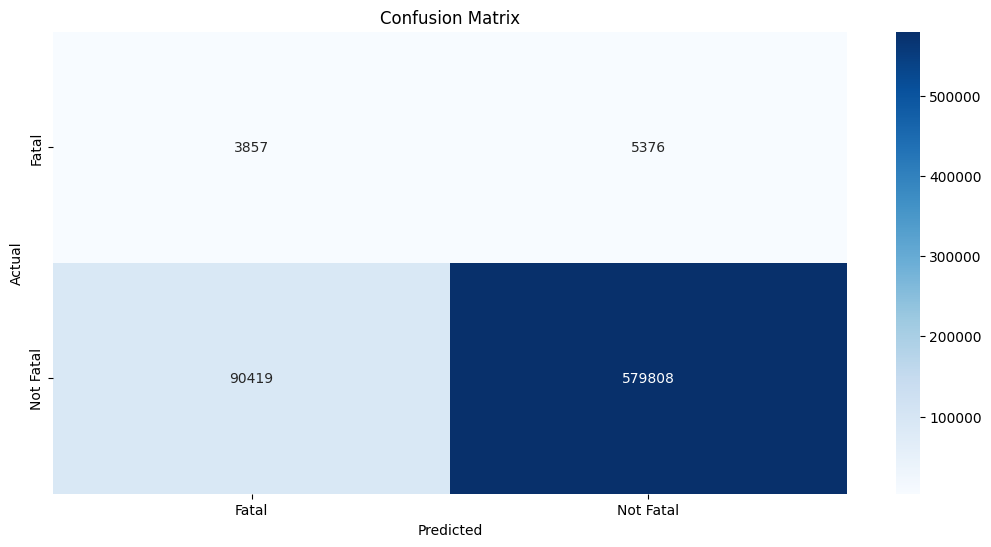

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

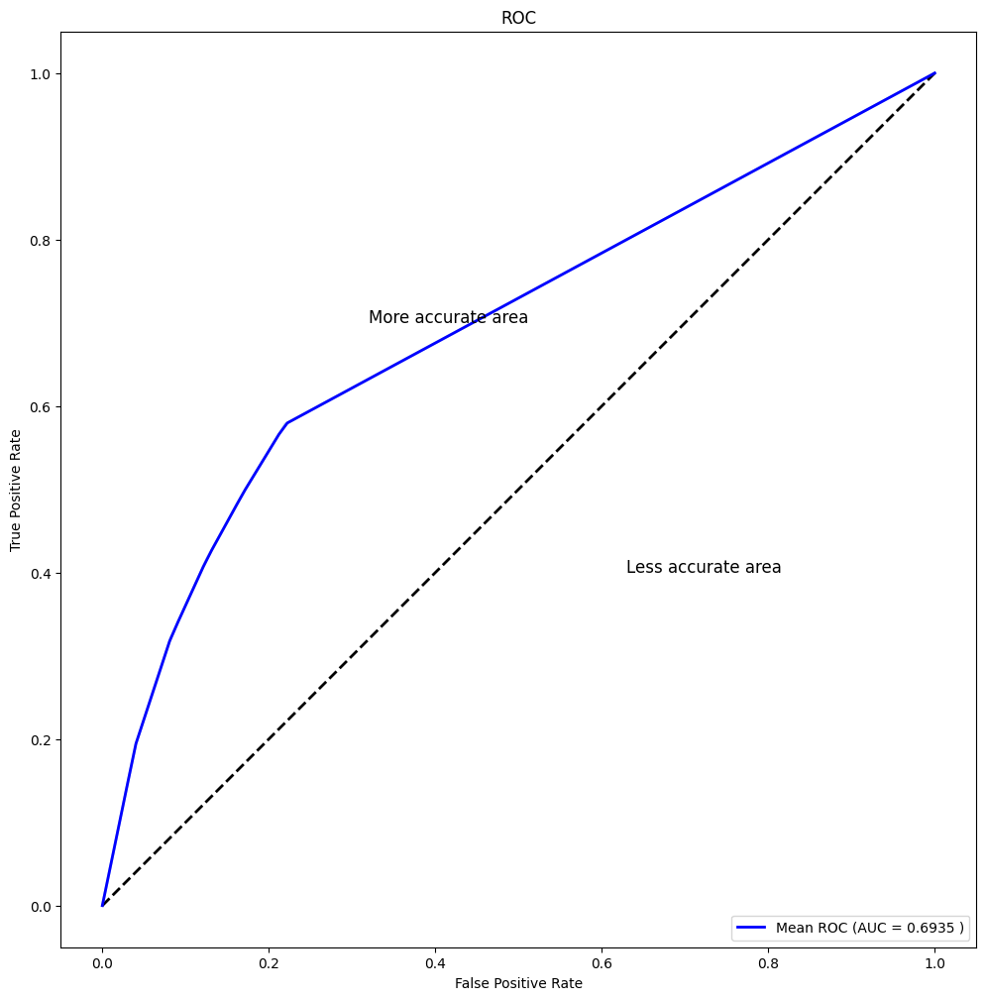

(466639,)
(466639,)


In [ ]:
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

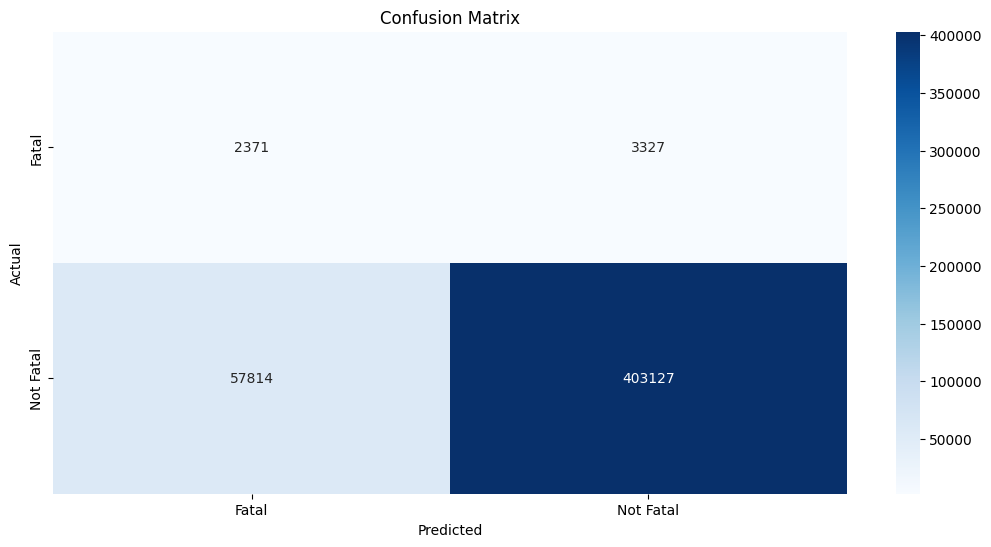

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

## Feature Importance for RF, n=150

In [ ]:
# define model and pipeline to set the over- and under-sampling of the training data,
# at each CV evaluation

from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=150, criterion='gini', random_state=816, n_jobs=-1)

from imblearn.over_sampling import SMOTE
# new minority/majority=0.5
over = SMOTE(sampling_strategy=0.5, k_neighbors=5, random_state=816)

from imblearn.under_sampling import RandomUnderSampler
# minority/new_majority = 0.9
under = RandomUnderSampler(sampling_strategy=0.9, random_state=816, replacement=False)

# The resulting Fatal:Non-fatal in TRAINING set is 47.4%:52.6%

from imblearn.pipeline import Pipeline
steps = [('over', over), ('under', under), ('model', model)]
pipeline = Pipeline(steps=steps)

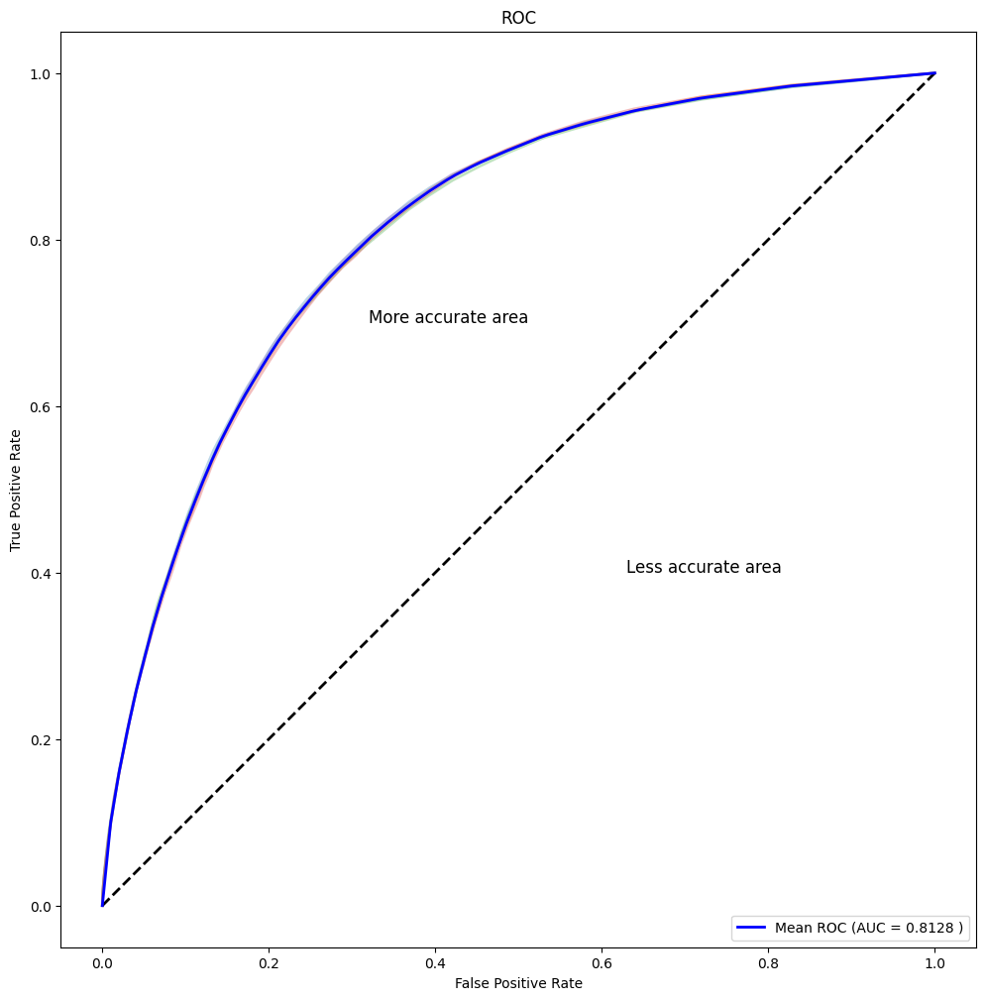

In [ ]:
# new run
X = X_vehacc3A_le
y = y_vehacc3A_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(4249887,)
(4249887,)


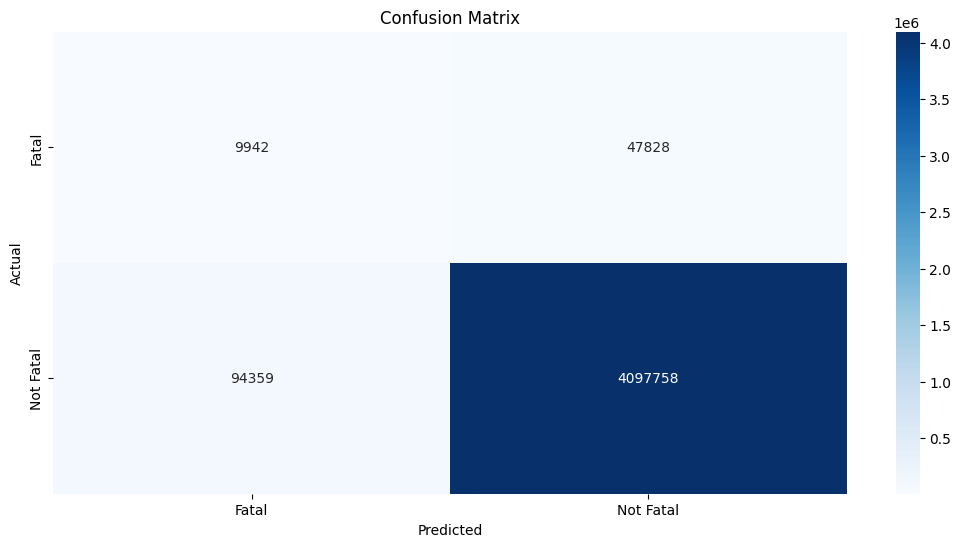

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

In [ ]:
import pickle

# save the model to disk
filename = '/content/drive/MyDrive/Colab Notebooks/Research Project/RF_3A_model.sav'
pickle.dump(model_fitted, open(filename, 'wb'))

# some time later...

# load the model from disk
#model_fitted = pickle.load(open(filename, 'rb'))

Feature: 0, Score: 0.06543
Feature: 1, Score: 0.05637
Feature: 2, Score: 0.05339
Feature: 3, Score: 0.07068
Feature: 4, Score: 0.04823
Feature: 5, Score: 0.01705
Feature: 6, Score: 0.06977
Feature: 7, Score: 0.04346
Feature: 8, Score: 0.04162
Feature: 9, Score: 0.03168
Feature: 10, Score: 0.01986
Feature: 11, Score: 0.01740
Feature: 12, Score: 0.08998
Feature: 13, Score: 0.02776
Feature: 14, Score: 0.06377
Feature: 15, Score: 0.02312
Feature: 16, Score: 0.01477
Feature: 17, Score: 0.04708
Feature: 18, Score: 0.01762
Feature: 19, Score: 0.05550
Feature: 20, Score: 0.03172
Feature: 21, Score: 0.01987
Feature: 22, Score: 0.04550
Feature: 23, Score: 0.02837


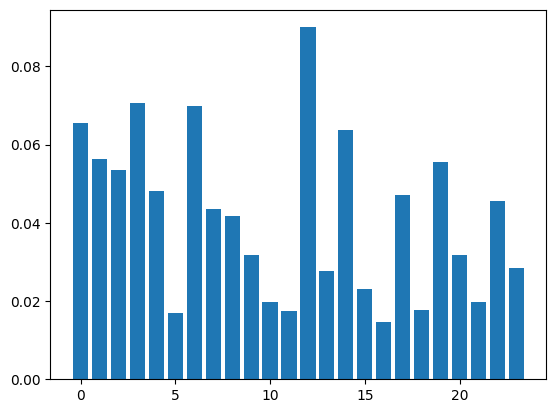

In [ ]:
import matplotlib.pyplot as plt

# get importance
#importances = model_.named_steps['model'].feature_importances_
importances = model_fitted.feature_importances_

# summarize feature importance
for i,v in enumerate(importances):
 print('Feature: %0d, Score: %.5f' % (i,v))

# plot feature importance
plt.bar([x for x in range(len(importances))], importances)
plt.show()

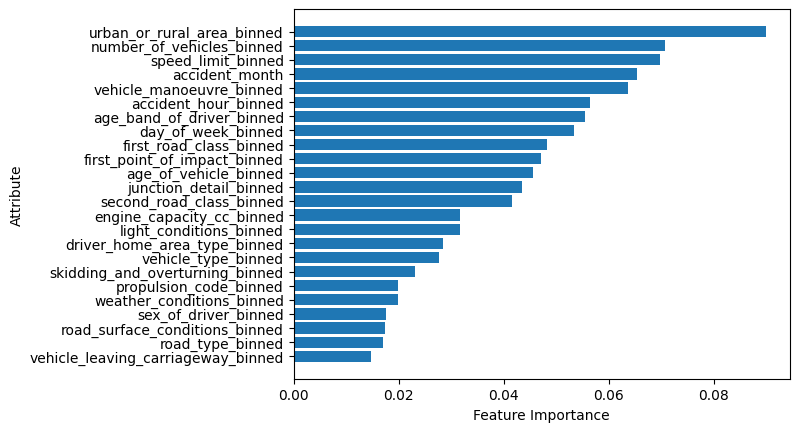

In [ ]:
# get importance from model_fitted
#importances = model_.named_steps['model'].feature_importances_
importances = model_fitted.feature_importances_

indices = np.argsort(importances)

fig, ax = plt.subplots()
ax.barh(range(len(importances)), importances[indices])
ax.set_yticks(range(len(importances)))
_ = ax.set_yticklabels(np.array(X_vehacc3A_le.columns)[indices])
plt.xlabel('Feature Importance'); plt.ylabel('Attribute')

plt.show()

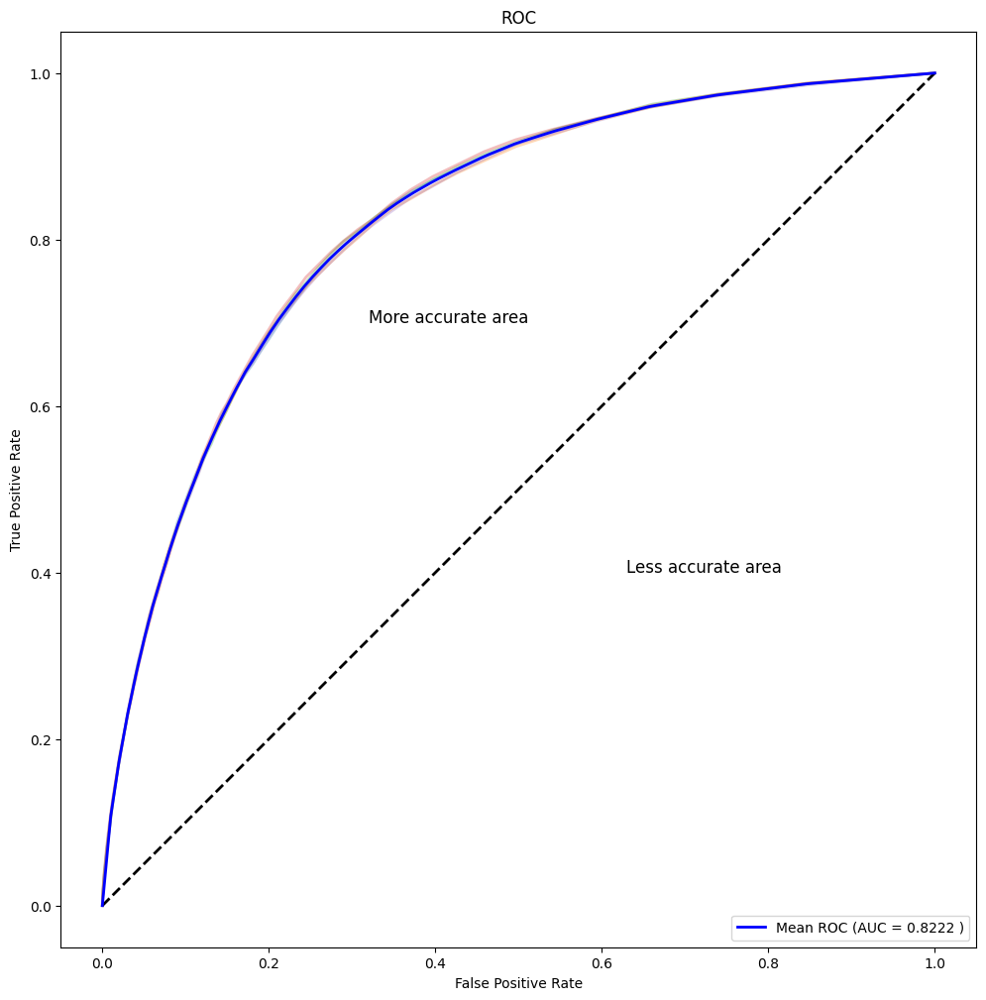

(3397300,)
(3397300,)


In [ ]:
# new run
X = X_vehacc3B_le
y = y_vehacc3B_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

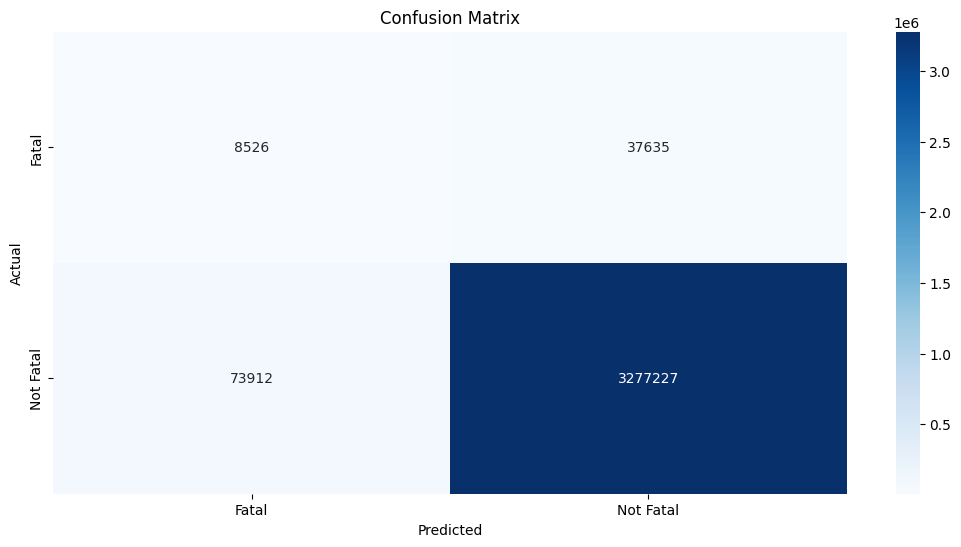

In [ ]:
plot_confusion_matrix(actual_classes, predicted_classes, [1,0])

In [ ]:
import pickle

# save the model to disk
filename = '/content/drive/MyDrive/Colab Notebooks/Research Project/RF_3B_model.sav'
pickle.dump(model_fitted, open(filename, 'wb'))

# some time later...

# load the model from disk
#model_fitted = pickle.load(open(filename, 'rb'))

Feature: 0, Score: 0.06217
Feature: 1, Score: 0.05634
Feature: 2, Score: 0.05177
Feature: 3, Score: 0.05944
Feature: 4, Score: 0.04997
Feature: 5, Score: 0.01737
Feature: 6, Score: 0.06635
Feature: 7, Score: 0.03669
Feature: 8, Score: 0.02803
Feature: 9, Score: 0.03420
Feature: 10, Score: 0.01899
Feature: 11, Score: 0.01773
Feature: 12, Score: 0.08875
Feature: 13, Score: 0.03134
Feature: 14, Score: 0.06717
Feature: 15, Score: 0.03368
Feature: 16, Score: 0.02372
Feature: 17, Score: 0.01502
Feature: 18, Score: 0.04884
Feature: 19, Score: 0.01864
Feature: 20, Score: 0.05507
Feature: 21, Score: 0.03513
Feature: 22, Score: 0.04661
Feature: 23, Score: 0.03696


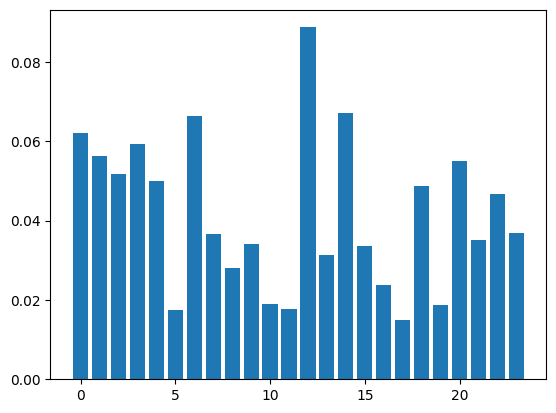

In [ ]:
import matplotlib.pyplot as plt

# get importance
#importances = model_.named_steps['model'].feature_importances_
importances = model_fitted.feature_importances_

# summarize feature importance
for i,v in enumerate(importances):
 print('Feature: %0d, Score: %.5f' % (i,v))

# plot feature importance
plt.bar([x for x in range(len(importances))], importances)
plt.show()

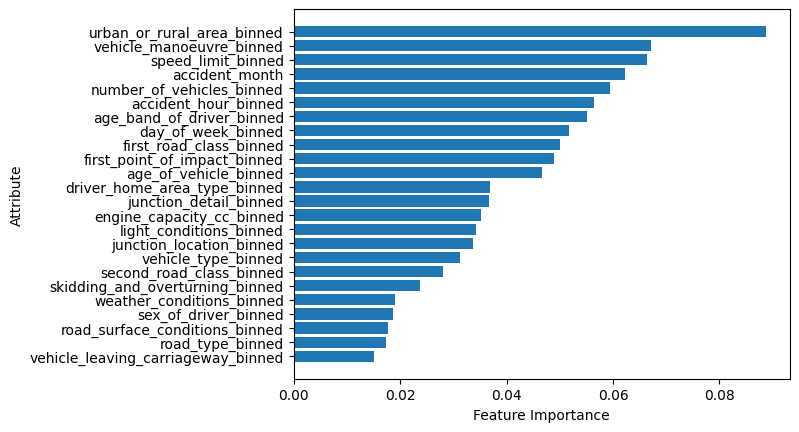

In [ ]:
# get importance from model_fitted
#importances = model_.named_steps['model'].feature_importances_
importances = model_fitted.feature_importances_

indices = np.argsort(importances)

fig, ax = plt.subplots()
ax.barh(range(len(importances)), importances[indices])
ax.set_yticks(range(len(importances)))
_ = ax.set_yticklabels(np.array(X_vehacc3B_le.columns)[indices])
plt.xlabel('Feature Importance'); plt.ylabel('Attribute')

plt.show()

In [ ]:
# new run
X = X_vehacc3C_le
y = y_vehacc3C_le

actual_classes, predicted_classes, model_fitted = cross_val_predict(pipeline, cv, X, y)

print(actual_classes.shape)
print(predicted_classes.shape)

(2333196,)
(2333196,)


In [ ]:
import pickle

# save the model to disk
filename = '/content/drive/MyDrive/Colab Notebooks/Research Project/RF_3C_model.sav'
#pickle.dump(model_fitted, open(filename, 'wb'))

# some time later...

# load the model from disk
model_fitted = pickle.load(open(filename, 'rb'))

Feature: 0, Score: 0.06147
Feature: 1, Score: 0.05746
Feature: 2, Score: 0.05123
Feature: 3, Score: 0.06456
Feature: 4, Score: 0.04318
Feature: 5, Score: 0.01833
Feature: 6, Score: 0.06773
Feature: 7, Score: 0.03097
Feature: 8, Score: 0.02797
Feature: 9, Score: 0.03268
Feature: 10, Score: 0.01800
Feature: 11, Score: 0.01684
Feature: 12, Score: 0.09613
Feature: 13, Score: 0.03380
Feature: 14, Score: 0.07204
Feature: 15, Score: 0.03447
Feature: 16, Score: 0.01859
Feature: 17, Score: 0.01472
Feature: 18, Score: 0.04984
Feature: 19, Score: 0.02016
Feature: 20, Score: 0.05760
Feature: 21, Score: 0.03609
Feature: 22, Score: 0.04628
Feature: 23, Score: 0.02985


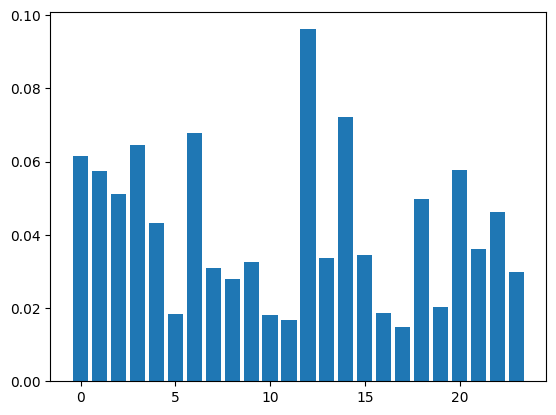

In [ ]:
import matplotlib.pyplot as plt

# get importance
#importances = model_.named_steps['model'].feature_importances_
importances = model_fitted.feature_importances_

# summarize feature importance
for i,v in enumerate(importances):
 print('Feature: %0d, Score: %.5f' % (i,v))

# plot feature importance
plt.bar([x for x in range(len(importances))], importances)
plt.show()

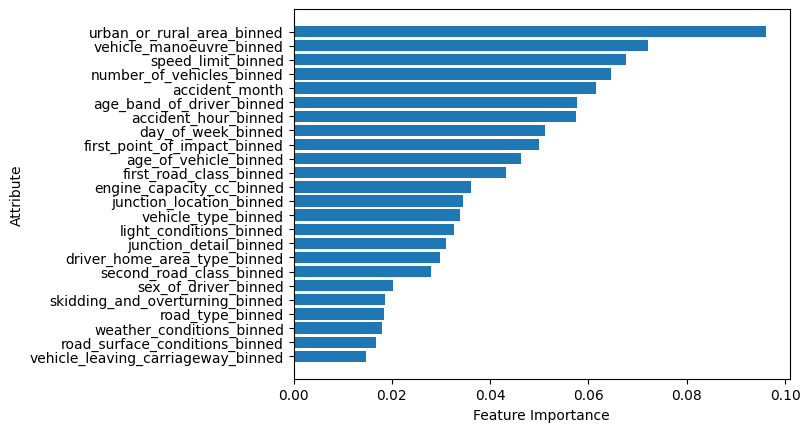

In [ ]:
# get importance from model_fitted
#importances = model_.named_steps['model'].feature_importances_
importances = model_fitted.feature_importances_

indices = np.argsort(importances)

fig, ax = plt.subplots()
ax.barh(range(len(importances)), importances[indices])
ax.set_yticks(range(len(importances)))
_ = ax.set_yticklabels(np.array(X_vehacc3C_le.columns)[indices])
plt.xlabel('Feature Importance'); plt.ylabel('Attribute')

plt.show()

## Label Mapping for df_vehacc3C

In [27]:
# Read csv files
df_vehacc3C = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Research Project/df_vehacc3C.csv", low_memory=False)

In [24]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

In [28]:
# Label mapping (example)
le.fit(df_vehacc3C['accident_month'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{1: 0, 2: 1, 3: 2, 4: 3, 5: 4, 6: 5, 7: 6, 8: 7, 9: 8, 10: 9, 11: 10, 12: 11}

In [29]:
# Label mapping (example)
le.fit(df_vehacc3C['accident_hour_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'0:00-1:59': 0,
 '10:00-11:59': 1,
 '12:00-13:59': 2,
 '14:00-15:59': 3,
 '16:00-17:59': 4,
 '18:00-19:59': 5,
 '20:00-21:59': 6,
 '22:00-23:59': 7,
 '2:00-3:59': 8,
 '4:00-5:59': 9,
 '6:00-7:59': 10,
 '8:00-9:59': 11}

In [30]:
# Label mapping (example)
le.fit(df_vehacc3C['day_of_week_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Fri': 0, 'Mon': 1, 'Sat': 2, 'Sun': 3, 'Thu': 4, 'Tue': 5, 'Wed': 6}

In [31]:
# Label mapping (example)
le.fit(df_vehacc3C['number_of_vehicles_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'1': 0, '2': 1, '3': 2, '4': 3, '5 and above': 4}

In [32]:
# Label mapping (example)
le.fit(df_vehacc3C['first_road_class_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'A': 0, 'B': 1, 'C': 2, 'Motorway or A(M)': 3, 'Unknown': 4}

In [33]:
# Label mapping (example)
le.fit(df_vehacc3C['road_type_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Dual carriageway': 0,
 'One-way street / Slip road': 1,
 'Roundabout': 2,
 'Single carriageway': 3,
 'Unknown': 4}

In [34]:
# Label mapping (example)
le.fit(df_vehacc3C['speed_limit_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'20': 0, '30': 1, '40': 2, '50': 3, '60': 4, '70': 5, 'Unknown': 6}

In [35]:
# Label mapping (example)
le.fit(df_vehacc3C['junction_detail_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Crossroads': 0,
 'More than 4 arms (not roundabout)': 1,
 'Not at junction or within 20m': 2,
 'Private drive or entrance': 3,
 'Roundabout': 4,
 'Slip road': 5,
 'T or staggered junction': 6,
 'Unknown': 7}

In [36]:
# Label mapping (example)
le.fit(df_vehacc3C['second_road_class_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'A': 0,
 'B': 1,
 'C': 2,
 'Motorway or A(M)': 3,
 'Not at junction or within 20m': 4,
 'Unknown': 5}

In [37]:
# Label mapping (example)
le.fit(df_vehacc3C['light_conditions_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Darkness - lights lit': 0,
 'Darkness - lights unlit': 1,
 'Darkness - no lighting': 2,
 'Daylight': 3,
 'Unknown': 4}

In [38]:
# Label mapping (example)
le.fit(df_vehacc3C['weather_conditions_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Fine no high winds': 0,
 'Fog or mist': 1,
 'High winds': 2,
 'Raining no high winds': 3,
 'Snowing no high winds': 4,
 'Unknown': 5}

In [39]:
# Label mapping (example)
le.fit(df_vehacc3C['road_surface_conditions_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Dry': 0,
 'Frost or ice': 1,
 'Others / Unknown': 2,
 'Snow': 3,
 'Wet or damp': 4}

In [40]:
# Label mapping (example)
le.fit(df_vehacc3C['urban_or_rural_area_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Rural': 0, 'Unknown': 1, 'Urban': 2}

In [41]:
# Label mapping (example)
le.fit(df_vehacc3C['vehicle_type_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Bus': 0,
 'Car': 1,
 'Goods vehicle': 2,
 'Motorcycle': 3,
 'Others / Unknown': 4,
 'Pedal cycle': 5,
 'Taxi': 6,
 'Van': 7}

In [42]:
# Label mapping (example)
le.fit(df_vehacc3C['vehicle_manoeuvre_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Changing lane to left': 0,
 'Changing lane to right': 1,
 'Going ahead left-hand bend': 2,
 'Going ahead other': 3,
 'Going ahead right-hand bend': 4,
 'Moving off': 5,
 'Overtaking - nearside': 6,
 'Overtaking moving vehicle - offside': 7,
 'Overtaking static vehicle - offside': 8,
 'Parked': 9,
 'Reversing': 10,
 'Slowing or stopping': 11,
 'Turning left': 12,
 'Turning right': 13,
 'U-turn': 14,
 'Unknown': 15,
 'Waiting to go - held up': 16,
 'Waiting to turn left': 17,
 'Waiting to turn right': 18}

In [43]:
# Label mapping (example)
le.fit(df_vehacc3C['junction_location_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Approaching junction or waiting/parked at junction approach': 0,
 'Cleared junction or waiting/parked at junction exit': 1,
 'Entering from slip road': 2,
 'Entering main road': 3,
 'Entering roundabout': 4,
 'Leaving main road': 5,
 'Leaving roundabout': 6,
 'Mid Junction - on roundabout or on main road': 7,
 'Not at junction or within 20m': 8,
 'Unknown': 9}

In [44]:
# Label mapping (example)
le.fit(df_vehacc3C['skidding_and_overturning_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Jackknifed': 0,
 'None': 1,
 'Overturned': 2,
 'Skidded': 3,
 'Skidded and overturned': 4,
 'Unknown': 5}

In [45]:
# Label mapping (example)
le.fit(df_vehacc3C['vehicle_leaving_carriageway_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Did not leave carriageway': 0,
 'Nearside': 1,
 'Offside': 2,
 'Straight ahead at junction': 3,
 'Unknown': 4}

In [46]:
# Label mapping (example)
le.fit(df_vehacc3C['first_point_of_impact_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Back': 0,
 'Did not impact': 1,
 'Front': 2,
 'Nearside': 3,
 'Offside': 4,
 'Unknown': 5}

In [47]:
# Label mapping (example)
le.fit(df_vehacc3C['sex_of_driver_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Female': 0, 'Male': 1, 'Unknown': 2}

In [48]:
# Label mapping (example)
le.fit(df_vehacc3C['age_band_of_driver_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'16-20': 0,
 '21-25': 1,
 '26-35': 2,
 '36-45': 3,
 '46-55': 4,
 '56-65': 5,
 '66-75': 6,
 '<15': 7,
 '>75': 8,
 'Unknown': 9}

In [49]:
# Label mapping (example)
le.fit(df_vehacc3C['engine_capacity_cc_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'0-500': 0,
 '1001-1500': 1,
 '1501-2000': 2,
 '501-1000': 3,
 '>2000': 4,
 'Unknown': 5}

In [50]:
# Label mapping (example)
le.fit(df_vehacc3C['age_of_vehicle_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'0-1': 0,
 '10-11': 1,
 '12-13': 2,
 '14 and above': 3,
 '2-3': 4,
 '4-5': 5,
 '6-7': 6,
 '8-9': 7,
 'Unknown': 8}

In [51]:
# Label mapping (example)
le.fit(df_vehacc3C['driver_home_area_type_binned'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
label_mapping

{'Rural': 0, 'Small town': 1, 'Unknown': 2, 'Urban area': 3}